In [3]:
#import the necessary libraries and setting the data viz styling

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import time
import warnings

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import (
    accuracy_score,
    precision_recall_fscore_support,
    confusion_matrix,
    roc_curve,
    auc,
)
from sklearn.preprocessing import label_binarize


from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier

%matplotlib inline
sns.set(style='whitegrid', palette='muted', font_scale=1.2)
warnings.filterwarnings('ignore')


In [4]:
def evaluate_model(model, X_test, y_test, model_name, dataset_name, split, notes, results_list):

    start_time = time.time()
    y_pred = model.predict(X_test)
    end_time = time.time()

    accuracy = accuracy_score(y_test, y_pred)
    precision, recall, fscore, _ = precision_recall_fscore_support(
        y_test, y_pred, average='weighted', zero_division=0
    )

    # Store results
    results_list.append({
        'Dataset': dataset_name,
        'Model': model_name,
        'Train-Test Split': f"{int(100-split*100)}:{int(split*100)}",
        'Tuning': 'Tuned' if 'Tuned' in notes else 'Default',
        'PCA': 'Yes' if 'PCA' in notes else 'No',
        'Accuracy': accuracy,
        'Precision': precision,
        'Recall': recall,
        'F1-Score': fscore,
        'Inference Time (s)': end_time - start_time
    })

    # general metrics results
    print(f"--- Results for {model_name} on {dataset_name} ({notes}) ---")
    print(f"Accuracy: {accuracy:.4f}")
    print(f"Precision (Weighted): {precision:.4f}")
    print(f"Recall (Weighted): {recall:.4f}")
    print(f"F1-Score (Weighted): {fscore:.4f}\n")

    # confusion Matrix
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title(f'Confusion Matrix: {model_name} on {dataset_name}\n({notes})')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()



def plot_roc_curves(models, X_test, y_test, dataset_name, notes):
    """Plots ROC curves for multiple models in a One-vs-Rest fashion."""
    n_classes = len(np.unique(y_test))
    y_test_bin = label_binarize(y_test, classes=np.arange(n_classes))

    plt.figure(figsize=(10, 8))

    for name, model in models.items():
        if hasattr(model, "predict_proba"):
            y_score = model.predict_proba(X_test)
        else: # For SVM with linear kernel without probability=True
            y_score = model.decision_function(X_test)
            # Binarize decision function output if it's 1D for binary case
            if len(y_score.shape) == 1:
                y_score = np.vstack((1-y_score, y_score)).T
            # For multi-class OvR, decision_function is already n_samples x n_classes
            if y_score.shape[1] != n_classes and n_classes > 2:
                 y_score = label_binarize(model.predict(X_test), classes=np.arange(n_classes))


        # Compute ROC curve and ROC area for each class
        fpr = dict()
        tpr = dict()
        roc_auc = dict()
        for i in range(n_classes):
            fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
            roc_auc[i] = auc(fpr[i], tpr[i])

        # Compute micro-average ROC curve and ROC area
        fpr["micro"], tpr["micro"], _ = roc_curve(y_test_bin.ravel(), y_score.ravel())
        roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

        plt.plot(fpr["micro"], tpr["micro"],
                 label=f'{name} (AUC = {roc_auc["micro"]:.2f})')

    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve (Micro-Average) on {dataset_name}\n({notes})')
    plt.legend(loc="lower right")
    plt.grid(True)
    plt.show()


In [5]:
#plot the loss curve for an mlp classifier

def plot_loss_curve(mlp_model, model_name, dataset_name, notes):

    plt.figure(figsize=(8, 5))
    plt.plot(mlp_model.loss_curve_)
    plt.title(f'Loss Curve: {model_name} on {dataset_name}\n({notes})')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.grid(True)
    plt.show()

In [6]:
#plot roc curves for different models as one vs the rest.

def plot_roc_curves(models, X_test, y_test, dataset_name, notes):

    n_classes = len(np.unique(y_test))
    y_test_bin = label_binarize(y_test, classes=np.arange(n_classes))

    plt.figure(figsize=(10, 8))

    for name, model in models.items():
        if hasattr(model, "predict_proba"):
            y_score = model.predict_proba(X_test)
        else: # For SVM with linear kernel without probability=True
            y_score = model.decision_function(X_test)
            # Binarize decision function output if it's 1D for binary case
            if len(y_score.shape) == 1:
                y_score = np.vstack((1-y_score, y_score)).T
            # For multi-class OvR, decision_function is already n_samples x n_classes
            if y_score.shape[1] != n_classes and n_classes > 2:
                 y_score = label_binarize(model.predict(X_test), classes=np.arange(n_classes))


        # Compute ROC curve and ROC area
        fpr = dict()
        tpr = dict()
        roc_auc = dict()
        for i in range(n_classes):
            fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
            roc_auc[i] = auc(fpr[i], tpr[i])

        # Compute micro-average ROC curve and ROC area
        fpr["micro"], tpr["micro"], _ = roc_curve(y_test_bin.ravel(), y_score.ravel())
        roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

        plt.plot(fpr["micro"], tpr["micro"],
                 label=f'{name} (AUC = {roc_auc["micro"]:.2f})')

    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve (Micro-Average) on {dataset_name}\n({notes})')
    plt.legend(loc="lower right")
    plt.grid(True)
    plt.show()

In [7]:
def analyze_results(df, dataset_name="Dataset"):
    # --- 1. Styled Table ---
    df_display = df.copy()
    df_display[['Accuracy','Precision','Recall','F1-Score']] = df_display[['Accuracy','Precision','Recall','F1-Score']].round(4)
    df_display[['Inference Time (s)']] = df_display[['Inference Time (s)']].round(4)

    print(f"\n Results Summary for {dataset_name}")
    display(df_display)

    # --- 2. PCA vs Non-PCA Comparison ---
    def plot_pca_comparison(df, dataset_name):
        metrics = ["Accuracy", "Precision", "Recall", "F1-Score"]

        df_pca = df.melt(
            id_vars=["PCA", "Tuning"],
            value_vars=metrics,
            var_name="Metric",
            value_name="Score"
        )

        plt.figure(figsize=(10,6))
        sns.barplot(data=df_pca, x="Metric", y="Score", hue="PCA", palette="Set2")
        plt.title(f"PCA vs Non-PCA Comparison on {dataset_name}", fontsize=14, fontweight="bold")
        plt.ylim(0.5, 1.05)
        plt.legend(title="PCA Applied")
        plt.grid(True, linestyle="--", alpha=0.5)
        plt.show()

    # --- 3. Metrics across Train-Test Splits ---
    def plot_metrics_clean(df, dataset_name):
        metrics = ["Accuracy", "Precision", "Recall", "F1-Score"]

        df_melted = df.melt(
            id_vars=["Train-Test Split", "Tuning", "PCA"],
            value_vars=metrics,
            var_name="Metric",
            value_name="Score"
        )

        fig, axes = plt.subplots(2, 2, figsize=(14, 10), sharex=True, sharey=True)
        axes = axes.flatten()

        for i, metric in enumerate(metrics):
            ax = axes[i]
            sns.lineplot(
                data=df_melted[df_melted["Metric"] == metric],
                x="Train-Test Split",
                y="Score",
                hue="Tuning",
                style="Tuning",
                markers=True,
                dashes=False,
                ci=None,
                ax=ax
            )
            ax.set_title(metric, fontsize=14, fontweight="bold")
            ax.set_ylim(0.85, 1.01)
            ax.set_ylabel("Score")
            ax.set_xlabel("Train-Test Split")
            ax.grid(True, linestyle="--", alpha=0.6)
            ax.legend(title="Tuning", loc="lower left")

        fig.suptitle(f"Performance Metrics across Train-Test Splits ({dataset_name})", fontsize=16, fontweight="bold")
        plt.tight_layout(rect=[0, 0, 1, 0.96])
        plt.show()

    # --- 4. Inference Time ---
    def plot_inference_time(df, dataset_name):
        plt.figure(figsize=(10,6))
        sns.barplot(
            data=df,
            x="Train-Test Split",
            y="Inference Time (s)",
            hue="Tuning",
            palette="coolwarm"
        )
        plt.title(f"Inference Time across Train-Test Splits ({dataset_name})", fontsize=14, fontweight="bold")
        plt.ylabel("Time (s)")
        plt.grid(True, linestyle="--", alpha=0.5)
        plt.show()

    # Call all plots
    plot_pca_comparison(df, dataset_name)
    plot_metrics_clean(df, dataset_name)
    plot_inference_time(df, dataset_name)


In [8]:
from sklearn.datasets import load_wine
wine_dataset = load_wine()

Experiments for wine dataset on Original Features ---

 running not tuned models for 50:50 Split...
--- Results for SVM (Linear) on WINE (50:50 Split, Default) ---
Accuracy: 0.9551
Precision (Weighted): 0.9558
Recall (Weighted): 0.9551
F1-Score (Weighted): 0.9548



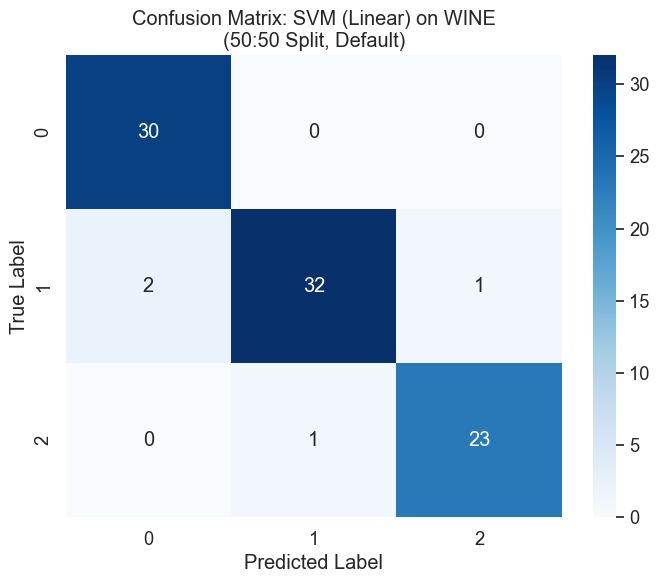

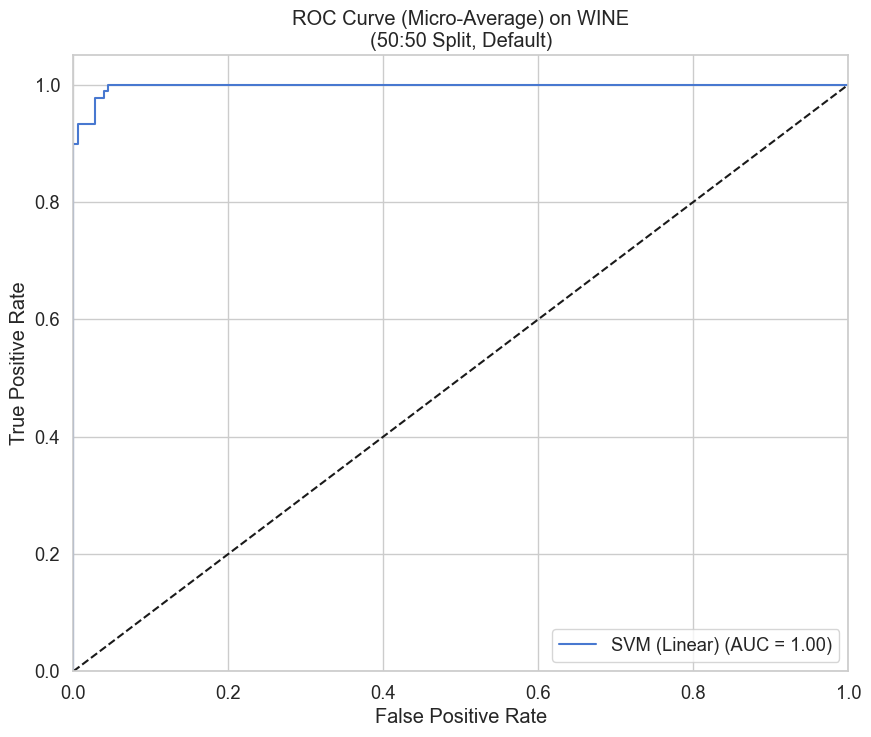


tuned model for 50:50 Split...
Tuning SVM (Linear)...


In [ ]:
splits = [0.5, 0.4, 0.3, 0.2]
def svm_linear_complete(dataset, dataset_name):

    X, y = wine_dataset.data, wine_dataset.target
    results_list = []

    classifiers = {
        "SVM (Linear)": SVC(kernel='linear', probability=True, random_state=42),

    }

    param_grids = {
        "SVM (Linear)": {'C': [0.1, 1, 10]},
    }

    print(f"Experiments for wine dataset on Original Features ---")
    for split in splits:
        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=split, random_state=42, stratify=y
        )

        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)

        split_note = f"{int(100-split*100)}:{int(split*100)} Split"

        # without tuning
        print(f"\n running not tuned models for {split_note}...")
        trained_models_default = {}
        for name, model in classifiers.items():
            model.fit(X_train_scaled, y_train)
            trained_models_default[name] = model
            evaluate_model(model, X_test_scaled, y_test, name, dataset_name, split, f"{split_note}, Default", results_list)
            if name == "MLP":
                plot_loss_curve(model, name, dataset_name, f"{split_note}, Default")
        plot_roc_curves(trained_models_default, X_test_scaled, y_test, dataset_name, f"{split_note}, Default")

        # with tuning
        print(f"\ntuned model for {split_note}...")
        trained_models_tuned = {}
        for name, model in classifiers.items():
            print(f"Tuning {name}...")
            grid_search = GridSearchCV(model, param_grids[name], cv=5, n_jobs=-1, scoring='accuracy')
            grid_search.fit(X_train_scaled, y_train)
            best_model = grid_search.best_estimator_
            trained_models_tuned[name] = best_model
            print(f"best parameters for {name}: {grid_search.best_params_}")
            evaluate_model(best_model, X_test_scaled, y_test, name, dataset_name, split, f"{split_note}, Tuned", results_list)
        plot_roc_curves(trained_models_tuned, X_test_scaled, y_test, dataset_name, f"{split_note}, Tuned")

    # WITH PCA
    print(f"\n--- Starting for wine dataset with PCA ---")


    for split in splits:
      X_train, X_test, y_train, y_test = train_test_split(
          X, y, test_size=split, random_state=42, stratify=y
      )

      scaler = StandardScaler()
      X_train_scaled = scaler.fit_transform(X_train)
      X_test_scaled = scaler.transform(X_test)

      # pca with 95% variance
      pca = PCA(n_components=0.95)
      X_train_pca = pca.fit_transform(X_train_scaled)
      X_test_pca = pca.transform(X_test_scaled)
      print(f"Original features: {X_train.shape[1]}, PCA features: {X_train_pca.shape[1]}")

      pca_note = f"80:20 Split, PCA"

      # Model with tuning on PCA
      print(f"\nrunning tuned model for {pca_note}...")
      trained_models_pca = {}
      for name, model in classifiers.items():
          print(f"tuning {name} with PCA features...")
          grid_search = GridSearchCV(model, param_grids[name], cv=5, n_jobs=-1, scoring='accuracy')
          grid_search.fit(X_train_pca, y_train)
          best_model = grid_search.best_estimator_
          trained_models_pca[name] = best_model
          print(f"best parameters for {name} on PCA data: {grid_search.best_params_}")
          evaluate_model(best_model, X_test_pca, y_test, name, dataset_name, split, f"{pca_note}, Tuned", results_list)
      plot_roc_curves(trained_models_pca, X_test_pca, y_test, dataset_name, f"{pca_note}, Tuned")

    return pd.DataFrame(results_list)
svm_linear_df = svm_linear_complete(wine_dataset,"WINE")


 Results Summary for SVM (Linear) on WINE


,Dataset,Model,Train-Test Split,Tuning,PCA,Accuracy,Precision,Recall,F1-Score,Inference Time (s)
0,WINE,SVM (Linear),50:50,Default,No,0.9551,0.9558,0.9551,0.9548,0.0010
1,WINE,SVM (Linear),50:50,Tuned,No,0.9775,0.9783,0.9775,0.9774,0.0008
2,WINE,SVM (Linear),60:40,Default,No,0.9583,0.9600,0.9583,0.9583,0.0008
3,WINE,SVM (Linear),60:40,Tuned,No,0.9861,0.9867,0.9861,0.9861,0.0008
4,WINE,SVM (Linear),70:30,Default,No,0.9630,0.9639,0.9630,0.9629,0.0009
5,WINE,SVM (Linear),70:30,Tuned,No,0.9630,0.9651,0.9630,0.9626,0.0008
6,WINE,SVM (Linear),80:20,Default,No,0.9444,0.9466,0.9444,0.9443,0.0008
7,WINE,SVM (Linear),80:20,Tuned,No,0.9722,0.9741,0.9722,0.9720,0.0012
8,WINE,SVM (Linear),50:50,Tuned,Yes,0.9775,0.9783,0.9775,0.9774,0.0008
9,WINE,SVM (Linear),60:40,Tuned,Yes,0.9583,0.9600,0.9583,0.9583,0.0012


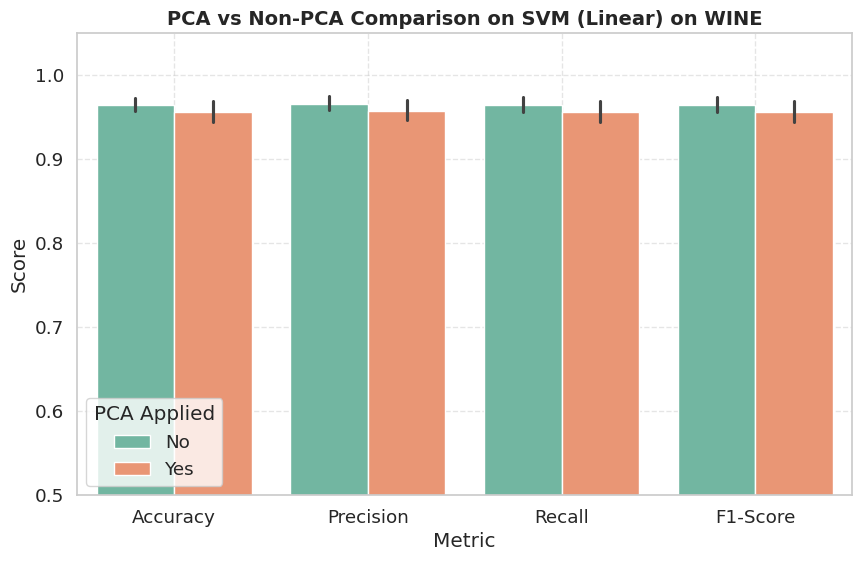

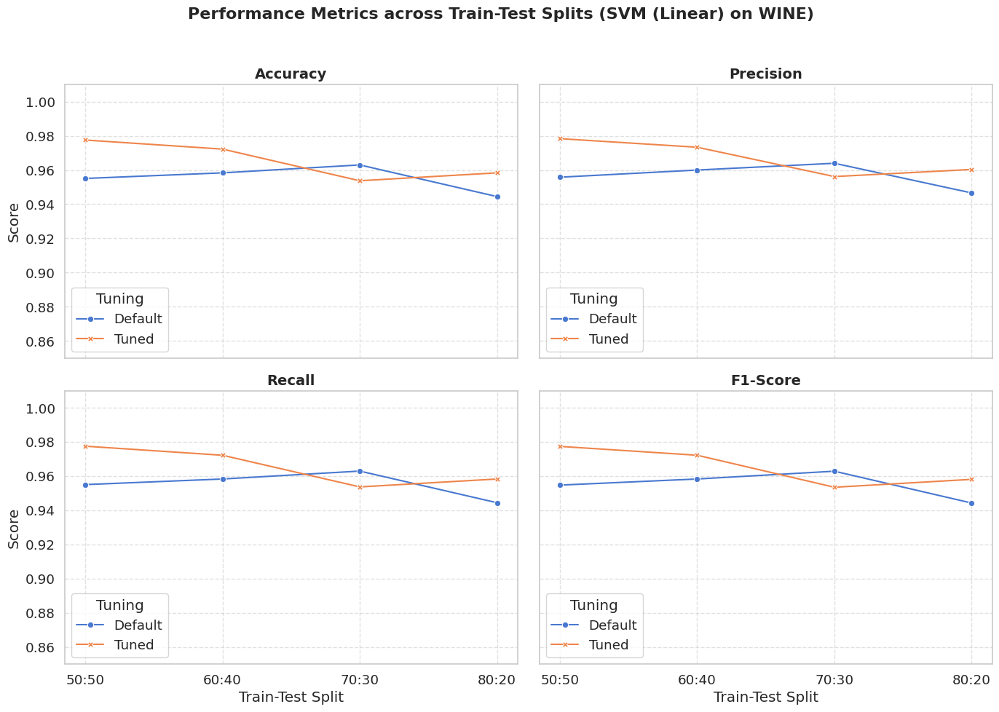

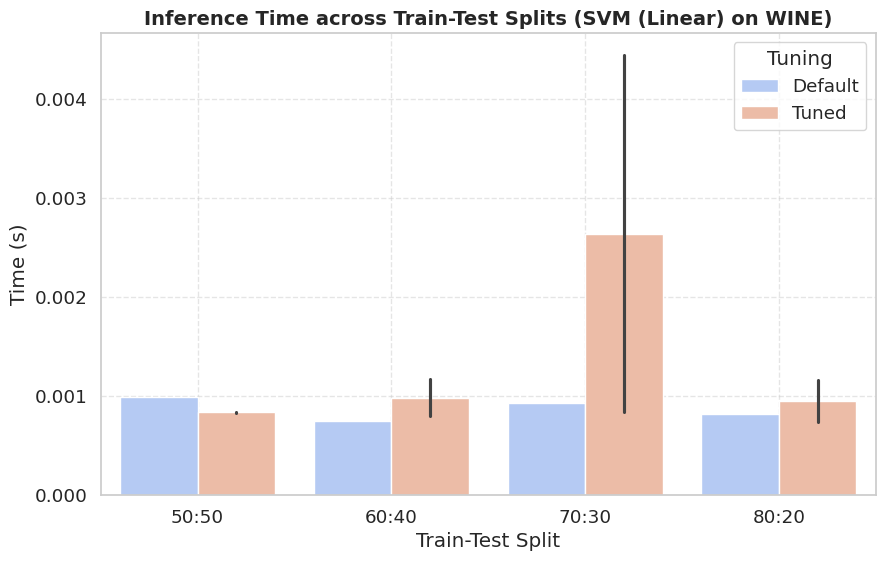

In [ ]:
analyze_results(svm_linear_df, "SVM (Linear) on WINE")


Experiments for wine dataset on Original Features ---

 running not tuned models for 50:50 Split...
--- Results for SVM (Poly) on WINE (50:50 Split, Default) ---
Accuracy: 0.8539
Precision (Weighted): 0.8666
Recall (Weighted): 0.8539
F1-Score (Weighted): 0.8540



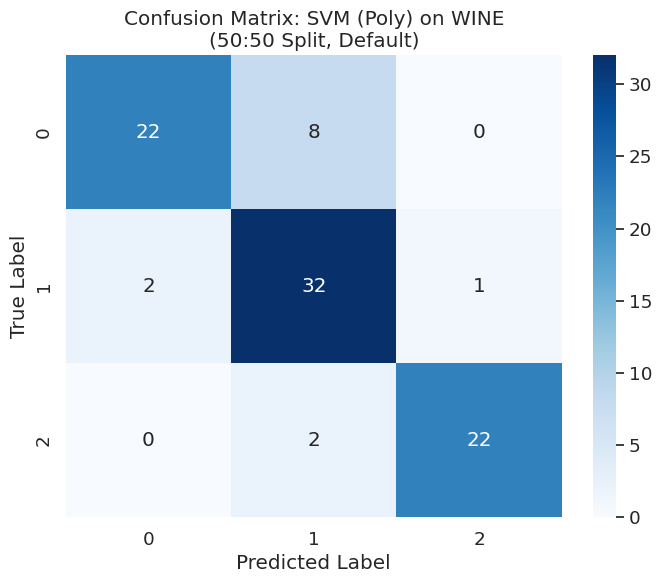

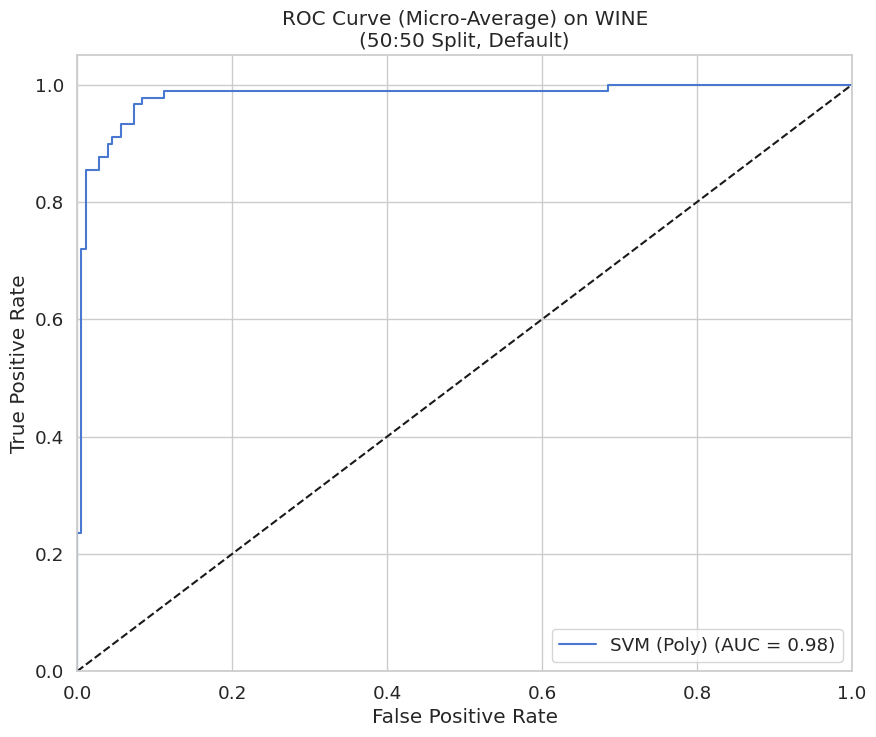


tuned model for 50:50 Split...
Tuning SVM (Poly)...
best parameters for SVM (Poly): {'C': 10, 'degree': 3}
--- Results for SVM (Poly) on WINE (50:50 Split, Tuned) ---
Accuracy: 0.9213
Precision (Weighted): 0.9240
Recall (Weighted): 0.9213
F1-Score (Weighted): 0.9206



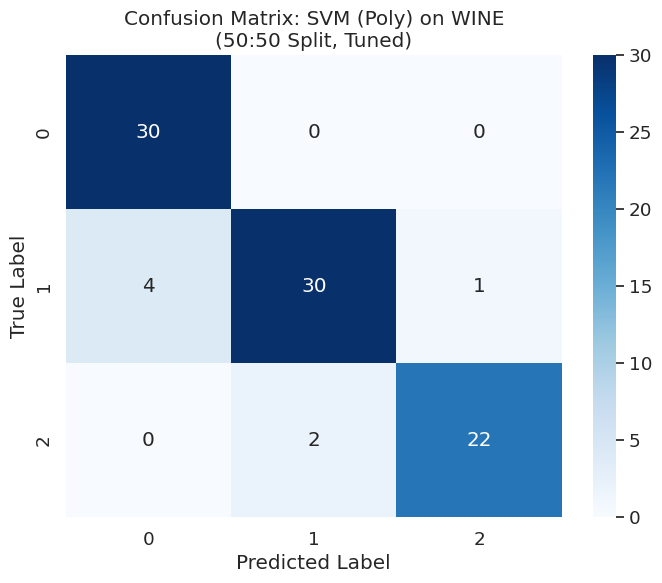

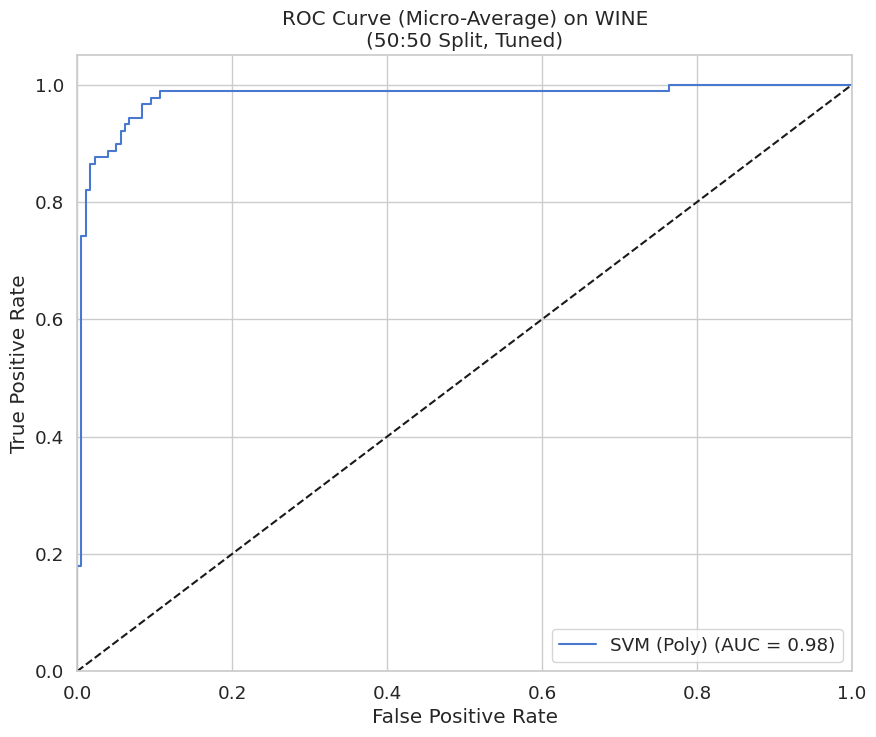


 running not tuned models for 60:40 Split...
--- Results for SVM (Poly) on WINE (60:40 Split, Default) ---
Accuracy: 0.8889
Precision (Weighted): 0.9028
Recall (Weighted): 0.8889
F1-Score (Weighted): 0.8895



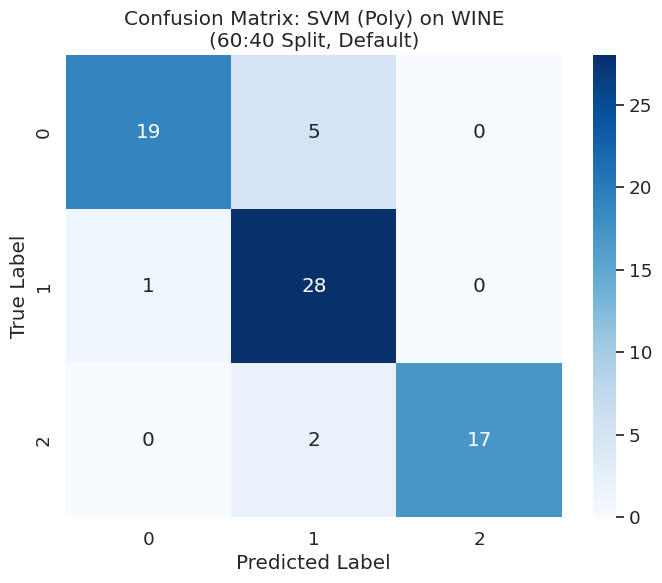

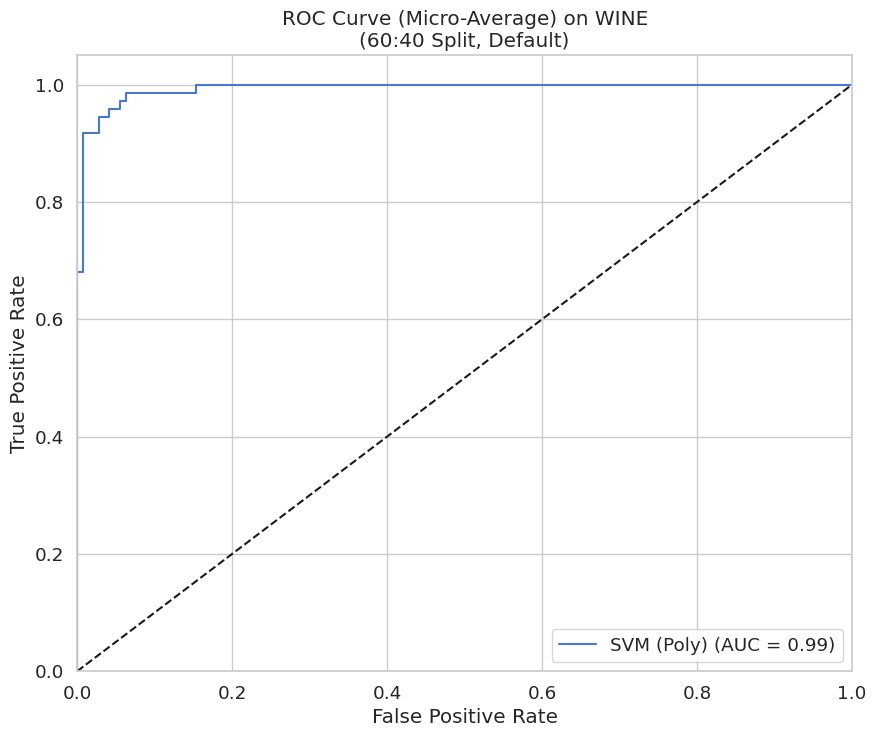


tuned model for 60:40 Split...
Tuning SVM (Poly)...
best parameters for SVM (Poly): {'C': 10, 'degree': 3}
--- Results for SVM (Poly) on WINE (60:40 Split, Tuned) ---
Accuracy: 0.9444
Precision (Weighted): 0.9466
Recall (Weighted): 0.9444
F1-Score (Weighted): 0.9442



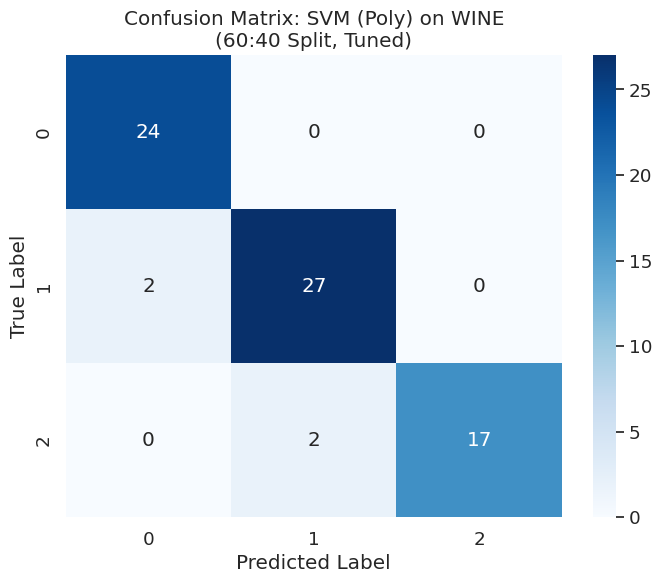

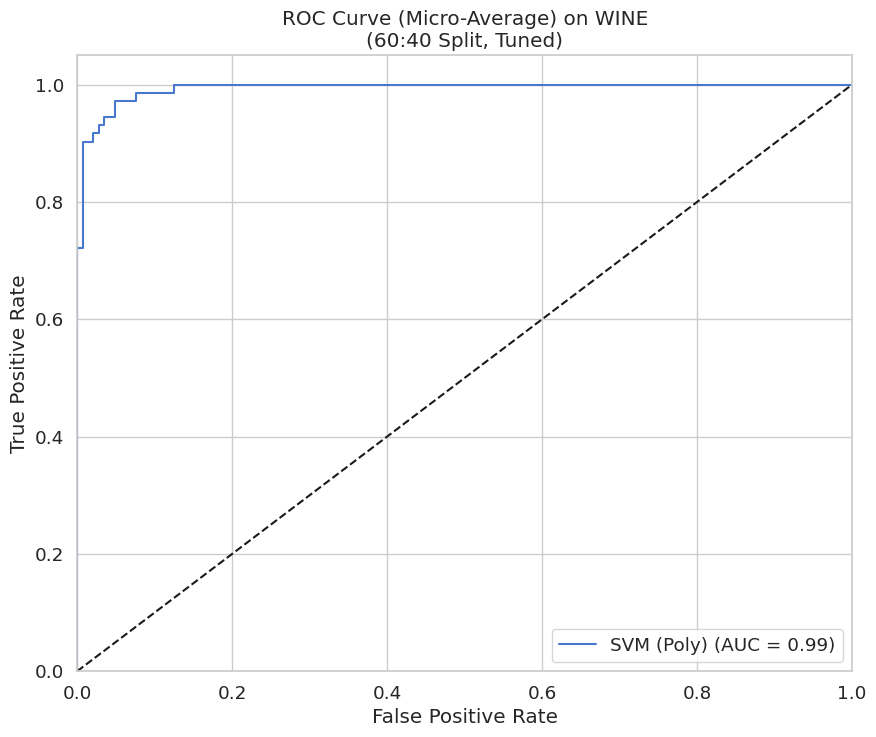


 running not tuned models for 70:30 Split...
--- Results for SVM (Poly) on WINE (70:30 Split, Default) ---
Accuracy: 0.9074
Precision (Weighted): 0.9252
Recall (Weighted): 0.9074
F1-Score (Weighted): 0.9085



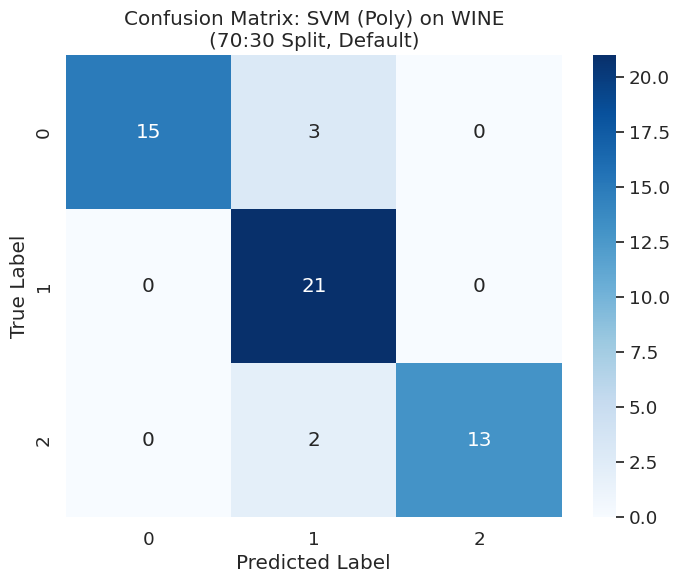

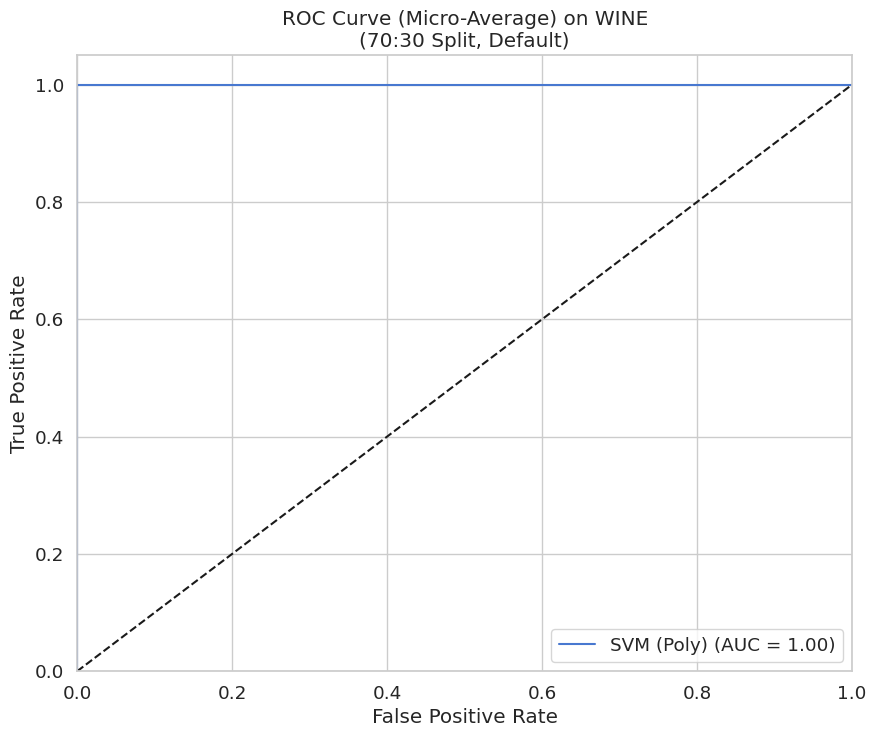


tuned model for 70:30 Split...
Tuning SVM (Poly)...
best parameters for SVM (Poly): {'C': 10, 'degree': 3}
--- Results for SVM (Poly) on WINE (70:30 Split, Tuned) ---
Accuracy: 0.9444
Precision (Weighted): 0.9471
Recall (Weighted): 0.9444
F1-Score (Weighted): 0.9440



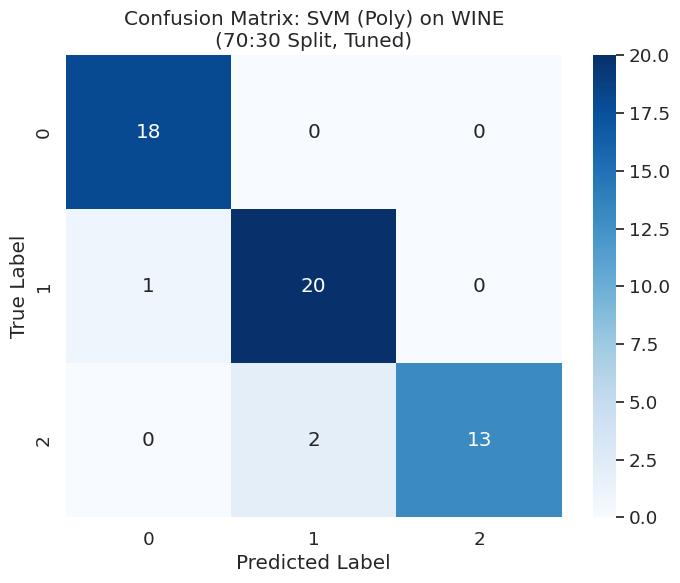

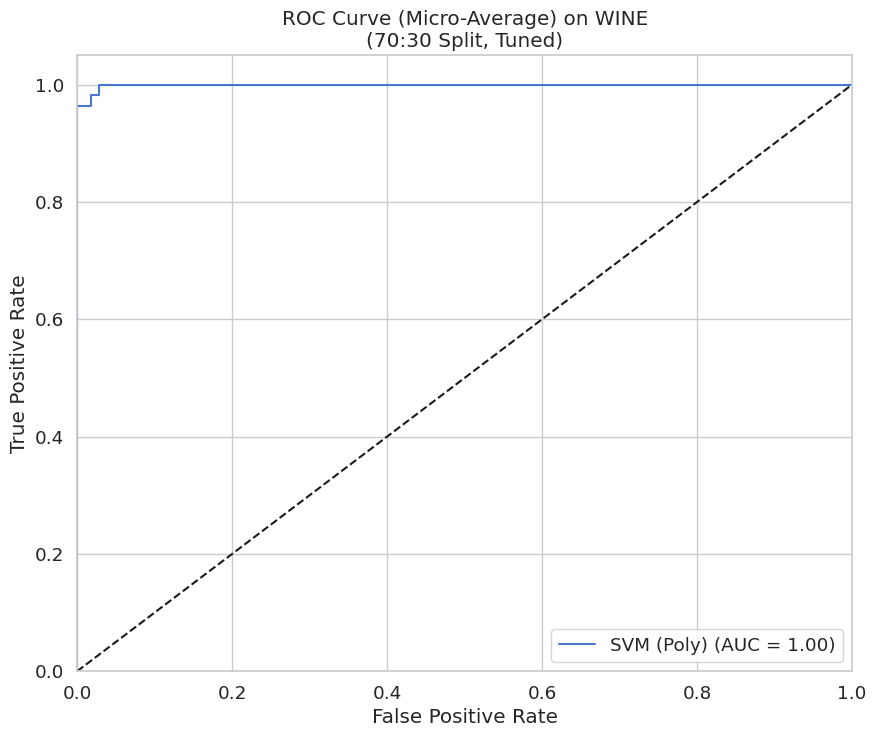


 running not tuned models for 80:20 Split...
--- Results for SVM (Poly) on WINE (80:20 Split, Default) ---
Accuracy: 0.9444
Precision (Weighted): 0.9514
Recall (Weighted): 0.9444
F1-Score (Weighted): 0.9432



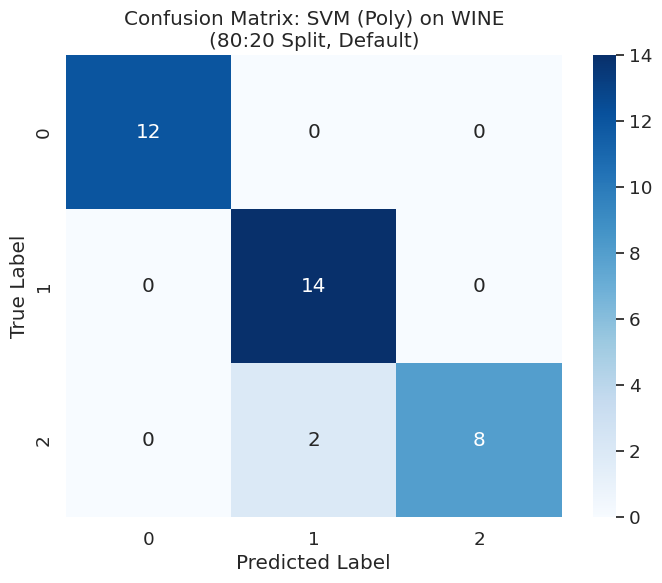

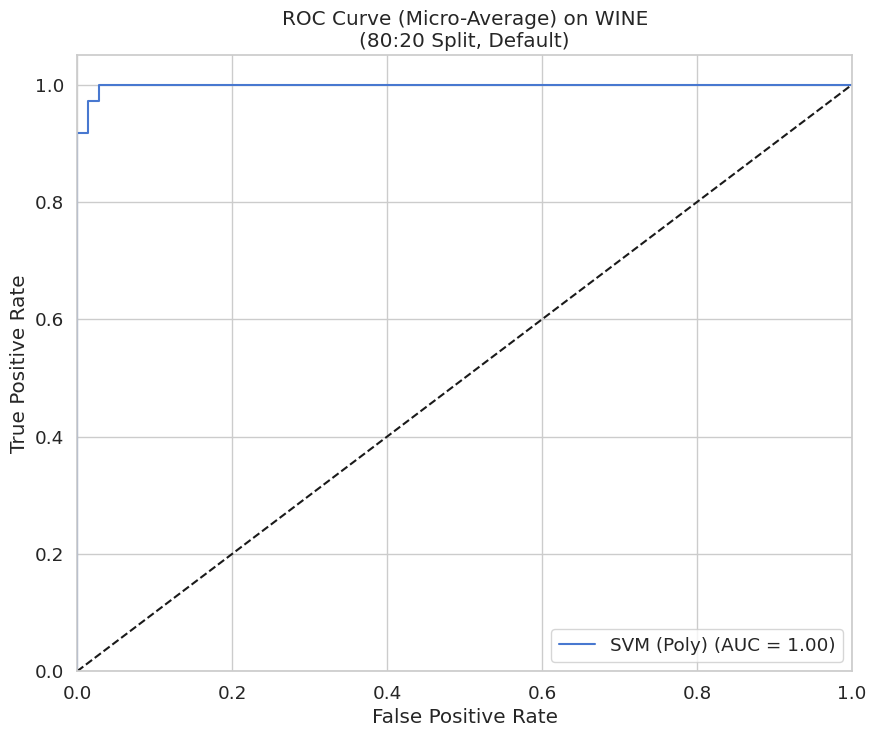


tuned model for 80:20 Split...
Tuning SVM (Poly)...
best parameters for SVM (Poly): {'C': 10, 'degree': 3}
--- Results for SVM (Poly) on WINE (80:20 Split, Tuned) ---
Accuracy: 0.9167
Precision (Weighted): 0.9225
Recall (Weighted): 0.9167
F1-Score (Weighted): 0.9156



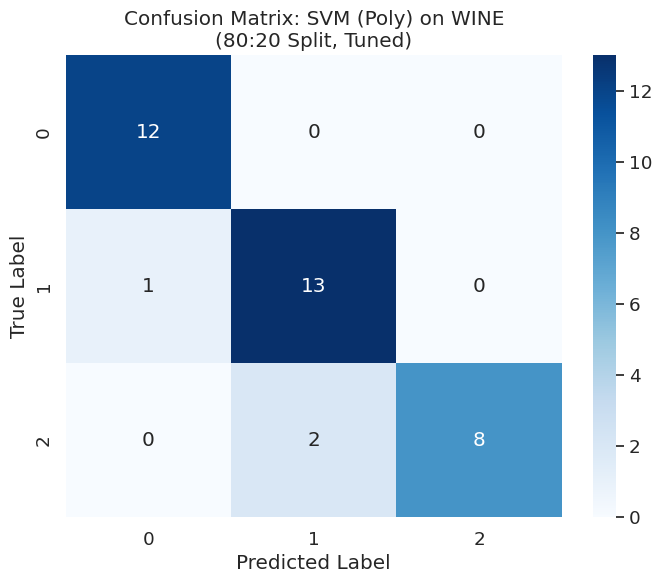

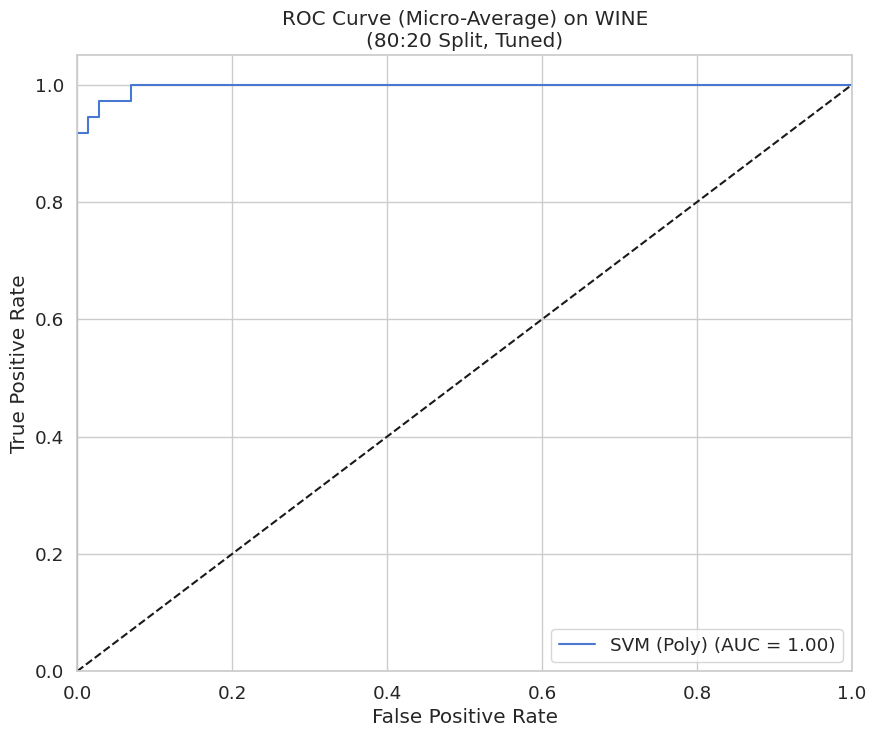


--- Starting for wine dataset with PCA ---
Original features: 13, PCA features: 10

running tuned model for 80:20 Split, PCA...
tuning SVM (Poly) with PCA features...
best parameters for SVM (Poly) on PCA data: {'C': 10, 'degree': 3}
--- Results for SVM (Poly) on WINE (80:20 Split, PCA, Tuned) ---
Accuracy: 0.9326
Precision (Weighted): 0.9338
Recall (Weighted): 0.9326
F1-Score (Weighted): 0.9320



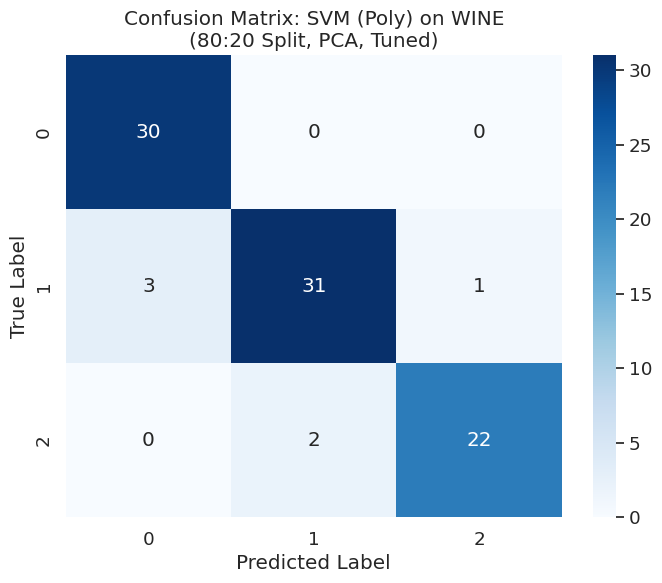

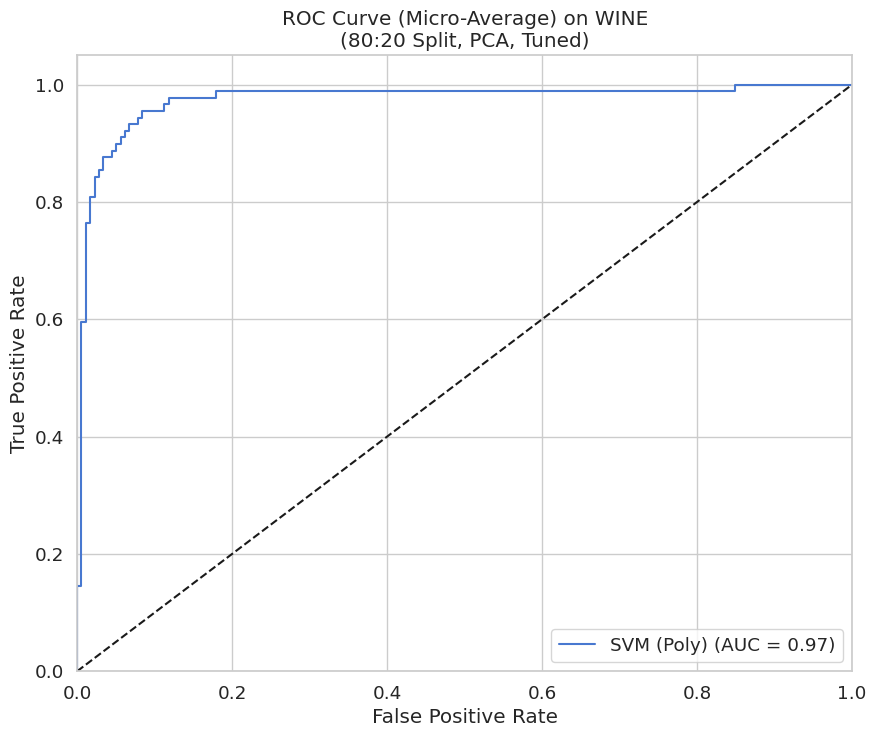

Original features: 13, PCA features: 10

running tuned model for 80:20 Split, PCA...
tuning SVM (Poly) with PCA features...
best parameters for SVM (Poly) on PCA data: {'C': 10, 'degree': 3}
--- Results for SVM (Poly) on WINE (80:20 Split, PCA, Tuned) ---
Accuracy: 0.9444
Precision (Weighted): 0.9466
Recall (Weighted): 0.9444
F1-Score (Weighted): 0.9442



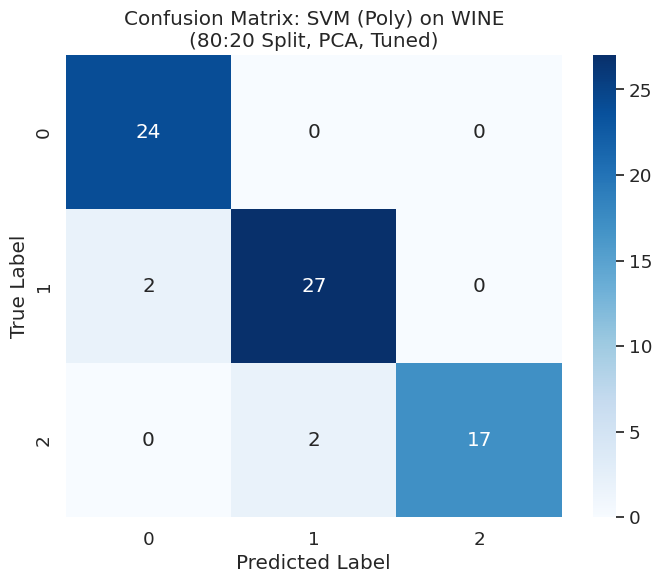

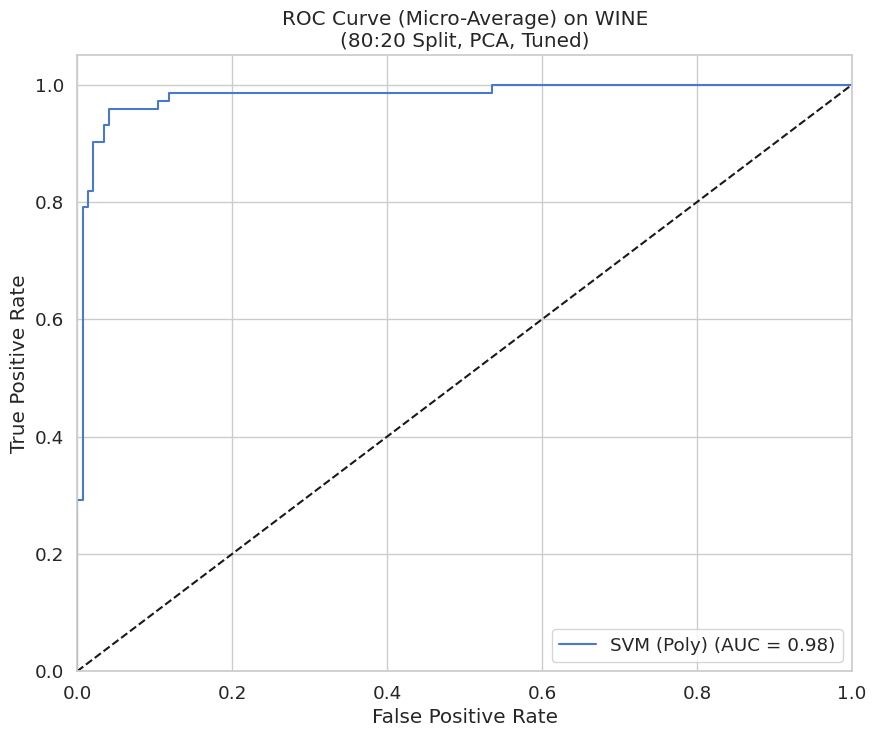

Original features: 13, PCA features: 10

running tuned model for 80:20 Split, PCA...
tuning SVM (Poly) with PCA features...
best parameters for SVM (Poly) on PCA data: {'C': 1, 'degree': 3}
--- Results for SVM (Poly) on WINE (80:20 Split, PCA, Tuned) ---
Accuracy: 0.9074
Precision (Weighted): 0.9252
Recall (Weighted): 0.9074
F1-Score (Weighted): 0.9085



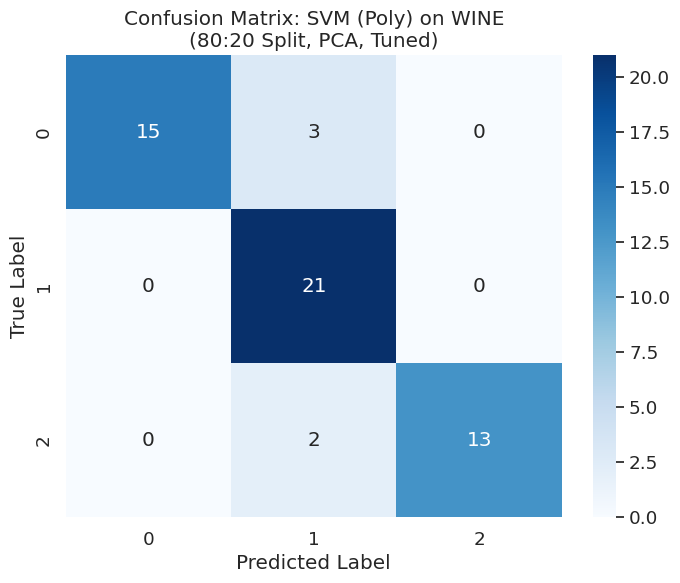

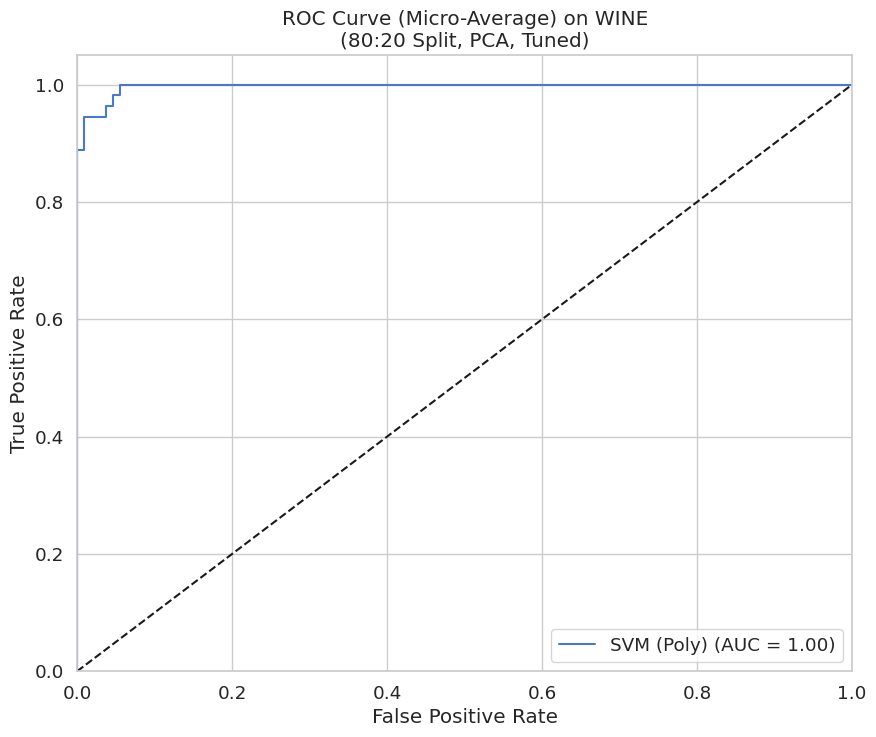

Original features: 13, PCA features: 10

running tuned model for 80:20 Split, PCA...
tuning SVM (Poly) with PCA features...
best parameters for SVM (Poly) on PCA data: {'C': 10, 'degree': 3}
--- Results for SVM (Poly) on WINE (80:20 Split, PCA, Tuned) ---
Accuracy: 0.9167
Precision (Weighted): 0.9257
Recall (Weighted): 0.9167
F1-Score (Weighted): 0.9117



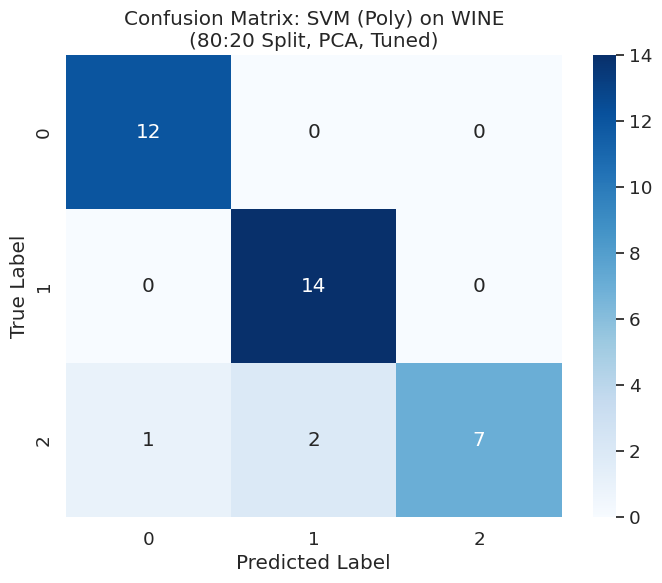

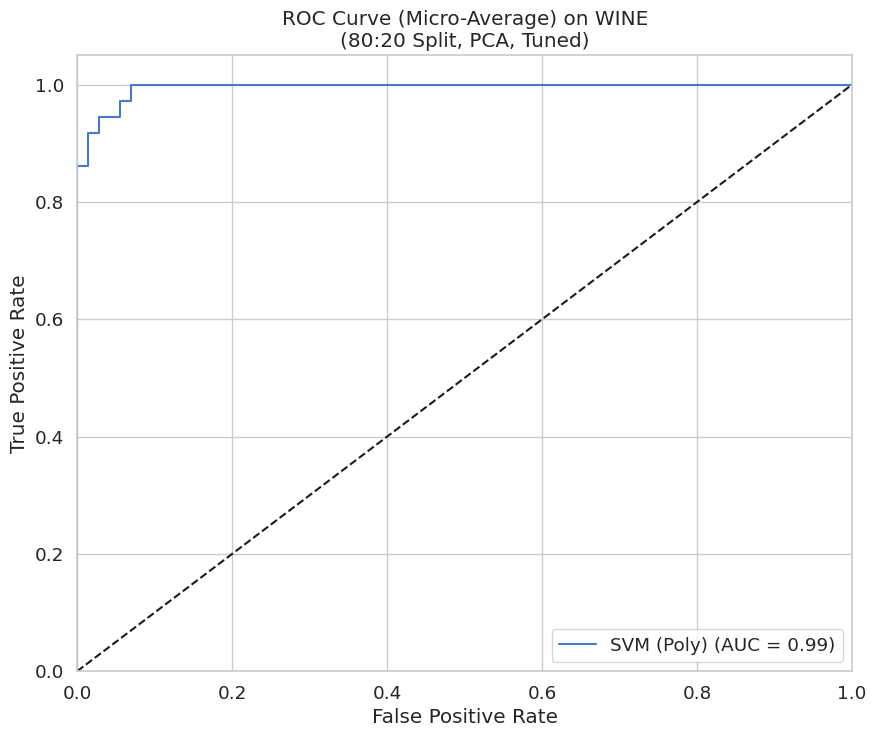

In [ ]:
def svm_polynomial_complete(dataset, dataset_name):

    X, y = wine_dataset.data, wine_dataset.target
    results_list = []

    classifiers = {
          "SVM (Poly)": SVC(kernel='poly', probability=True, random_state=42)
    }

    param_grids = {
        "SVM (Poly)": {'C': [0.1, 1, 10], 'degree': [2, 3]}
    }

    print(f"Experiments for wine dataset on Original Features ---")
    for split in splits:
        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=split, random_state=42, stratify=y
        )

        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)

        split_note = f"{int(100-split*100)}:{int(split*100)} Split"

        # without tuning
        print(f"\n running not tuned models for {split_note}...")
        trained_models_default = {}
        for name, model in classifiers.items():
            model.fit(X_train_scaled, y_train)
            trained_models_default[name] = model
            evaluate_model(model, X_test_scaled, y_test, name, dataset_name, split, f"{split_note}, Default", results_list)
        plot_roc_curves(trained_models_default, X_test_scaled, y_test, dataset_name, f"{split_note}, Default")

        # with tuning
        print(f"\ntuned model for {split_note}...")
        trained_models_tuned = {}
        for name, model in classifiers.items():
            print(f"Tuning {name}...")
            grid_search = GridSearchCV(model, param_grids[name], cv=5, n_jobs=-1, scoring='accuracy')
            grid_search.fit(X_train_scaled, y_train)
            best_model = grid_search.best_estimator_
            trained_models_tuned[name] = best_model
            print(f"best parameters for {name}: {grid_search.best_params_}")
            evaluate_model(best_model, X_test_scaled, y_test, name, dataset_name, split, f"{split_note}, Tuned", results_list)
        plot_roc_curves(trained_models_tuned, X_test_scaled, y_test, dataset_name, f"{split_note}, Tuned")

    # WITH PCA
    print(f"\n--- Starting for wine dataset with PCA ---")


    for split in splits:
      X_train, X_test, y_train, y_test = train_test_split(
          X, y, test_size=split, random_state=42, stratify=y
      )

      scaler = StandardScaler()
      X_train_scaled = scaler.fit_transform(X_train)
      X_test_scaled = scaler.transform(X_test)

      # pca with 95% variance
      pca = PCA(n_components=0.95)
      X_train_pca = pca.fit_transform(X_train_scaled)
      X_test_pca = pca.transform(X_test_scaled)
      print(f"Original features: {X_train.shape[1]}, PCA features: {X_train_pca.shape[1]}")

      pca_note = f"80:20 Split, PCA"

      # Model with tuning on PCA
      print(f"\nrunning tuned model for {pca_note}...")
      trained_models_pca = {}
      for name, model in classifiers.items():
          print(f"tuning {name} with PCA features...")
          grid_search = GridSearchCV(model, param_grids[name], cv=5, n_jobs=-1, scoring='accuracy')
          grid_search.fit(X_train_pca, y_train)
          best_model = grid_search.best_estimator_
          trained_models_pca[name] = best_model
          print(f"best parameters for {name} on PCA data: {grid_search.best_params_}")
          evaluate_model(best_model, X_test_pca, y_test, name, dataset_name, split, f"{pca_note}, Tuned", results_list)
      plot_roc_curves(trained_models_pca, X_test_pca, y_test, dataset_name, f"{pca_note}, Tuned")

    return pd.DataFrame(results_list)
svm_polynomial_df = svm_polynomial_complete(wine_dataset,"WINE")



 Results Summary for SVM (Polynomial) on WINE


,Dataset,Model,Train-Test Split,Tuning,PCA,Accuracy,Precision,Recall,F1-Score,Inference Time (s)
0,WINE,SVM (Poly),50:50,Default,No,0.8539,0.8666,0.8539,0.8540,0.0008
1,WINE,SVM (Poly),50:50,Tuned,No,0.9213,0.9240,0.9213,0.9206,0.0010
2,WINE,SVM (Poly),60:40,Default,No,0.8889,0.9028,0.8889,0.8895,0.0010
3,WINE,SVM (Poly),60:40,Tuned,No,0.9444,0.9466,0.9444,0.9442,0.0048
4,WINE,SVM (Poly),70:30,Default,No,0.9074,0.9252,0.9074,0.9085,0.0098
5,WINE,SVM (Poly),70:30,Tuned,No,0.9444,0.9471,0.9444,0.9440,0.0011
6,WINE,SVM (Poly),80:20,Default,No,0.9444,0.9514,0.9444,0.9432,0.0007
7,WINE,SVM (Poly),80:20,Tuned,No,0.9167,0.9225,0.9167,0.9156,0.0010
8,WINE,SVM (Poly),50:50,Tuned,Yes,0.9326,0.9338,0.9326,0.9320,0.0006
9,WINE,SVM (Poly),60:40,Tuned,Yes,0.9444,0.9466,0.9444,0.9442,0.0006


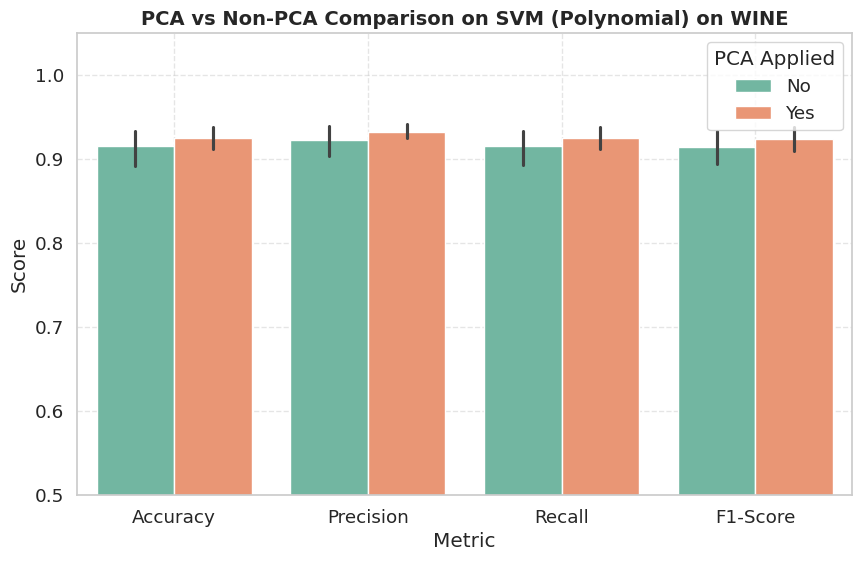

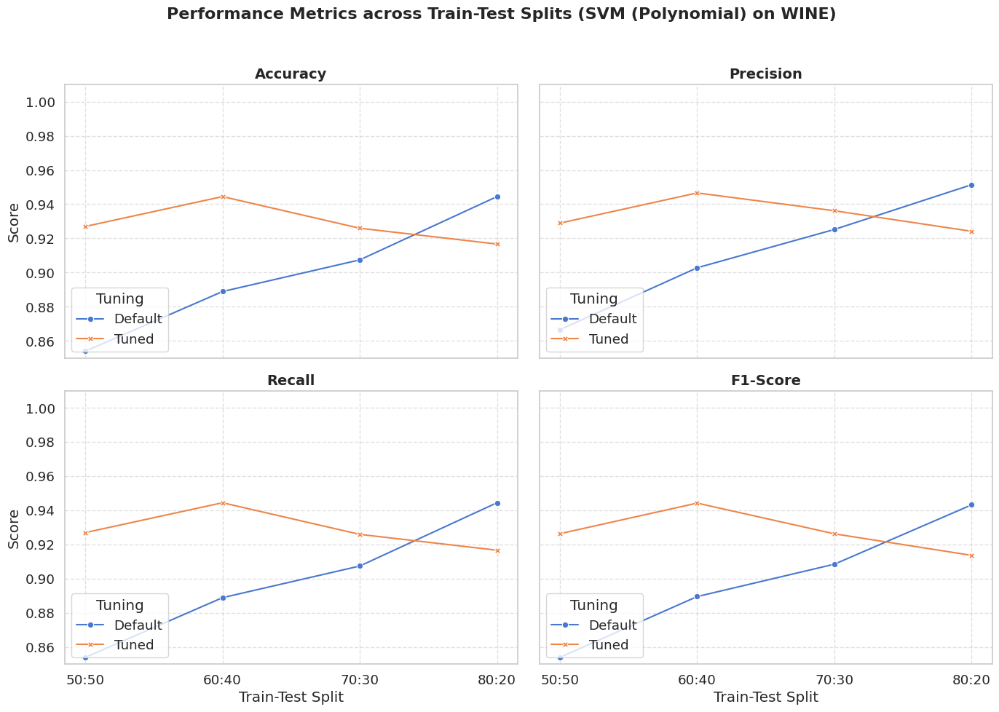

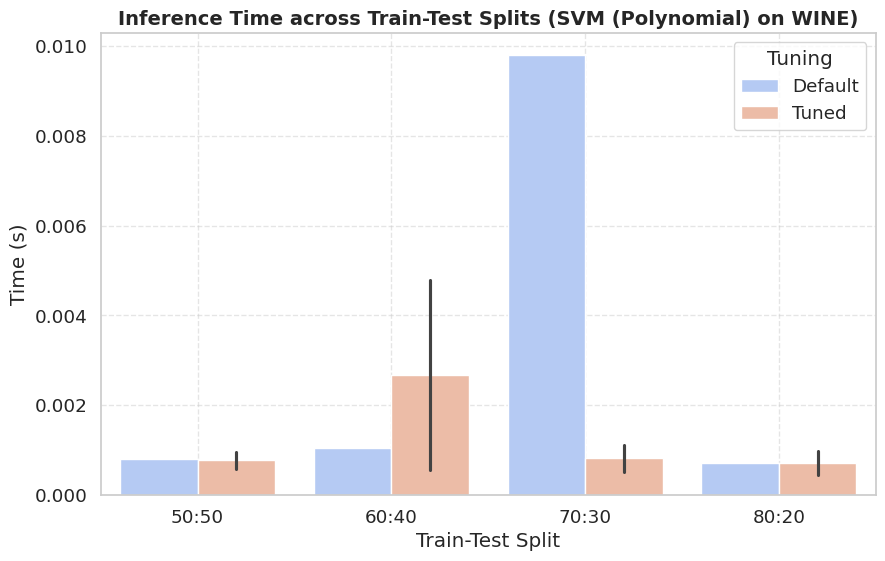

In [ ]:
analyze_results(svm_polynomial_df, "SVM (Polynomial) on WINE")

Experiments for wine dataset on Original Features ---

 running not tuned models for 50:50 Split...
--- Results for SVM (RBF) on WINE (50:50 Split, Default) ---
Accuracy: 0.9775
Precision (Weighted): 0.9775
Recall (Weighted): 0.9775
F1-Score (Weighted): 0.9775



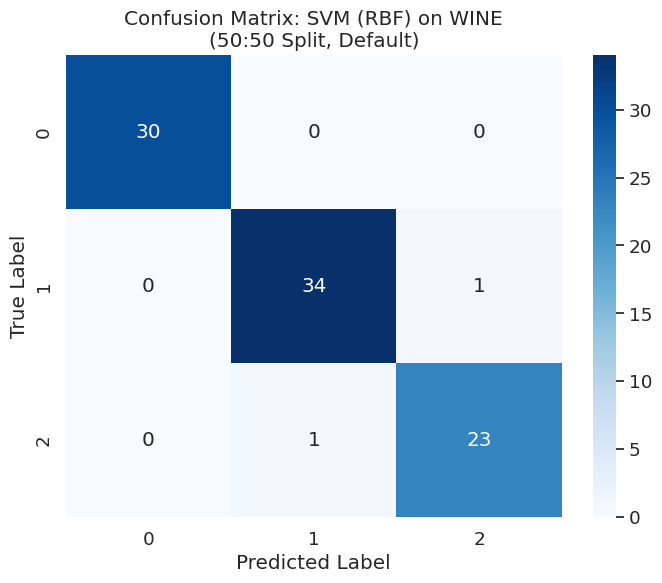

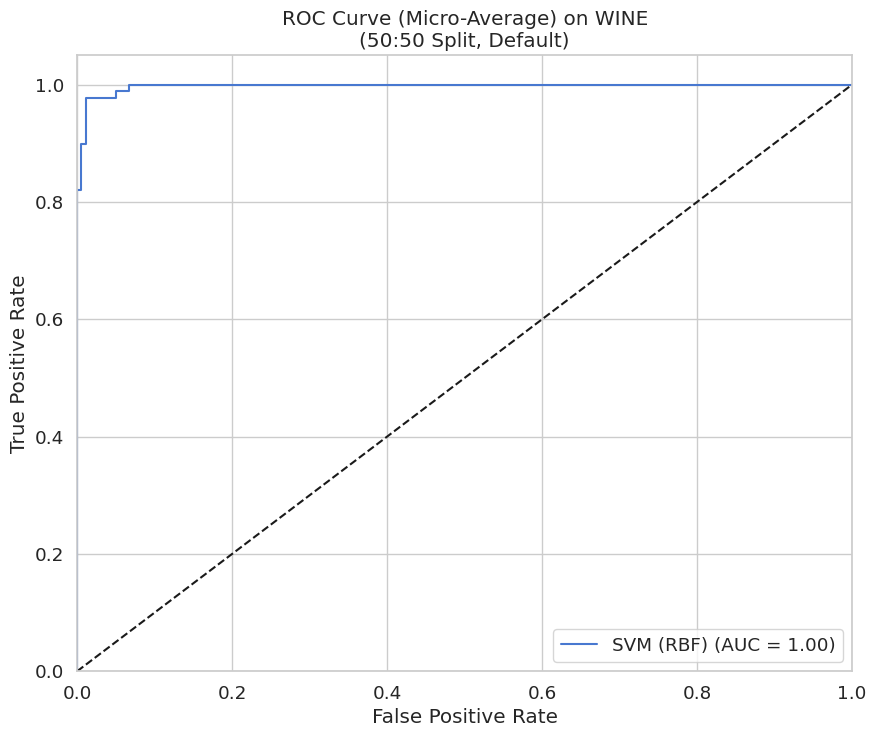


tuned model for 50:50 Split...
Tuning SVM (RBF)...
best parameters for SVM (RBF): {'C': 1, 'gamma': 0.01}
--- Results for SVM (RBF) on WINE (50:50 Split, Tuned) ---
Accuracy: 0.9663
Precision (Weighted): 0.9684
Recall (Weighted): 0.9663
F1-Score (Weighted): 0.9661



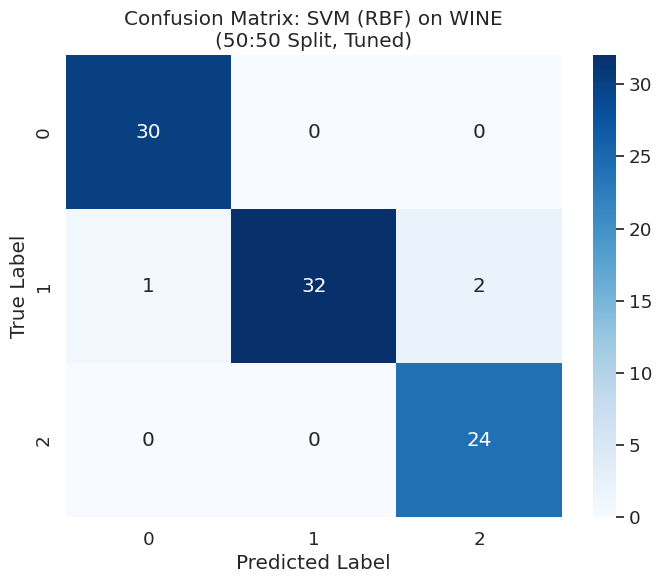

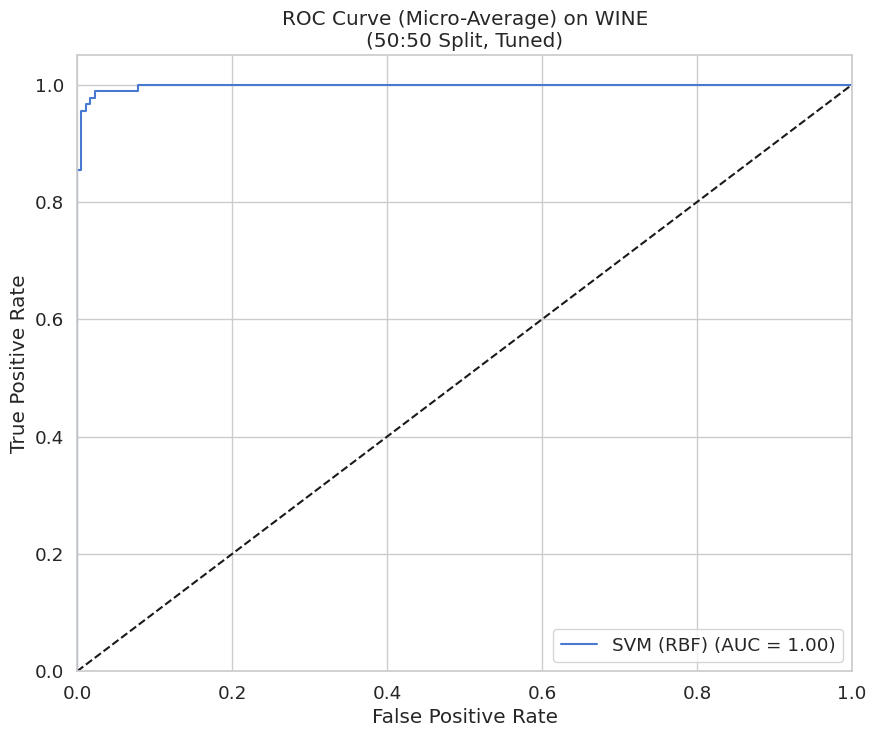


 running not tuned models for 60:40 Split...
--- Results for SVM (RBF) on WINE (60:40 Split, Default) ---
Accuracy: 0.9861
Precision (Weighted): 0.9866
Recall (Weighted): 0.9861
F1-Score (Weighted): 0.9860



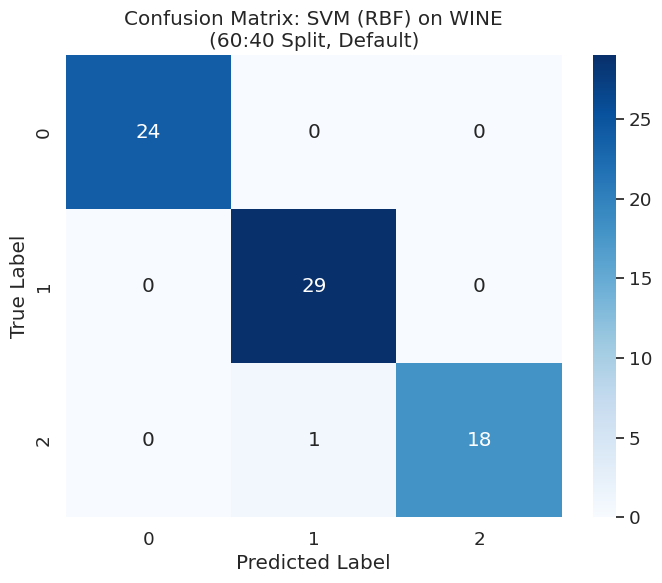

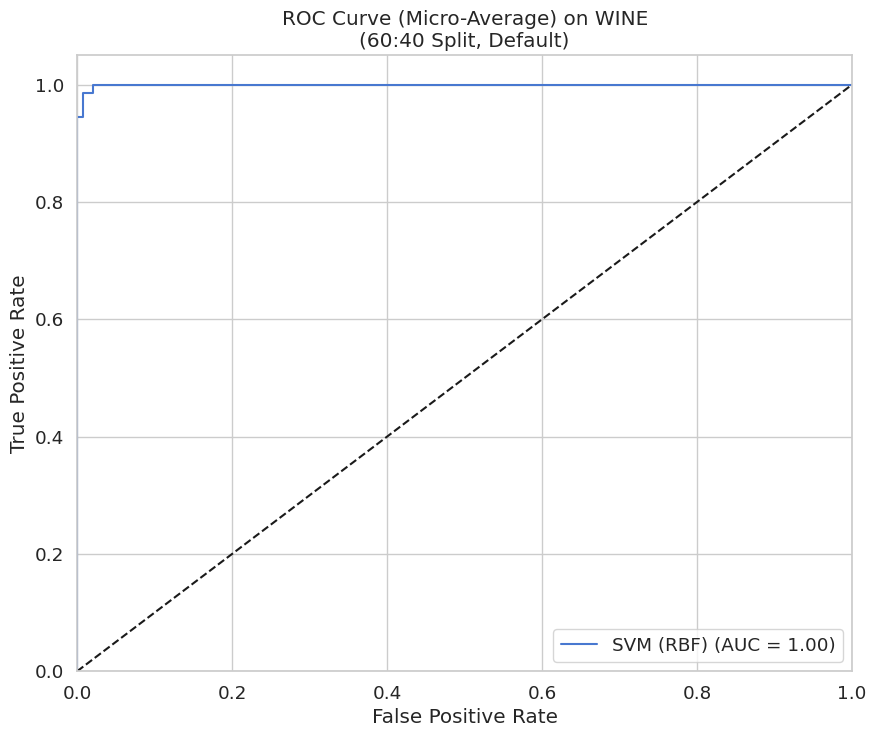


tuned model for 60:40 Split...
Tuning SVM (RBF)...
best parameters for SVM (RBF): {'C': 10, 'gamma': 'scale'}
--- Results for SVM (RBF) on WINE (60:40 Split, Tuned) ---
Accuracy: 0.9861
Precision (Weighted): 0.9866
Recall (Weighted): 0.9861
F1-Score (Weighted): 0.9860



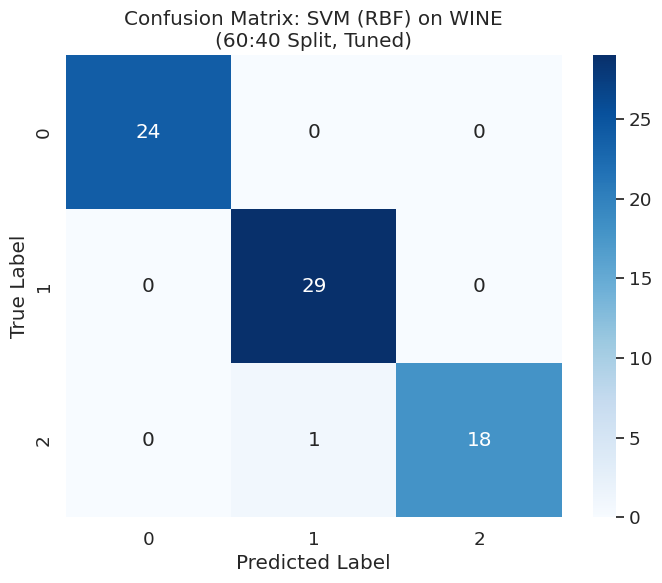

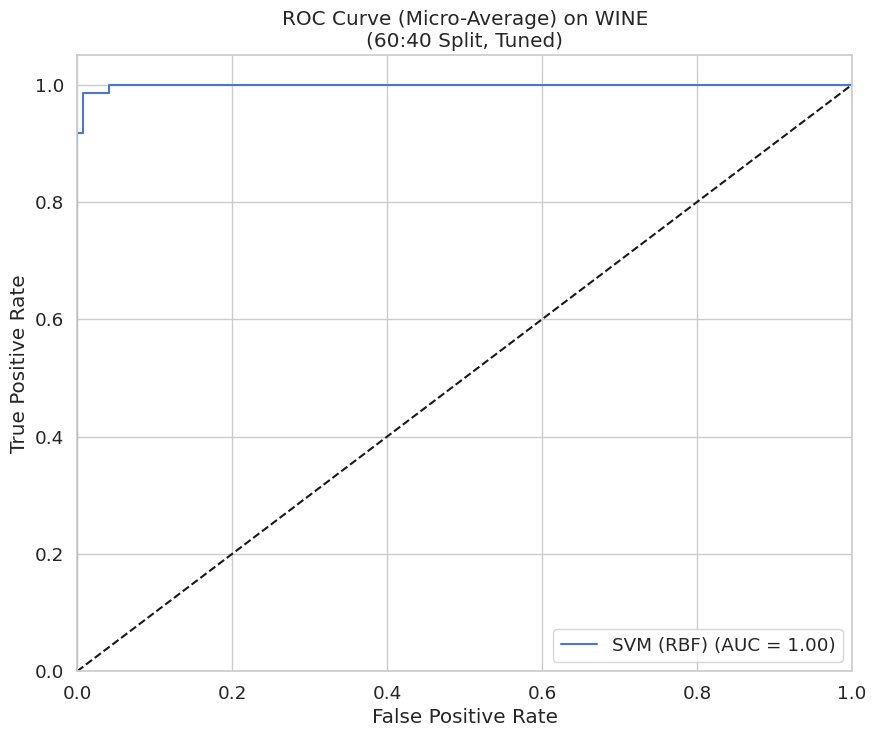


 running not tuned models for 70:30 Split...
--- Results for SVM (RBF) on WINE (70:30 Split, Default) ---
Accuracy: 0.9815
Precision (Weighted): 0.9823
Recall (Weighted): 0.9815
F1-Score (Weighted): 0.9814



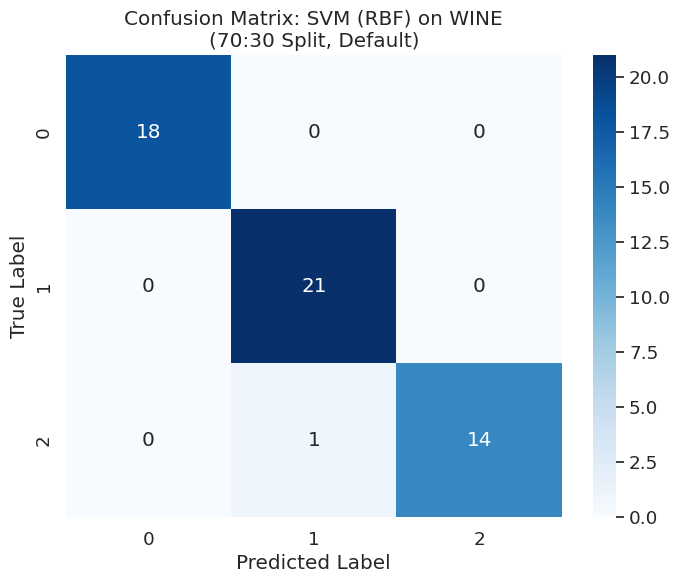

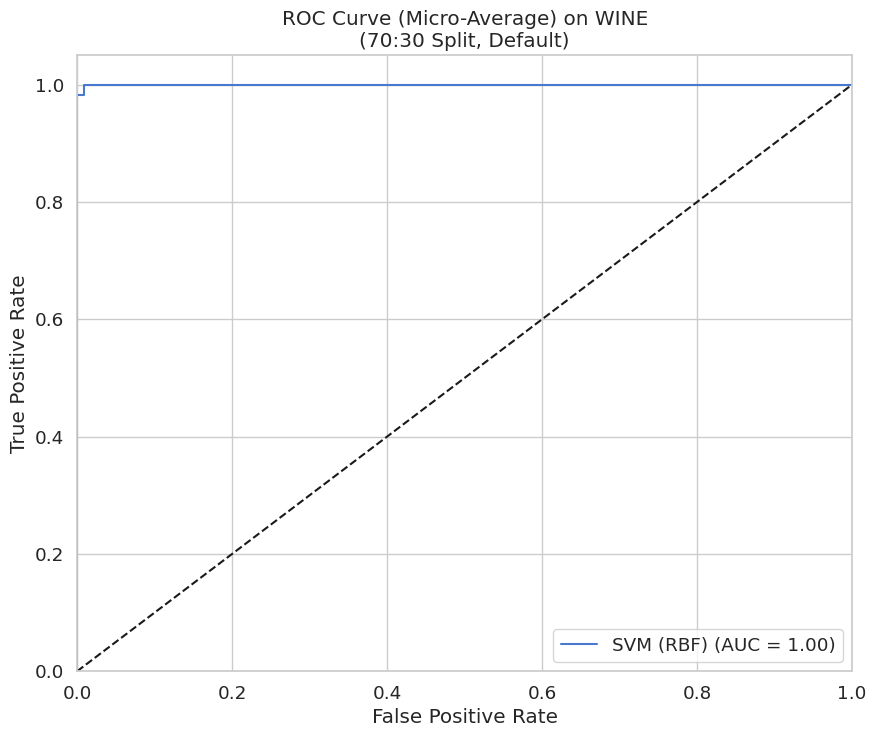


tuned model for 70:30 Split...
Tuning SVM (RBF)...
best parameters for SVM (RBF): {'C': 1, 'gamma': 'scale'}
--- Results for SVM (RBF) on WINE (70:30 Split, Tuned) ---
Accuracy: 0.9815
Precision (Weighted): 0.9823
Recall (Weighted): 0.9815
F1-Score (Weighted): 0.9814



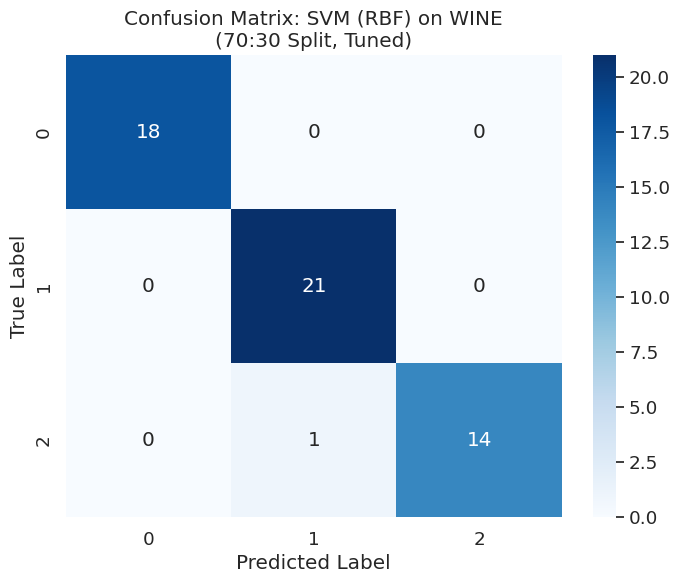

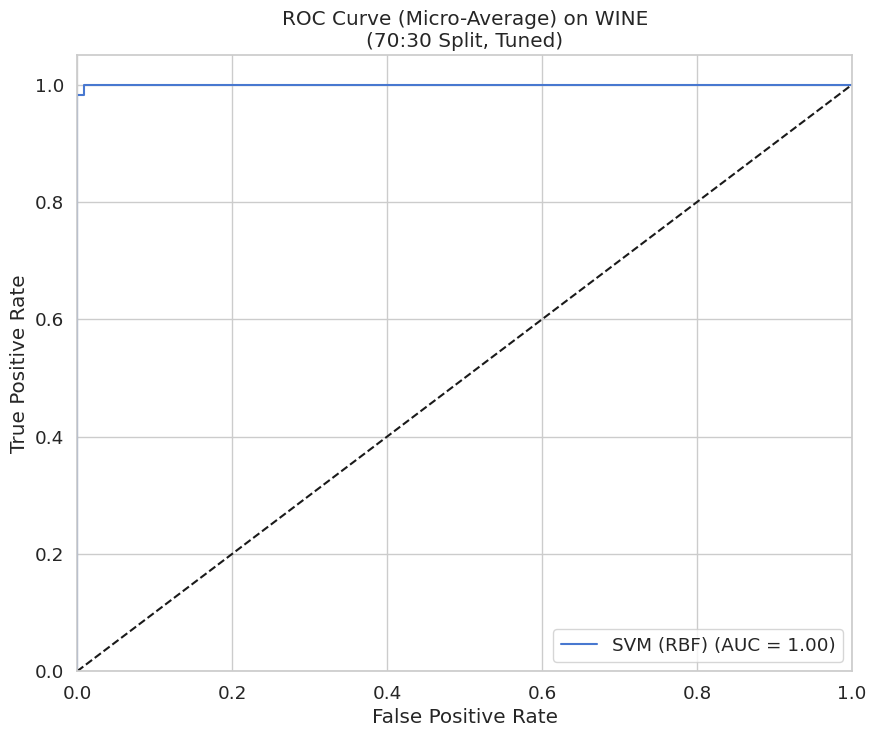


 running not tuned models for 80:20 Split...
--- Results for SVM (RBF) on WINE (80:20 Split, Default) ---
Accuracy: 0.9722
Precision (Weighted): 0.9741
Recall (Weighted): 0.9722
F1-Score (Weighted): 0.9720



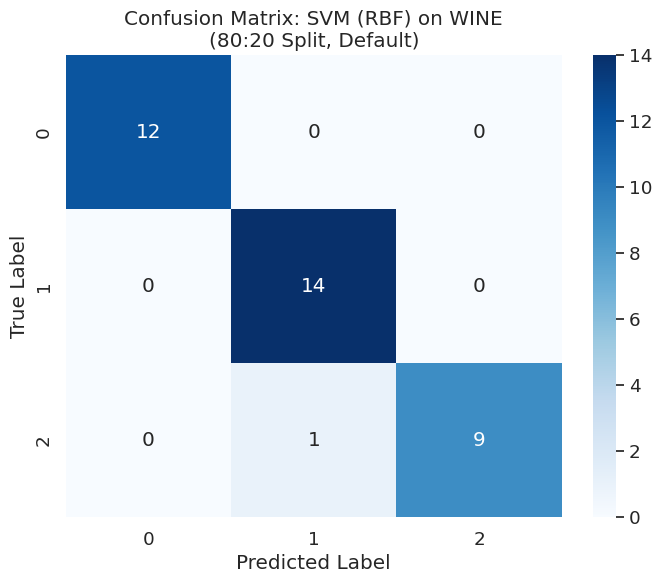

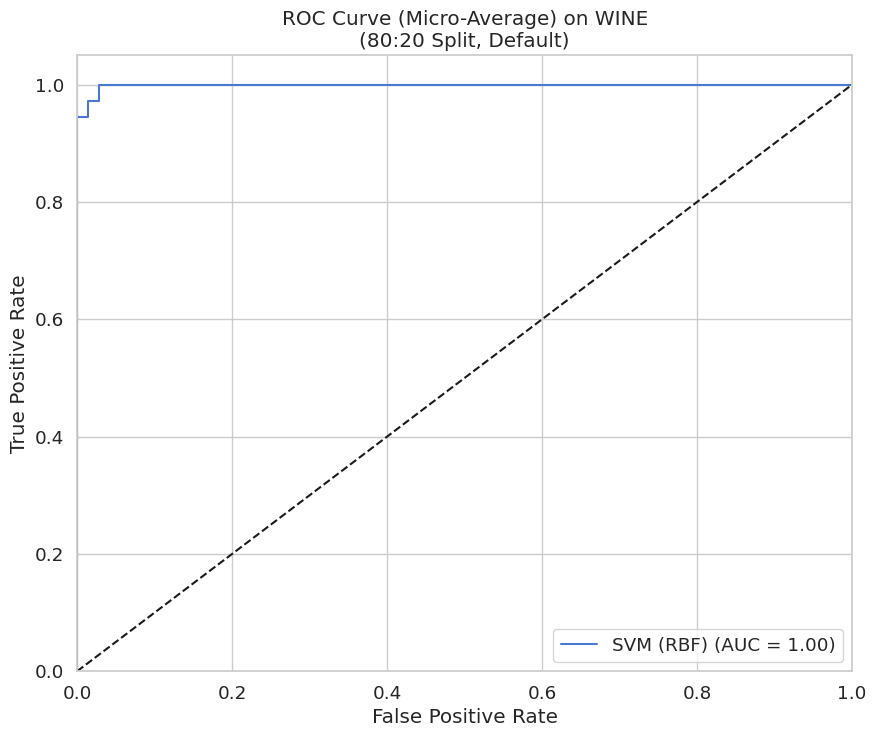


tuned model for 80:20 Split...
Tuning SVM (RBF)...
best parameters for SVM (RBF): {'C': 1, 'gamma': 'scale'}
--- Results for SVM (RBF) on WINE (80:20 Split, Tuned) ---
Accuracy: 0.9722
Precision (Weighted): 0.9741
Recall (Weighted): 0.9722
F1-Score (Weighted): 0.9720



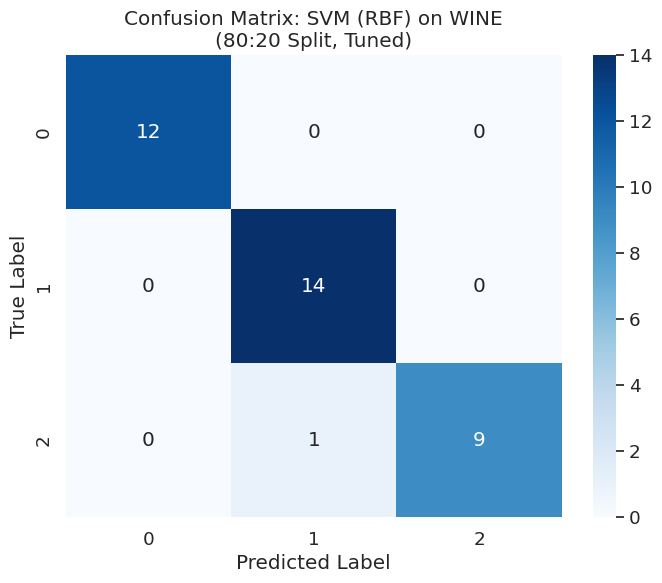

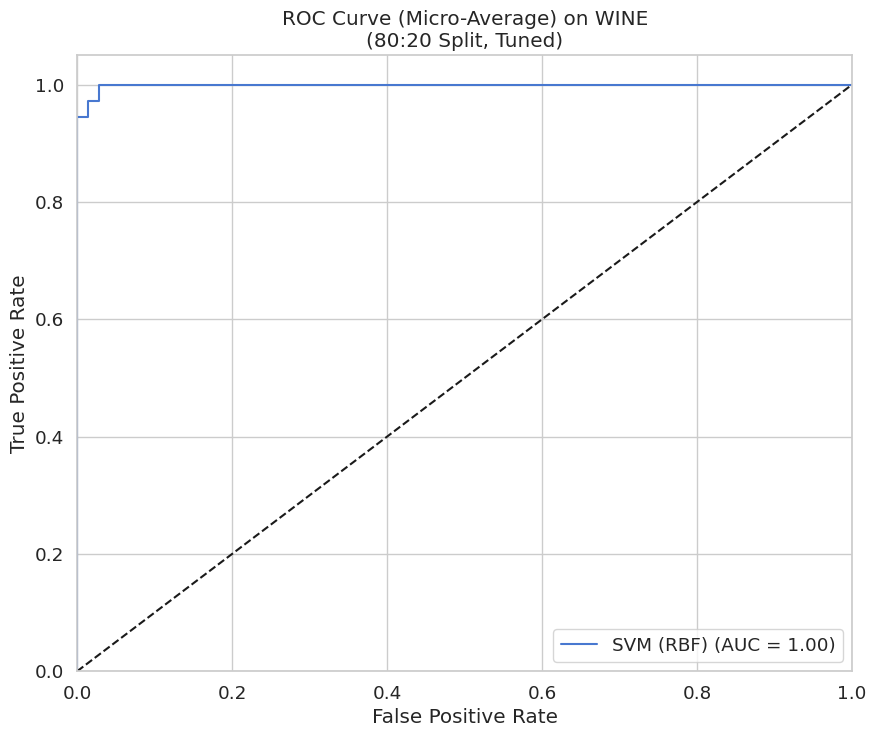


--- Starting for wine dataset with PCA ---
Original features: 13, PCA features: 10

running tuned model for 80:20 Split, PCA...
tuning SVM (RBF) with PCA features...
best parameters for SVM (RBF) on PCA data: {'C': 1, 'gamma': 0.01}
--- Results for SVM (RBF) on WINE (80:20 Split, PCA, Tuned) ---
Accuracy: 0.9663
Precision (Weighted): 0.9684
Recall (Weighted): 0.9663
F1-Score (Weighted): 0.9661



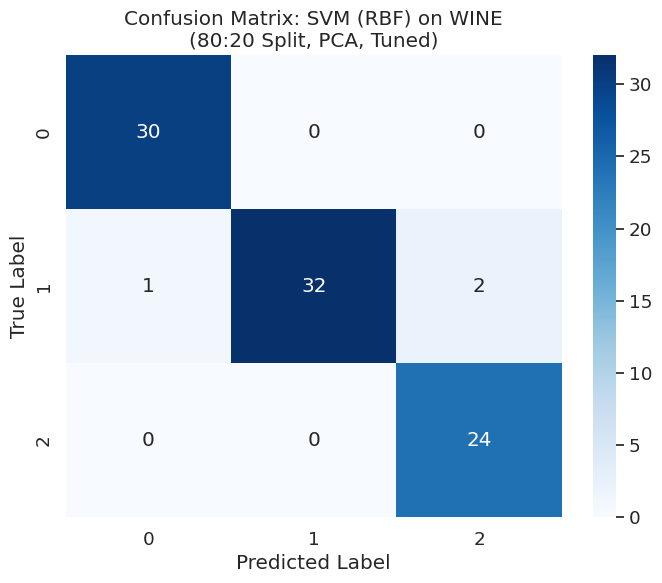

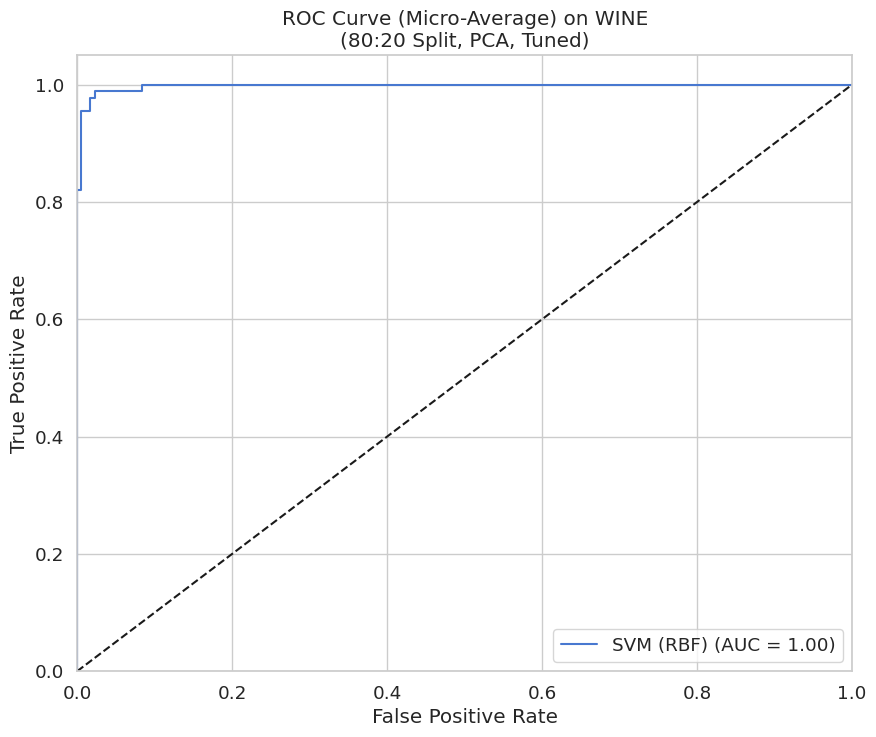

Original features: 13, PCA features: 10

running tuned model for 80:20 Split, PCA...
tuning SVM (RBF) with PCA features...
best parameters for SVM (RBF) on PCA data: {'C': 10, 'gamma': 0.01}
--- Results for SVM (RBF) on WINE (80:20 Split, PCA, Tuned) ---
Accuracy: 0.9722
Precision (Weighted): 0.9744
Recall (Weighted): 0.9722
F1-Score (Weighted): 0.9723



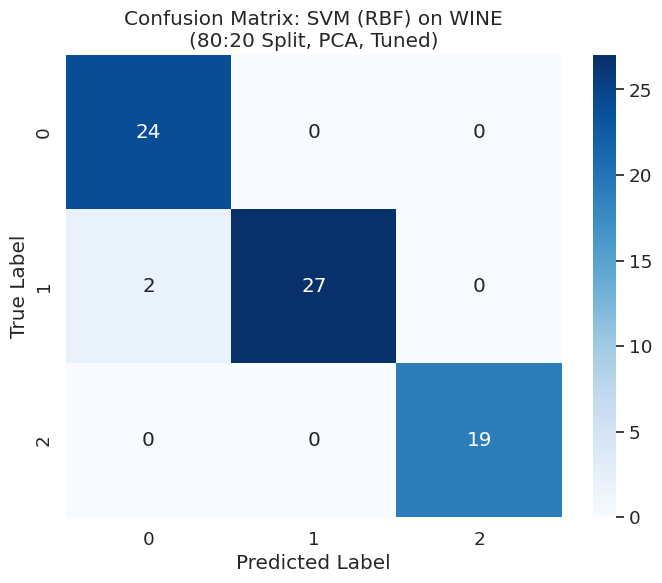

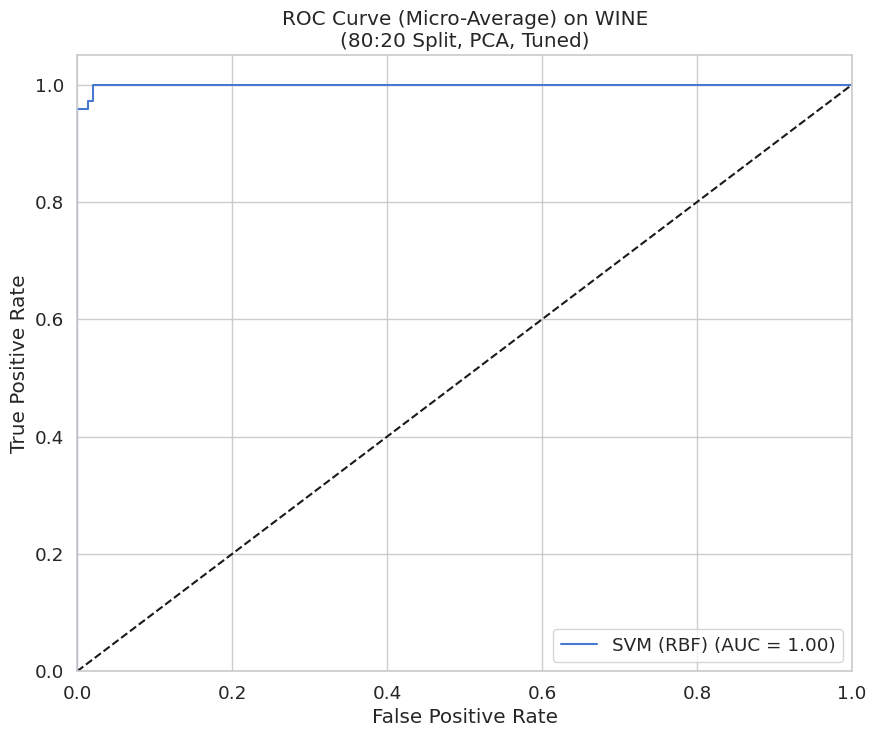

Original features: 13, PCA features: 10

running tuned model for 80:20 Split, PCA...
tuning SVM (RBF) with PCA features...
best parameters for SVM (RBF) on PCA data: {'C': 1, 'gamma': 'scale'}
--- Results for SVM (RBF) on WINE (80:20 Split, PCA, Tuned) ---
Accuracy: 0.9815
Precision (Weighted): 0.9823
Recall (Weighted): 0.9815
F1-Score (Weighted): 0.9814



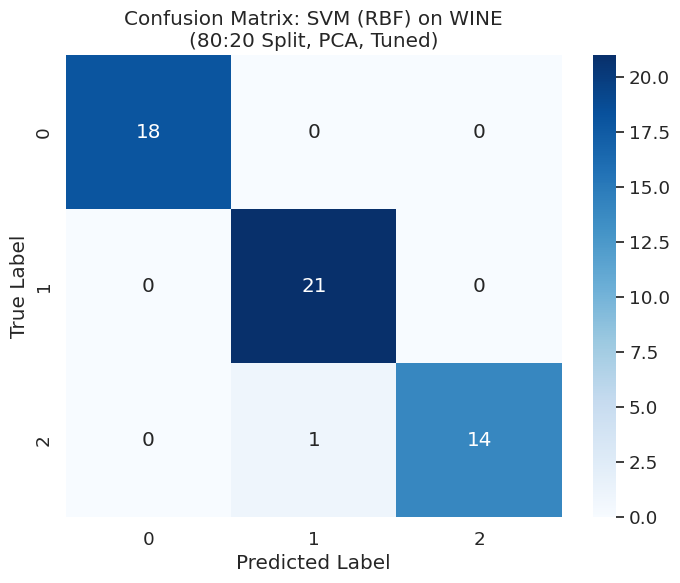

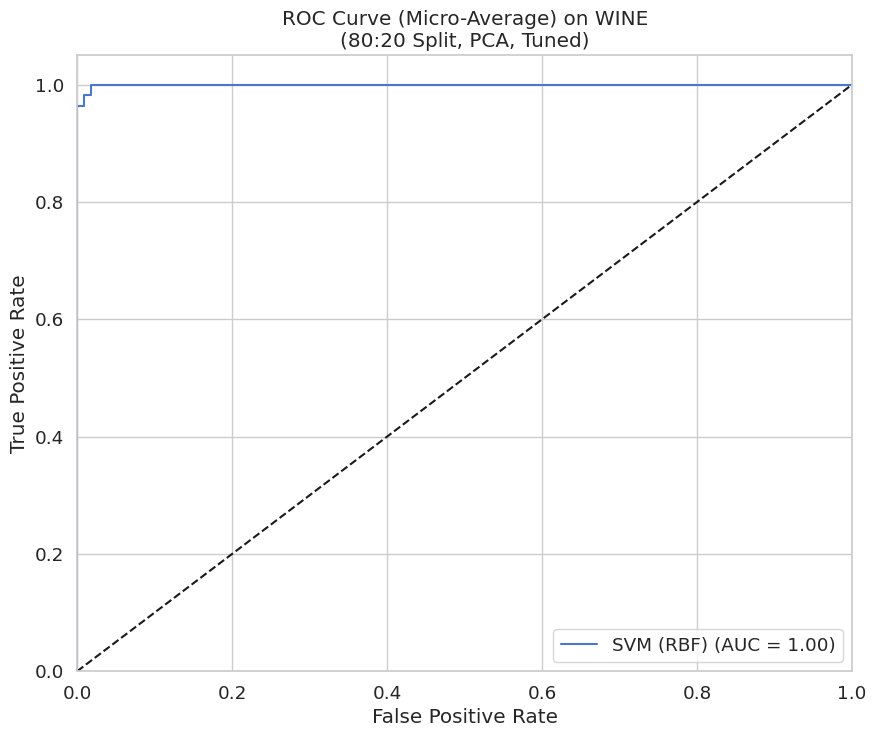

Original features: 13, PCA features: 10

running tuned model for 80:20 Split, PCA...
tuning SVM (RBF) with PCA features...
best parameters for SVM (RBF) on PCA data: {'C': 1, 'gamma': 0.01}
--- Results for SVM (RBF) on WINE (80:20 Split, PCA, Tuned) ---
Accuracy: 1.0000
Precision (Weighted): 1.0000
Recall (Weighted): 1.0000
F1-Score (Weighted): 1.0000



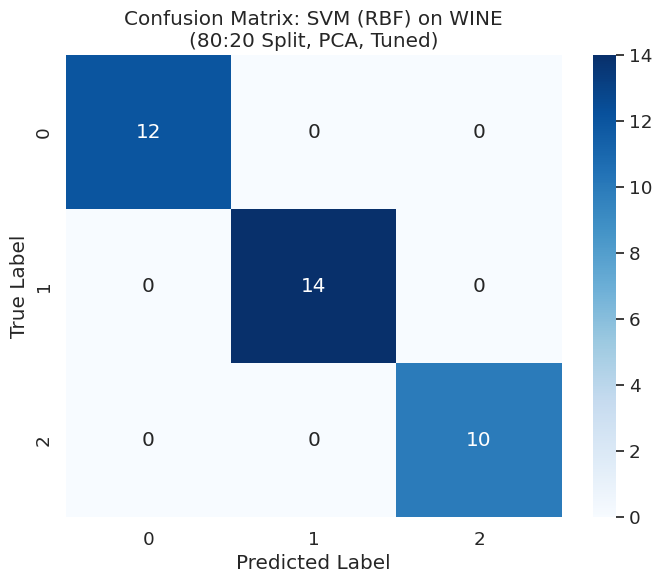

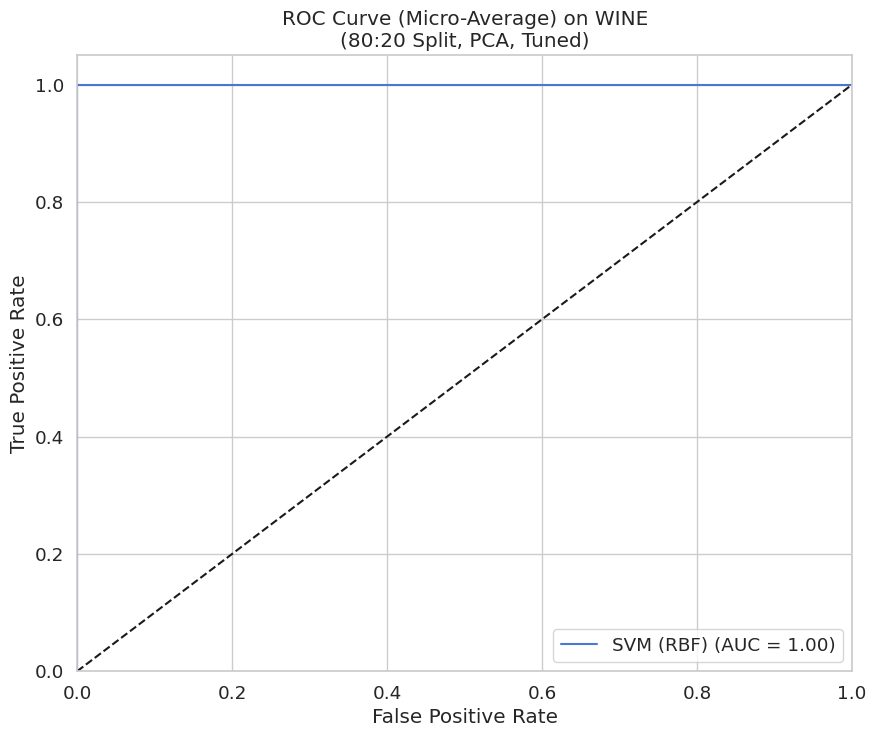

In [ ]:
def svm_rbf_complete(dataset, dataset_name):

    X, y = wine_dataset.data, wine_dataset.target
    results_list = []

    classifiers = {
        "SVM (RBF)": SVC(kernel='rbf', probability=True, random_state=42),

    }

    param_grids = {
        "SVM (RBF)": {'C': [0.1, 1, 10], 'gamma': [0.001, 0.01, 'scale']},
    }

    print(f"Experiments for wine dataset on Original Features ---")
    for split in splits:
        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=split, random_state=42, stratify=y
        )

        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)

        split_note = f"{int(100-split*100)}:{int(split*100)} Split"

        # without tuning
        print(f"\n running not tuned models for {split_note}...")
        trained_models_default = {}
        for name, model in classifiers.items():
            model.fit(X_train_scaled, y_train)
            trained_models_default[name] = model
            evaluate_model(model, X_test_scaled, y_test, name, dataset_name, split, f"{split_note}, Default", results_list)
        plot_roc_curves(trained_models_default, X_test_scaled, y_test, dataset_name, f"{split_note}, Default")

        # with tuning
        print(f"\ntuned model for {split_note}...")
        trained_models_tuned = {}
        for name, model in classifiers.items():
            print(f"Tuning {name}...")
            grid_search = GridSearchCV(model, param_grids[name], cv=5, n_jobs=-1, scoring='accuracy')
            grid_search.fit(X_train_scaled, y_train)
            best_model = grid_search.best_estimator_
            trained_models_tuned[name] = best_model
            print(f"best parameters for {name}: {grid_search.best_params_}")
            evaluate_model(best_model, X_test_scaled, y_test, name, dataset_name, split, f"{split_note}, Tuned", results_list)
        plot_roc_curves(trained_models_tuned, X_test_scaled, y_test, dataset_name, f"{split_note}, Tuned")

    # WITH PCA
    print(f"\n--- Starting for wine dataset with PCA ---")


    for split in splits:
      X_train, X_test, y_train, y_test = train_test_split(
          X, y, test_size=split, random_state=42, stratify=y
      )

      scaler = StandardScaler()
      X_train_scaled = scaler.fit_transform(X_train)
      X_test_scaled = scaler.transform(X_test)

      # pca with 95% variance
      pca = PCA(n_components=0.95)
      X_train_pca = pca.fit_transform(X_train_scaled)
      X_test_pca = pca.transform(X_test_scaled)
      print(f"Original features: {X_train.shape[1]}, PCA features: {X_train_pca.shape[1]}")

      pca_note = f"80:20 Split, PCA"

      # Model with tuning on PCA
      print(f"\nrunning tuned model for {pca_note}...")
      trained_models_pca = {}
      for name, model in classifiers.items():
          print(f"tuning {name} with PCA features...")
          grid_search = GridSearchCV(model, param_grids[name], cv=5, n_jobs=-1, scoring='accuracy')
          grid_search.fit(X_train_pca, y_train)
          best_model = grid_search.best_estimator_
          trained_models_pca[name] = best_model
          print(f"best parameters for {name} on PCA data: {grid_search.best_params_}")
          evaluate_model(best_model, X_test_pca, y_test, name, dataset_name, split, f"{pca_note}, Tuned", results_list)
      plot_roc_curves(trained_models_pca, X_test_pca, y_test, dataset_name, f"{pca_note}, Tuned")

    return pd.DataFrame(results_list)
svm_rbf_df = svm_rbf_complete(wine_dataset,"WINE")


 Results Summary for SVM (RBF) on WINE


,Dataset,Model,Train-Test Split,Tuning,PCA,Accuracy,Precision,Recall,F1-Score,Inference Time (s)
0,WINE,SVM (RBF),50:50,Default,No,0.9775,0.9775,0.9775,0.9775,0.0007
1,WINE,SVM (RBF),50:50,Tuned,No,0.9663,0.9684,0.9663,0.9661,0.0011
2,WINE,SVM (RBF),60:40,Default,No,0.9861,0.9866,0.9861,0.9860,0.0012
3,WINE,SVM (RBF),60:40,Tuned,No,0.9861,0.9866,0.9861,0.9860,0.0009
4,WINE,SVM (RBF),70:30,Default,No,0.9815,0.9823,0.9815,0.9814,0.0010
5,WINE,SVM (RBF),70:30,Tuned,No,0.9815,0.9823,0.9815,0.9814,0.0008
6,WINE,SVM (RBF),80:20,Default,No,0.9722,0.9741,0.9722,0.9720,0.0009
7,WINE,SVM (RBF),80:20,Tuned,No,0.9722,0.9741,0.9722,0.9720,0.0009
8,WINE,SVM (RBF),50:50,Tuned,Yes,0.9663,0.9684,0.9663,0.9661,0.0013
9,WINE,SVM (RBF),60:40,Tuned,Yes,0.9722,0.9744,0.9722,0.9723,0.0010


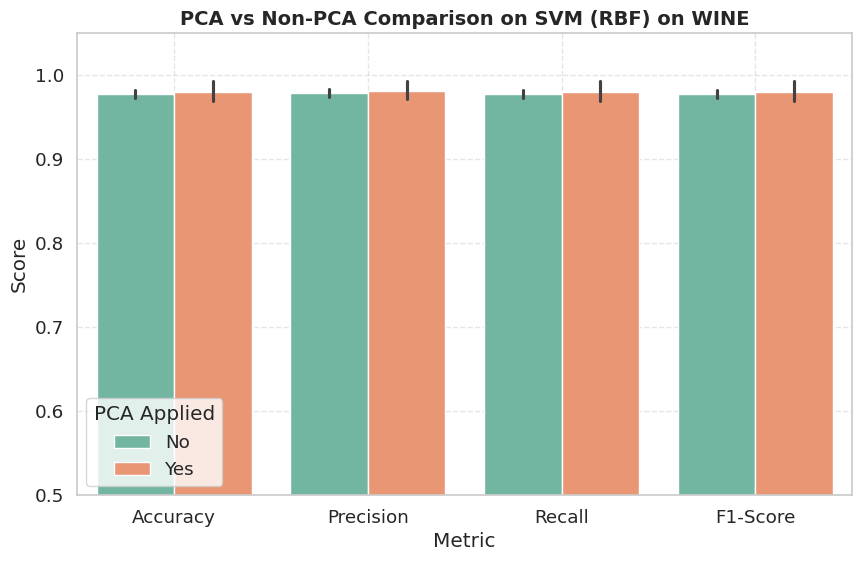

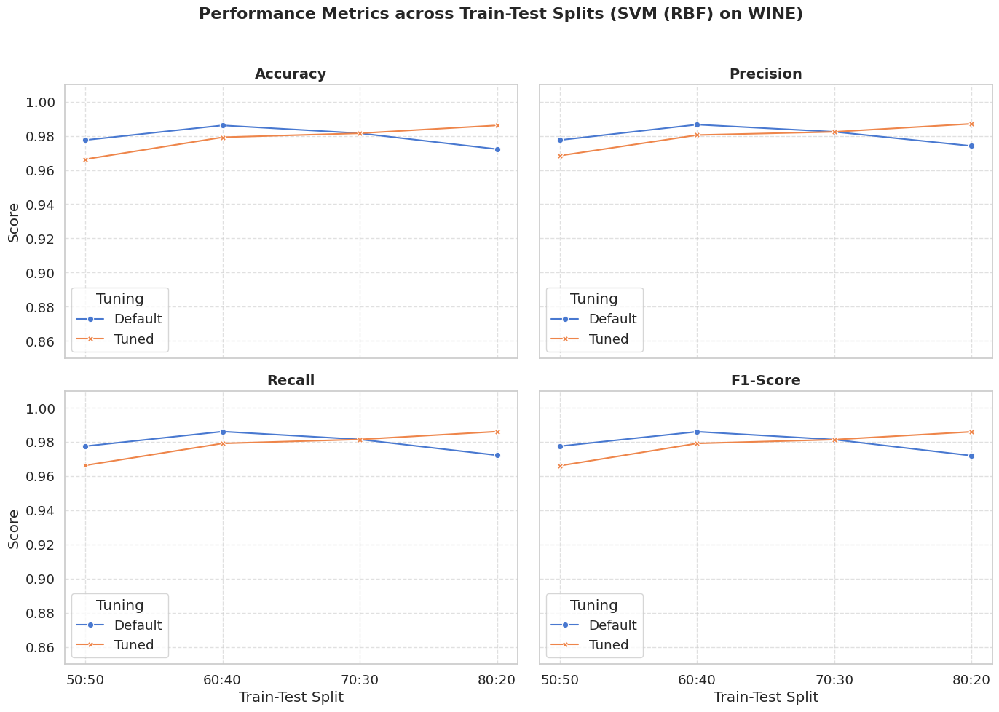

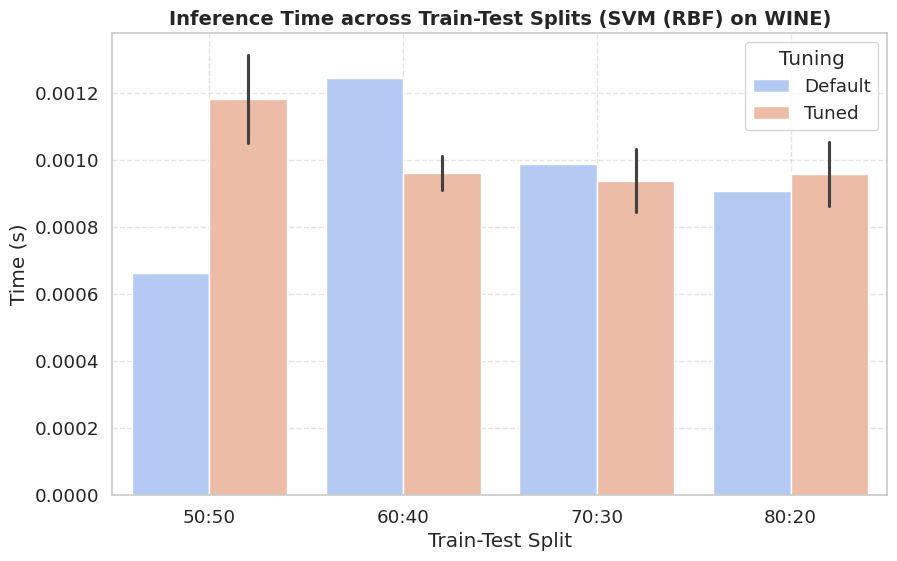

In [ ]:
analyze_results(svm_rbf_df, "SVM (RBF) on WINE")


Experiments for wine dataset on Original Features ---

 running not tuned models for 50:50 Split...
--- Results for SVM (Sigmoid) on WINE (50:50 Split, Default) ---
Accuracy: 0.9551
Precision (Weighted): 0.9570
Recall (Weighted): 0.9551
F1-Score (Weighted): 0.9553



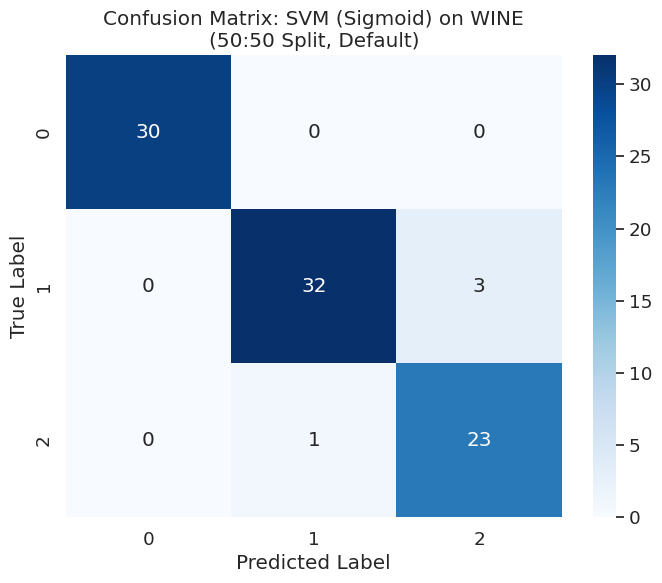

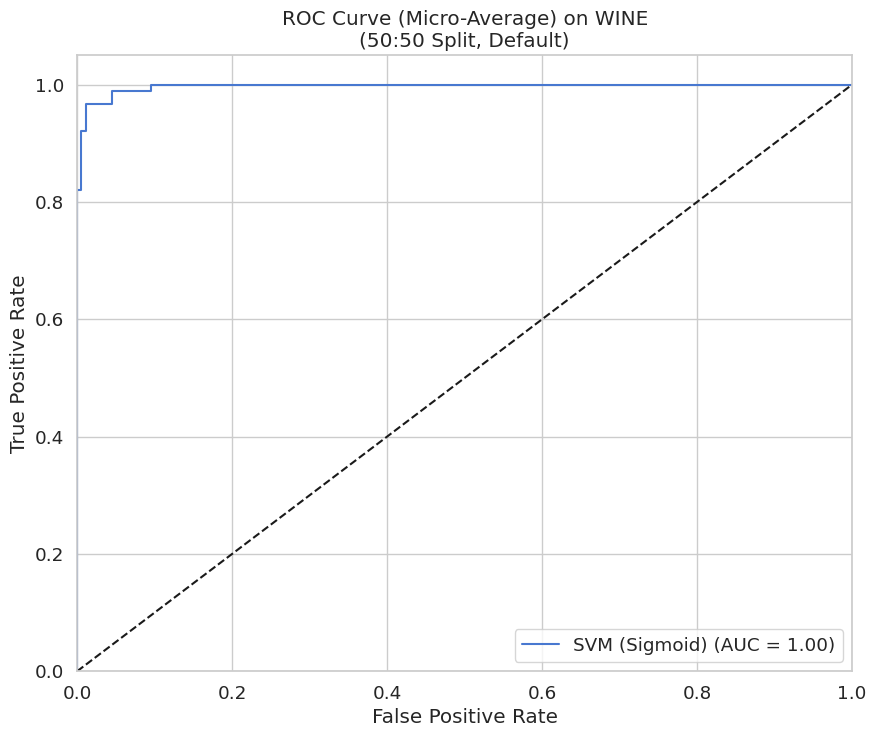


tuned model for 50:50 Split...
Tuning SVM (Sigmoid)...
best parameters for SVM (Sigmoid): {'C': 0.1, 'gamma': 'scale'}
--- Results for SVM (Sigmoid) on WINE (50:50 Split, Tuned) ---
Accuracy: 0.9663
Precision (Weighted): 0.9664
Recall (Weighted): 0.9663
F1-Score (Weighted): 0.9662



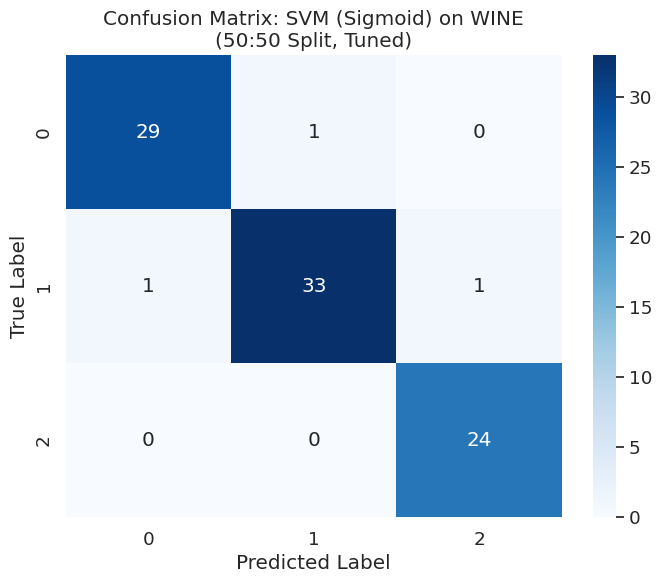

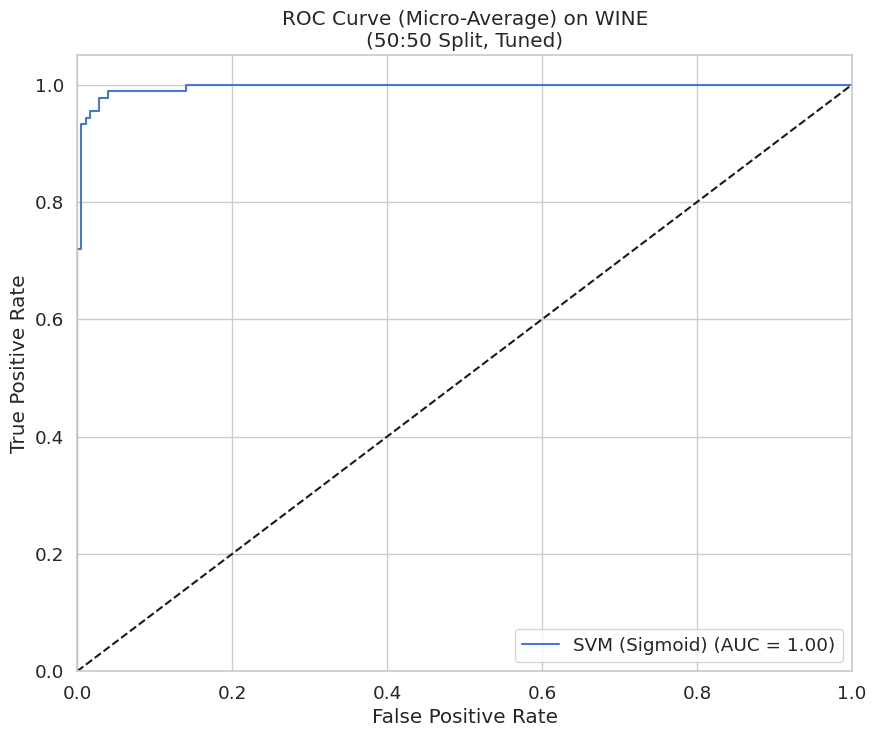


 running not tuned models for 60:40 Split...
--- Results for SVM (Sigmoid) on WINE (60:40 Split, Default) ---
Accuracy: 1.0000
Precision (Weighted): 1.0000
Recall (Weighted): 1.0000
F1-Score (Weighted): 1.0000



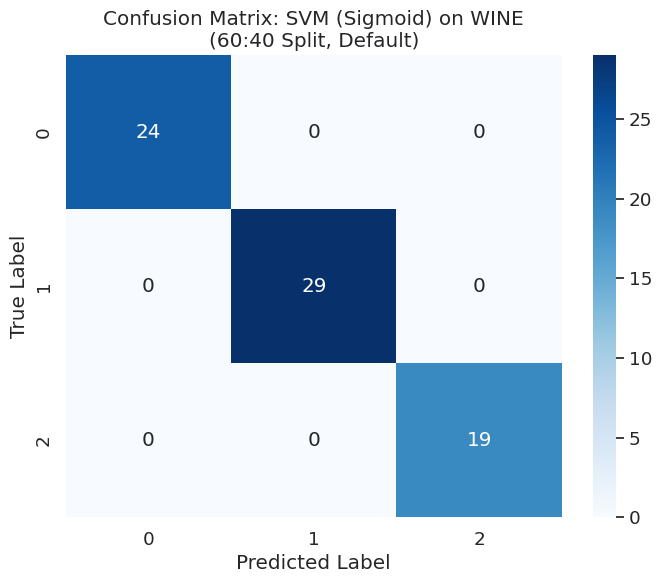

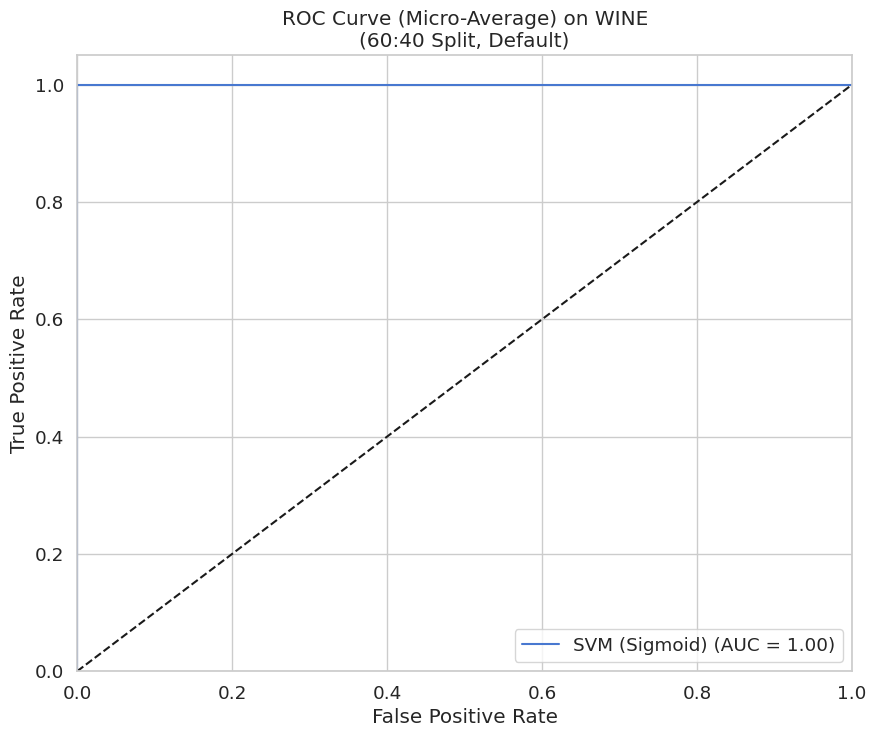


tuned model for 60:40 Split...
Tuning SVM (Sigmoid)...
best parameters for SVM (Sigmoid): {'C': 0.1, 'gamma': 'scale'}
--- Results for SVM (Sigmoid) on WINE (60:40 Split, Tuned) ---
Accuracy: 0.9722
Precision (Weighted): 0.9735
Recall (Weighted): 0.9722
F1-Score (Weighted): 0.9720



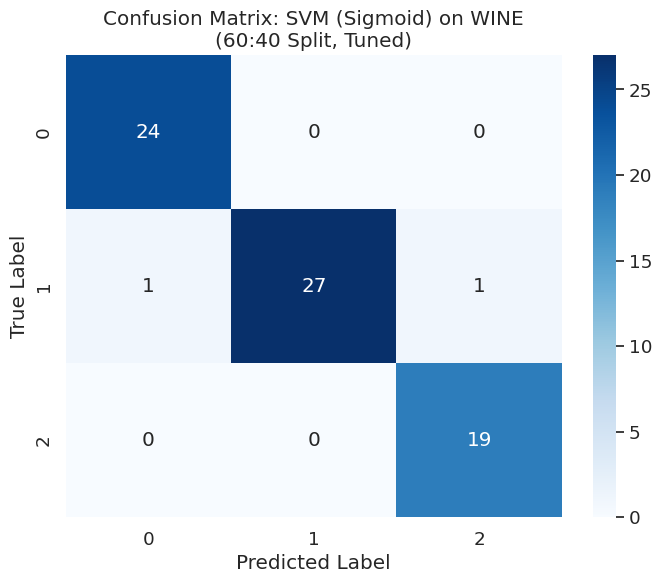

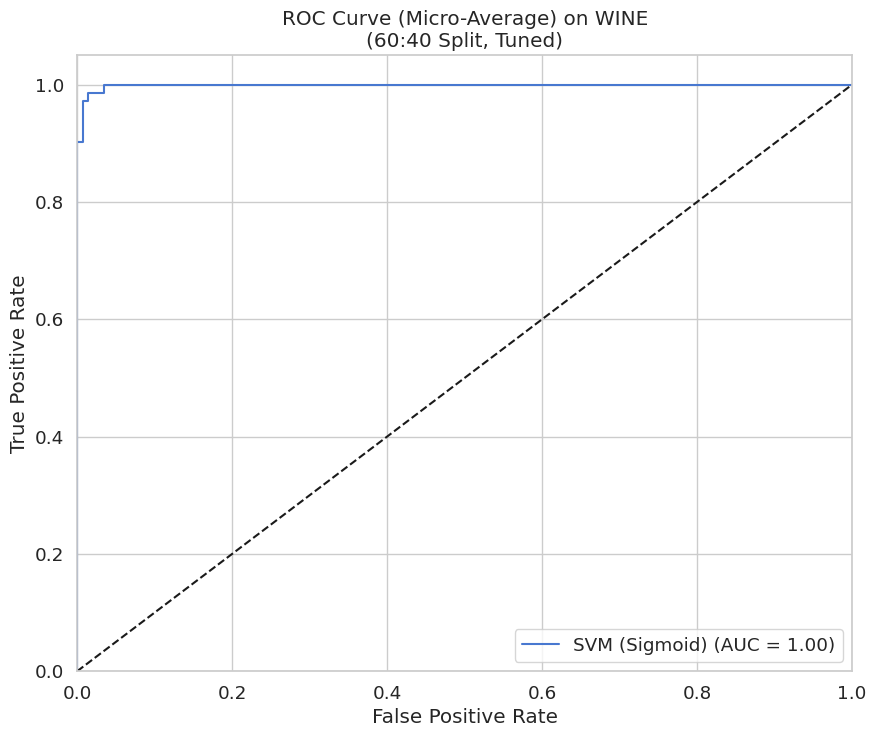


 running not tuned models for 70:30 Split...
--- Results for SVM (Sigmoid) on WINE (70:30 Split, Default) ---
Accuracy: 0.9630
Precision (Weighted): 0.9651
Recall (Weighted): 0.9630
F1-Score (Weighted): 0.9626



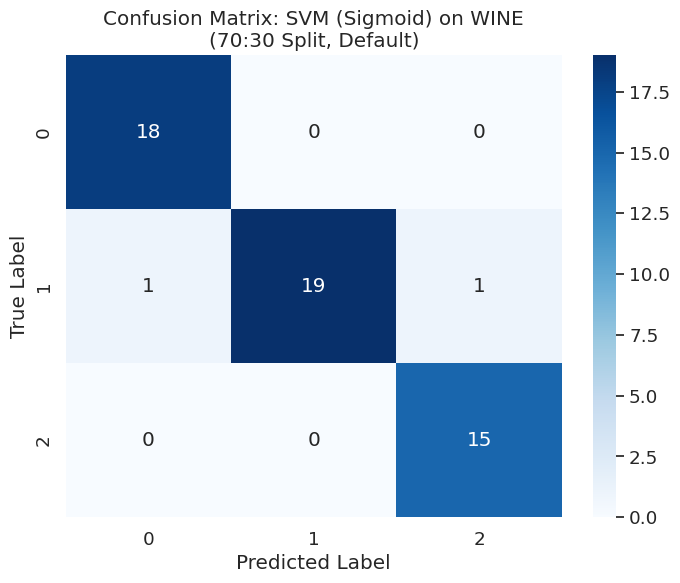

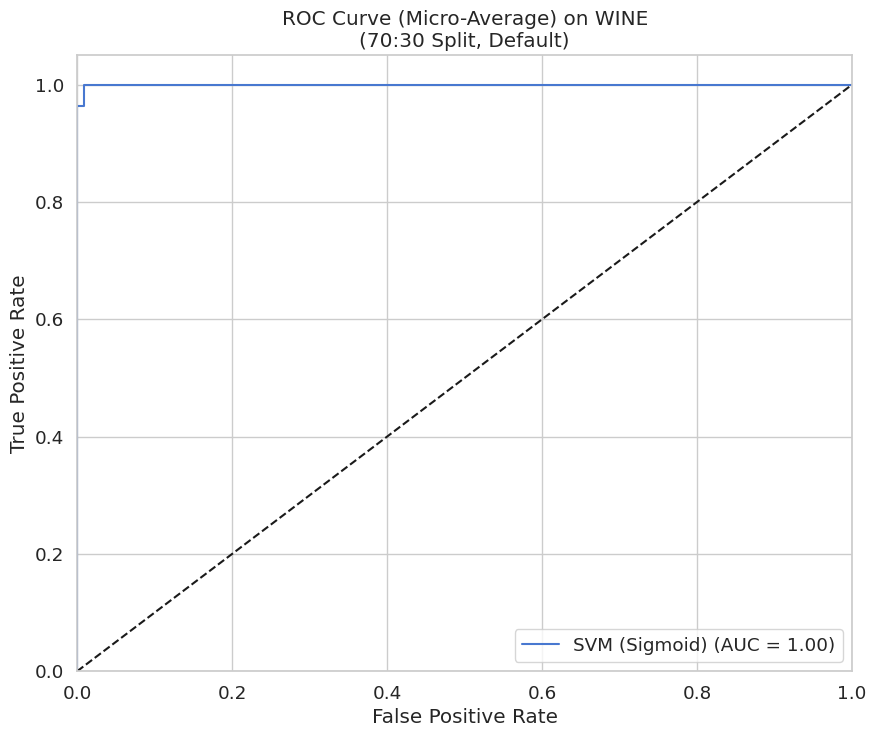


tuned model for 70:30 Split...
Tuning SVM (Sigmoid)...
best parameters for SVM (Sigmoid): {'C': 1, 'gamma': 0.01}
--- Results for SVM (Sigmoid) on WINE (70:30 Split, Tuned) ---
Accuracy: 1.0000
Precision (Weighted): 1.0000
Recall (Weighted): 1.0000
F1-Score (Weighted): 1.0000



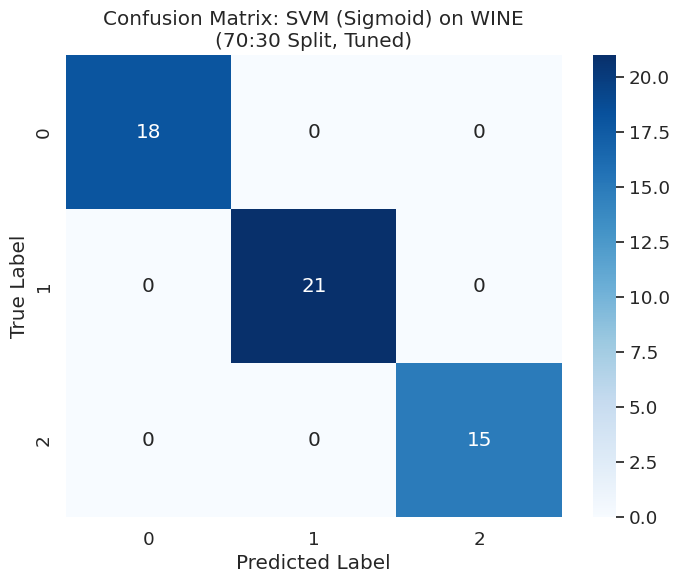

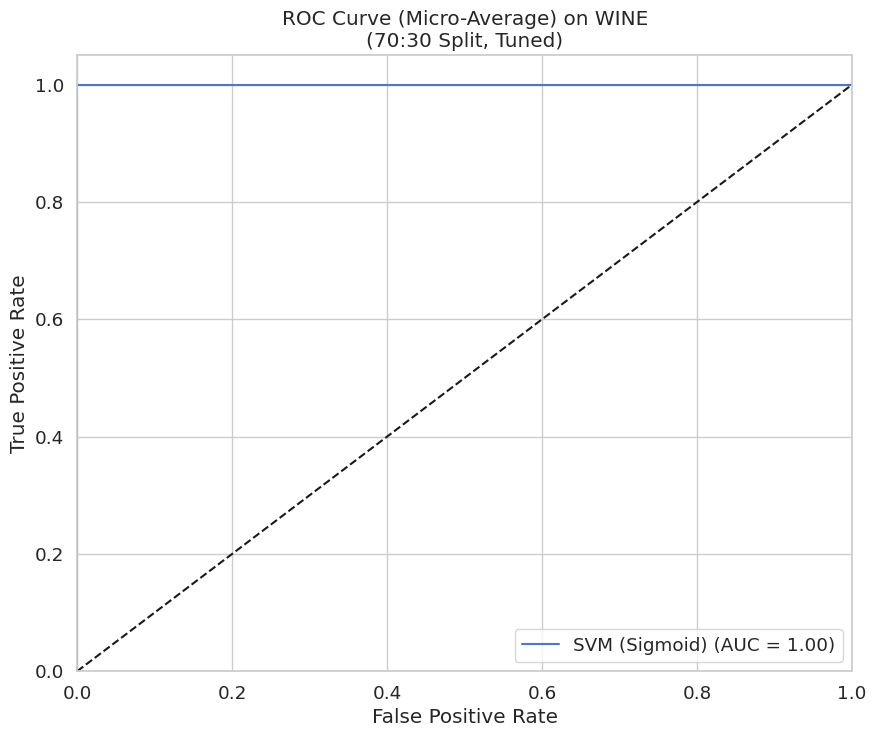


 running not tuned models for 80:20 Split...
--- Results for SVM (Sigmoid) on WINE (80:20 Split, Default) ---
Accuracy: 1.0000
Precision (Weighted): 1.0000
Recall (Weighted): 1.0000
F1-Score (Weighted): 1.0000



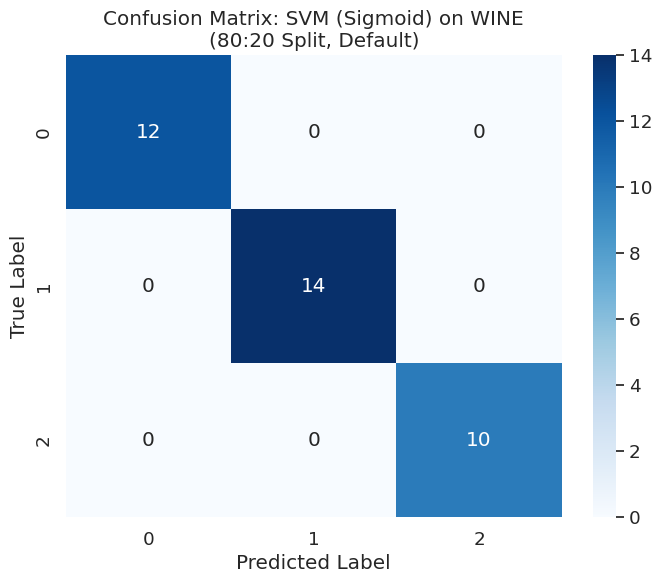

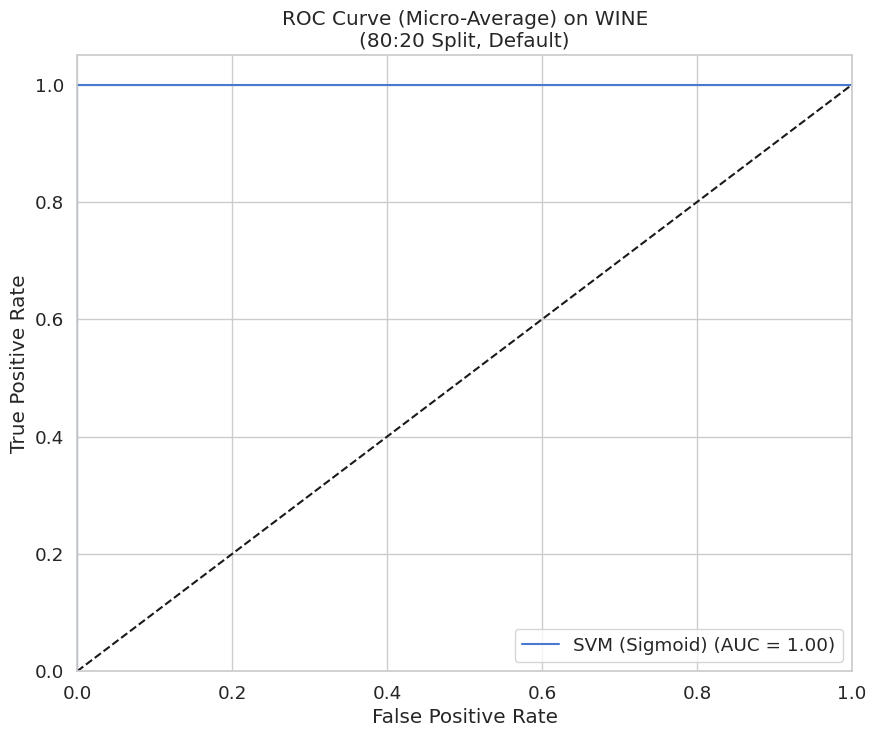


tuned model for 80:20 Split...
Tuning SVM (Sigmoid)...
best parameters for SVM (Sigmoid): {'C': 1, 'gamma': 0.01}
--- Results for SVM (Sigmoid) on WINE (80:20 Split, Tuned) ---
Accuracy: 1.0000
Precision (Weighted): 1.0000
Recall (Weighted): 1.0000
F1-Score (Weighted): 1.0000



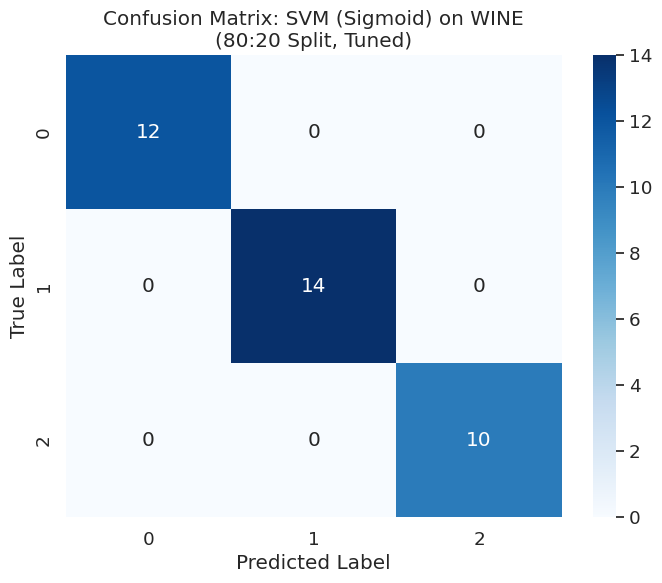

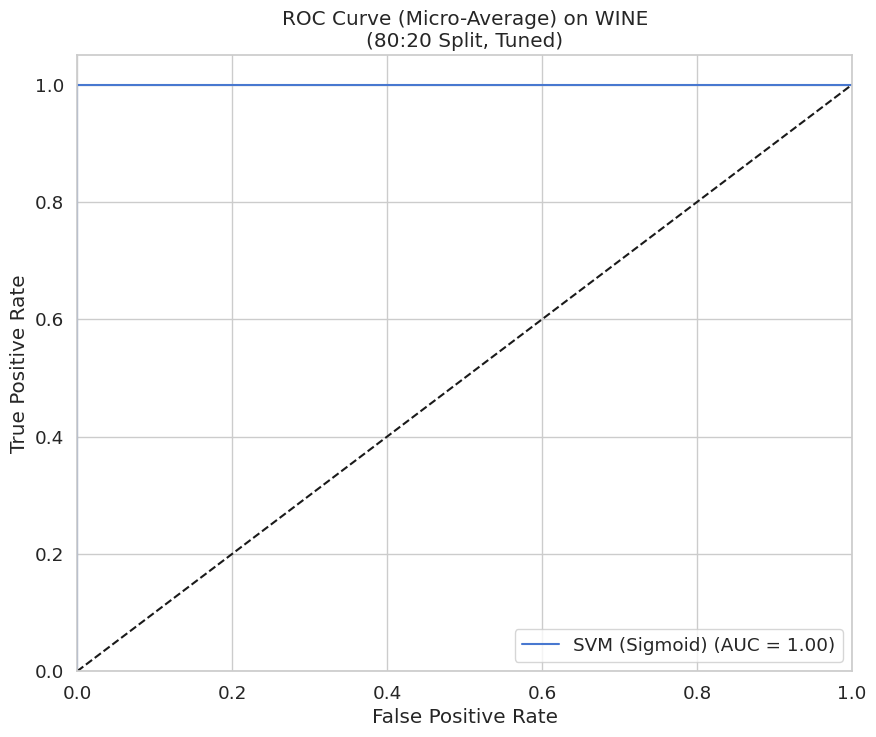


--- Starting for wine dataset with PCA ---
Original features: 13, PCA features: 10

running tuned model for 80:20 Split, PCA...
tuning SVM (Sigmoid) with PCA features...
best parameters for SVM (Sigmoid) on PCA data: {'C': 0.1, 'gamma': 'scale'}
--- Results for SVM (Sigmoid) on WINE (80:20 Split, PCA, Tuned) ---
Accuracy: 0.9663
Precision (Weighted): 0.9664
Recall (Weighted): 0.9663
F1-Score (Weighted): 0.9662



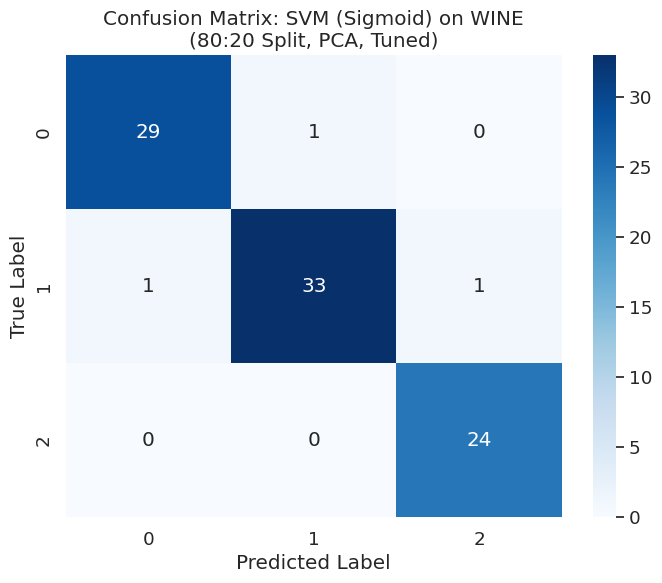

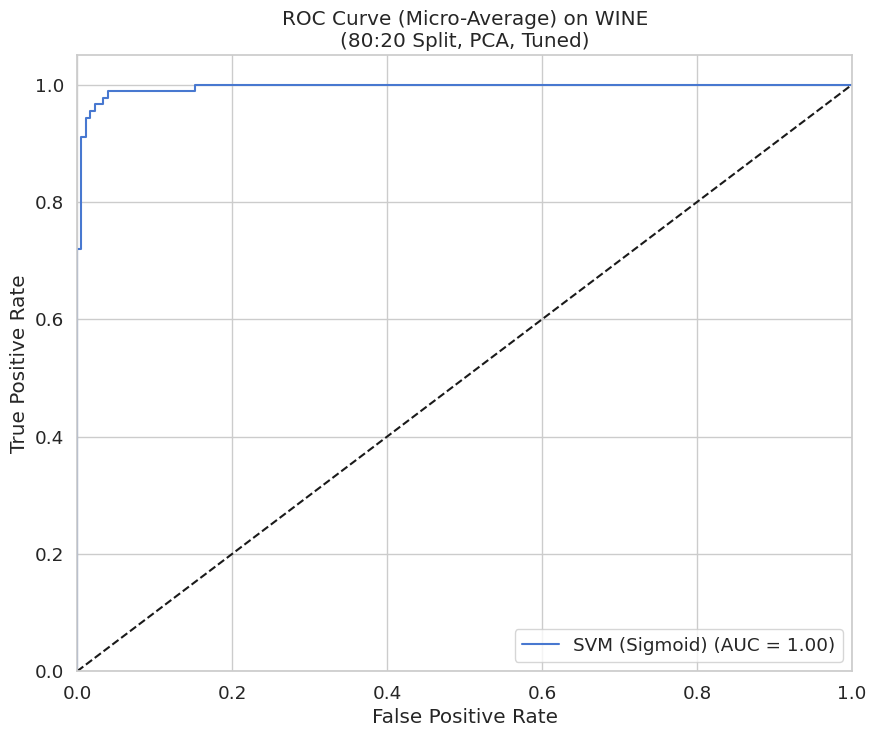

Original features: 13, PCA features: 10

running tuned model for 80:20 Split, PCA...
tuning SVM (Sigmoid) with PCA features...
best parameters for SVM (Sigmoid) on PCA data: {'C': 0.1, 'gamma': 'scale'}
--- Results for SVM (Sigmoid) on WINE (80:20 Split, PCA, Tuned) ---
Accuracy: 0.9722
Precision (Weighted): 0.9735
Recall (Weighted): 0.9722
F1-Score (Weighted): 0.9720



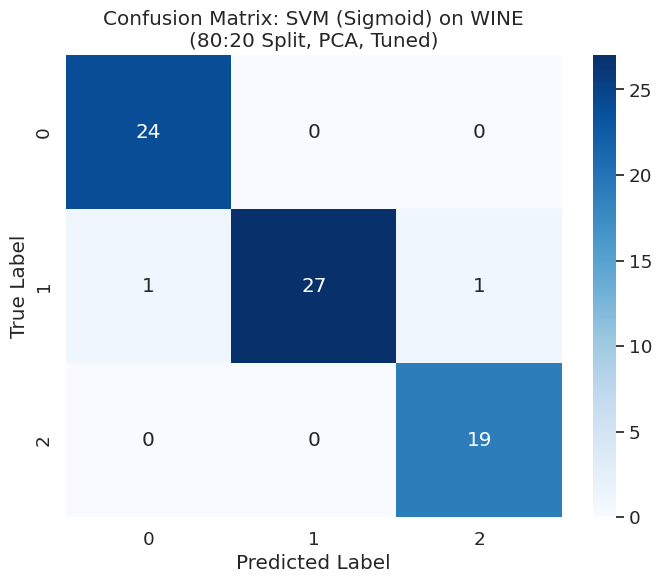

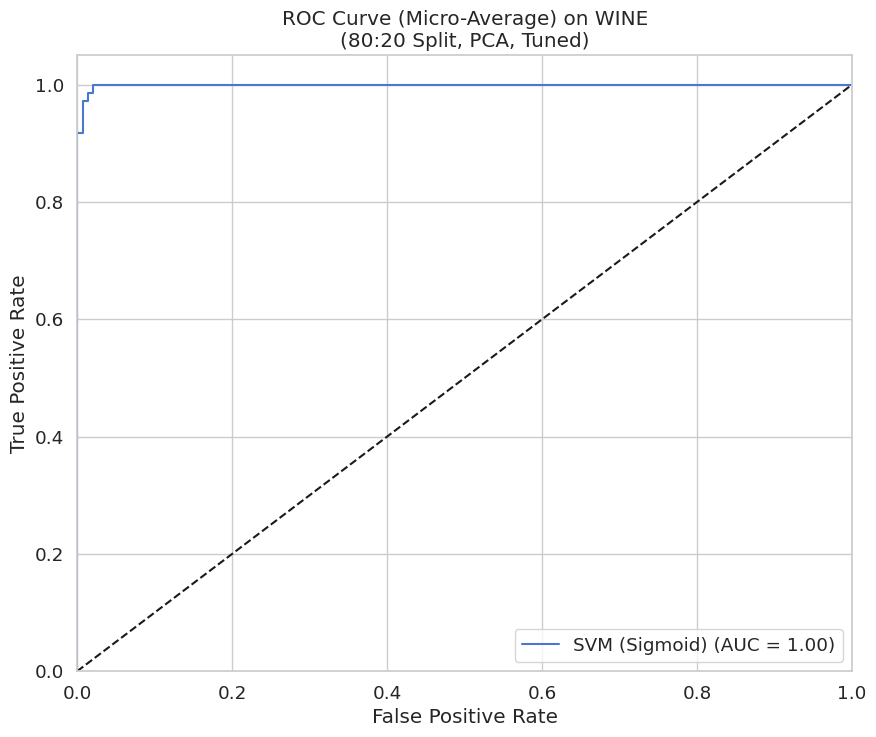

Original features: 13, PCA features: 10

running tuned model for 80:20 Split, PCA...
tuning SVM (Sigmoid) with PCA features...
best parameters for SVM (Sigmoid) on PCA data: {'C': 1, 'gamma': 'scale'}
--- Results for SVM (Sigmoid) on WINE (80:20 Split, PCA, Tuned) ---
Accuracy: 0.9630
Precision (Weighted): 0.9651
Recall (Weighted): 0.9630
F1-Score (Weighted): 0.9626



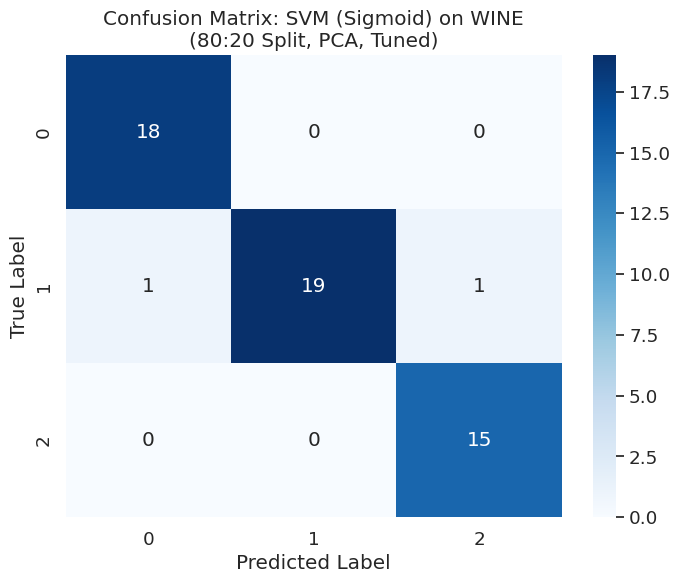

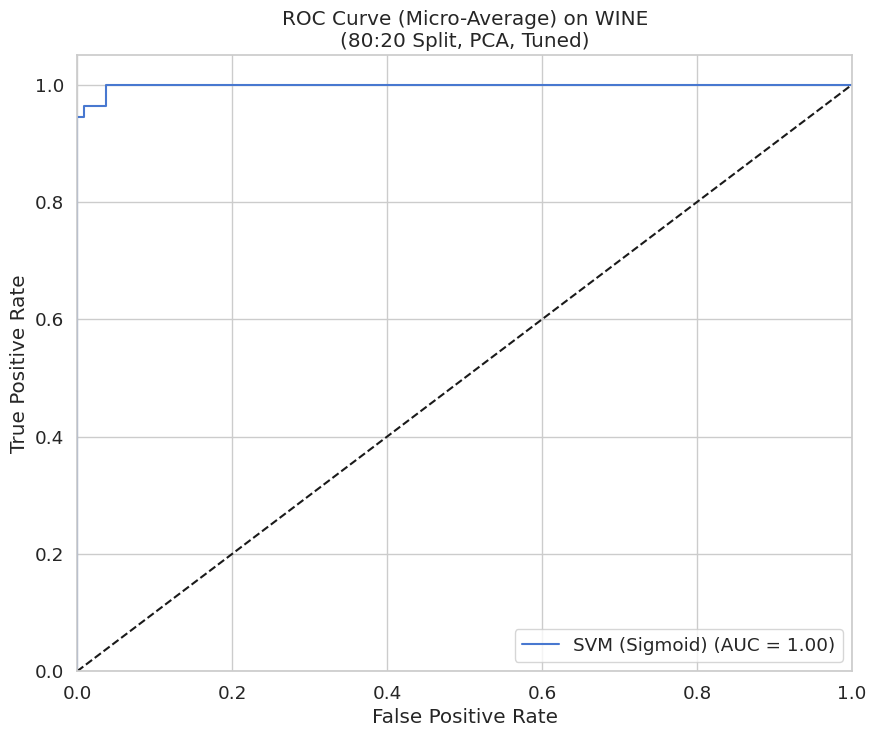

Original features: 13, PCA features: 10

running tuned model for 80:20 Split, PCA...
tuning SVM (Sigmoid) with PCA features...
best parameters for SVM (Sigmoid) on PCA data: {'C': 1, 'gamma': 0.01}
--- Results for SVM (Sigmoid) on WINE (80:20 Split, PCA, Tuned) ---
Accuracy: 1.0000
Precision (Weighted): 1.0000
Recall (Weighted): 1.0000
F1-Score (Weighted): 1.0000



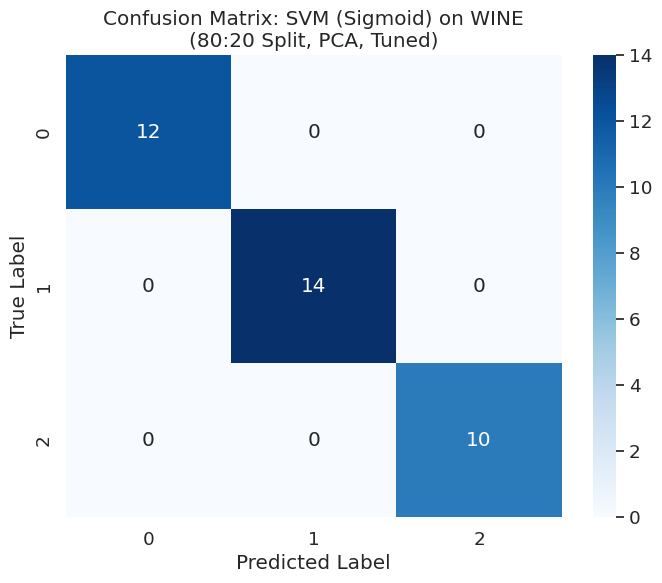

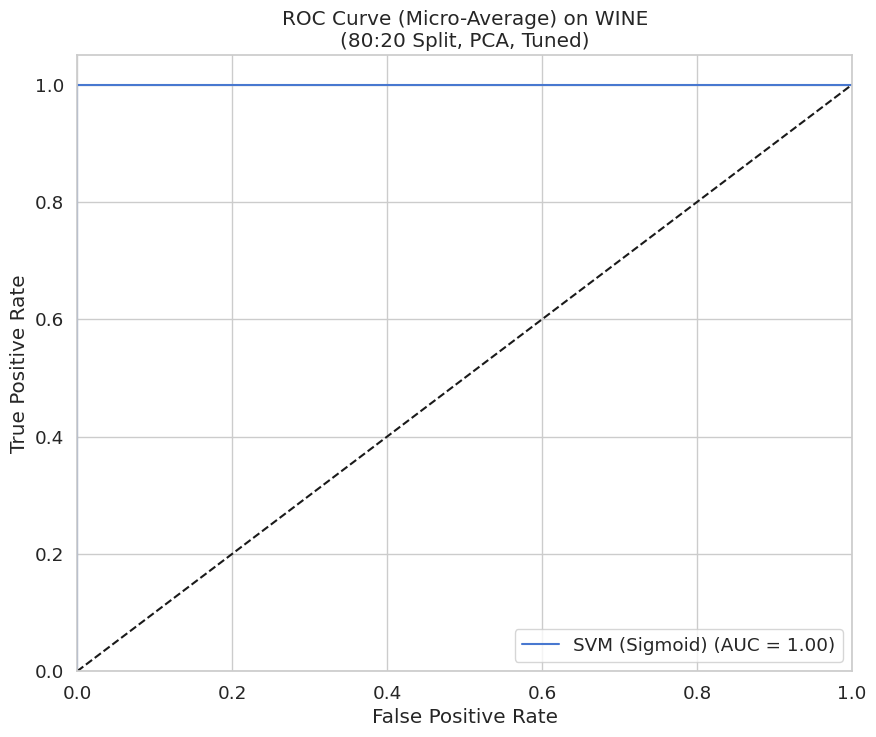

In [ ]:
def svm_sigmoid_complete(dataset, dataset_name):

    X, y = wine_dataset.data, wine_dataset.target
    results_list = []

    classifiers = {
          "SVM (Sigmoid)": SVC(kernel='sigmoid', probability=True, random_state=42),

    }

    param_grids = {
        "SVM (Sigmoid)": {'C': [0.1, 1, 10], 'gamma': [0.001, 0.01, 'scale']},
    }

    print(f"Experiments for wine dataset on Original Features ---")
    for split in splits:
        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=split, random_state=42, stratify=y
        )

        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)

        split_note = f"{int(100-split*100)}:{int(split*100)} Split"

        # without tuning
        print(f"\n running not tuned models for {split_note}...")
        trained_models_default = {}
        for name, model in classifiers.items():
            model.fit(X_train_scaled, y_train)
            trained_models_default[name] = model
            evaluate_model(model, X_test_scaled, y_test, name, dataset_name, split, f"{split_note}, Default", results_list)
        plot_roc_curves(trained_models_default, X_test_scaled, y_test, dataset_name, f"{split_note}, Default")

        # with tuning
        print(f"\ntuned model for {split_note}...")
        trained_models_tuned = {}
        for name, model in classifiers.items():
            print(f"Tuning {name}...")
            grid_search = GridSearchCV(model, param_grids[name], cv=5, n_jobs=-1, scoring='accuracy')
            grid_search.fit(X_train_scaled, y_train)
            best_model = grid_search.best_estimator_
            trained_models_tuned[name] = best_model
            print(f"best parameters for {name}: {grid_search.best_params_}")
            evaluate_model(best_model, X_test_scaled, y_test, name, dataset_name, split, f"{split_note}, Tuned", results_list)
        plot_roc_curves(trained_models_tuned, X_test_scaled, y_test, dataset_name, f"{split_note}, Tuned")

    # WITH PCA
    print(f"\n--- Starting for wine dataset with PCA ---")


    for split in splits:
      X_train, X_test, y_train, y_test = train_test_split(
          X, y, test_size=split, random_state=42, stratify=y
      )

      scaler = StandardScaler()
      X_train_scaled = scaler.fit_transform(X_train)
      X_test_scaled = scaler.transform(X_test)

      # pca with 95% variance
      pca = PCA(n_components=0.95)
      X_train_pca = pca.fit_transform(X_train_scaled)
      X_test_pca = pca.transform(X_test_scaled)
      print(f"Original features: {X_train.shape[1]}, PCA features: {X_train_pca.shape[1]}")

      pca_note = f"80:20 Split, PCA"

      # Model with tuning on PCA
      print(f"\nrunning tuned model for {pca_note}...")
      trained_models_pca = {}
      for name, model in classifiers.items():
          print(f"tuning {name} with PCA features...")
          grid_search = GridSearchCV(model, param_grids[name], cv=5, n_jobs=-1, scoring='accuracy')
          grid_search.fit(X_train_pca, y_train)
          best_model = grid_search.best_estimator_
          trained_models_pca[name] = best_model
          print(f"best parameters for {name} on PCA data: {grid_search.best_params_}")
          evaluate_model(best_model, X_test_pca, y_test, name, dataset_name, split, f"{pca_note}, Tuned", results_list)
      plot_roc_curves(trained_models_pca, X_test_pca, y_test, dataset_name, f"{pca_note}, Tuned")

    return pd.DataFrame(results_list)
svm_sigmoid_df = svm_sigmoid_complete(wine_dataset,"WINE")


 Results Summary for SVM (Sigmoid) on WINE


,Dataset,Model,Train-Test Split,Tuning,PCA,Accuracy,Precision,Recall,F1-Score,Inference Time (s)
0,WINE,SVM (Sigmoid),50:50,Default,No,0.9551,0.9570,0.9551,0.9553,0.0005
1,WINE,SVM (Sigmoid),50:50,Tuned,No,0.9663,0.9664,0.9663,0.9662,0.0013
2,WINE,SVM (Sigmoid),60:40,Default,No,1.0000,1.0000,1.0000,1.0000,0.0008
3,WINE,SVM (Sigmoid),60:40,Tuned,No,0.9722,0.9735,0.9722,0.9720,0.0009
4,WINE,SVM (Sigmoid),70:30,Default,No,0.9630,0.9651,0.9630,0.9626,0.0009
5,WINE,SVM (Sigmoid),70:30,Tuned,No,1.0000,1.0000,1.0000,1.0000,0.0008
6,WINE,SVM (Sigmoid),80:20,Default,No,1.0000,1.0000,1.0000,1.0000,0.0007
7,WINE,SVM (Sigmoid),80:20,Tuned,No,1.0000,1.0000,1.0000,1.0000,0.0007
8,WINE,SVM (Sigmoid),50:50,Tuned,Yes,0.9663,0.9664,0.9663,0.9662,0.0017
9,WINE,SVM (Sigmoid),60:40,Tuned,Yes,0.9722,0.9735,0.9722,0.9720,0.0009


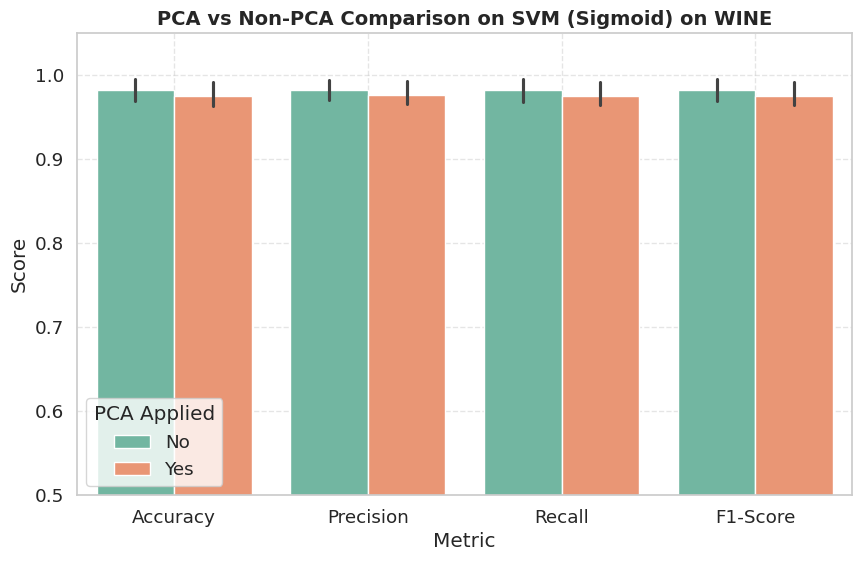

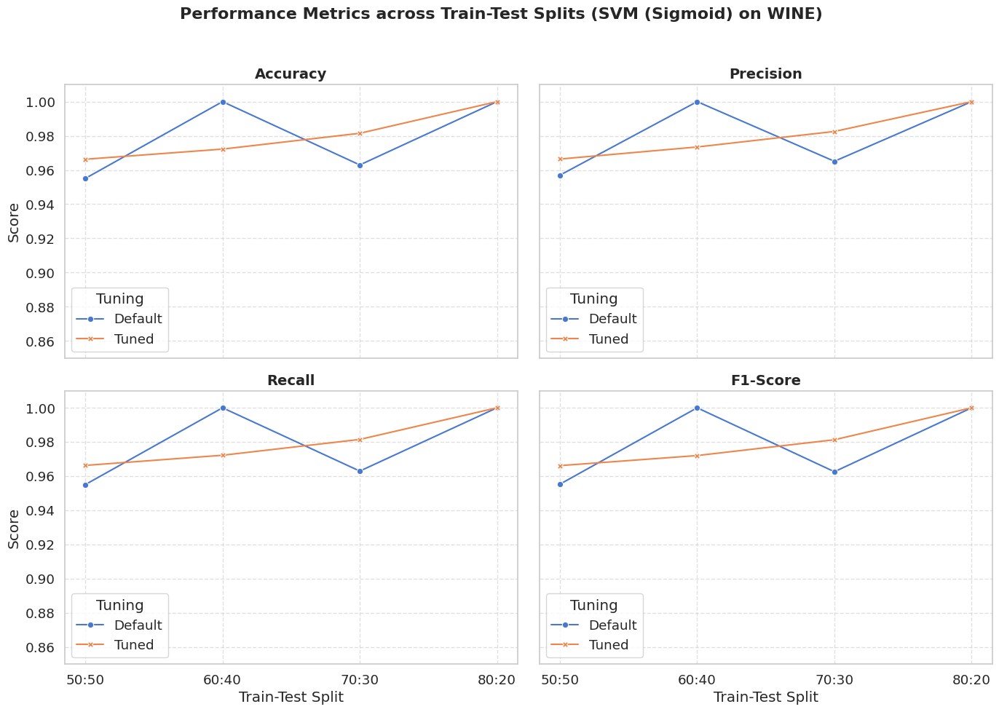

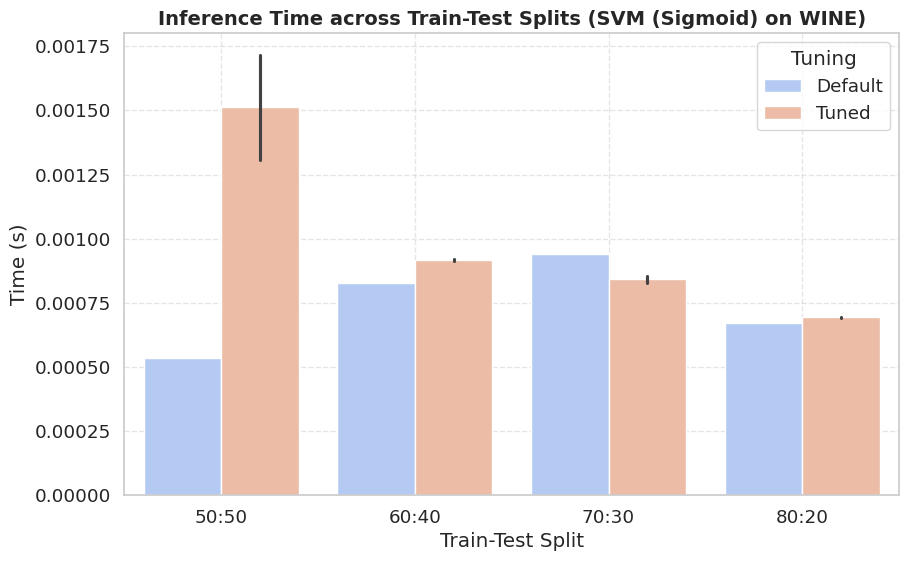

In [ ]:
analyze_results(svm_sigmoid_df, "SVM (Sigmoid) on WINE")

Experiments for wine dataset on Original Features ---

 running not tuned models for 50:50 Split...
--- Results for MLP on WINE (50:50 Split, Default) ---
Accuracy: 0.9551
Precision (Weighted): 0.9558
Recall (Weighted): 0.9551
F1-Score (Weighted): 0.9548



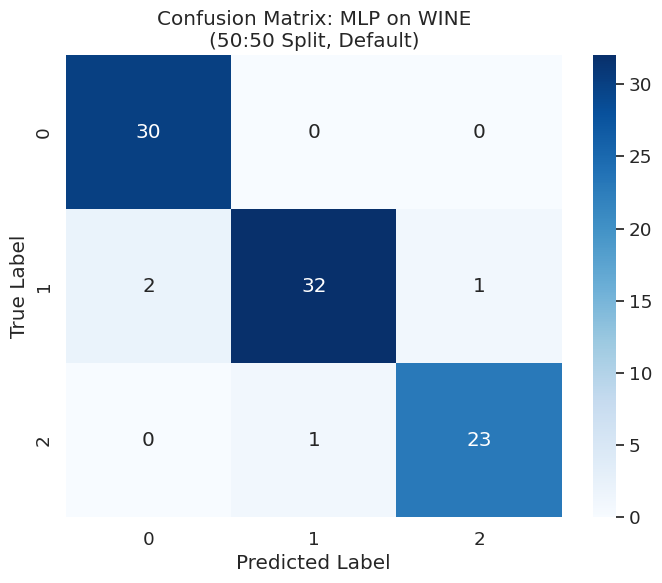

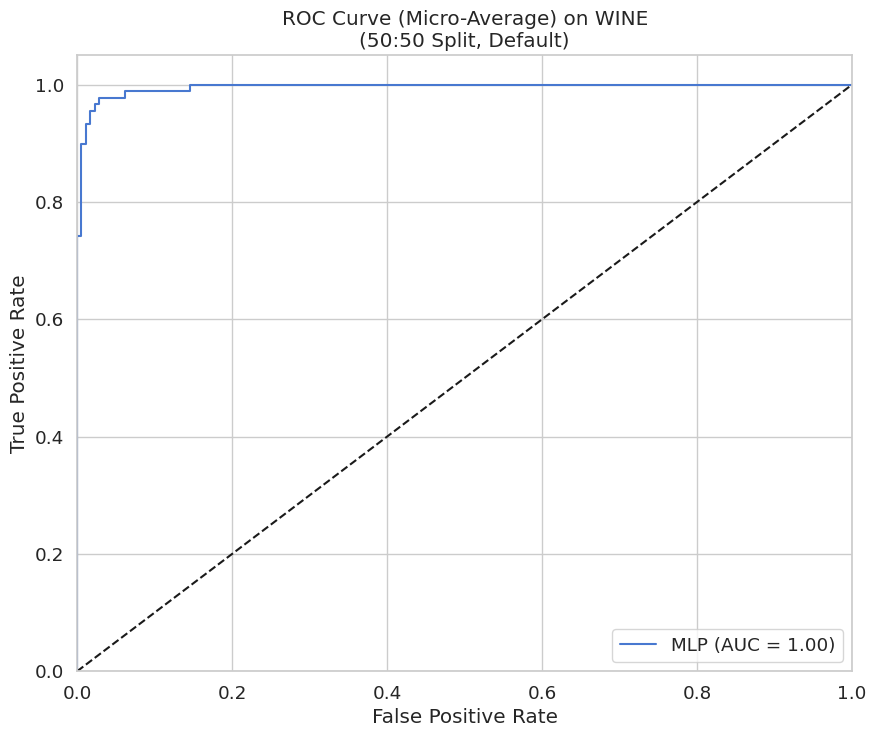


tuned model for 50:50 Split...
Tuning MLP...
best parameters for MLP: {'hidden_layer_sizes': (100,), 'learning_rate_init': 0.001}
--- Results for MLP on WINE (50:50 Split, Tuned) ---
Accuracy: 0.9551
Precision (Weighted): 0.9558
Recall (Weighted): 0.9551
F1-Score (Weighted): 0.9548



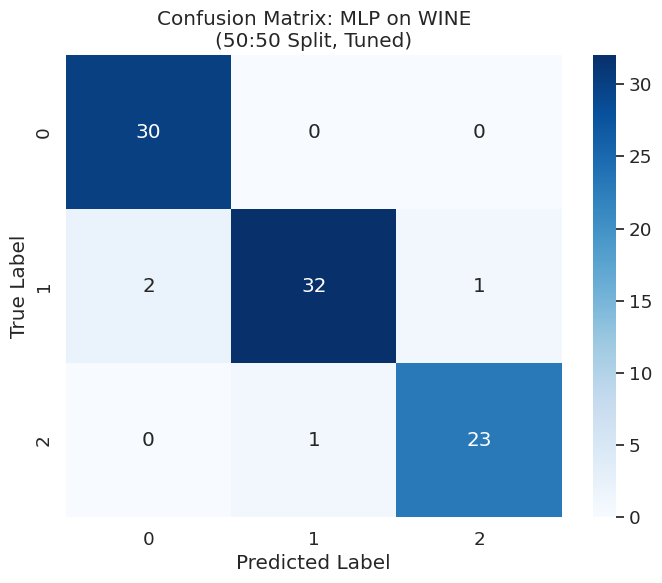

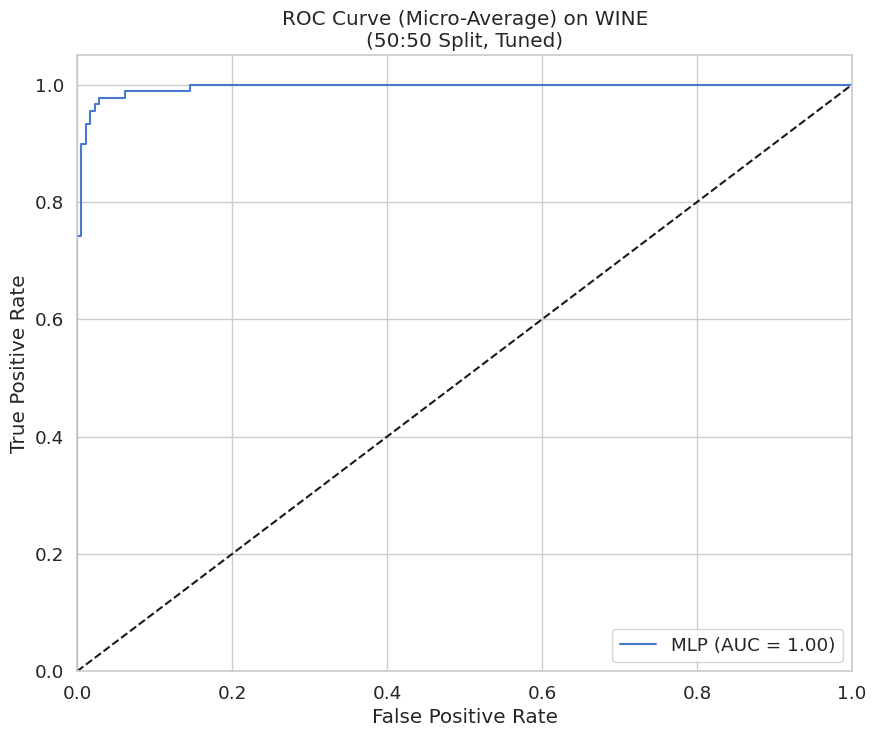


 running not tuned models for 60:40 Split...
--- Results for MLP on WINE (60:40 Split, Default) ---
Accuracy: 0.9722
Precision (Weighted): 0.9744
Recall (Weighted): 0.9722
F1-Score (Weighted): 0.9723



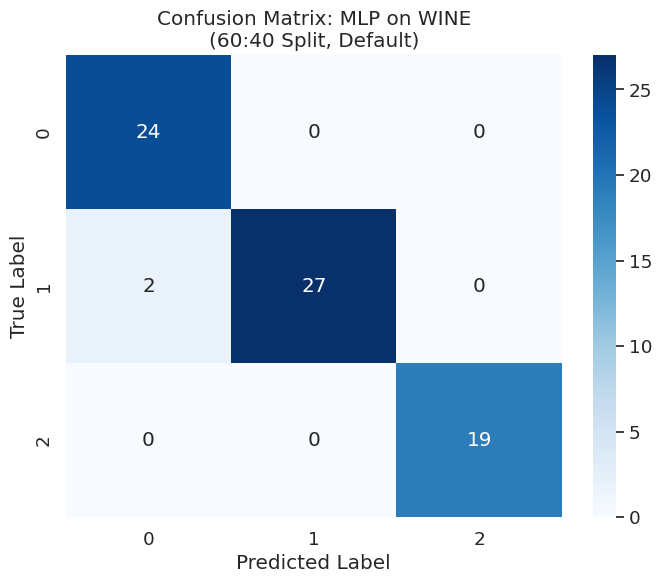

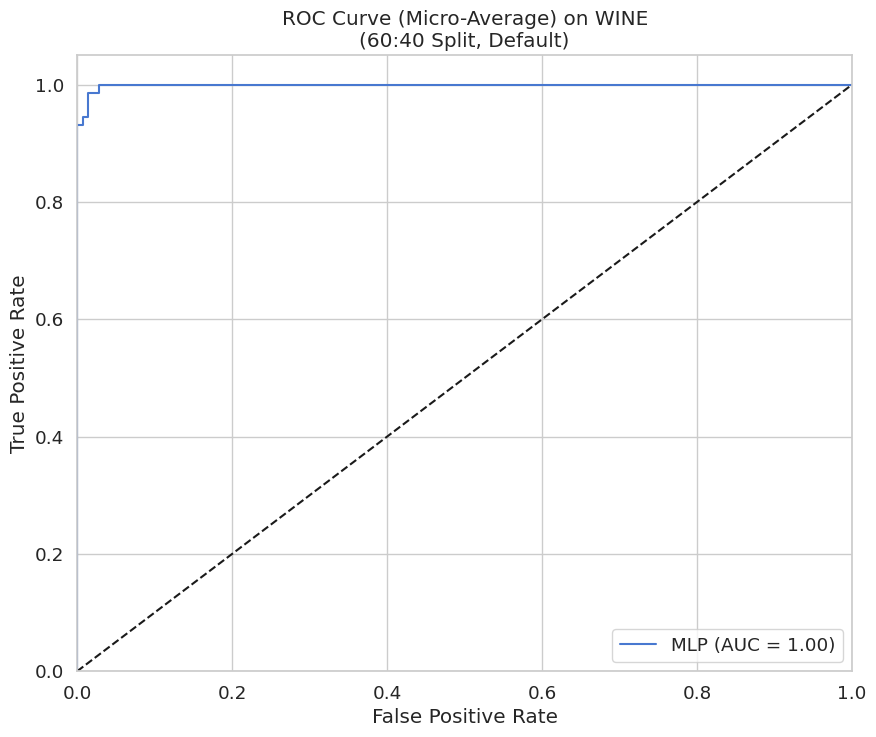


tuned model for 60:40 Split...
Tuning MLP...
best parameters for MLP: {'hidden_layer_sizes': (100,), 'learning_rate_init': 0.001}
--- Results for MLP on WINE (60:40 Split, Tuned) ---
Accuracy: 0.9722
Precision (Weighted): 0.9744
Recall (Weighted): 0.9722
F1-Score (Weighted): 0.9723



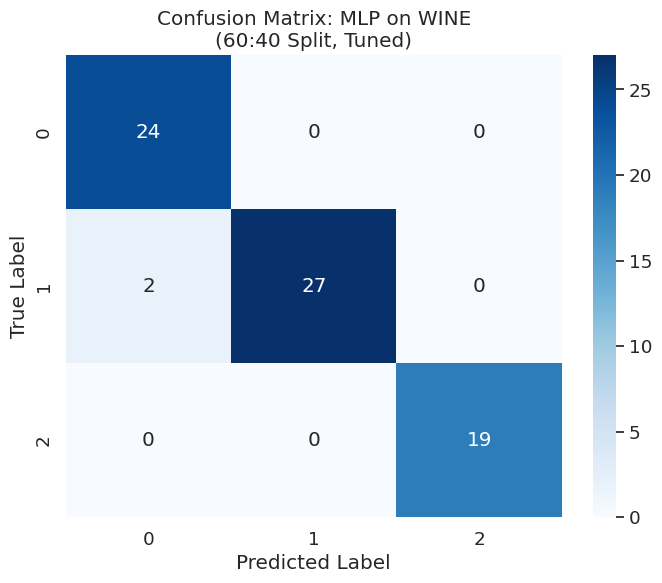

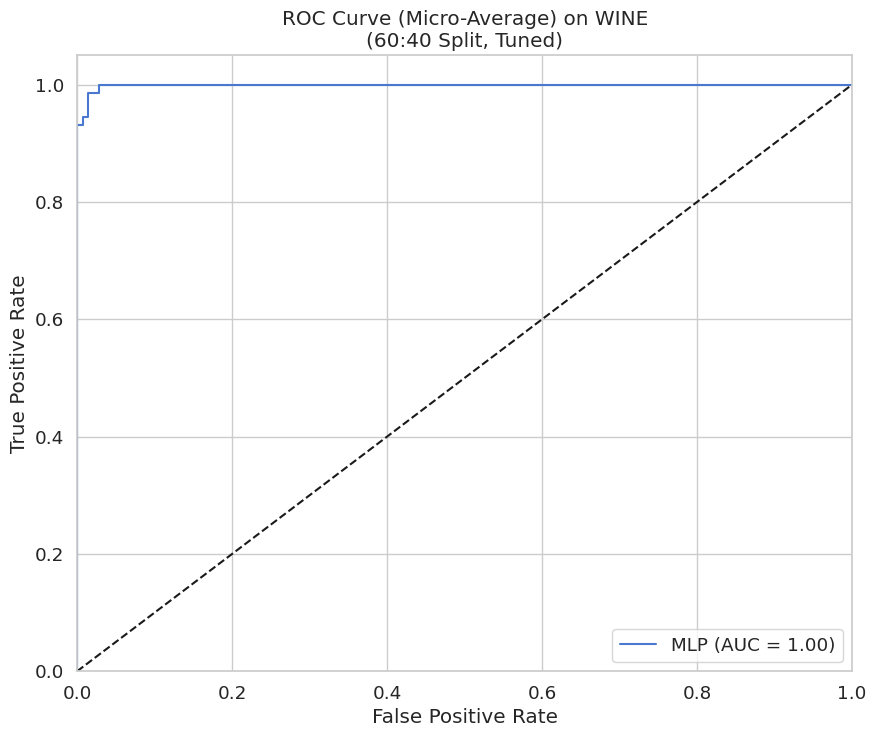


 running not tuned models for 70:30 Split...
--- Results for MLP on WINE (70:30 Split, Default) ---
Accuracy: 1.0000
Precision (Weighted): 1.0000
Recall (Weighted): 1.0000
F1-Score (Weighted): 1.0000



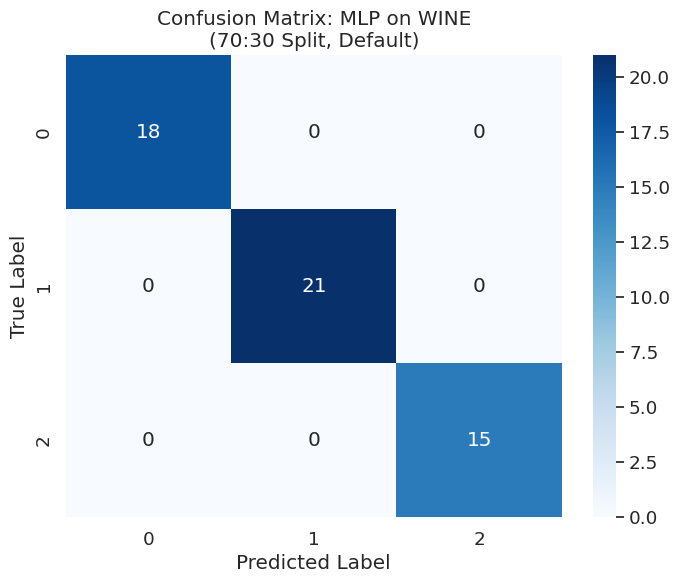

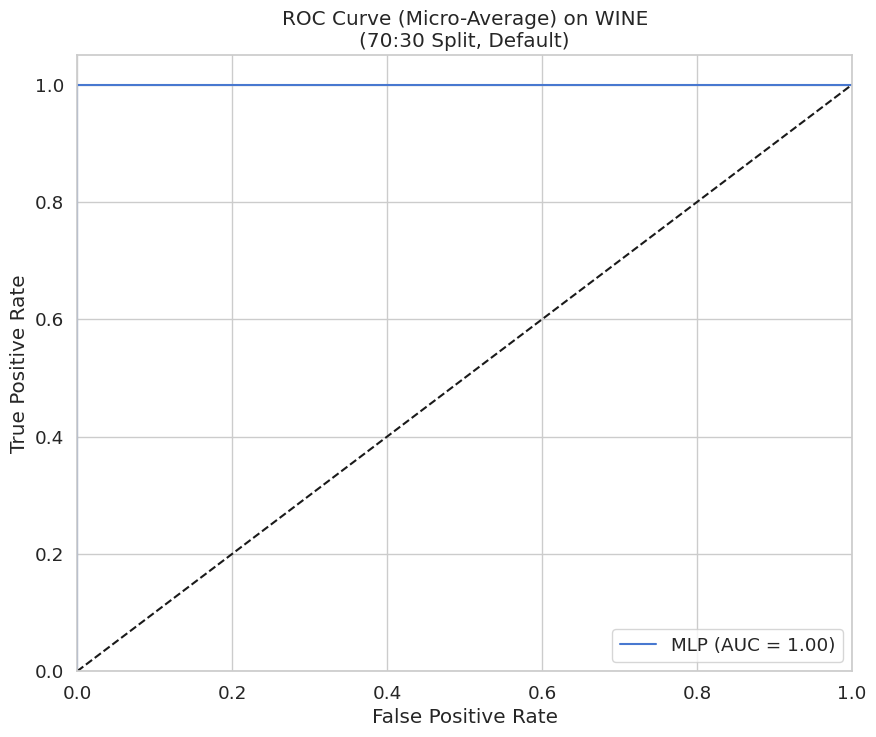


tuned model for 70:30 Split...
Tuning MLP...
best parameters for MLP: {'hidden_layer_sizes': (100,), 'learning_rate_init': 0.001}
--- Results for MLP on WINE (70:30 Split, Tuned) ---
Accuracy: 1.0000
Precision (Weighted): 1.0000
Recall (Weighted): 1.0000
F1-Score (Weighted): 1.0000



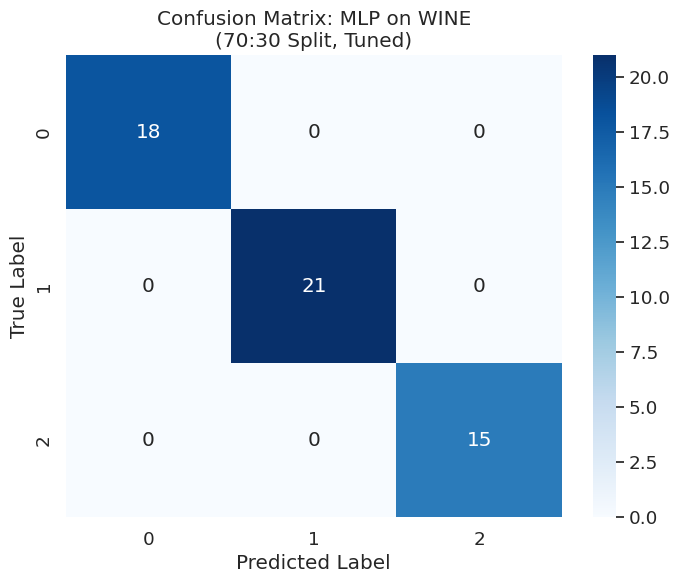

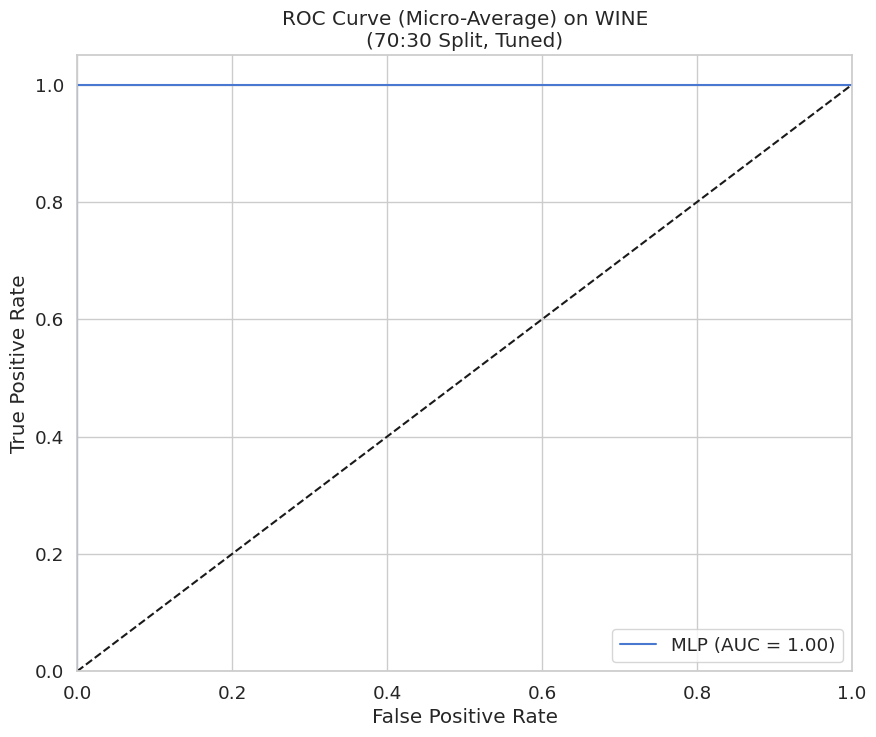


 running not tuned models for 80:20 Split...
--- Results for MLP on WINE (80:20 Split, Default) ---
Accuracy: 0.9722
Precision (Weighted): 0.9741
Recall (Weighted): 0.9722
F1-Score (Weighted): 0.9720



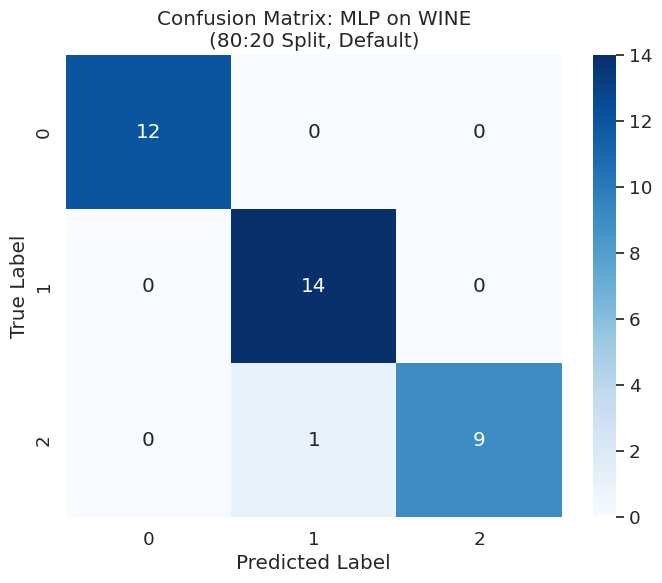

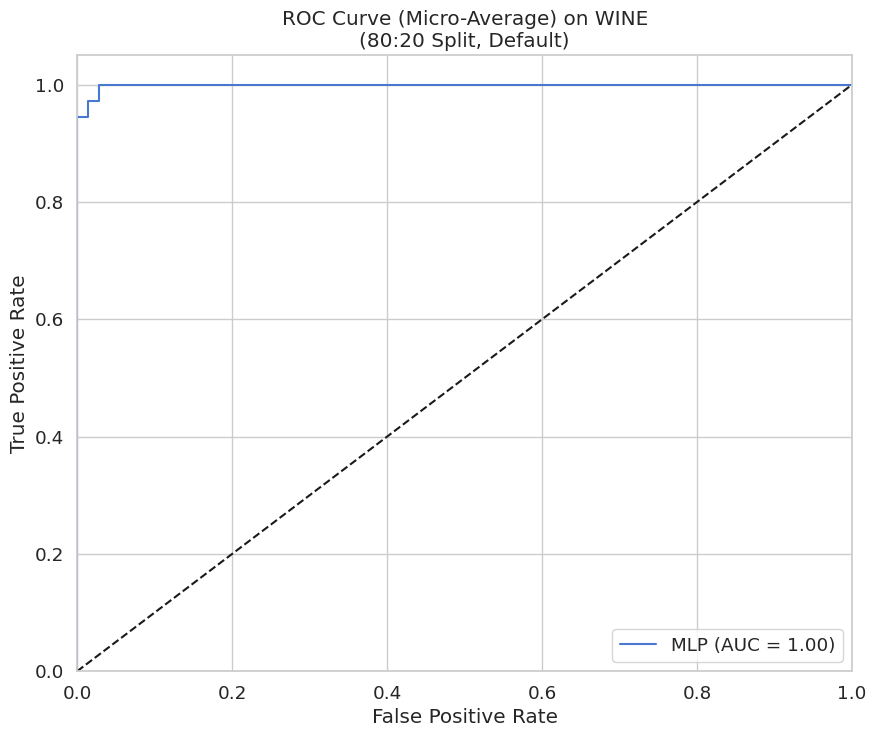


tuned model for 80:20 Split...
Tuning MLP...
best parameters for MLP: {'hidden_layer_sizes': (50,), 'learning_rate_init': 0.01}
--- Results for MLP on WINE (80:20 Split, Tuned) ---
Accuracy: 0.9444
Precision (Weighted): 0.9466
Recall (Weighted): 0.9444
F1-Score (Weighted): 0.9443



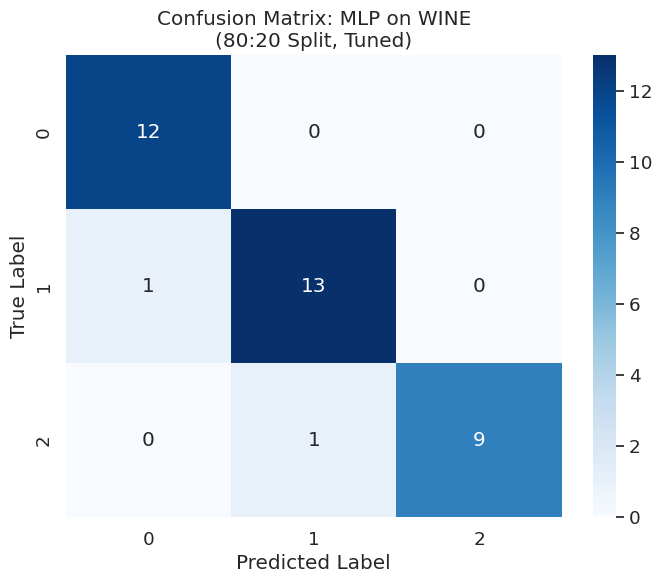

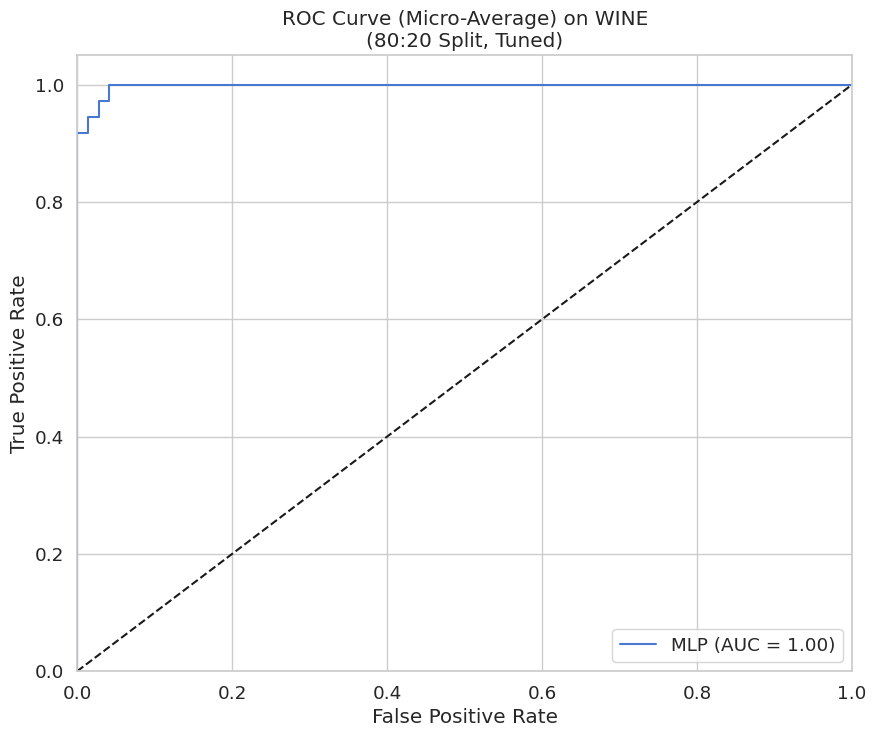


--- Starting for wine dataset with PCA ---
Original features: 13, PCA features: 10

running tuned model for 80:20 Split, PCA...
tuning MLP with PCA features...
best parameters for MLP on PCA data: {'hidden_layer_sizes': (50,), 'learning_rate_init': 0.01}
--- Results for MLP on WINE (80:20 Split, PCA, Tuned) ---
Accuracy: 0.9551
Precision (Weighted): 0.9549
Recall (Weighted): 0.9551
F1-Score (Weighted): 0.9548



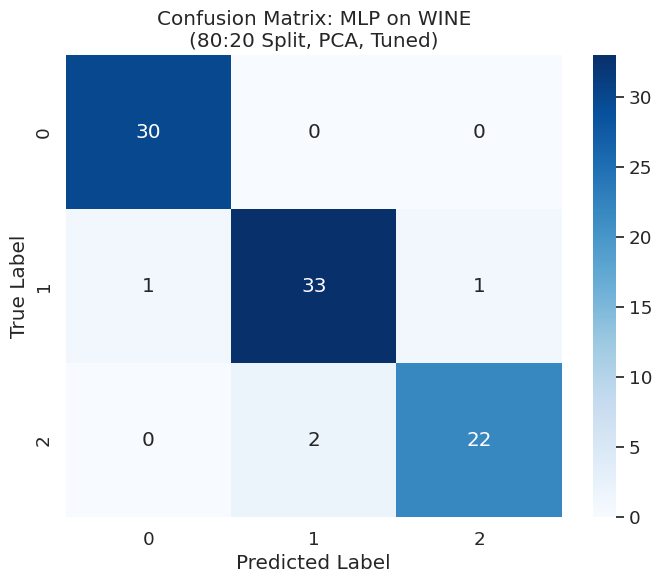

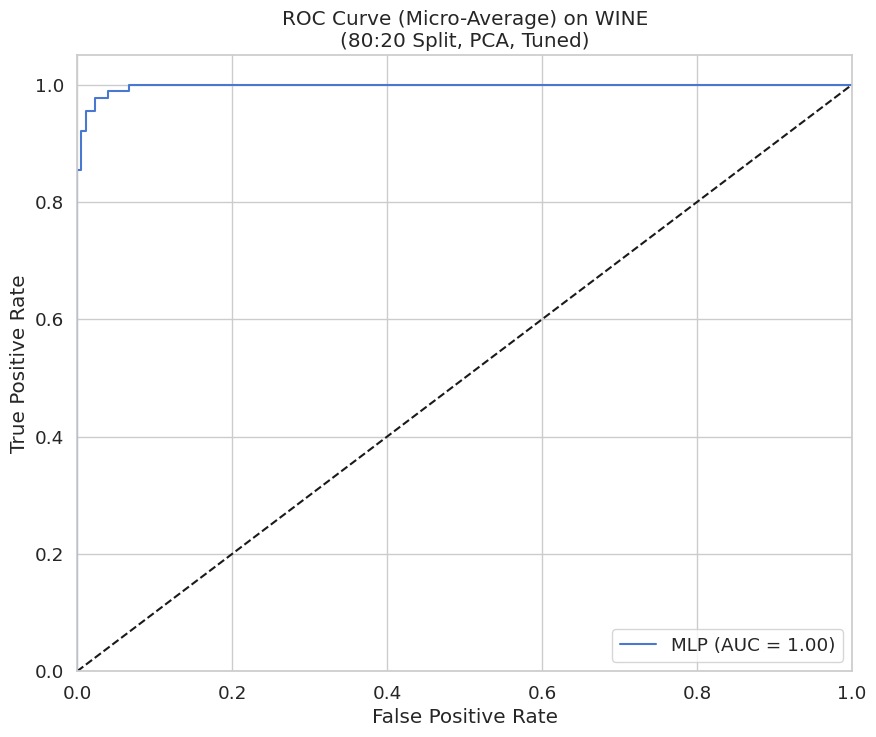

Original features: 13, PCA features: 10

running tuned model for 80:20 Split, PCA...
tuning MLP with PCA features...
best parameters for MLP on PCA data: {'hidden_layer_sizes': (100,), 'learning_rate_init': 0.001}
--- Results for MLP on WINE (80:20 Split, PCA, Tuned) ---
Accuracy: 0.9722
Precision (Weighted): 0.9728
Recall (Weighted): 0.9722
F1-Score (Weighted): 0.9722



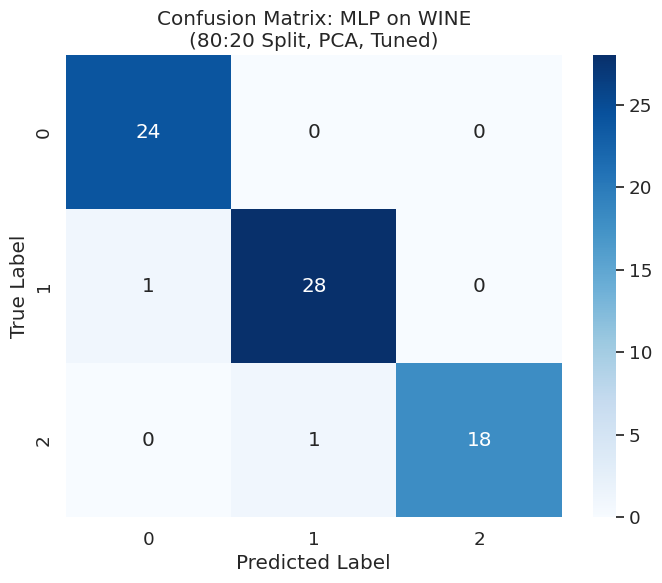

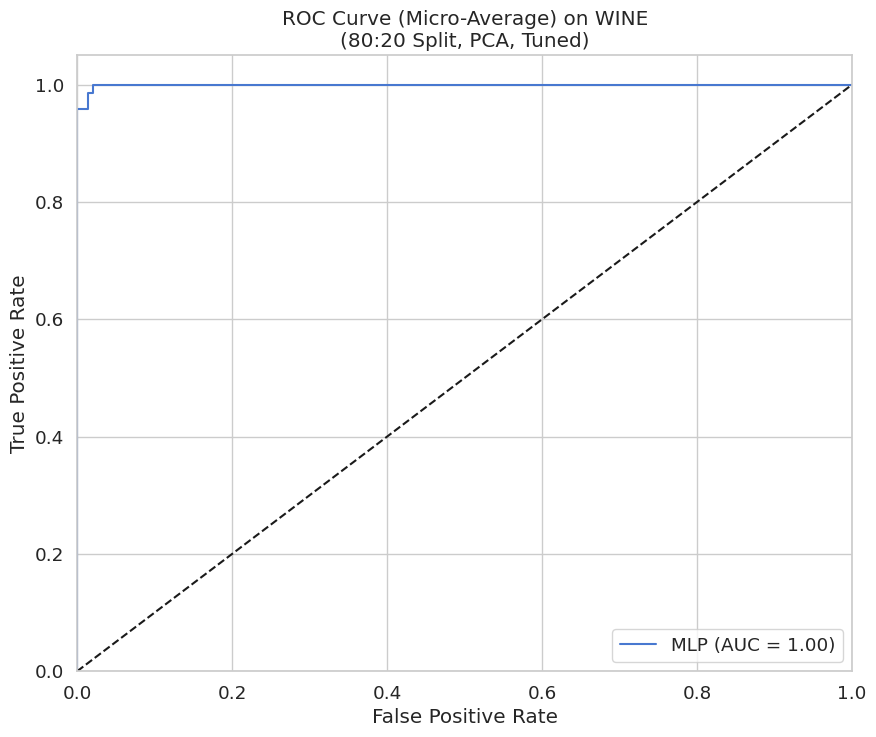

Original features: 13, PCA features: 10

running tuned model for 80:20 Split, PCA...
tuning MLP with PCA features...
best parameters for MLP on PCA data: {'hidden_layer_sizes': (50,), 'learning_rate_init': 0.01}
--- Results for MLP on WINE (80:20 Split, PCA, Tuned) ---
Accuracy: 0.9630
Precision (Weighted): 0.9639
Recall (Weighted): 0.9630
F1-Score (Weighted): 0.9629



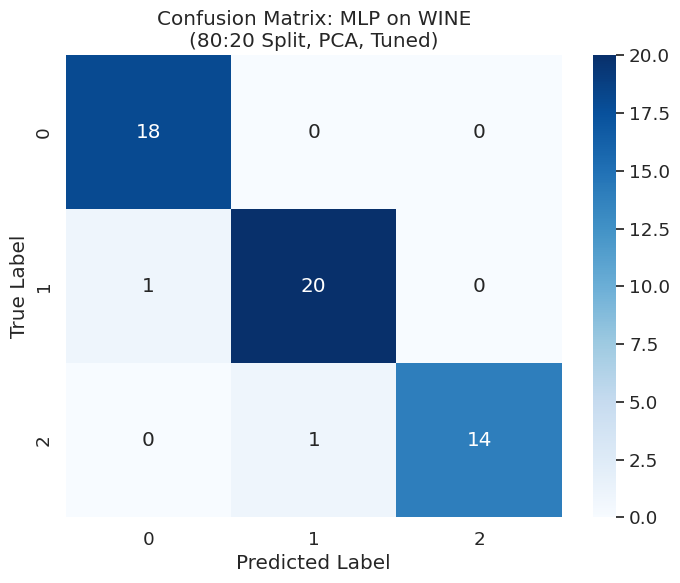

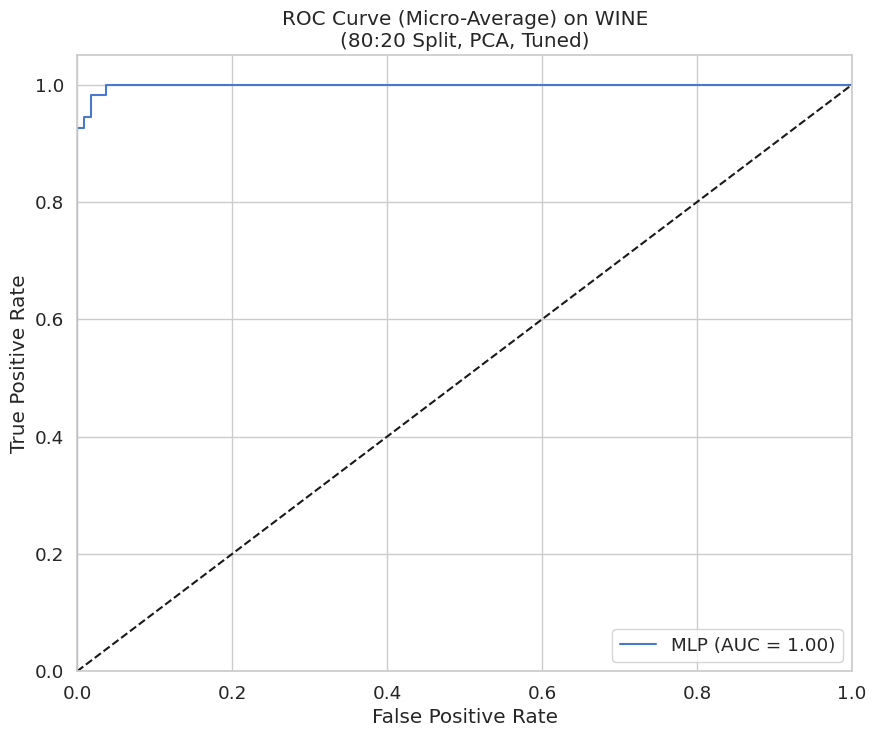

Original features: 13, PCA features: 10

running tuned model for 80:20 Split, PCA...
tuning MLP with PCA features...
best parameters for MLP on PCA data: {'hidden_layer_sizes': (100,), 'learning_rate_init': 0.01}
--- Results for MLP on WINE (80:20 Split, PCA, Tuned) ---
Accuracy: 0.9722
Precision (Weighted): 0.9741
Recall (Weighted): 0.9722
F1-Score (Weighted): 0.9720



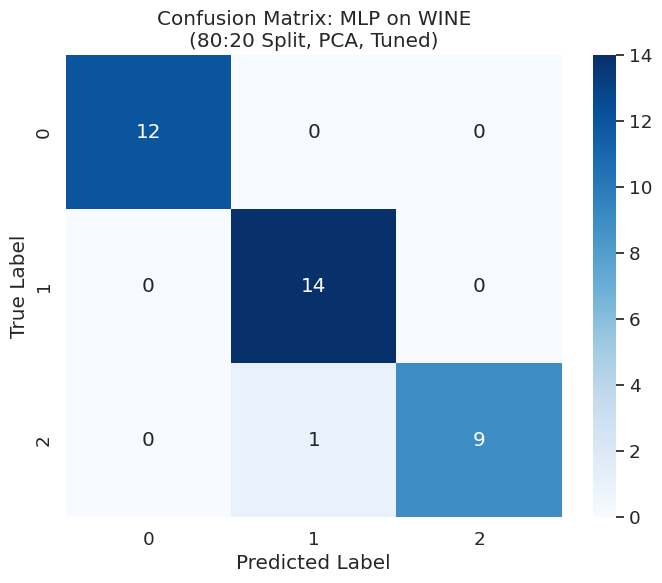

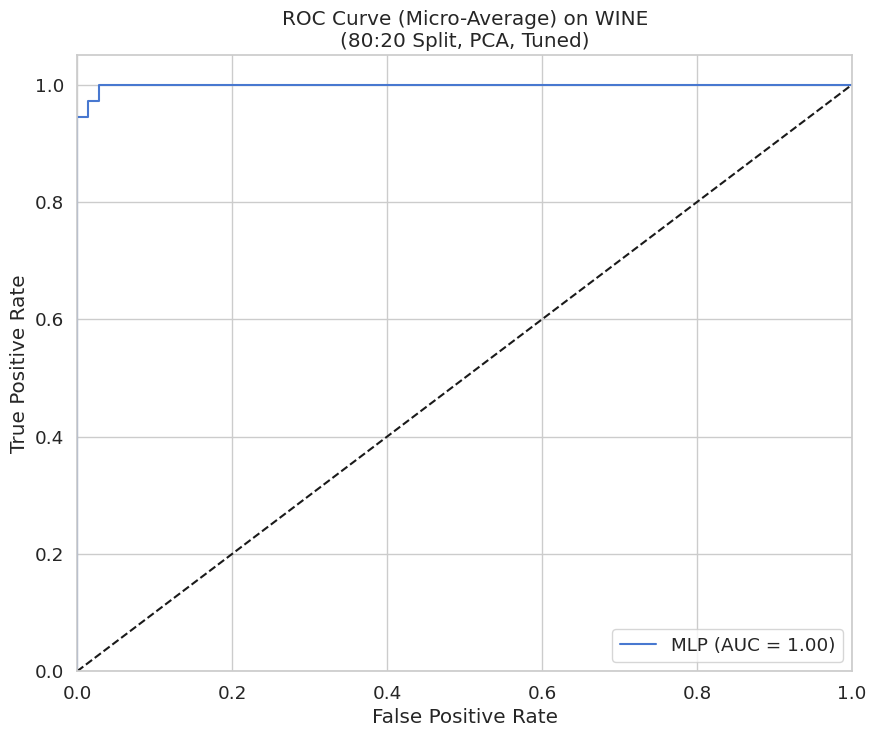

In [ ]:
def mlp_complete(dataset, dataset_name):

    X, y = wine_dataset.data, wine_dataset.target
    results_list = []

    classifiers = {
         "MLP": MLPClassifier(max_iter=1000, random_state=42),

    }

    param_grids = {
        "MLP": {'hidden_layer_sizes': [(50,), (100,), (50, 50)], 'learning_rate_init': [0.001, 0.01]},
    }

    print(f"Experiments for wine dataset on Original Features ---")
    for split in splits:
        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=split, random_state=42, stratify=y
        )

        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)

        split_note = f"{int(100-split*100)}:{int(split*100)} Split"

        # without tuning
        print(f"\n running not tuned models for {split_note}...")
        trained_models_default = {}
        for name, model in classifiers.items():
            model.fit(X_train_scaled, y_train)
            trained_models_default[name] = model
            evaluate_model(model, X_test_scaled, y_test, name, dataset_name, split, f"{split_note}, Default", results_list)
        plot_roc_curves(trained_models_default, X_test_scaled, y_test, dataset_name, f"{split_note}, Default")

        # with tuning
        print(f"\ntuned model for {split_note}...")
        trained_models_tuned = {}
        for name, model in classifiers.items():
            print(f"Tuning {name}...")
            grid_search = GridSearchCV(model, param_grids[name], cv=5, n_jobs=-1, scoring='accuracy')
            grid_search.fit(X_train_scaled, y_train)
            best_model = grid_search.best_estimator_
            trained_models_tuned[name] = best_model
            print(f"best parameters for {name}: {grid_search.best_params_}")
            evaluate_model(best_model, X_test_scaled, y_test, name, dataset_name, split, f"{split_note}, Tuned", results_list)
        plot_roc_curves(trained_models_tuned, X_test_scaled, y_test, dataset_name, f"{split_note}, Tuned")

    # WITH PCA
    print(f"\n--- Starting for wine dataset with PCA ---")


    for split in splits:
      X_train, X_test, y_train, y_test = train_test_split(
          X, y, test_size=split, random_state=42, stratify=y
      )

      scaler = StandardScaler()
      X_train_scaled = scaler.fit_transform(X_train)
      X_test_scaled = scaler.transform(X_test)

      # pca with 95% variance
      pca = PCA(n_components=0.95)
      X_train_pca = pca.fit_transform(X_train_scaled)
      X_test_pca = pca.transform(X_test_scaled)
      print(f"Original features: {X_train.shape[1]}, PCA features: {X_train_pca.shape[1]}")

      pca_note = f"80:20 Split, PCA"

      # Model with tuning on PCA
      print(f"\nrunning tuned model for {pca_note}...")
      trained_models_pca = {}
      for name, model in classifiers.items():
          print(f"tuning {name} with PCA features...")
          grid_search = GridSearchCV(model, param_grids[name], cv=5, n_jobs=-1, scoring='accuracy')
          grid_search.fit(X_train_pca, y_train)
          best_model = grid_search.best_estimator_
          trained_models_pca[name] = best_model
          print(f"best parameters for {name} on PCA data: {grid_search.best_params_}")
          evaluate_model(best_model, X_test_pca, y_test, name, dataset_name, split, f"{pca_note}, Tuned", results_list)
      plot_roc_curves(trained_models_pca, X_test_pca, y_test, dataset_name, f"{pca_note}, Tuned")

    return pd.DataFrame(results_list)
mlp_df = mlp_complete(wine_dataset,"WINE")


 Results Summary for MLP on WINE


,Dataset,Model,Train-Test Split,Tuning,PCA,Accuracy,Precision,Recall,F1-Score,Inference Time (s)
0,WINE,MLP,50:50,Default,No,0.9551,0.9558,0.9551,0.9548,0.0006
1,WINE,MLP,50:50,Tuned,No,0.9551,0.9558,0.9551,0.9548,0.0013
2,WINE,MLP,60:40,Default,No,0.9722,0.9744,0.9722,0.9723,0.0006
3,WINE,MLP,60:40,Tuned,No,0.9722,0.9744,0.9722,0.9723,0.0010
4,WINE,MLP,70:30,Default,No,1.0000,1.0000,1.0000,1.0000,0.0006
5,WINE,MLP,70:30,Tuned,No,1.0000,1.0000,1.0000,1.0000,0.0009
6,WINE,MLP,80:20,Default,No,0.9722,0.9741,0.9722,0.9720,0.0007
7,WINE,MLP,80:20,Tuned,No,0.9444,0.9466,0.9444,0.9443,0.0010
8,WINE,MLP,50:50,Tuned,Yes,0.9551,0.9549,0.9551,0.9548,0.0010
9,WINE,MLP,60:40,Tuned,Yes,0.9722,0.9728,0.9722,0.9722,0.0009


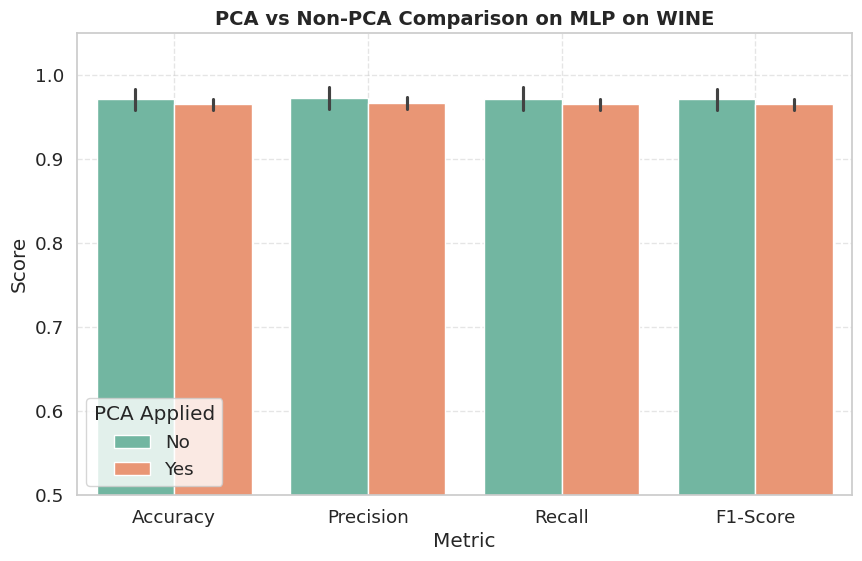

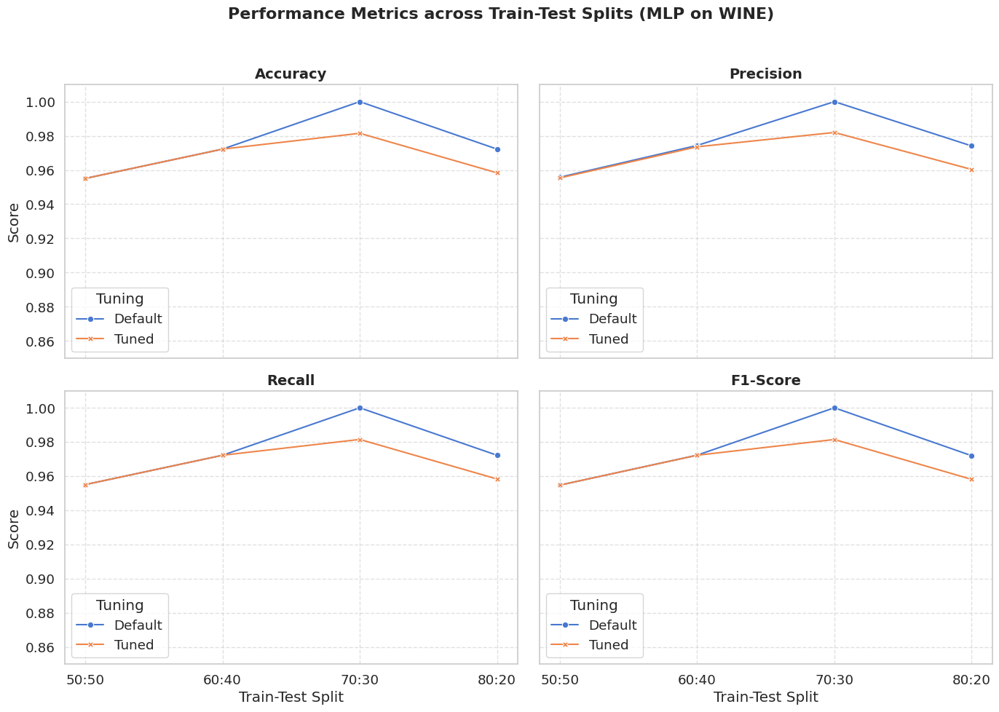

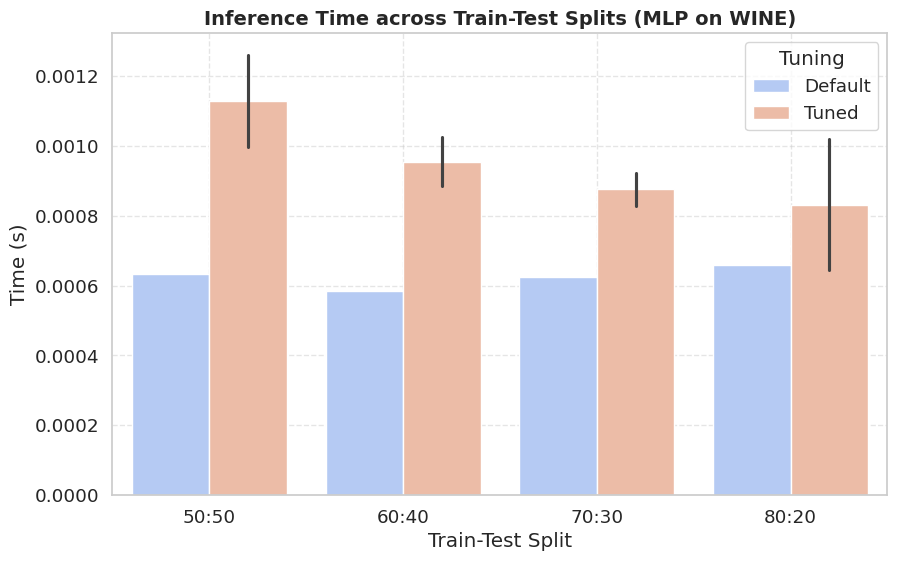

In [ ]:
analyze_results(mlp_df, "MLP on WINE")


Experiments for wine dataset on Original Features ---

 running not tuned models for 50:50 Split...
--- Results for Random Forest on WINE (50:50 Split, Default) ---
Accuracy: 0.9775
Precision (Weighted): 0.9783
Recall (Weighted): 0.9775
F1-Score (Weighted): 0.9774



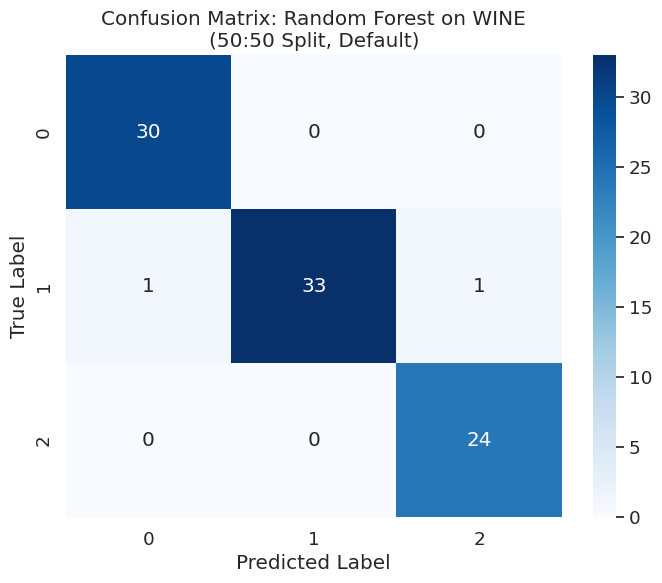

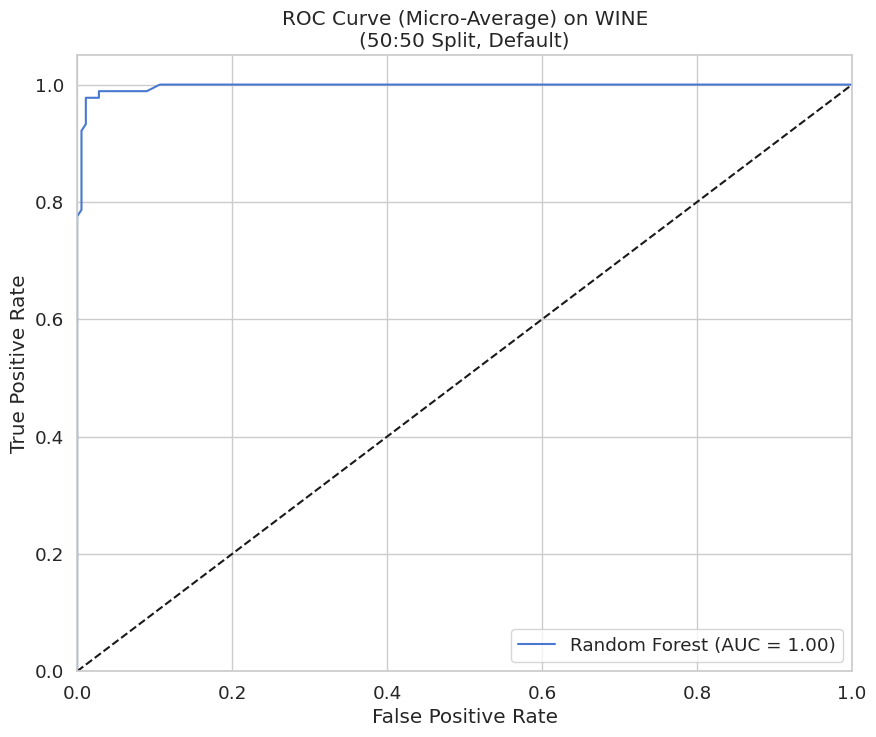


tuned model for 50:50 Split...
Tuning Random Forest...
best parameters for Random Forest: {'max_depth': 10, 'n_estimators': 50}
--- Results for Random Forest on WINE (50:50 Split, Tuned) ---
Accuracy: 0.9775
Precision (Weighted): 0.9783
Recall (Weighted): 0.9775
F1-Score (Weighted): 0.9774



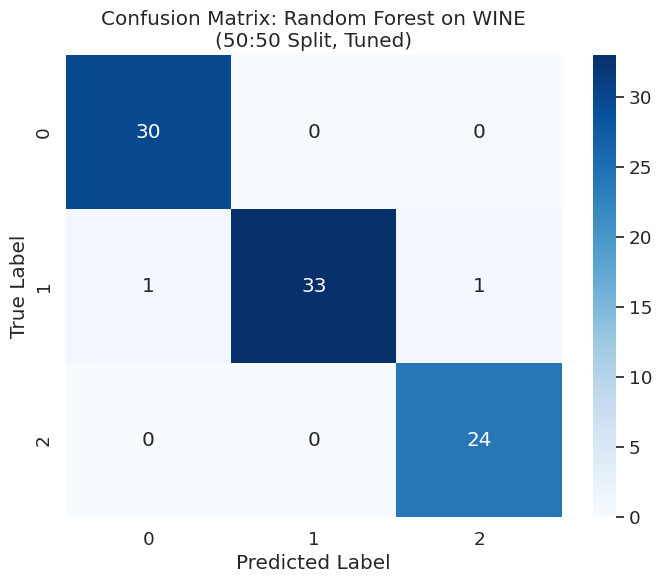

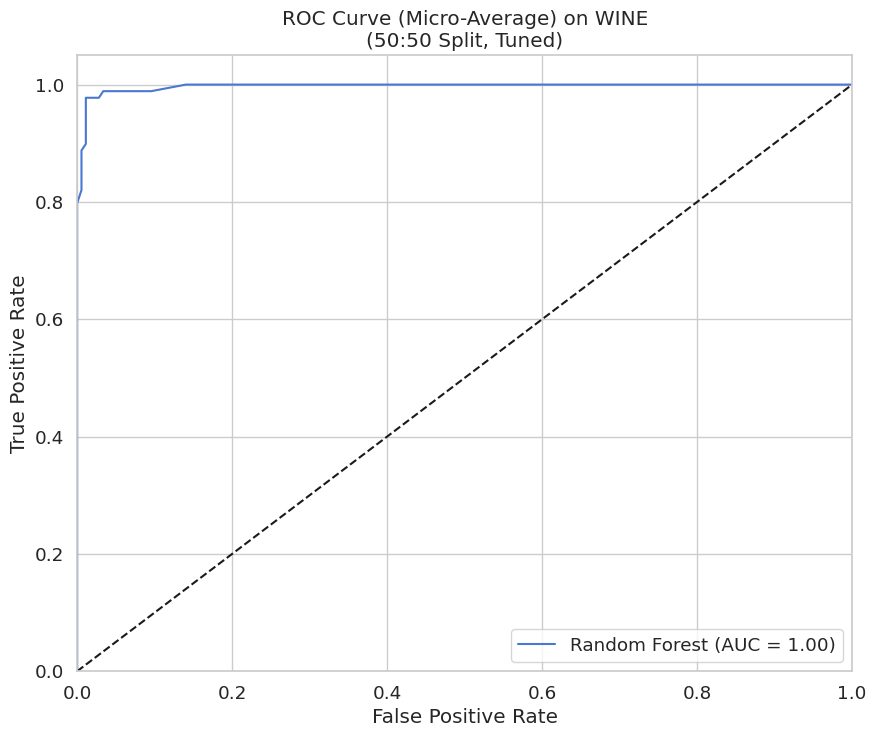


 running not tuned models for 60:40 Split...
--- Results for Random Forest on WINE (60:40 Split, Default) ---
Accuracy: 0.9861
Precision (Weighted): 0.9867
Recall (Weighted): 0.9861
F1-Score (Weighted): 0.9861



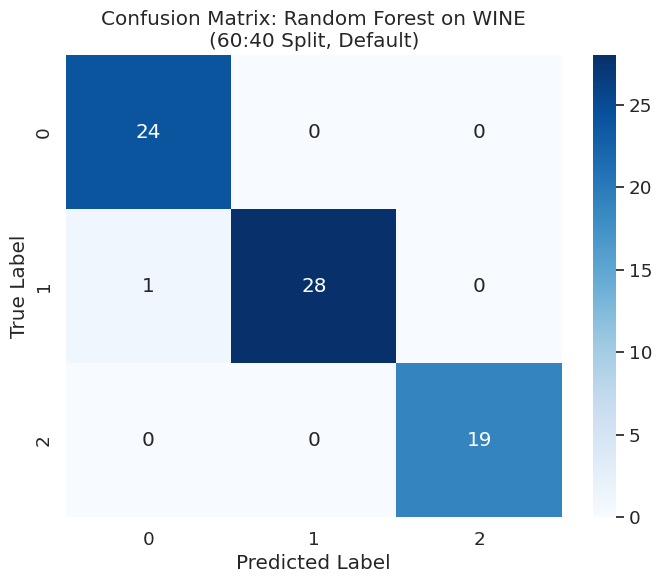

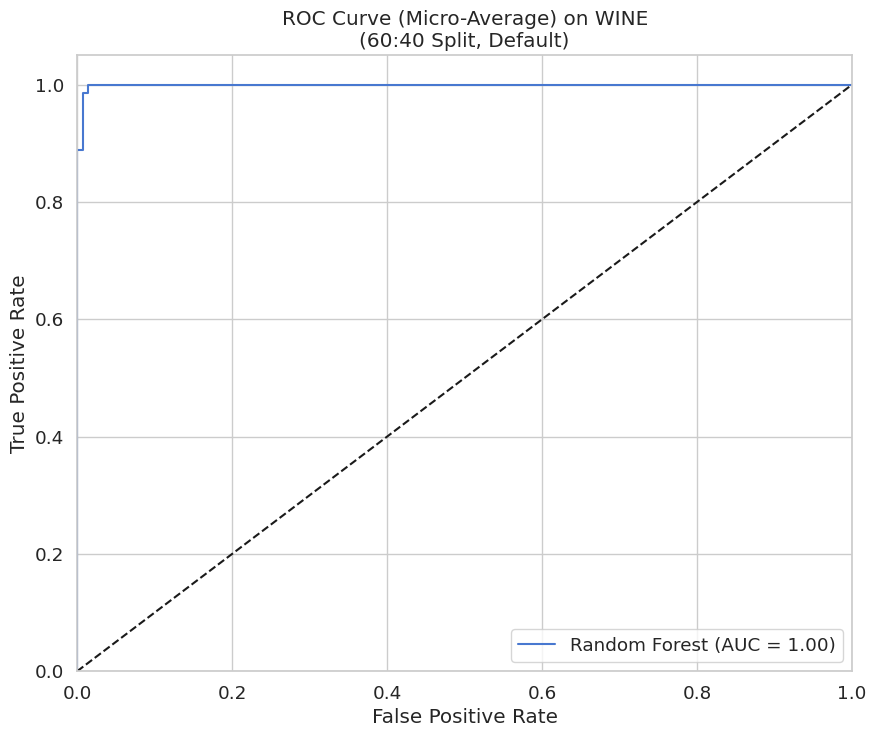


tuned model for 60:40 Split...
Tuning Random Forest...
best parameters for Random Forest: {'max_depth': 10, 'n_estimators': 50}
--- Results for Random Forest on WINE (60:40 Split, Tuned) ---
Accuracy: 0.9861
Precision (Weighted): 0.9867
Recall (Weighted): 0.9861
F1-Score (Weighted): 0.9861



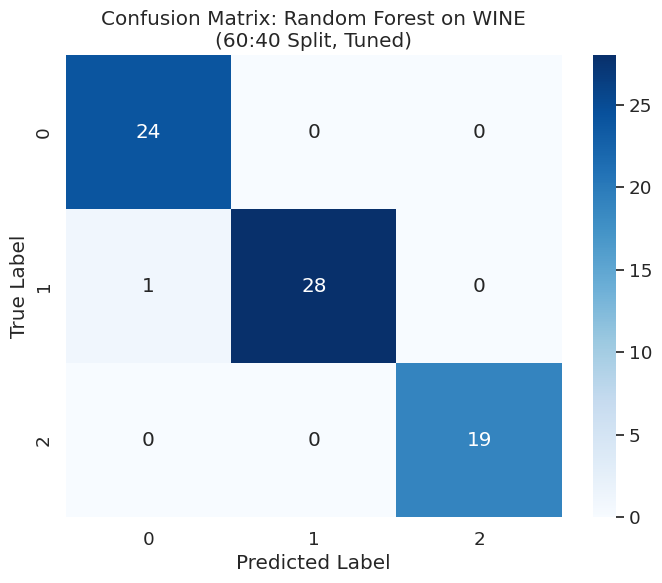

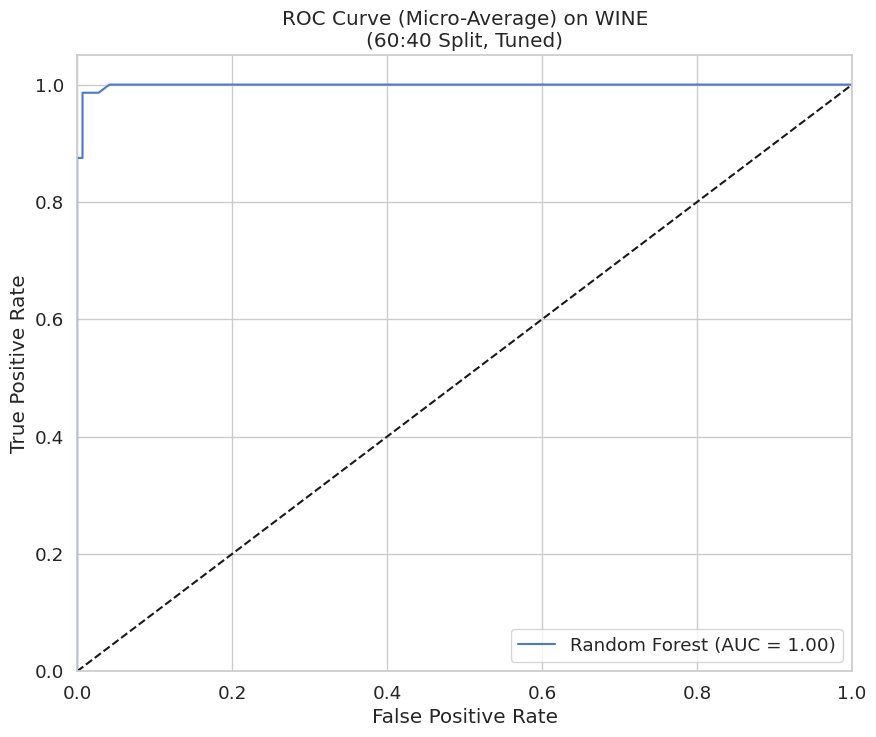


 running not tuned models for 70:30 Split...
--- Results for Random Forest on WINE (70:30 Split, Default) ---
Accuracy: 1.0000
Precision (Weighted): 1.0000
Recall (Weighted): 1.0000
F1-Score (Weighted): 1.0000



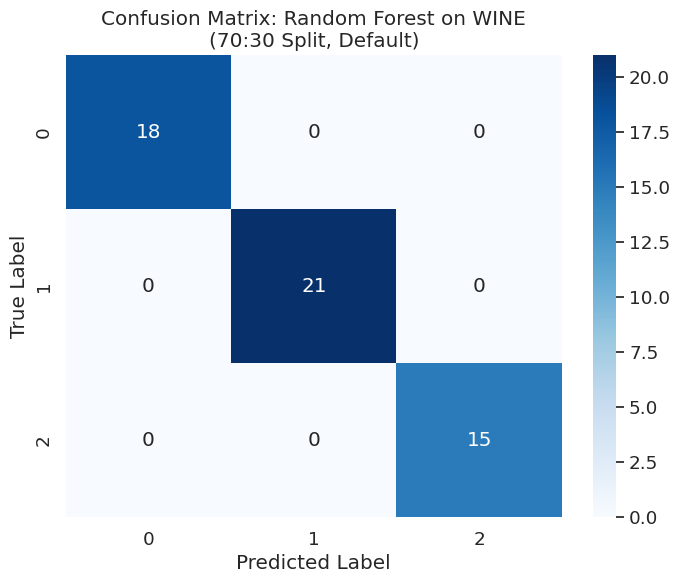

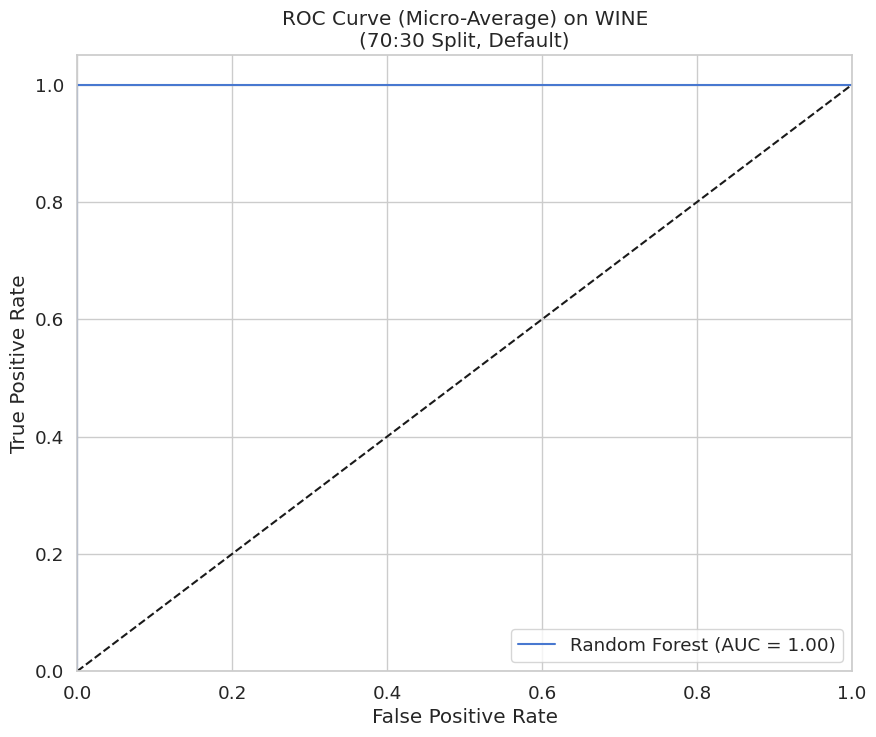


tuned model for 70:30 Split...
Tuning Random Forest...
best parameters for Random Forest: {'max_depth': 10, 'n_estimators': 200}
--- Results for Random Forest on WINE (70:30 Split, Tuned) ---
Accuracy: 1.0000
Precision (Weighted): 1.0000
Recall (Weighted): 1.0000
F1-Score (Weighted): 1.0000



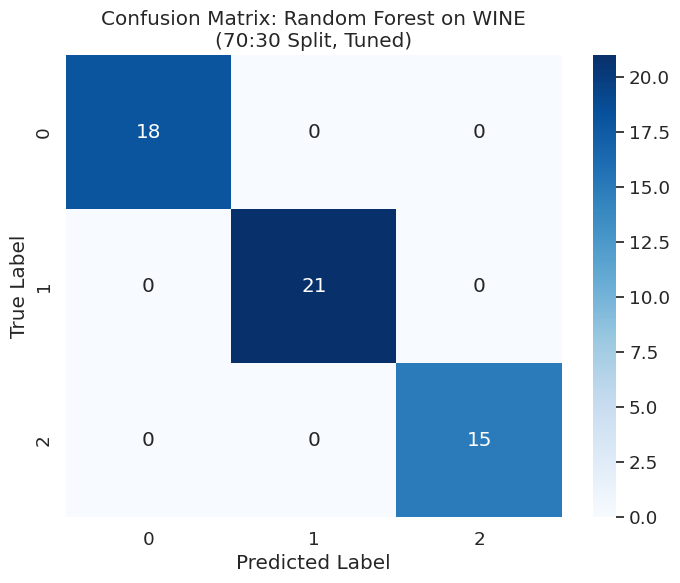

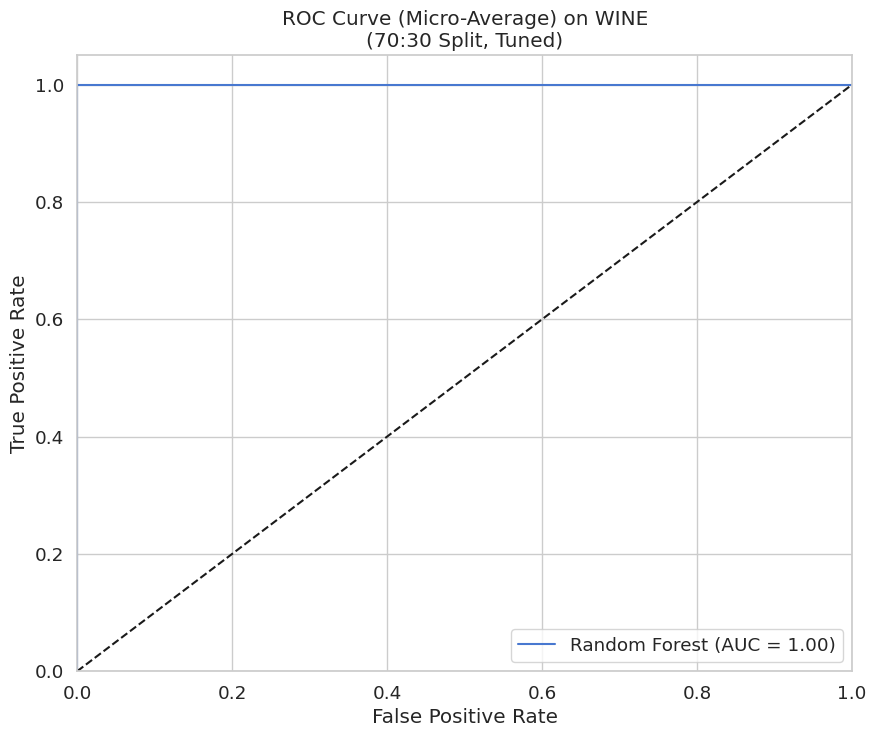


 running not tuned models for 80:20 Split...
--- Results for Random Forest on WINE (80:20 Split, Default) ---
Accuracy: 1.0000
Precision (Weighted): 1.0000
Recall (Weighted): 1.0000
F1-Score (Weighted): 1.0000



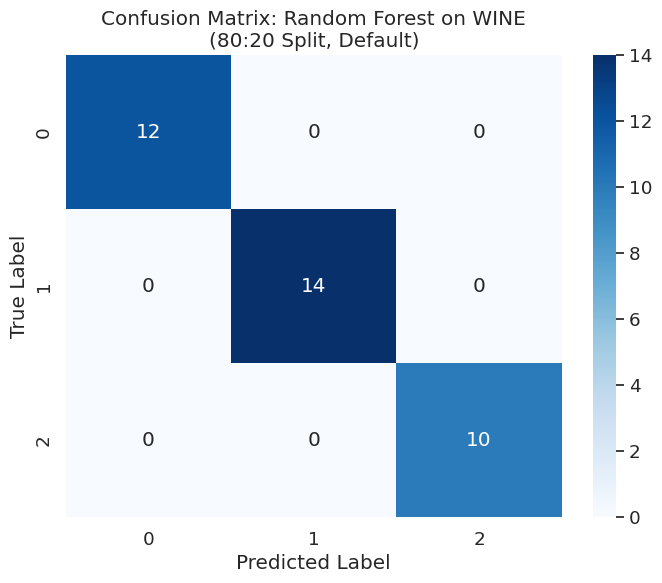

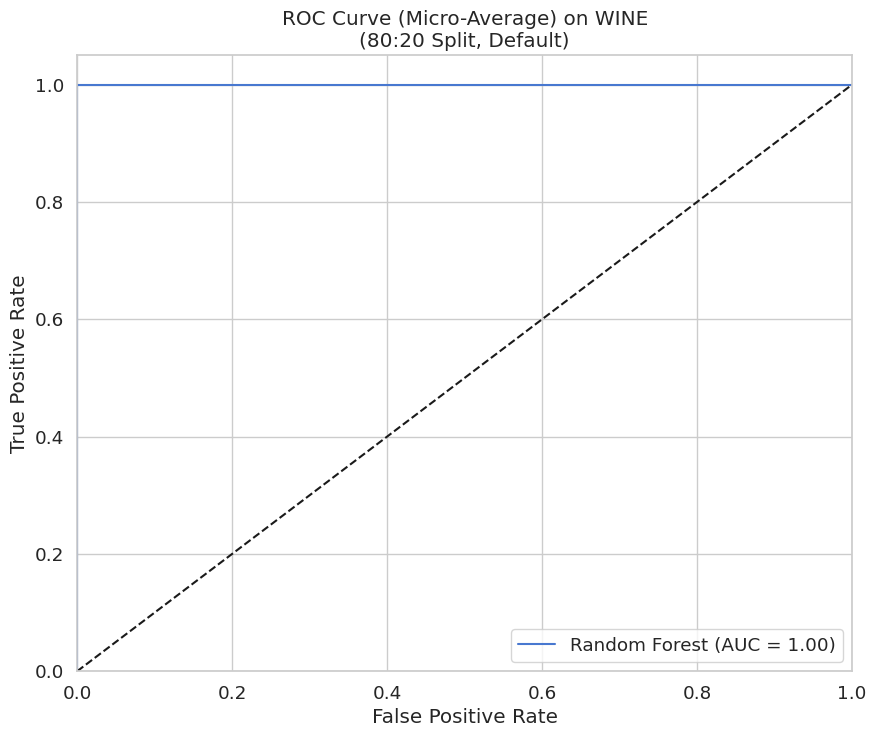


tuned model for 80:20 Split...
Tuning Random Forest...
best parameters for Random Forest: {'max_depth': 10, 'n_estimators': 50}
--- Results for Random Forest on WINE (80:20 Split, Tuned) ---
Accuracy: 1.0000
Precision (Weighted): 1.0000
Recall (Weighted): 1.0000
F1-Score (Weighted): 1.0000



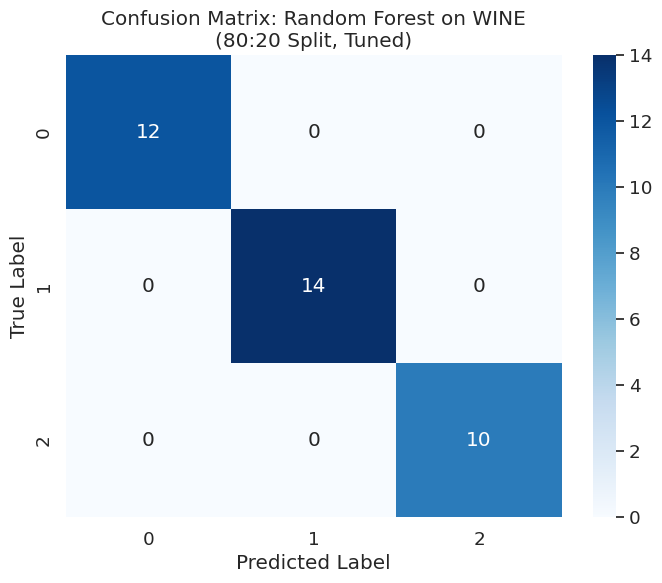

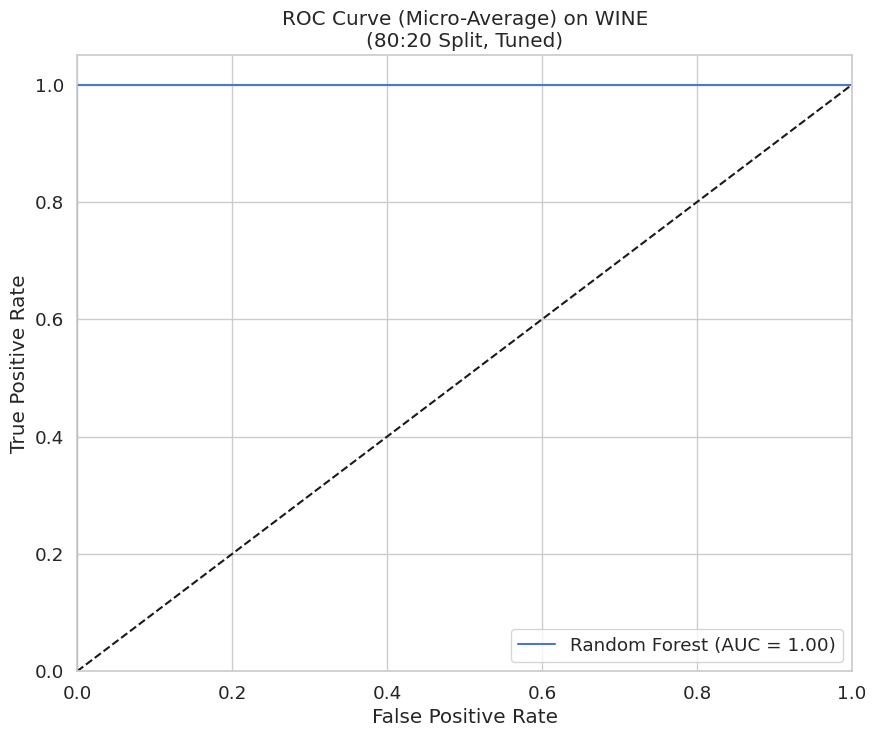


--- Starting for wine dataset with PCA ---
Original features: 13, PCA features: 10

running tuned model for 80:20 Split, PCA...
tuning Random Forest with PCA features...
best parameters for Random Forest on PCA data: {'max_depth': 10, 'n_estimators': 50}
--- Results for Random Forest on WINE (80:20 Split, PCA, Tuned) ---
Accuracy: 0.8876
Precision (Weighted): 0.8895
Recall (Weighted): 0.8876
F1-Score (Weighted): 0.8881



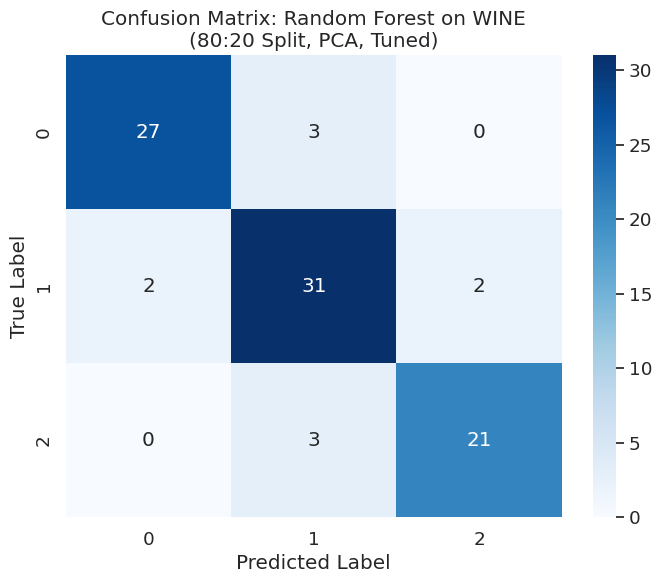

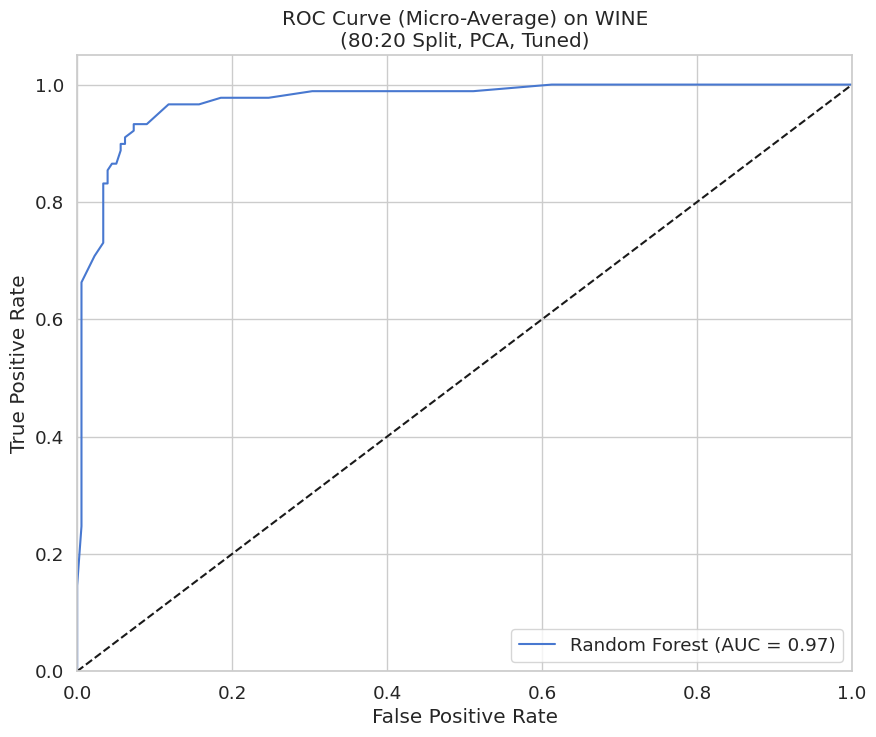

Original features: 13, PCA features: 10

running tuned model for 80:20 Split, PCA...
tuning Random Forest with PCA features...
best parameters for Random Forest on PCA data: {'max_depth': 10, 'n_estimators': 50}
--- Results for Random Forest on WINE (80:20 Split, PCA, Tuned) ---
Accuracy: 0.9444
Precision (Weighted): 0.9444
Recall (Weighted): 0.9444
F1-Score (Weighted): 0.9444



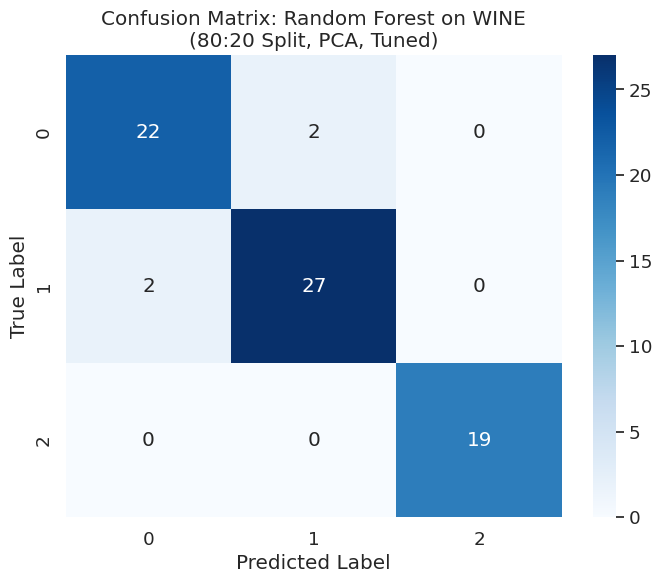

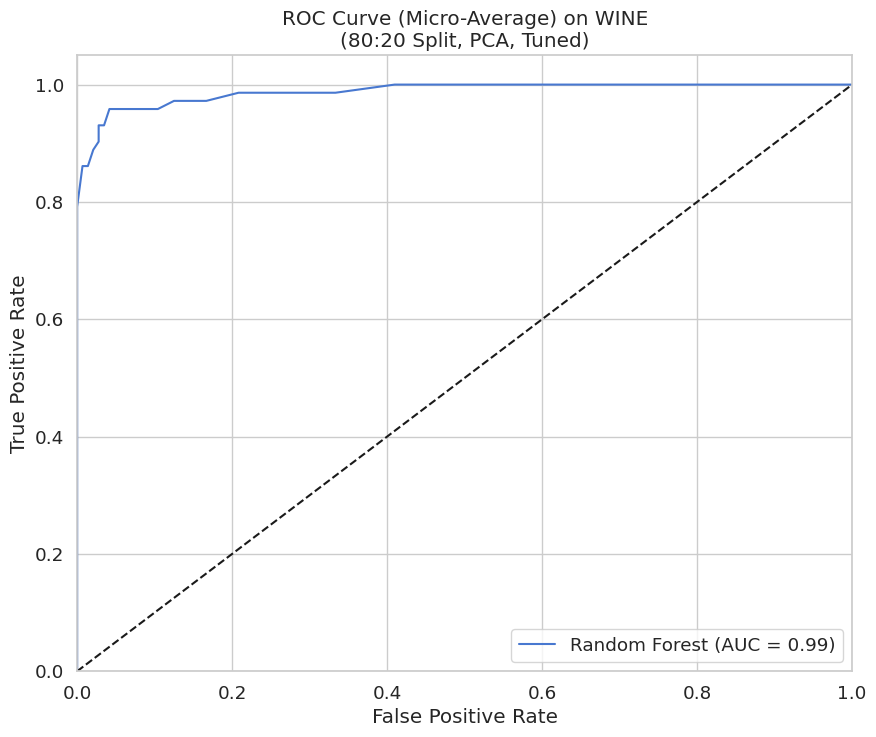

Original features: 13, PCA features: 10

running tuned model for 80:20 Split, PCA...
tuning Random Forest with PCA features...
best parameters for Random Forest on PCA data: {'max_depth': 10, 'n_estimators': 200}
--- Results for Random Forest on WINE (80:20 Split, PCA, Tuned) ---
Accuracy: 0.9630
Precision (Weighted): 0.9630
Recall (Weighted): 0.9630
F1-Score (Weighted): 0.9630



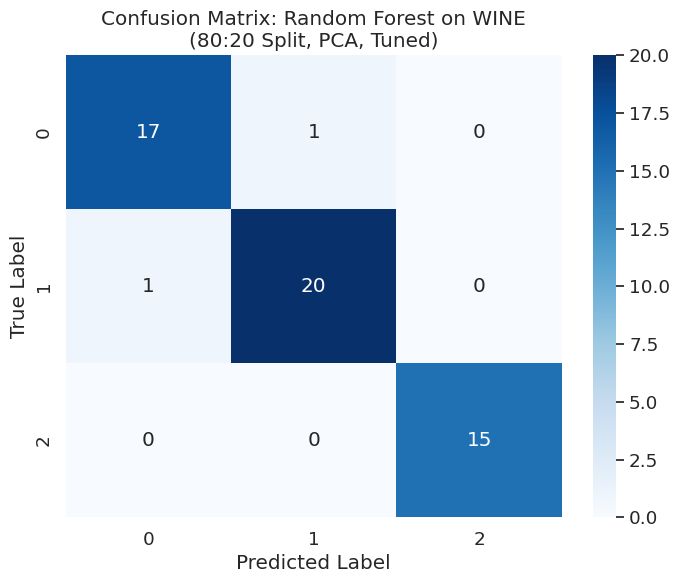

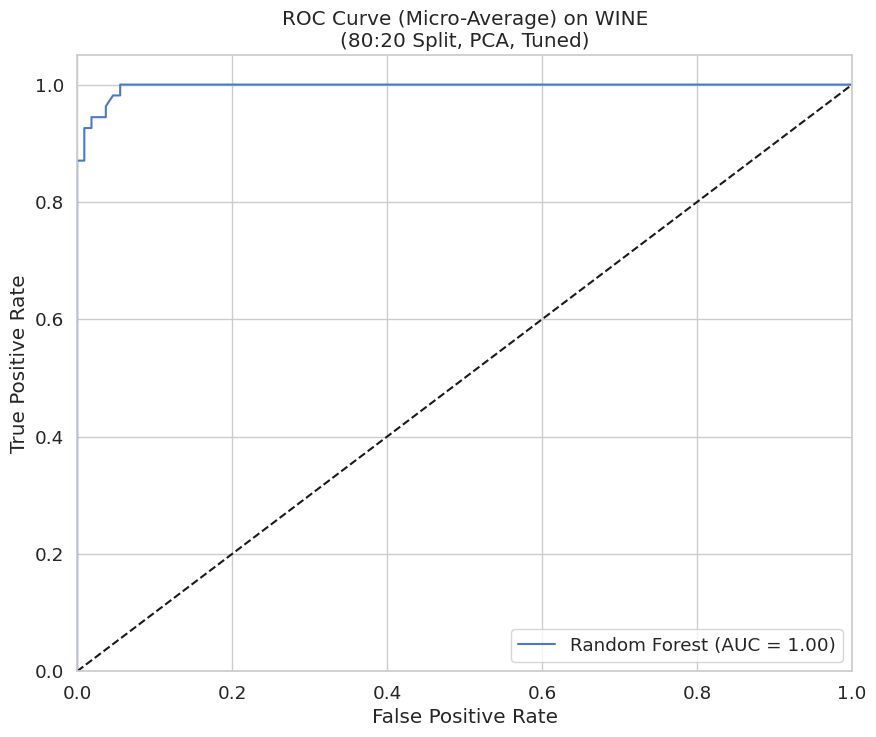

Original features: 13, PCA features: 10

running tuned model for 80:20 Split, PCA...
tuning Random Forest with PCA features...
best parameters for Random Forest on PCA data: {'max_depth': 10, 'n_estimators': 200}
--- Results for Random Forest on WINE (80:20 Split, PCA, Tuned) ---
Accuracy: 0.9444
Precision (Weighted): 0.9444
Recall (Weighted): 0.9444
F1-Score (Weighted): 0.9444



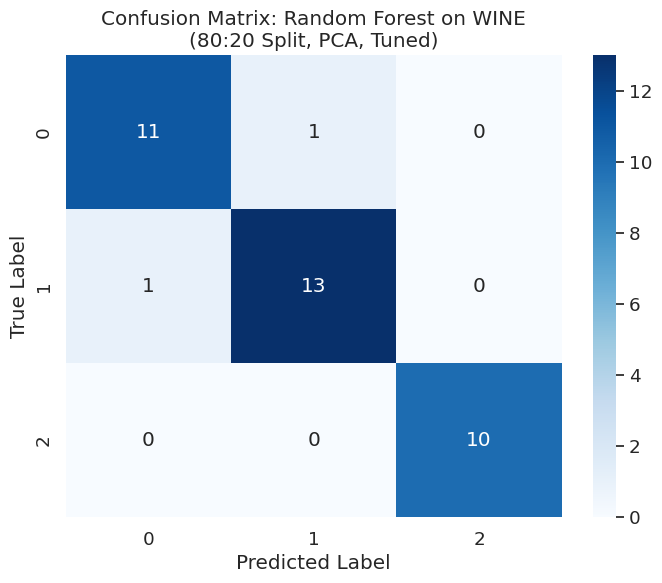

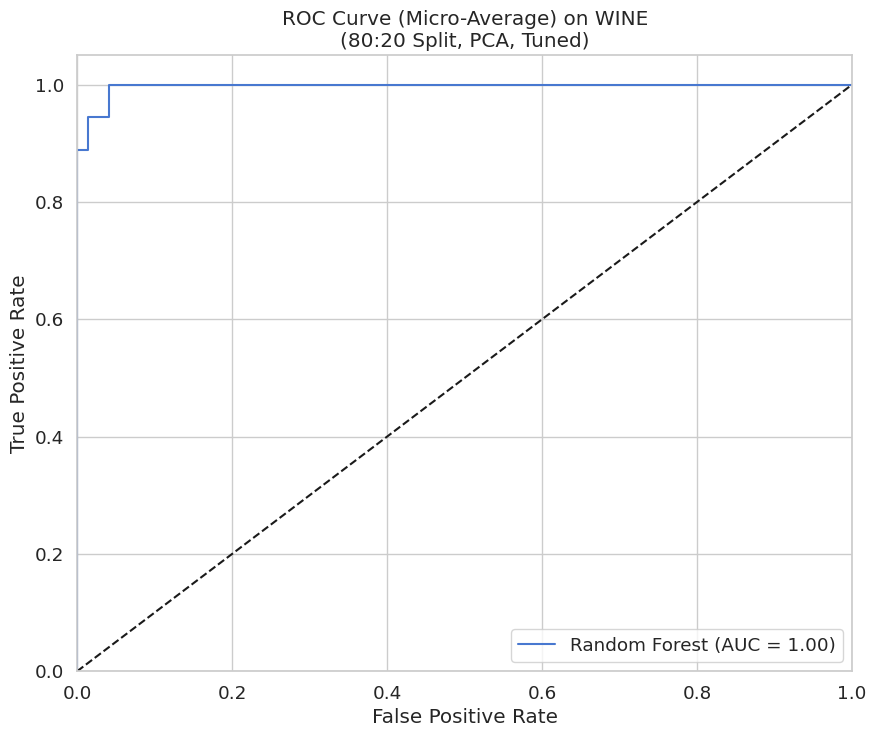

In [ ]:
def randomforest_complete(dataset, dataset_name):

    X, y = wine_dataset.data, wine_dataset.target
    results_list = []

    classifiers = {
         "Random Forest": RandomForestClassifier(random_state=42)

    }

    param_grids = {
         "Random Forest": {'n_estimators': [50, 100, 200], 'max_depth': [10, 20, None]}
    }

    print(f"Experiments for wine dataset on Original Features ---")
    for split in splits:
        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=split, random_state=42, stratify=y
        )

        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)

        split_note = f"{int(100-split*100)}:{int(split*100)} Split"

        # without tuning
        print(f"\n running not tuned models for {split_note}...")
        trained_models_default = {}
        for name, model in classifiers.items():
            model.fit(X_train_scaled, y_train)
            trained_models_default[name] = model
            evaluate_model(model, X_test_scaled, y_test, name, dataset_name, split, f"{split_note}, Default", results_list)
        plot_roc_curves(trained_models_default, X_test_scaled, y_test, dataset_name, f"{split_note}, Default")

        # with tuning
        print(f"\ntuned model for {split_note}...")
        trained_models_tuned = {}
        for name, model in classifiers.items():
            print(f"Tuning {name}...")
            grid_search = GridSearchCV(model, param_grids[name], cv=5, n_jobs=-1, scoring='accuracy')
            grid_search.fit(X_train_scaled, y_train)
            best_model = grid_search.best_estimator_
            trained_models_tuned[name] = best_model
            print(f"best parameters for {name}: {grid_search.best_params_}")
            evaluate_model(best_model, X_test_scaled, y_test, name, dataset_name, split, f"{split_note}, Tuned", results_list)
        plot_roc_curves(trained_models_tuned, X_test_scaled, y_test, dataset_name, f"{split_note}, Tuned")

    # WITH PCA
    print(f"\n--- Starting for wine dataset with PCA ---")


    for split in splits:
      X_train, X_test, y_train, y_test = train_test_split(
          X, y, test_size=split, random_state=42, stratify=y
      )

      scaler = StandardScaler()
      X_train_scaled = scaler.fit_transform(X_train)
      X_test_scaled = scaler.transform(X_test)

      # pca with 95% variance
      pca = PCA(n_components=0.95)
      X_train_pca = pca.fit_transform(X_train_scaled)
      X_test_pca = pca.transform(X_test_scaled)
      print(f"Original features: {X_train.shape[1]}, PCA features: {X_train_pca.shape[1]}")

      pca_note = f"80:20 Split, PCA"

      # Model with tuning on PCA
      print(f"\nrunning tuned model for {pca_note}...")
      trained_models_pca = {}
      for name, model in classifiers.items():
          print(f"tuning {name} with PCA features...")
          grid_search = GridSearchCV(model, param_grids[name], cv=5, n_jobs=-1, scoring='accuracy')
          grid_search.fit(X_train_pca, y_train)
          best_model = grid_search.best_estimator_
          trained_models_pca[name] = best_model
          print(f"best parameters for {name} on PCA data: {grid_search.best_params_}")
          evaluate_model(best_model, X_test_pca, y_test, name, dataset_name, split, f"{pca_note}, Tuned", results_list)
      plot_roc_curves(trained_models_pca, X_test_pca, y_test, dataset_name, f"{pca_note}, Tuned")

    return pd.DataFrame(results_list)
randomforest_df = randomforest_complete(wine_dataset,"WINE")


 Results Summary for Random Forest on WINE


,Dataset,Model,Train-Test Split,Tuning,PCA,Accuracy,Precision,Recall,F1-Score,Inference Time (s)
0,WINE,Random Forest,50:50,Default,No,0.9775,0.9783,0.9775,0.9774,0.0074
1,WINE,Random Forest,50:50,Tuned,No,0.9775,0.9783,0.9775,0.9774,0.0061
2,WINE,Random Forest,60:40,Default,No,0.9861,0.9867,0.9861,0.9861,0.0119
3,WINE,Random Forest,60:40,Tuned,No,0.9861,0.9867,0.9861,0.9861,0.0066
4,WINE,Random Forest,70:30,Default,No,1.0000,1.0000,1.0000,1.0000,0.0083
5,WINE,Random Forest,70:30,Tuned,No,1.0000,1.0000,1.0000,1.0000,0.0210
6,WINE,Random Forest,80:20,Default,No,1.0000,1.0000,1.0000,1.0000,0.0081
7,WINE,Random Forest,80:20,Tuned,No,1.0000,1.0000,1.0000,1.0000,0.0069
8,WINE,Random Forest,50:50,Tuned,Yes,0.8876,0.8895,0.8876,0.8881,0.0052
9,WINE,Random Forest,60:40,Tuned,Yes,0.9444,0.9444,0.9444,0.9444,0.0057


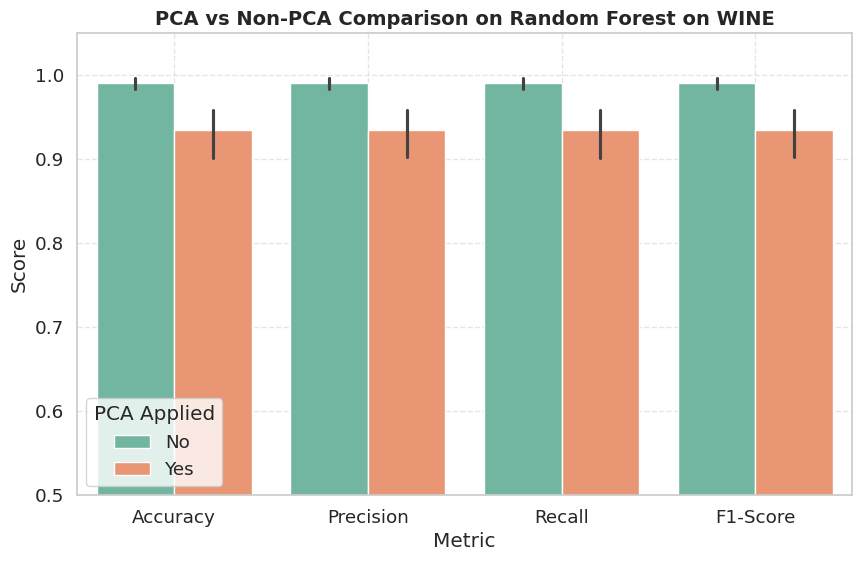

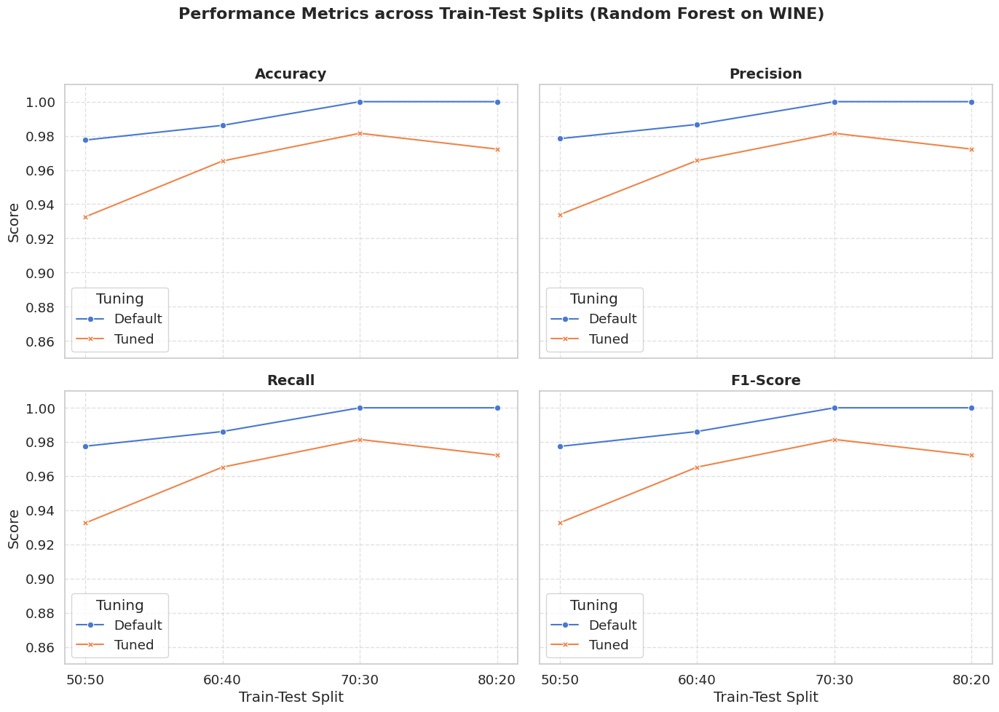

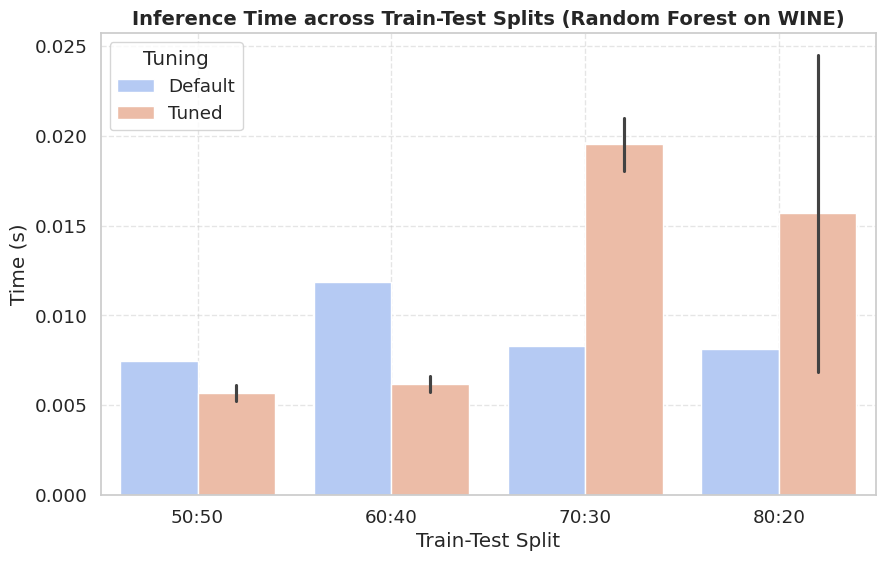

In [ ]:
analyze_results(randomforest_df, "Random Forest on WINE")

In [ ]:
df_list = [svm_linear_df,svm_polynomial_df,svm_rbf_df,svm_sigmoid_df,randomforest_df,mlp_df]
result_df = pd.concat(df_list)


In [ ]:
print("--- Performance Comparison on Wine Dataset ---")
display(result_df.sort_values(by='Accuracy', ascending=False))


--- Performance Comparison on Wine Dataset ---


,Dataset,Model,Train-Test Split,Tuning,PCA,Accuracy,Precision,Recall,F1-Score,Inference Time (s)
4,WINE,MLP,70:30,Default,No,1.000000,1.000000,1.000000,1.000000,0.000625
5,WINE,MLP,70:30,Tuned,No,1.000000,1.000000,1.000000,1.000000,0.000923
7,WINE,SVM (Sigmoid),80:20,Tuned,No,1.000000,1.000000,1.000000,1.000000,0.000695
11,WINE,SVM (Sigmoid),80:20,Tuned,Yes,1.000000,1.000000,1.000000,1.000000,0.000692
4,WINE,Random Forest,70:30,Default,No,1.000000,1.000000,1.000000,1.000000,0.008295
...,...,...,...,...,...,...,...,...,...,...
10,WINE,SVM (Poly),70:30,Tuned,Yes,0.907407,0.925214,0.907407,0.908485,0.000525
4,WINE,SVM (Poly),70:30,Default,No,0.907407,0.925214,0.907407,0.908485,0.009790
2,WINE,SVM (Poly),60:40,Default,No,0.888889,0.902778,0.888889,0.889538,0.001041
8,WINE,Random Forest,50:50,Tuned,Yes,0.887640,0.889533,0.887640,0.888127,0.005250


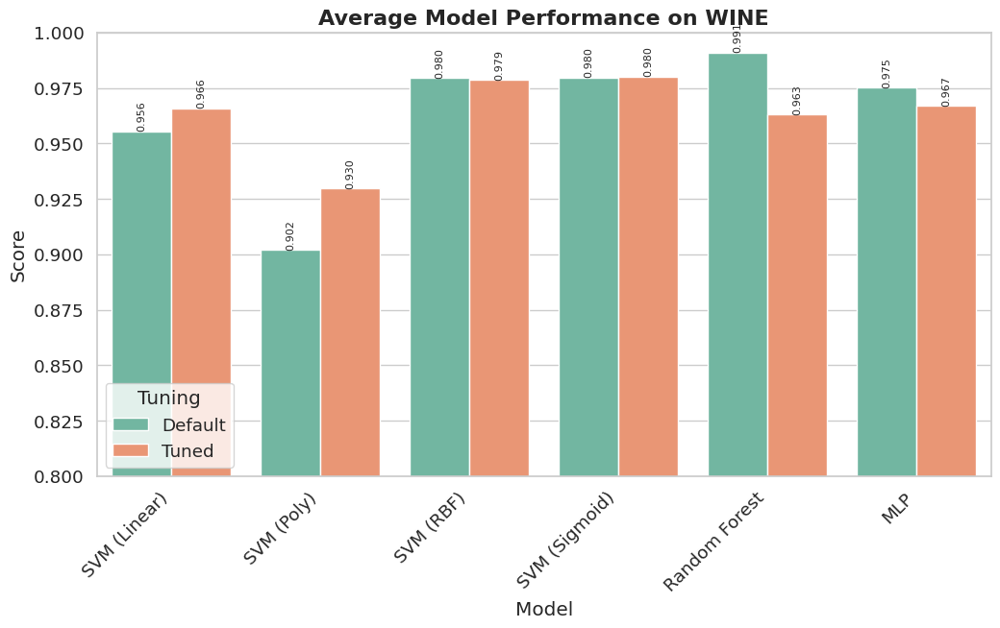

In [ ]:
def model_comparison_barplot(result_df, dataset_name="WINE"):
    metrics = ["Accuracy", "Precision", "Recall", "F1-Score"]

    df_melted = result_df.melt(
        id_vars=["Model", "Tuning"],
        value_vars=metrics,
        var_name="Metric",
        value_name="Score"
    )

    plt.figure(figsize=(12, 6))
    sns.barplot(
        data=df_melted,
        x="Model", y="Score", hue="Tuning",
        palette="Set2", ci=None
    )

    # Annotate values
    for p in plt.gca().patches:
        plt.gca().annotate(
            f"{p.get_height():.3f}",
            (p.get_x() + p.get_width() / 2., p.get_height()),
            ha='center', va='bottom', fontsize=8, rotation=90
        )

    plt.title(f"Average Model Performance on {dataset_name}", fontsize=16, fontweight="bold")
    plt.ylim(0.8, 1.0)
    plt.xticks(rotation=45, ha="right")
    plt.ylabel("Score")
    plt.show()
model_comparison_barplot(result_df,"WINE")

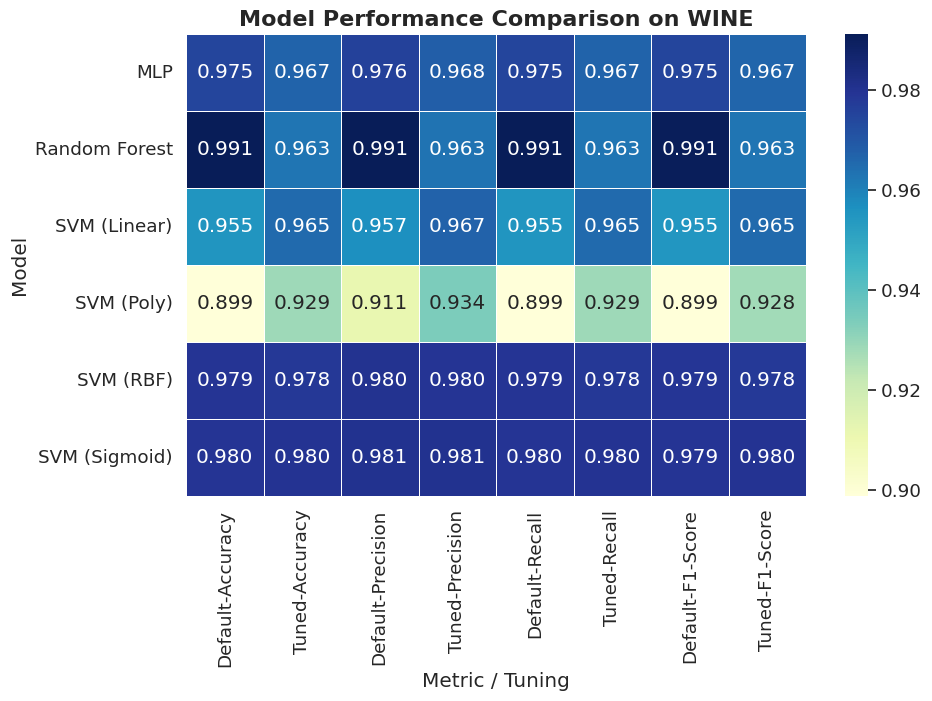

In [ ]:
def model_comparison_heatmap(result_df, dataset_name="WINE"):
    metrics = ["Accuracy", "Precision", "Recall", "F1-Score"]

    # Average across splits for clarity
    summary = result_df.groupby(["Model", "Tuning"])[metrics].mean().reset_index()

    # Pivot for heatmap
    summary_pivot = summary.pivot(index="Model", columns="Tuning", values=metrics)

    plt.figure(figsize=(10, 6))
    sns.heatmap(
        summary_pivot.swaplevel(axis=1),
        annot=True, fmt=".3f", cmap="YlGnBu", linewidths=0.5, cbar=True
    )

    plt.title(f"Model Performance Comparison on {dataset_name}", fontsize=16, fontweight="bold")
    plt.ylabel("Model")
    plt.xlabel("Metric / Tuning")
    plt.show()
model_comparison_heatmap(result_df,"WINE")


<h1>DIGITS DATASET</h1>

In [ ]:
from sklearn.datasets import load_digits
digits_dataset = load_digits()

Experiments for digits dataset on Original Features ---

 running not tuned models for 50:50 Split...
--- Results for SVM (Linear) on DIGITS (50:50 Split, Default) ---
Accuracy: 0.9711
Precision (Weighted): 0.9715
Recall (Weighted): 0.9711
F1-Score (Weighted): 0.9710



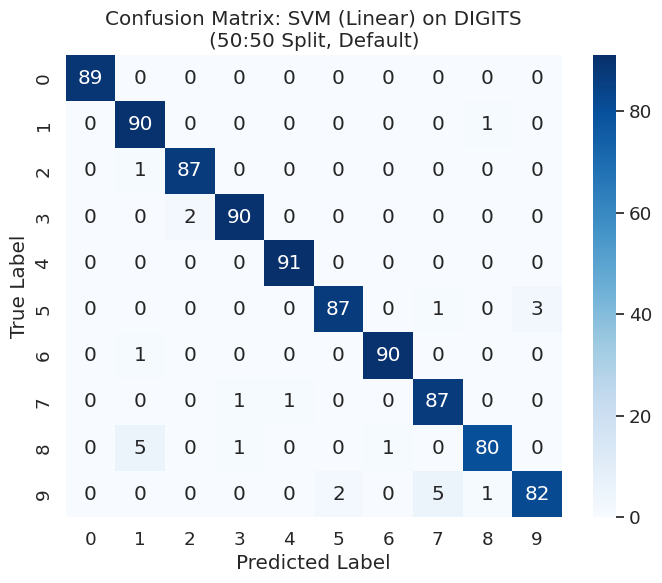

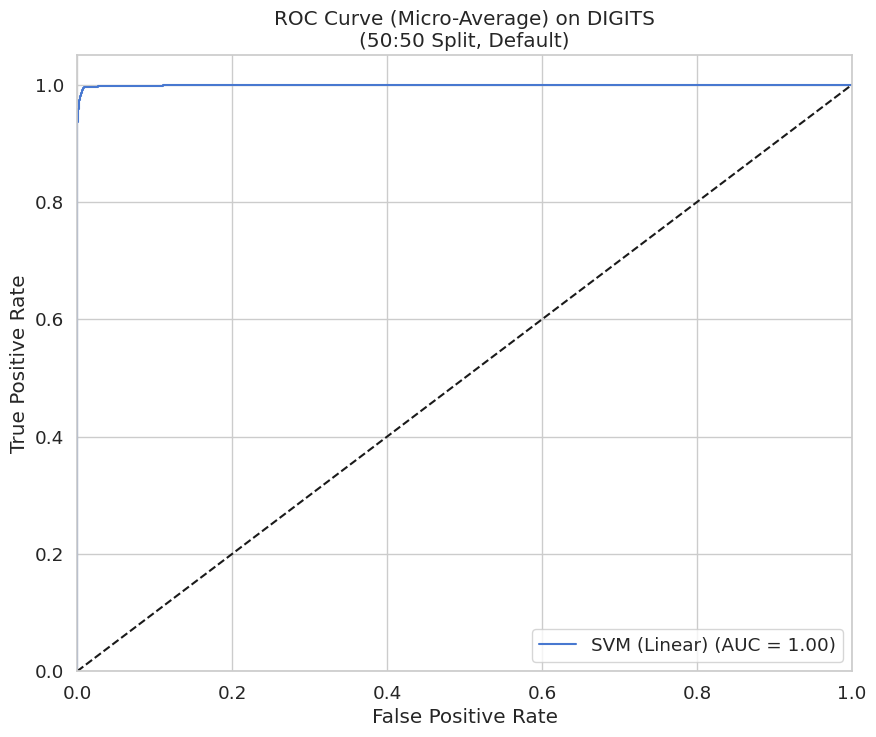


tuned model for 50:50 Split...
Tuning SVM (Linear)...
best parameters for SVM (Linear): {'C': 0.1}
--- Results for SVM (Linear) on DIGITS (50:50 Split, Tuned) ---
Accuracy: 0.9711
Precision (Weighted): 0.9717
Recall (Weighted): 0.9711
F1-Score (Weighted): 0.9710



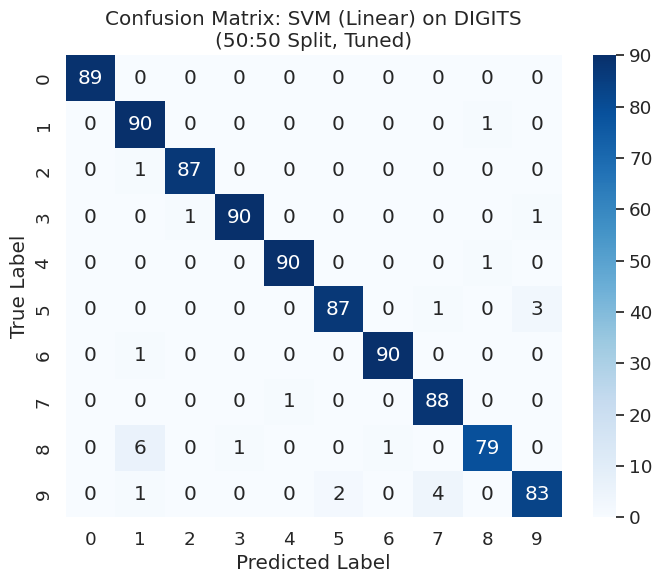

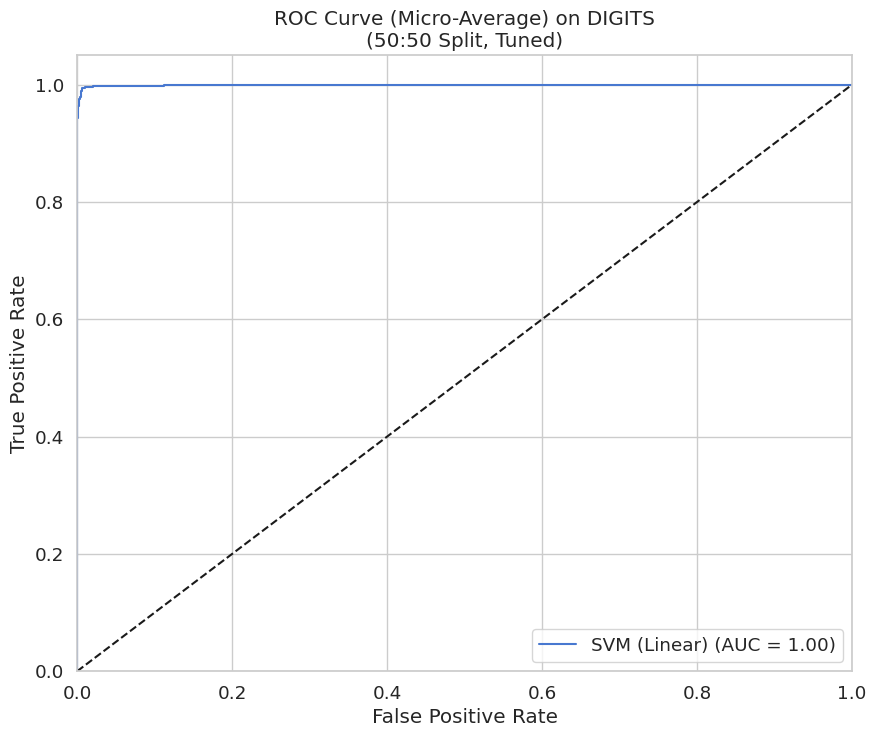


 running not tuned models for 60:40 Split...
--- Results for SVM (Linear) on DIGITS (60:40 Split, Default) ---
Accuracy: 0.9708
Precision (Weighted): 0.9721
Recall (Weighted): 0.9708
F1-Score (Weighted): 0.9709



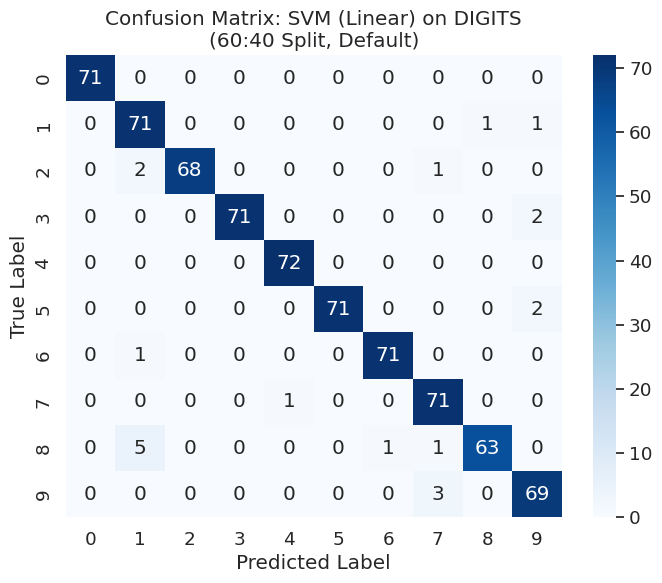

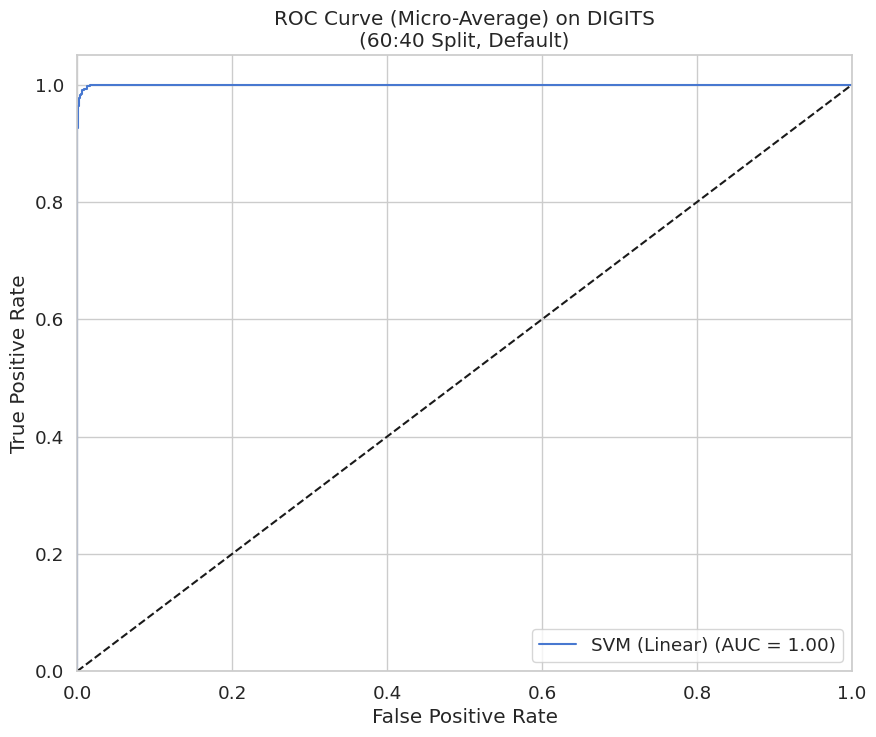


tuned model for 60:40 Split...
Tuning SVM (Linear)...
best parameters for SVM (Linear): {'C': 0.1}
--- Results for SVM (Linear) on DIGITS (60:40 Split, Tuned) ---
Accuracy: 0.9680
Precision (Weighted): 0.9700
Recall (Weighted): 0.9680
F1-Score (Weighted): 0.9681



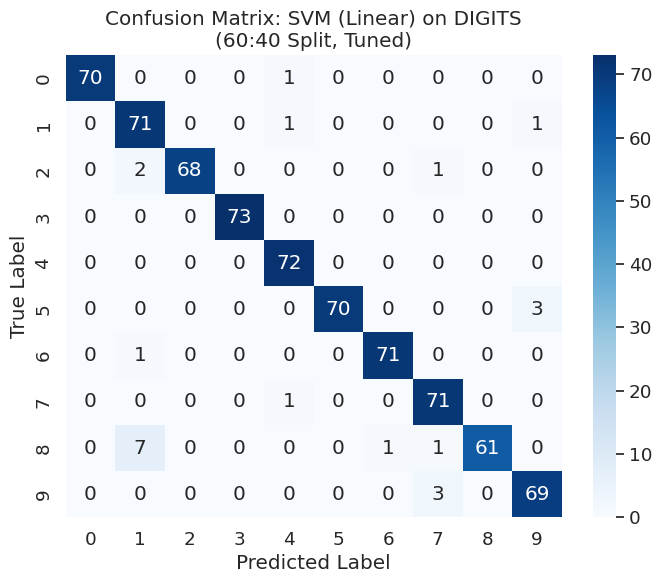

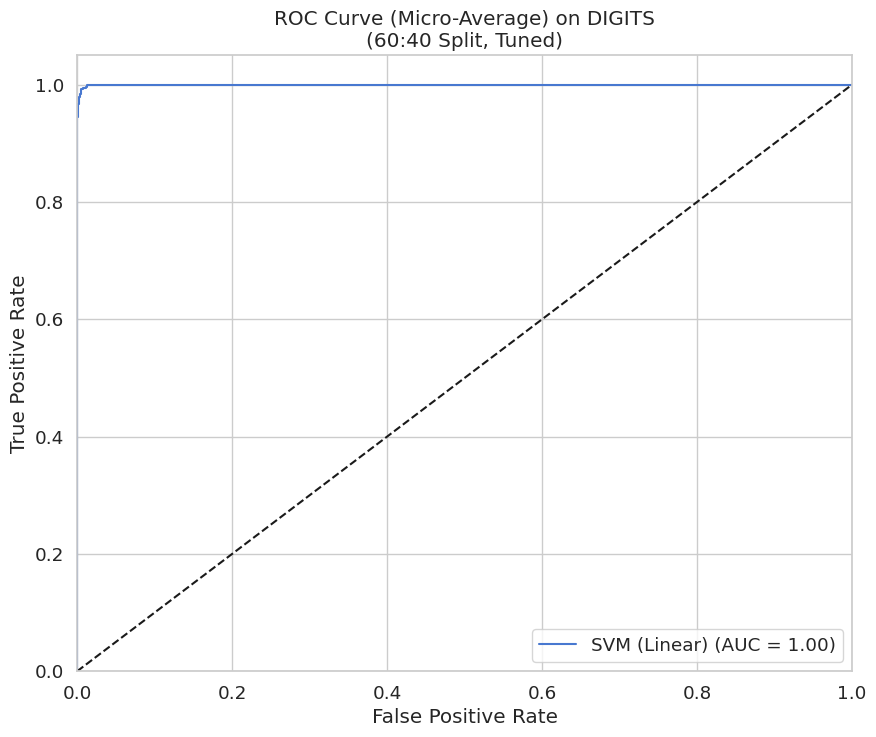


 running not tuned models for 70:30 Split...
--- Results for SVM (Linear) on DIGITS (70:30 Split, Default) ---
Accuracy: 0.9796
Precision (Weighted): 0.9806
Recall (Weighted): 0.9796
F1-Score (Weighted): 0.9795



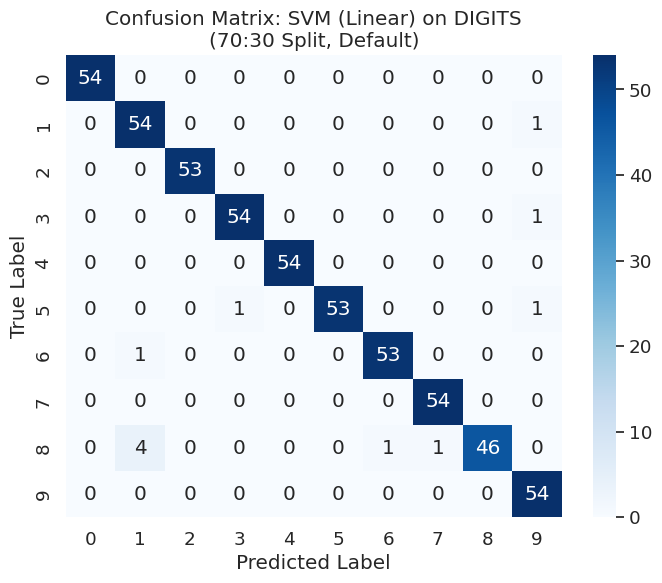

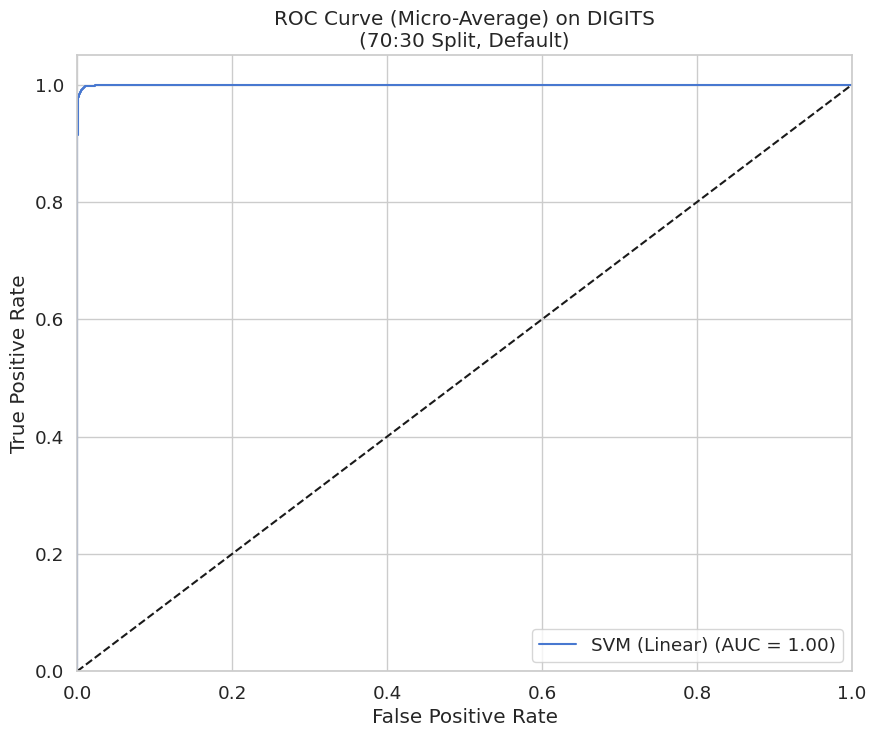


tuned model for 70:30 Split...
Tuning SVM (Linear)...
best parameters for SVM (Linear): {'C': 1}
--- Results for SVM (Linear) on DIGITS (70:30 Split, Tuned) ---
Accuracy: 0.9796
Precision (Weighted): 0.9806
Recall (Weighted): 0.9796
F1-Score (Weighted): 0.9795



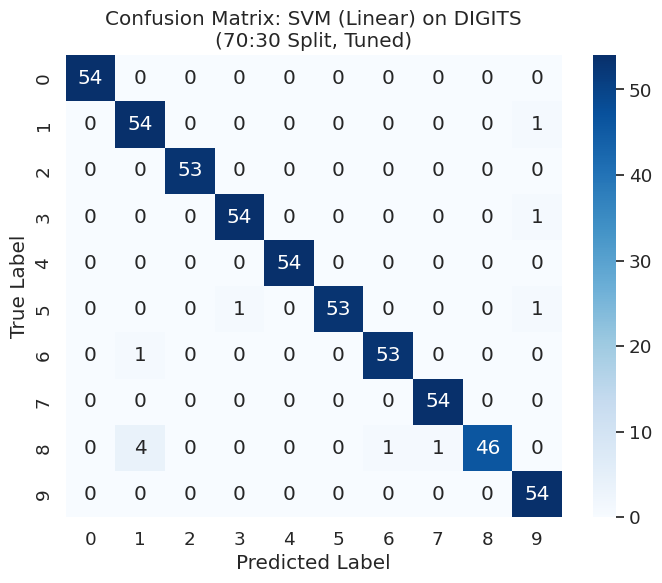

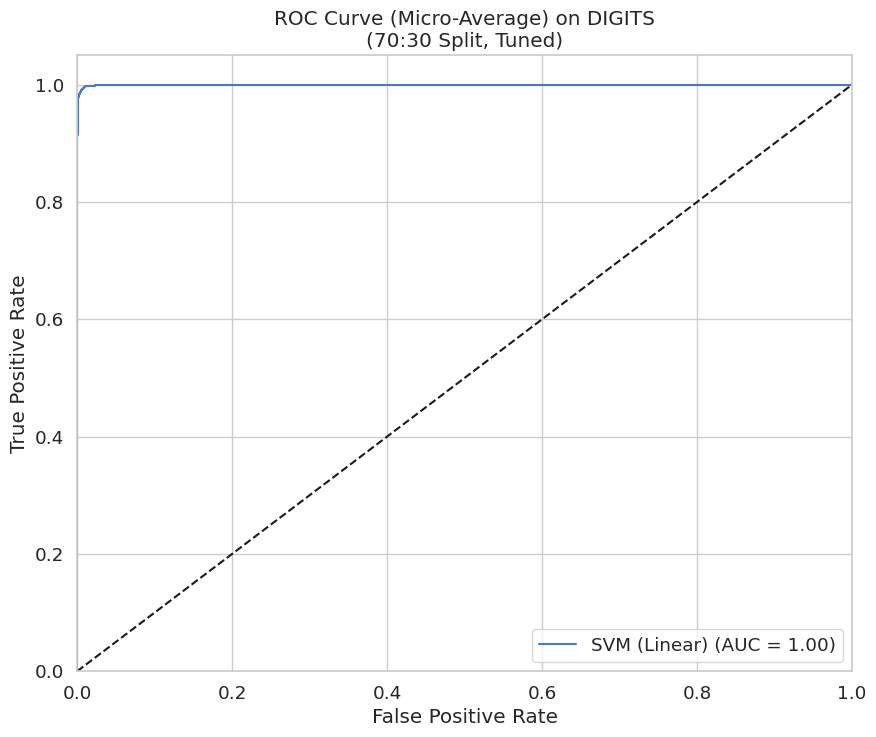


 running not tuned models for 80:20 Split...
--- Results for SVM (Linear) on DIGITS (80:20 Split, Default) ---
Accuracy: 0.9750
Precision (Weighted): 0.9754
Recall (Weighted): 0.9750
F1-Score (Weighted): 0.9749



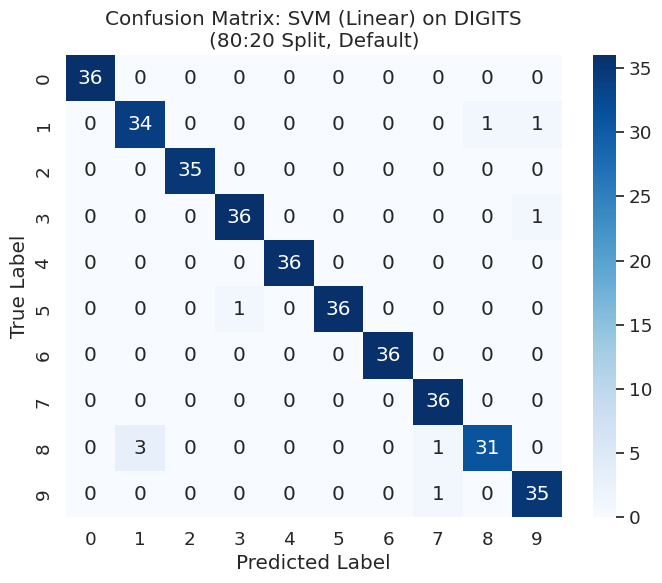

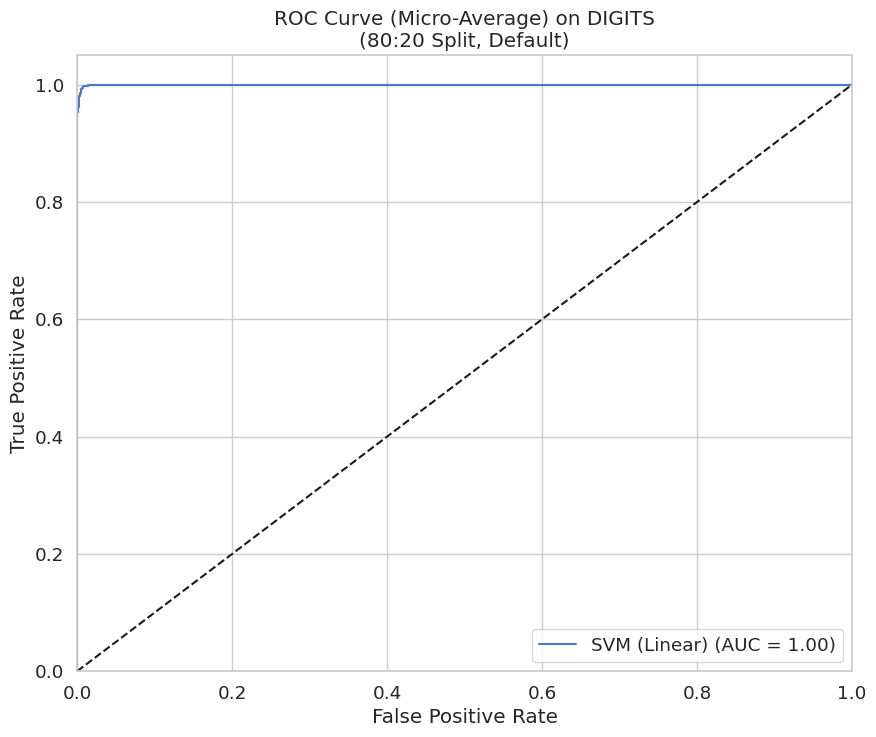


tuned model for 80:20 Split...
Tuning SVM (Linear)...
best parameters for SVM (Linear): {'C': 0.1}
--- Results for SVM (Linear) on DIGITS (80:20 Split, Tuned) ---
Accuracy: 0.9833
Precision (Weighted): 0.9835
Recall (Weighted): 0.9833
F1-Score (Weighted): 0.9832



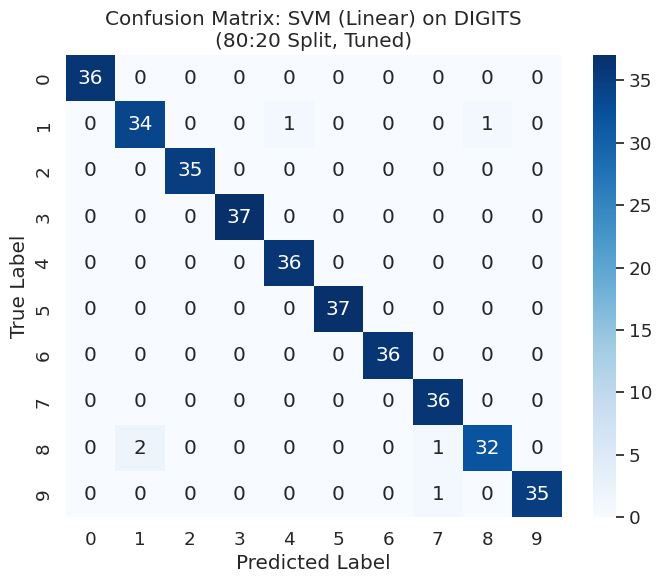

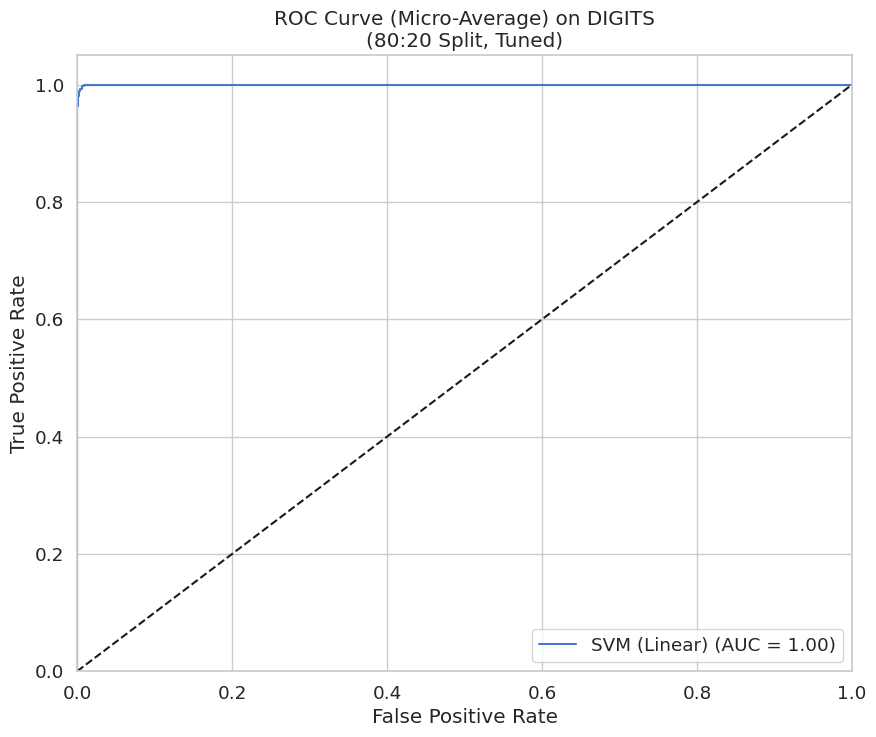


--- Starting for digits dataset with PCA ---
Original features: 64, PCA features: 39

running tuned model for 80:20 Split, PCA...
tuning SVM (Linear) with PCA features...
best parameters for SVM (Linear) on PCA data: {'C': 0.1}
--- Results for SVM (Linear) on DIGITS (80:20 Split, PCA, Tuned) ---
Accuracy: 0.9711
Precision (Weighted): 0.9716
Recall (Weighted): 0.9711
F1-Score (Weighted): 0.9710



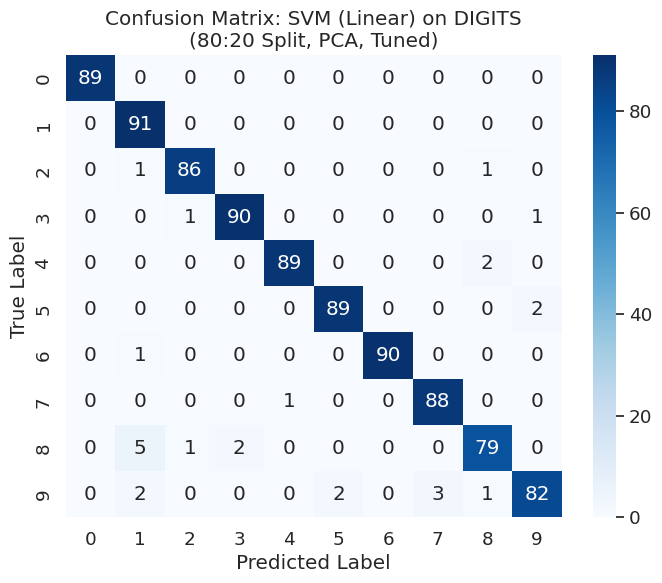

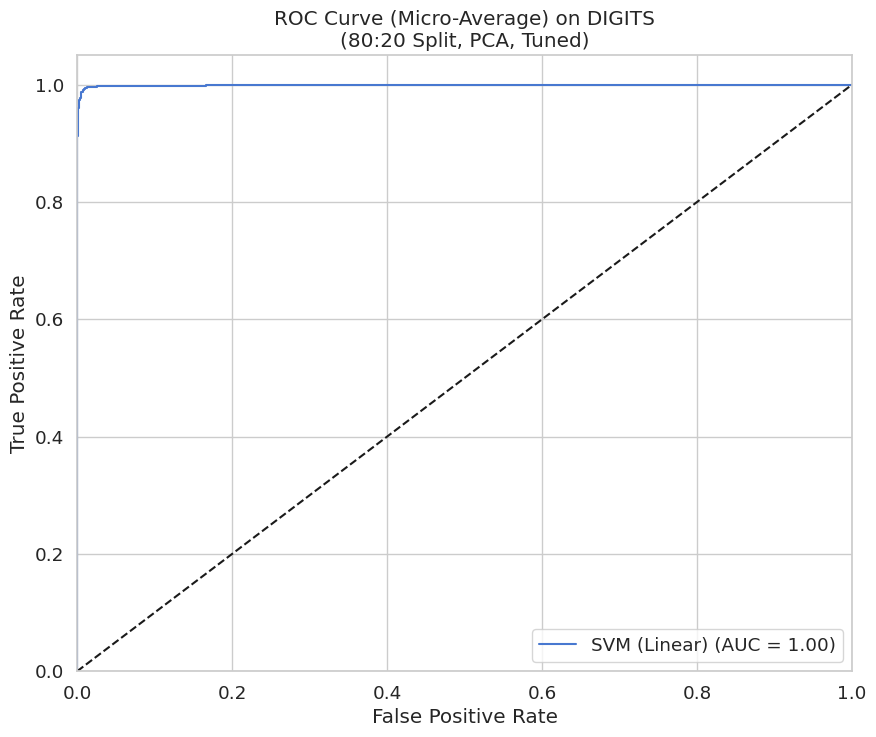

Original features: 64, PCA features: 39

running tuned model for 80:20 Split, PCA...
tuning SVM (Linear) with PCA features...
best parameters for SVM (Linear) on PCA data: {'C': 0.1}
--- Results for SVM (Linear) on DIGITS (80:20 Split, PCA, Tuned) ---
Accuracy: 0.9777
Precision (Weighted): 0.9787
Recall (Weighted): 0.9777
F1-Score (Weighted): 0.9778



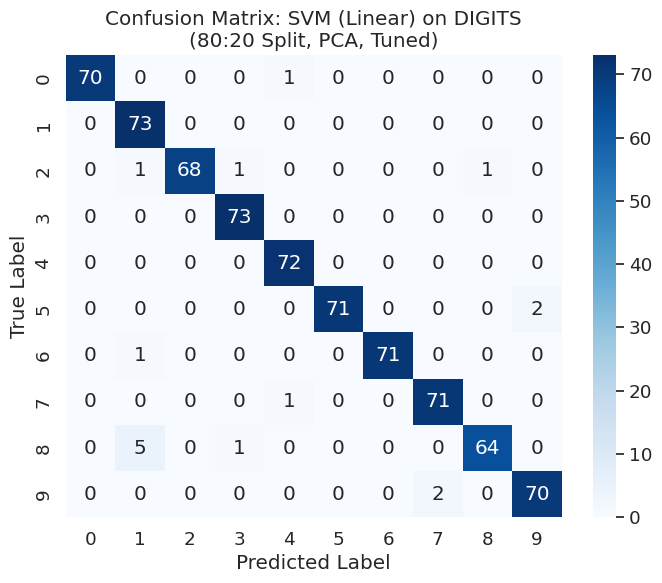

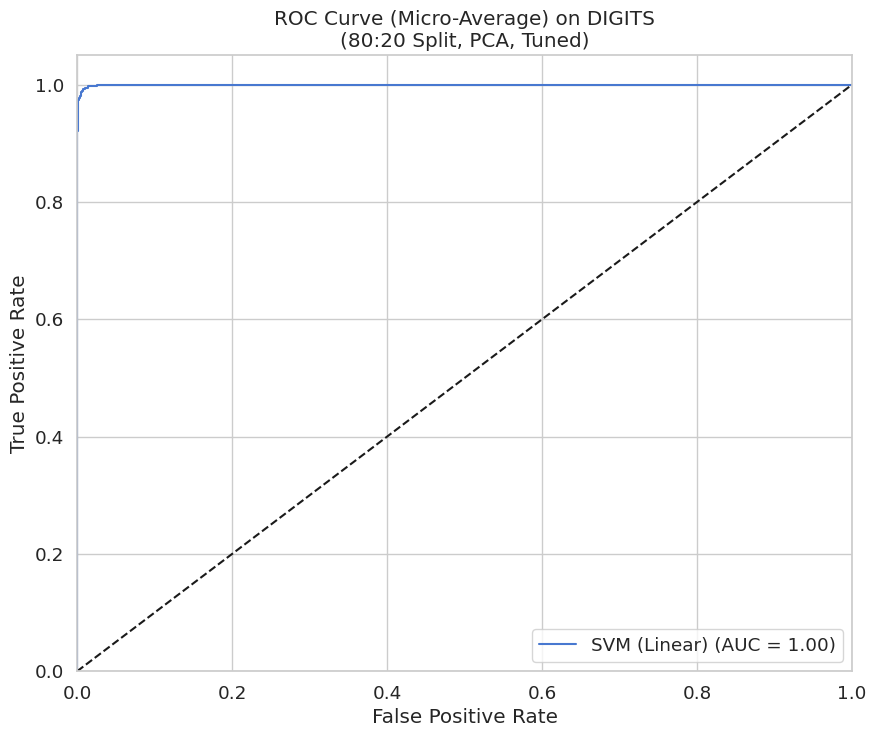

Original features: 64, PCA features: 39

running tuned model for 80:20 Split, PCA...
tuning SVM (Linear) with PCA features...
best parameters for SVM (Linear) on PCA data: {'C': 0.1}
--- Results for SVM (Linear) on DIGITS (80:20 Split, PCA, Tuned) ---
Accuracy: 0.9796
Precision (Weighted): 0.9810
Recall (Weighted): 0.9796
F1-Score (Weighted): 0.9795



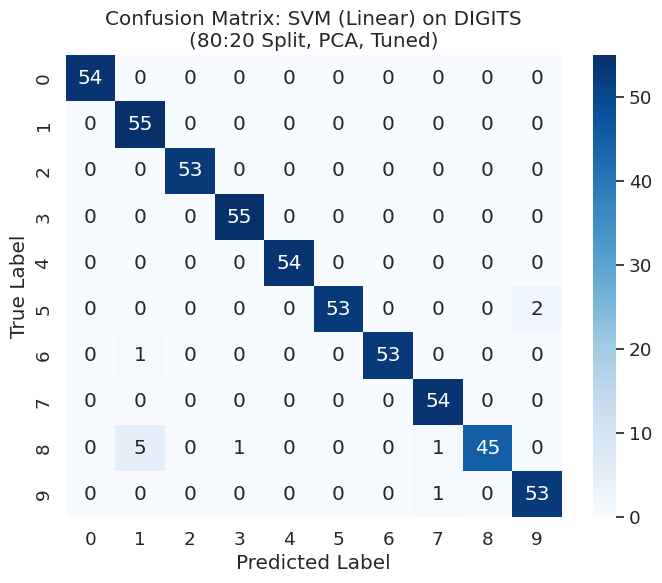

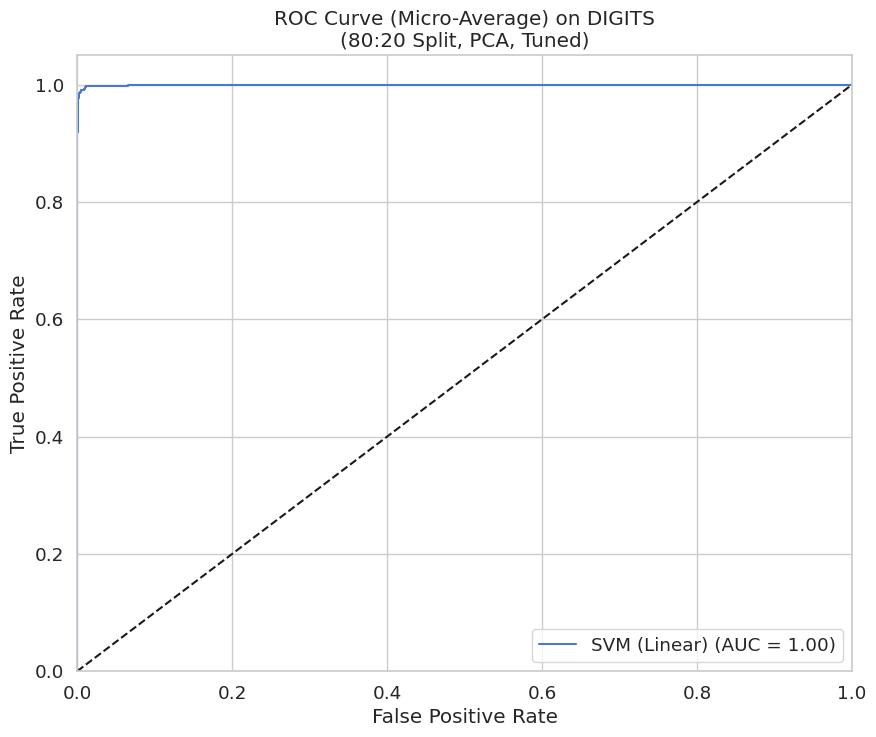

Original features: 64, PCA features: 40

running tuned model for 80:20 Split, PCA...
tuning SVM (Linear) with PCA features...
best parameters for SVM (Linear) on PCA data: {'C': 0.1}
--- Results for SVM (Linear) on DIGITS (80:20 Split, PCA, Tuned) ---
Accuracy: 0.9833
Precision (Weighted): 0.9847
Recall (Weighted): 0.9833
F1-Score (Weighted): 0.9833



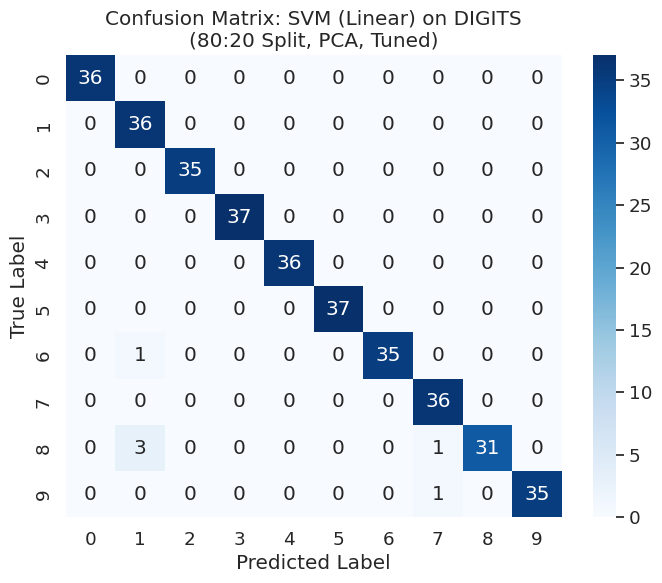

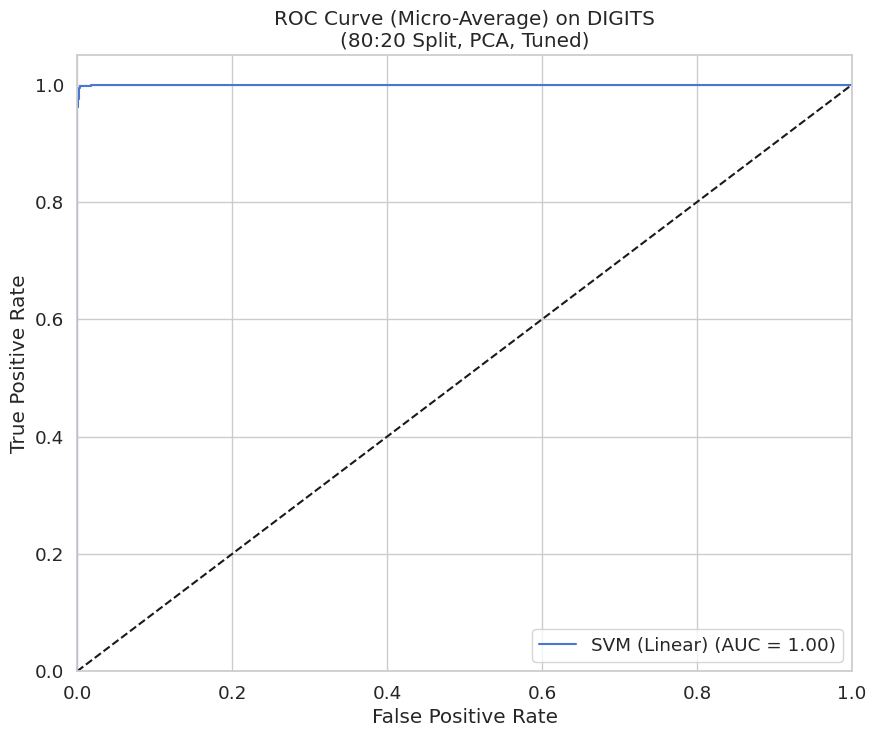

In [ ]:
splits = [0.5, 0.4, 0.3, 0.2]
def svm_linear_complete(dataset, dataset_name):

    X, y = digits_dataset.data, digits_dataset.target
    results_list = []

    classifiers = {
        "SVM (Linear)": SVC(kernel='linear', probability=True, random_state=42),

    }

    param_grids = {
        "SVM (Linear)": {'C': [0.1, 1, 10]},
    }

    print(f"Experiments for digits dataset on Original Features ---")
    for split in splits:
        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=split, random_state=42, stratify=y
        )

        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)

        split_note = f"{int(100-split*100)}:{int(split*100)} Split"

        # without tuning
        print(f"\n running not tuned models for {split_note}...")
        trained_models_default = {}
        for name, model in classifiers.items():
            model.fit(X_train_scaled, y_train)
            trained_models_default[name] = model
            evaluate_model(model, X_test_scaled, y_test, name, dataset_name, split, f"{split_note}, Default", results_list)
            if name == "MLP":
                plot_loss_curve(model, name, dataset_name, f"{split_note}, Default")
        plot_roc_curves(trained_models_default, X_test_scaled, y_test, dataset_name, f"{split_note}, Default")

        # with tuning
        print(f"\ntuned model for {split_note}...")
        trained_models_tuned = {}
        for name, model in classifiers.items():
            print(f"Tuning {name}...")
            grid_search = GridSearchCV(model, param_grids[name], cv=5, n_jobs=-1, scoring='accuracy')
            grid_search.fit(X_train_scaled, y_train)
            best_model = grid_search.best_estimator_
            trained_models_tuned[name] = best_model
            print(f"best parameters for {name}: {grid_search.best_params_}")
            evaluate_model(best_model, X_test_scaled, y_test, name, dataset_name, split, f"{split_note}, Tuned", results_list)
        plot_roc_curves(trained_models_tuned, X_test_scaled, y_test, dataset_name, f"{split_note}, Tuned")

    # WITH PCA
    print(f"\n--- Starting for digits dataset with PCA ---")


    for split in splits:
      X_train, X_test, y_train, y_test = train_test_split(
          X, y, test_size=split, random_state=42, stratify=y
      )

      scaler = StandardScaler()
      X_train_scaled = scaler.fit_transform(X_train)
      X_test_scaled = scaler.transform(X_test)

      # pca with 95% variance
      pca = PCA(n_components=0.95)
      X_train_pca = pca.fit_transform(X_train_scaled)
      X_test_pca = pca.transform(X_test_scaled)
      print(f"Original features: {X_train.shape[1]}, PCA features: {X_train_pca.shape[1]}")

      pca_note = f"80:20 Split, PCA"

      # Model with tuning on PCA
      print(f"\nrunning tuned model for {pca_note}...")
      trained_models_pca = {}
      for name, model in classifiers.items():
          print(f"tuning {name} with PCA features...")
          grid_search = GridSearchCV(model, param_grids[name], cv=5, n_jobs=-1, scoring='accuracy')
          grid_search.fit(X_train_pca, y_train)
          best_model = grid_search.best_estimator_
          trained_models_pca[name] = best_model
          print(f"best parameters for {name} on PCA data: {grid_search.best_params_}")
          evaluate_model(best_model, X_test_pca, y_test, name, dataset_name, split, f"{pca_note}, Tuned", results_list)
      plot_roc_curves(trained_models_pca, X_test_pca, y_test, dataset_name, f"{pca_note}, Tuned")

    return pd.DataFrame(results_list)
svm_linear_df_2 = svm_linear_complete(digits_dataset,"DIGITS")


 Results Summary for DIGITS


,Dataset,Model,Train-Test Split,Tuning,PCA,Accuracy,Precision,Recall,F1-Score,Inference Time (s)
0,DIGITS,SVM (Linear),50:50,Default,No,0.9711,0.9715,0.9711,0.9710,0.0132
1,DIGITS,SVM (Linear),50:50,Tuned,No,0.9711,0.9717,0.9711,0.9710,0.0137
2,DIGITS,SVM (Linear),60:40,Default,No,0.9708,0.9721,0.9708,0.9709,0.0124
3,DIGITS,SVM (Linear),60:40,Tuned,No,0.9680,0.9700,0.9680,0.9681,0.0128
4,DIGITS,SVM (Linear),70:30,Default,No,0.9796,0.9806,0.9796,0.9795,0.0087
5,DIGITS,SVM (Linear),70:30,Tuned,No,0.9796,0.9806,0.9796,0.9795,0.0112
6,DIGITS,SVM (Linear),80:20,Default,No,0.9750,0.9754,0.9750,0.9749,0.0079
7,DIGITS,SVM (Linear),80:20,Tuned,No,0.9833,0.9835,0.9833,0.9832,0.0118
8,DIGITS,SVM (Linear),50:50,Tuned,Yes,0.9711,0.9716,0.9711,0.9710,0.0132
9,DIGITS,SVM (Linear),60:40,Tuned,Yes,0.9777,0.9787,0.9777,0.9778,0.0122


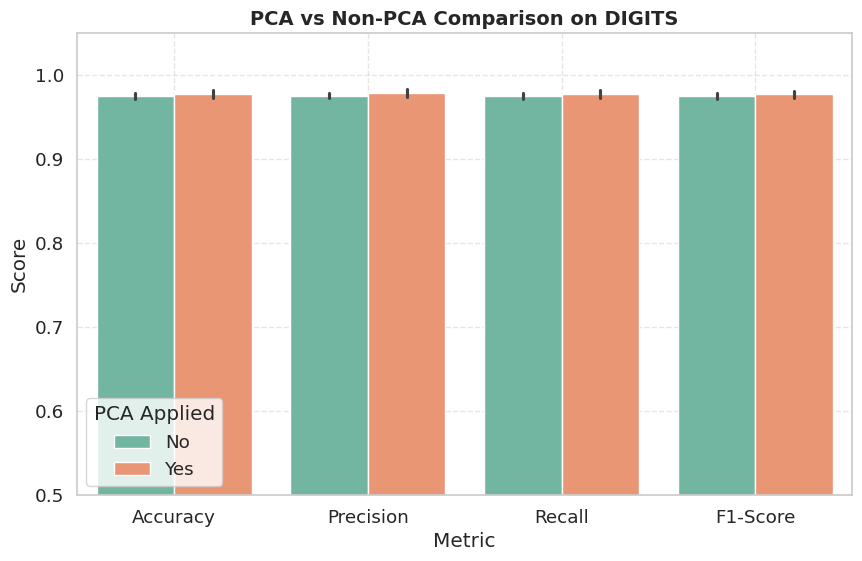

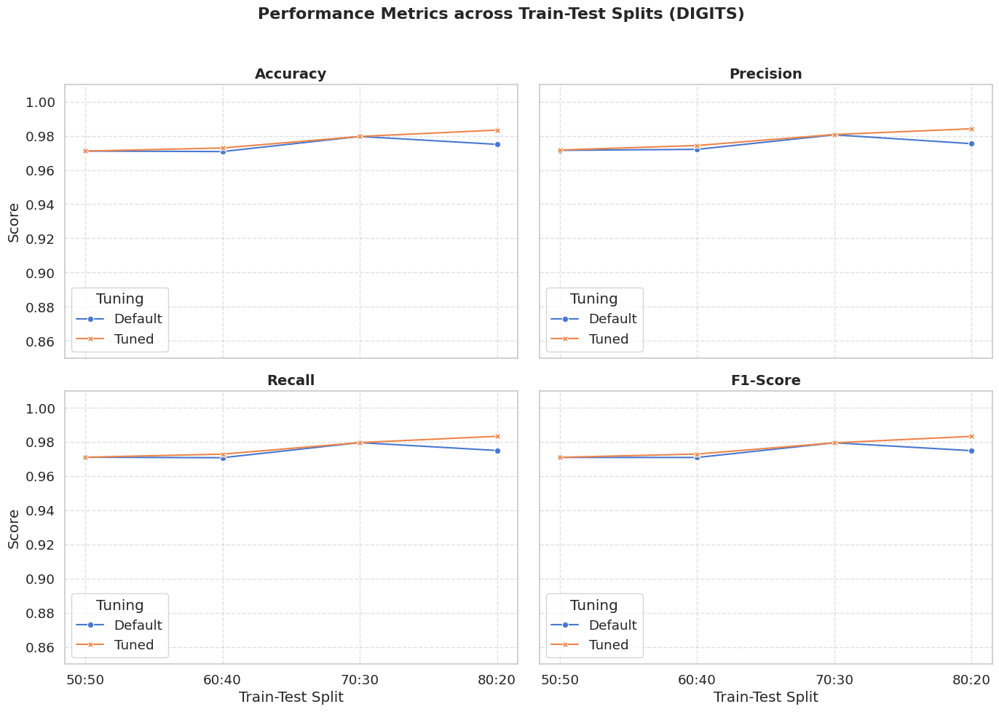

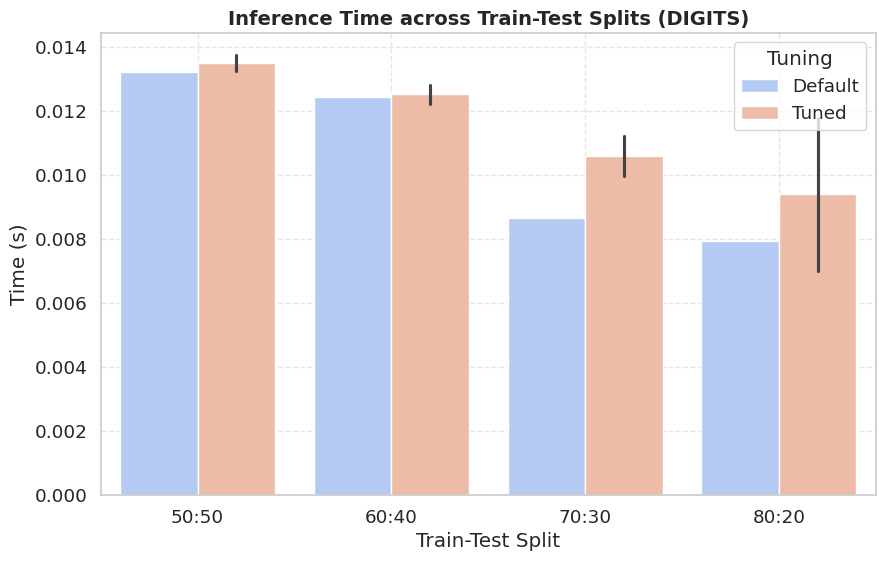

In [ ]:
analyze_results(svm_linear_df_2,"DIGITS")

Experiments for digits dataset on Original Features ---

 running not tuned models for 50:50 Split...
--- Results for SVM (Poly) on DIGITS (50:50 Split, Default) ---
Accuracy: 0.9277
Precision (Weighted): 0.9509
Recall (Weighted): 0.9277
F1-Score (Weighted): 0.9325



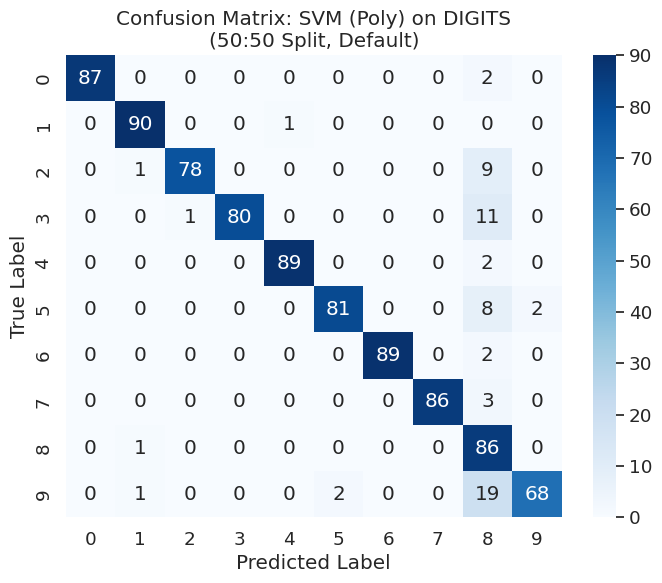

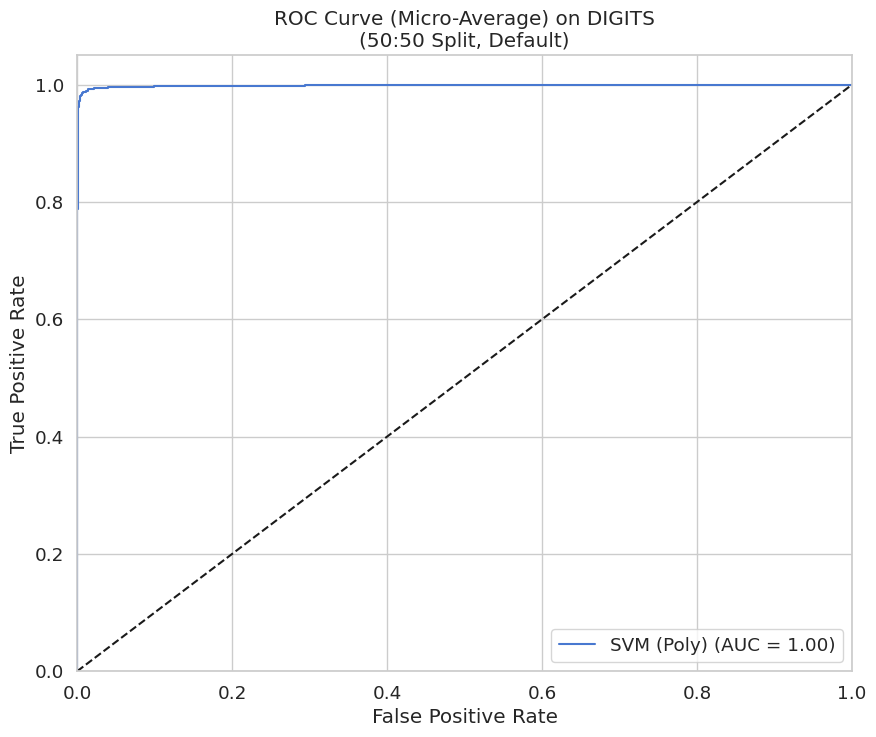


tuned model for 50:50 Split...
Tuning SVM (Poly)...
best parameters for SVM (Poly): {'C': 10, 'degree': 3}
--- Results for SVM (Poly) on DIGITS (50:50 Split, Tuned) ---
Accuracy: 0.9855
Precision (Weighted): 0.9859
Recall (Weighted): 0.9855
F1-Score (Weighted): 0.9856



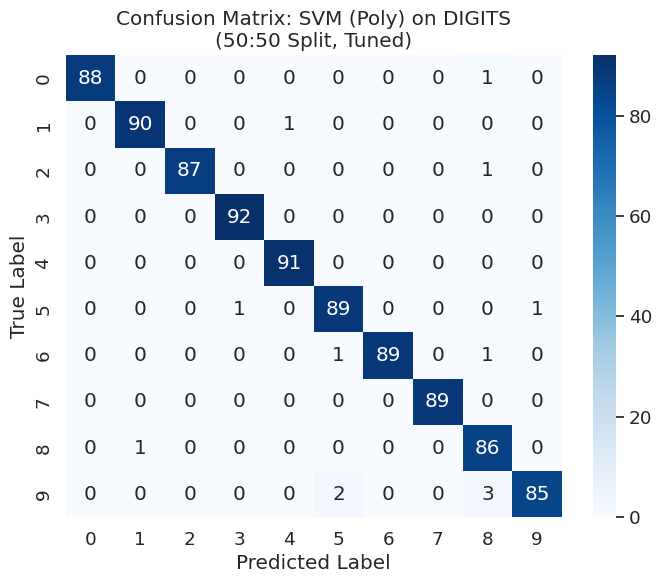

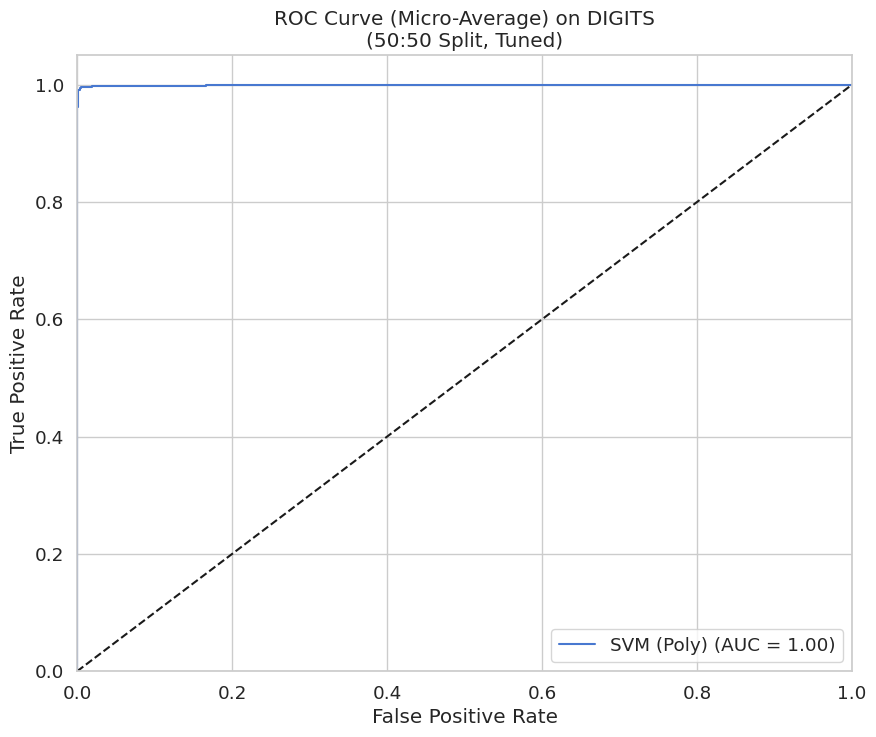


 running not tuned models for 60:40 Split...
--- Results for SVM (Poly) on DIGITS (60:40 Split, Default) ---
Accuracy: 0.9471
Precision (Weighted): 0.9604
Recall (Weighted): 0.9471
F1-Score (Weighted): 0.9499



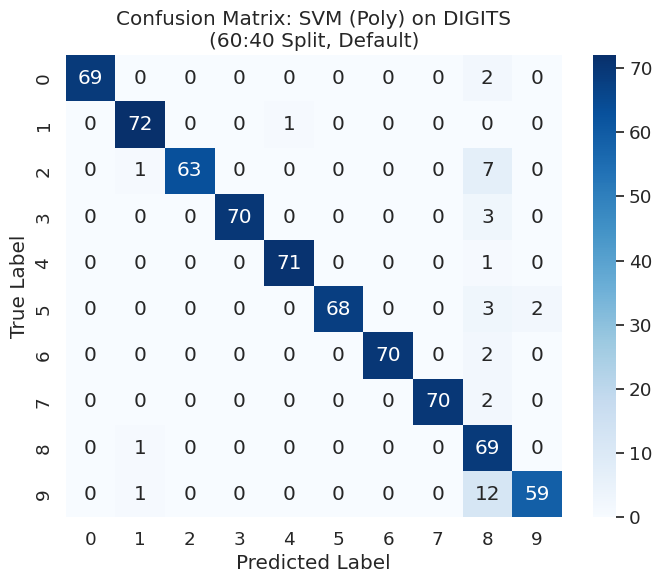

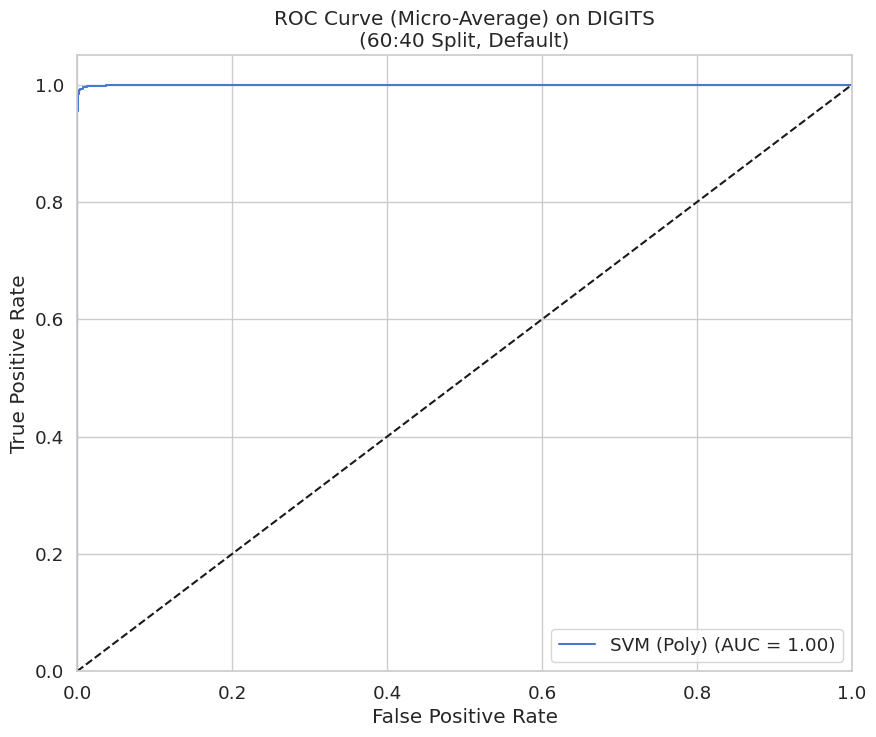


tuned model for 60:40 Split...
Tuning SVM (Poly)...
best parameters for SVM (Poly): {'C': 10, 'degree': 2}
--- Results for SVM (Poly) on DIGITS (60:40 Split, Tuned) ---
Accuracy: 0.9764
Precision (Weighted): 0.9767
Recall (Weighted): 0.9764
F1-Score (Weighted): 0.9764



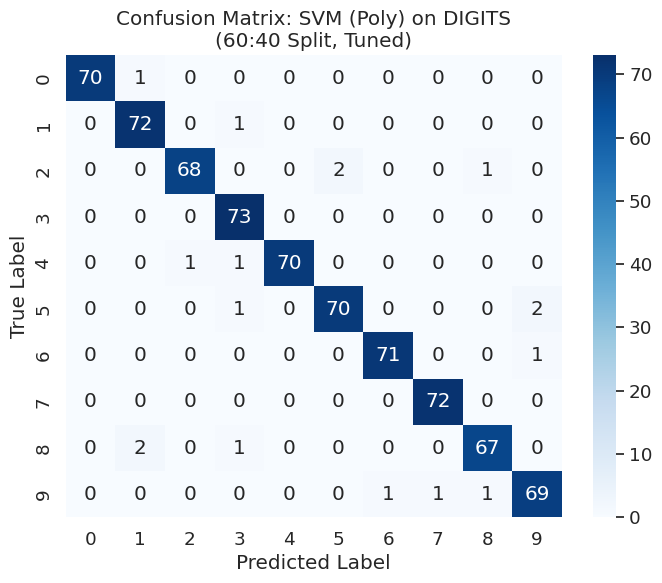

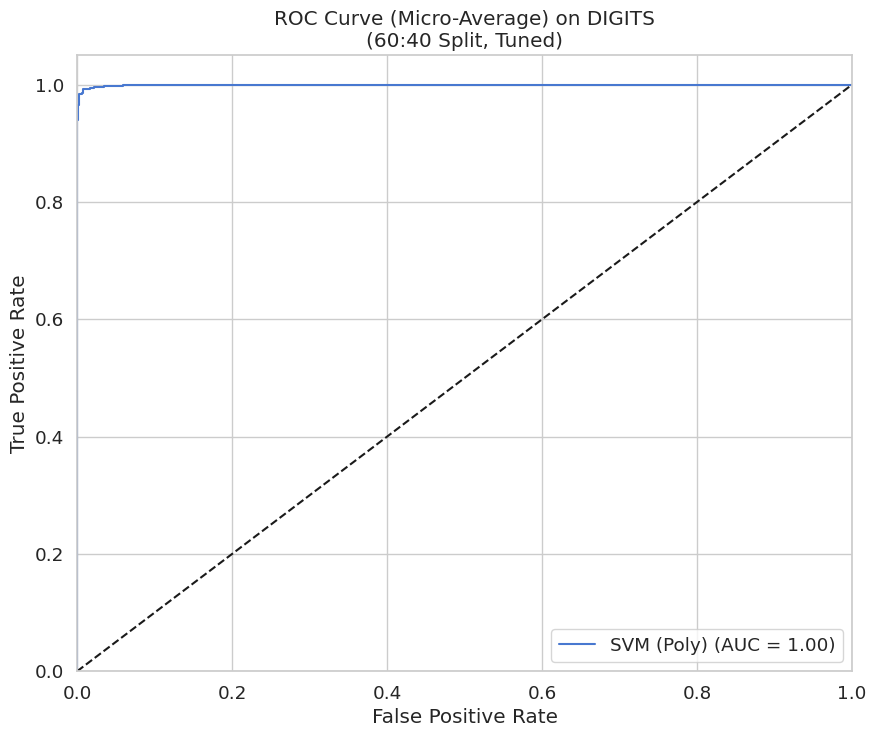


 running not tuned models for 70:30 Split...
--- Results for SVM (Poly) on DIGITS (70:30 Split, Default) ---
Accuracy: 0.9667
Precision (Weighted): 0.9717
Recall (Weighted): 0.9667
F1-Score (Weighted): 0.9679



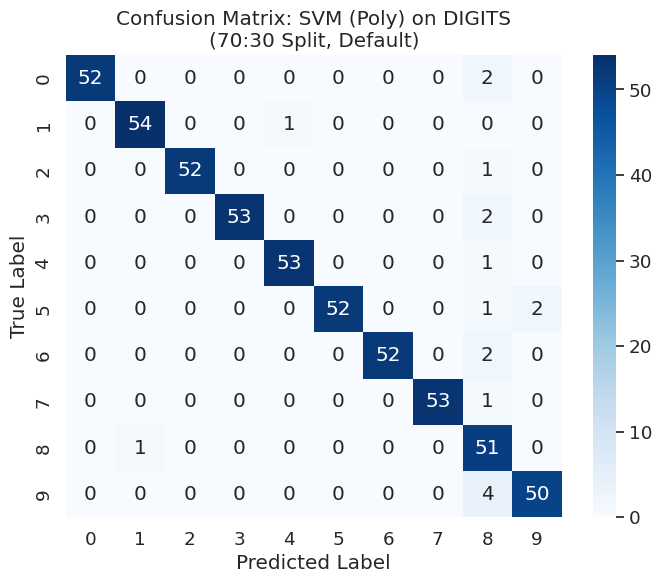

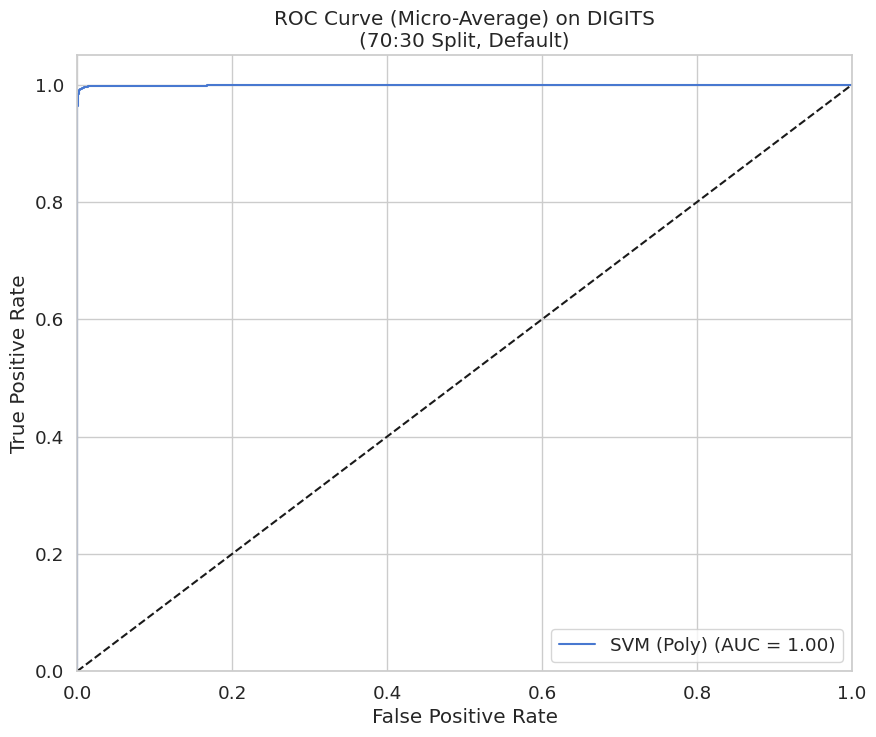


tuned model for 70:30 Split...
Tuning SVM (Poly)...
best parameters for SVM (Poly): {'C': 10, 'degree': 3}
--- Results for SVM (Poly) on DIGITS (70:30 Split, Tuned) ---
Accuracy: 0.9907
Precision (Weighted): 0.9909
Recall (Weighted): 0.9907
F1-Score (Weighted): 0.9908



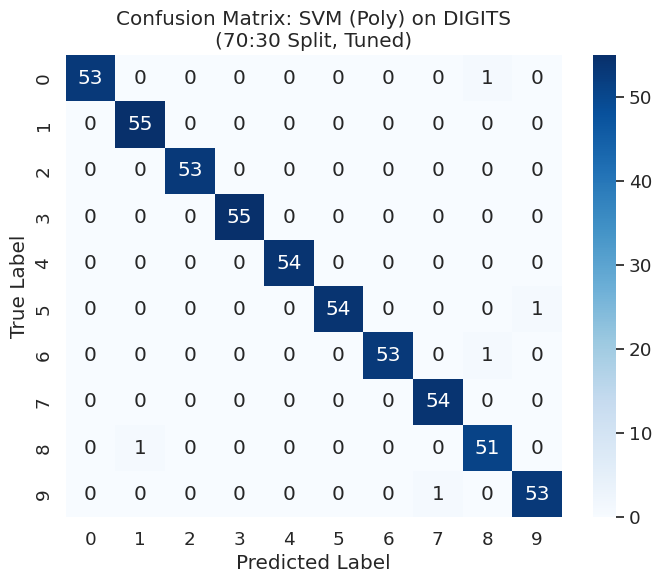

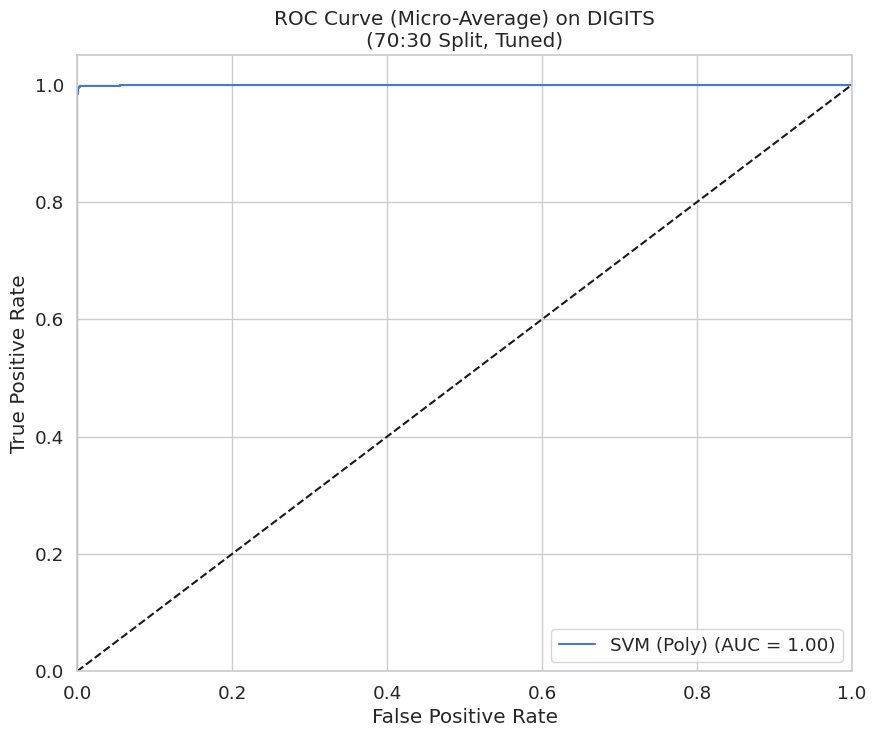


 running not tuned models for 80:20 Split...
--- Results for SVM (Poly) on DIGITS (80:20 Split, Default) ---
Accuracy: 0.9722
Precision (Weighted): 0.9760
Recall (Weighted): 0.9722
F1-Score (Weighted): 0.9731



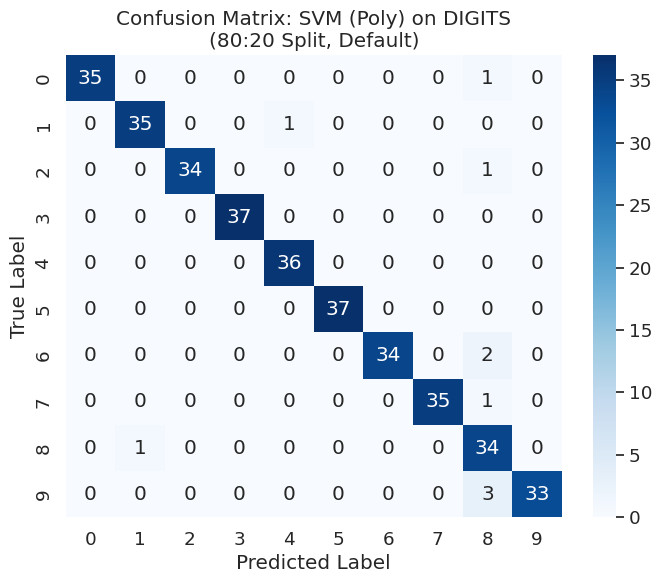

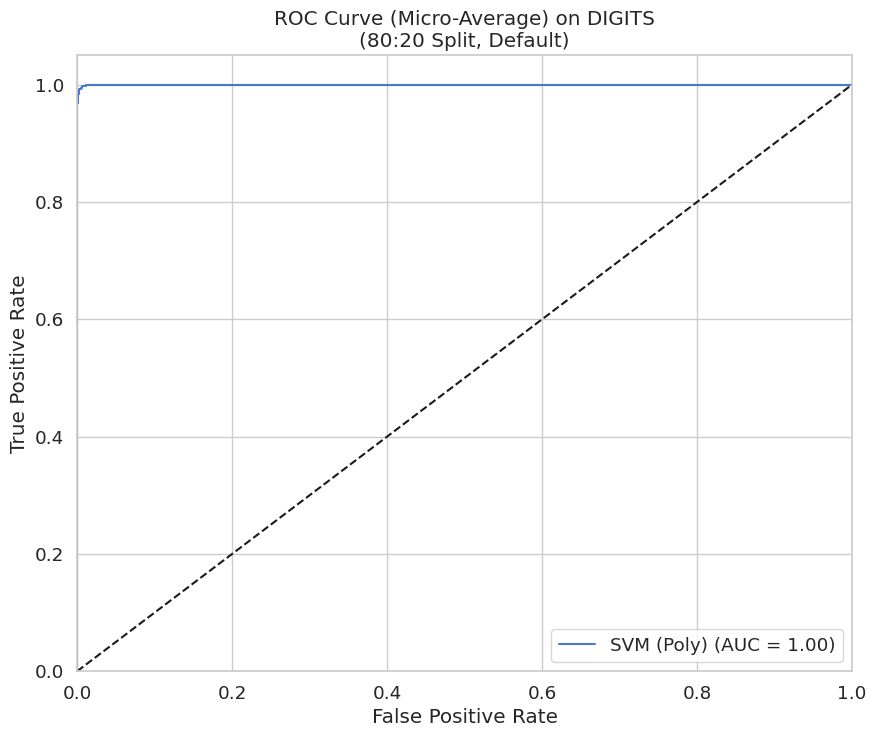


tuned model for 80:20 Split...
Tuning SVM (Poly)...
best parameters for SVM (Poly): {'C': 10, 'degree': 3}
--- Results for SVM (Poly) on DIGITS (80:20 Split, Tuned) ---
Accuracy: 0.9944
Precision (Weighted): 0.9946
Recall (Weighted): 0.9944
F1-Score (Weighted): 0.9944



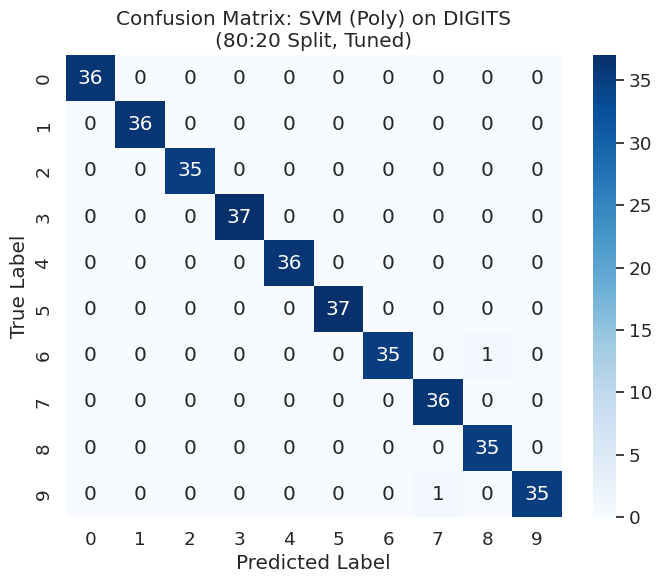

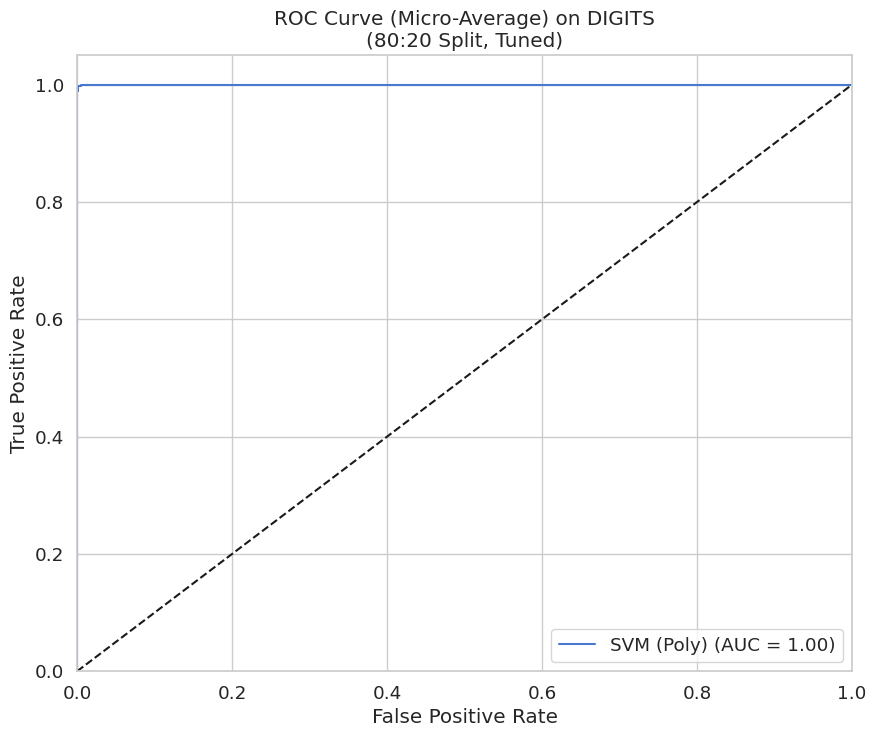


--- Starting for digits dataset with PCA ---
Original features: 64, PCA features: 39

running tuned model for 80:20 Split, PCA...
tuning SVM (Poly) with PCA features...
best parameters for SVM (Poly) on PCA data: {'C': 10, 'degree': 2}
--- Results for SVM (Poly) on DIGITS (80:20 Split, PCA, Tuned) ---
Accuracy: 0.9789
Precision (Weighted): 0.9791
Recall (Weighted): 0.9789
F1-Score (Weighted): 0.9789



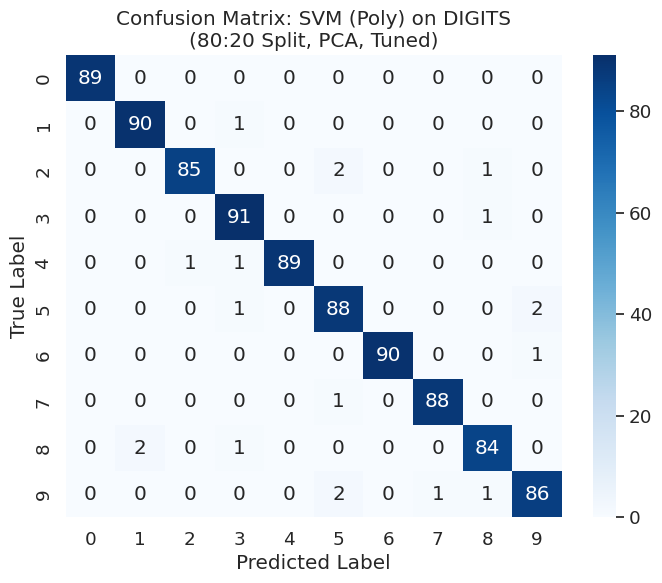

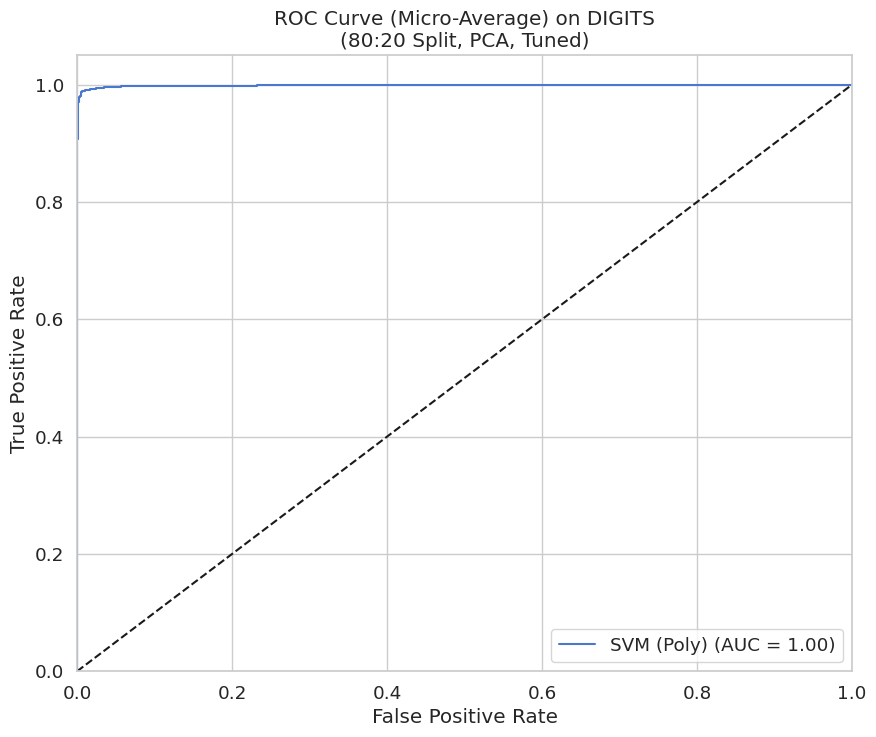

Original features: 64, PCA features: 39

running tuned model for 80:20 Split, PCA...
tuning SVM (Poly) with PCA features...
best parameters for SVM (Poly) on PCA data: {'C': 10, 'degree': 3}
--- Results for SVM (Poly) on DIGITS (80:20 Split, PCA, Tuned) ---
Accuracy: 0.9889
Precision (Weighted): 0.9891
Recall (Weighted): 0.9889
F1-Score (Weighted): 0.9889



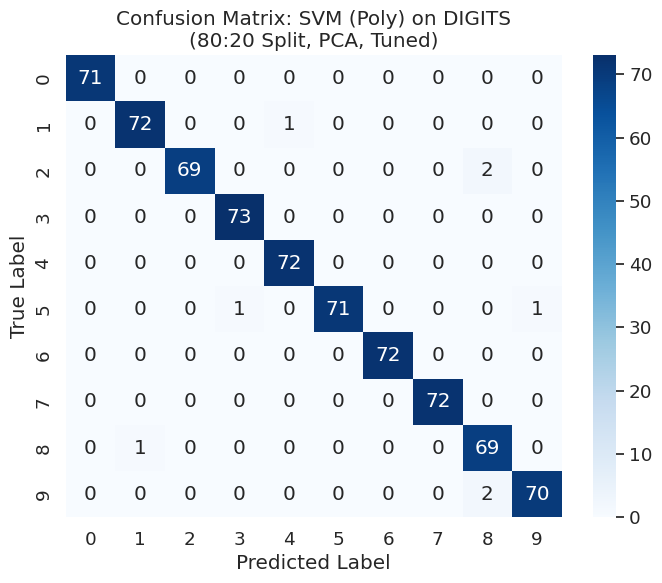

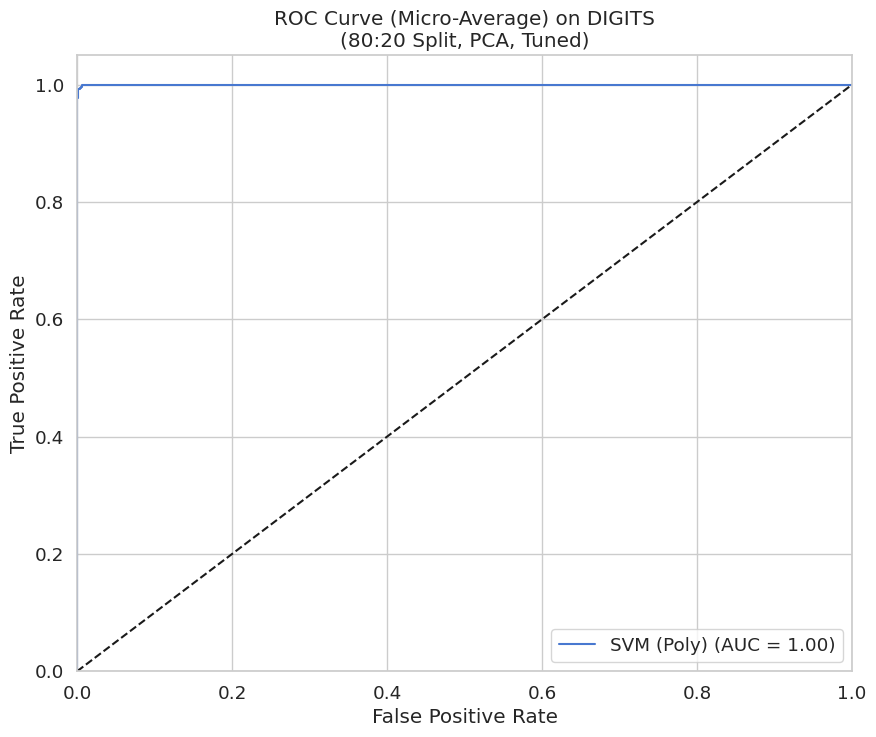

Original features: 64, PCA features: 39

running tuned model for 80:20 Split, PCA...
tuning SVM (Poly) with PCA features...
best parameters for SVM (Poly) on PCA data: {'C': 10, 'degree': 3}
--- Results for SVM (Poly) on DIGITS (80:20 Split, PCA, Tuned) ---
Accuracy: 0.9926
Precision (Weighted): 0.9927
Recall (Weighted): 0.9926
F1-Score (Weighted): 0.9926



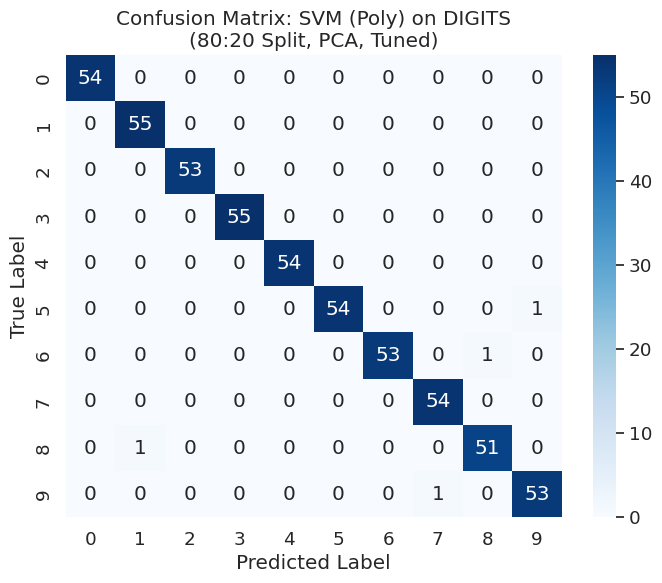

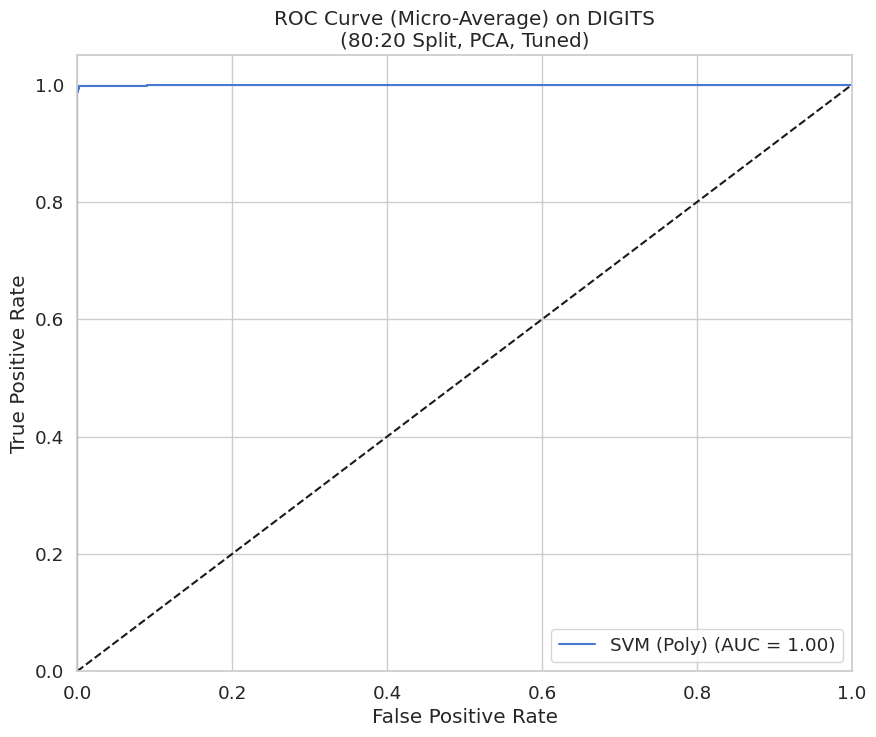

Original features: 64, PCA features: 40

running tuned model for 80:20 Split, PCA...
tuning SVM (Poly) with PCA features...
best parameters for SVM (Poly) on PCA data: {'C': 10, 'degree': 2}
--- Results for SVM (Poly) on DIGITS (80:20 Split, PCA, Tuned) ---
Accuracy: 0.9722
Precision (Weighted): 0.9730
Recall (Weighted): 0.9722
F1-Score (Weighted): 0.9722



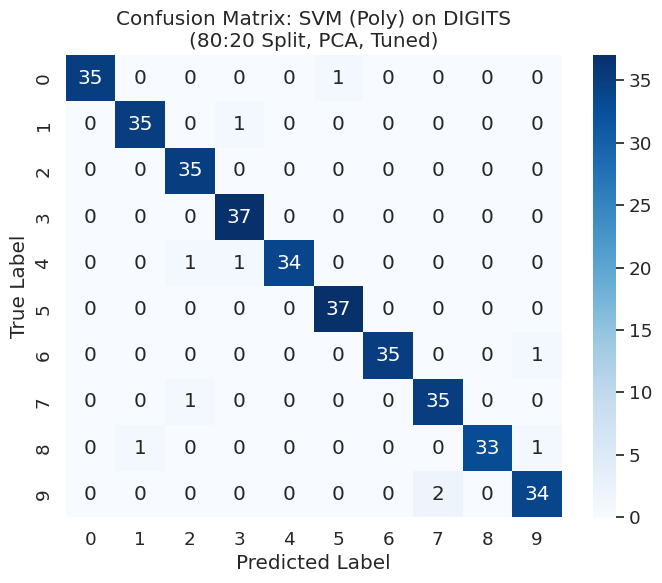

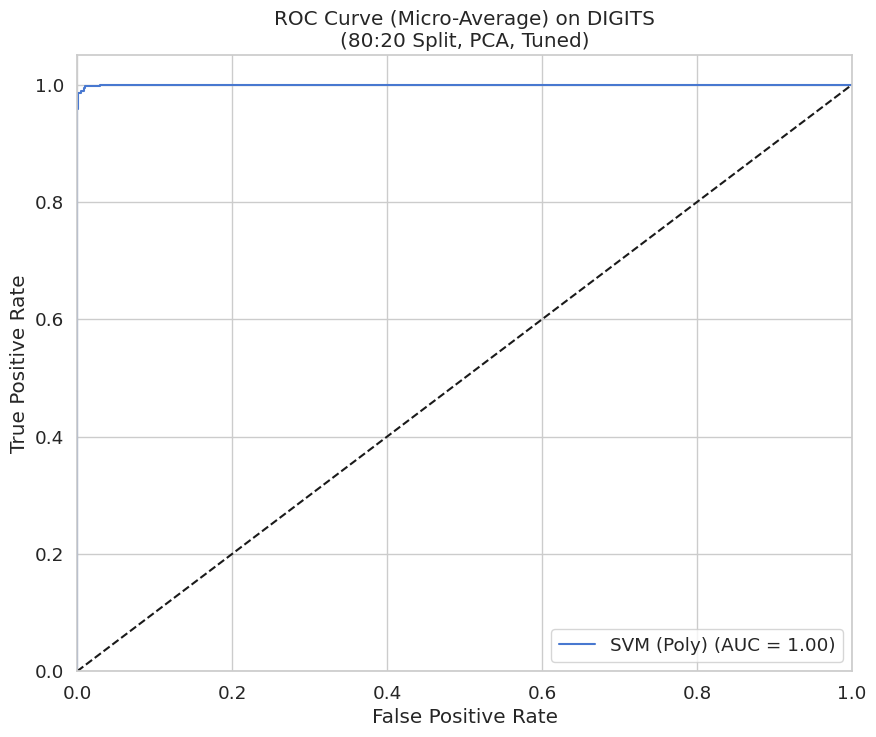

In [ ]:
def svm_polynomial_complete(dataset, dataset_name):

    X, y = digits_dataset.data, digits_dataset.target
    results_list = []

    classifiers = {
          "SVM (Poly)": SVC(kernel='poly', probability=True, random_state=42)
    }

    param_grids = {
        "SVM (Poly)": {'C': [0.1, 1, 10], 'degree': [2, 3]}
    }

    print(f"Experiments for digits dataset on Original Features ---")
    for split in splits:
        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=split, random_state=42, stratify=y
        )

        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)

        split_note = f"{int(100-split*100)}:{int(split*100)} Split"

        # without tuning
        print(f"\n running not tuned models for {split_note}...")
        trained_models_default = {}
        for name, model in classifiers.items():
            model.fit(X_train_scaled, y_train)
            trained_models_default[name] = model
            evaluate_model(model, X_test_scaled, y_test, name, dataset_name, split, f"{split_note}, Default", results_list)
        plot_roc_curves(trained_models_default, X_test_scaled, y_test, dataset_name, f"{split_note}, Default")

        # with tuning
        print(f"\ntuned model for {split_note}...")
        trained_models_tuned = {}
        for name, model in classifiers.items():
            print(f"Tuning {name}...")
            grid_search = GridSearchCV(model, param_grids[name], cv=5, n_jobs=-1, scoring='accuracy')
            grid_search.fit(X_train_scaled, y_train)
            best_model = grid_search.best_estimator_
            trained_models_tuned[name] = best_model
            print(f"best parameters for {name}: {grid_search.best_params_}")
            evaluate_model(best_model, X_test_scaled, y_test, name, dataset_name, split, f"{split_note}, Tuned", results_list)
        plot_roc_curves(trained_models_tuned, X_test_scaled, y_test, dataset_name, f"{split_note}, Tuned")

    # WITH PCA
    print(f"\n--- Starting for digits dataset with PCA ---")


    for split in splits:
      X_train, X_test, y_train, y_test = train_test_split(
          X, y, test_size=split, random_state=42, stratify=y
      )

      scaler = StandardScaler()
      X_train_scaled = scaler.fit_transform(X_train)
      X_test_scaled = scaler.transform(X_test)

      # pca with 95% variance
      pca = PCA(n_components=0.95)
      X_train_pca = pca.fit_transform(X_train_scaled)
      X_test_pca = pca.transform(X_test_scaled)
      print(f"Original features: {X_train.shape[1]}, PCA features: {X_train_pca.shape[1]}")

      pca_note = f"80:20 Split, PCA"

      # Model with tuning on PCA
      print(f"\nrunning tuned model for {pca_note}...")
      trained_models_pca = {}
      for name, model in classifiers.items():
          print(f"tuning {name} with PCA features...")
          grid_search = GridSearchCV(model, param_grids[name], cv=5, n_jobs=-1, scoring='accuracy')
          grid_search.fit(X_train_pca, y_train)
          best_model = grid_search.best_estimator_
          trained_models_pca[name] = best_model
          print(f"best parameters for {name} on PCA data: {grid_search.best_params_}")
          evaluate_model(best_model, X_test_pca, y_test, name, dataset_name, split, f"{pca_note}, Tuned", results_list)
      plot_roc_curves(trained_models_pca, X_test_pca, y_test, dataset_name, f"{pca_note}, Tuned")

    return pd.DataFrame(results_list)
svm_polynomial_df_2 = svm_polynomial_complete(digits_dataset,"DIGITS")


 Results Summary for DIGITS


,Dataset,Model,Train-Test Split,Tuning,PCA,Accuracy,Precision,Recall,F1-Score,Inference Time (s)
0,DIGITS,SVM (Poly),50:50,Default,No,0.9277,0.9509,0.9277,0.9325,0.0372
1,DIGITS,SVM (Poly),50:50,Tuned,No,0.9855,0.9859,0.9855,0.9856,0.0206
2,DIGITS,SVM (Poly),60:40,Default,No,0.9471,0.9604,0.9471,0.9499,0.0200
3,DIGITS,SVM (Poly),60:40,Tuned,No,0.9764,0.9767,0.9764,0.9764,0.0354
4,DIGITS,SVM (Poly),70:30,Default,No,0.9667,0.9717,0.9667,0.9679,0.0192
5,DIGITS,SVM (Poly),70:30,Tuned,No,0.9907,0.9909,0.9907,0.9908,0.0150
6,DIGITS,SVM (Poly),80:20,Default,No,0.9722,0.9760,0.9722,0.9731,0.0123
7,DIGITS,SVM (Poly),80:20,Tuned,No,0.9944,0.9946,0.9944,0.9944,0.0124
8,DIGITS,SVM (Poly),50:50,Tuned,Yes,0.9789,0.9791,0.9789,0.9789,0.0327
9,DIGITS,SVM (Poly),60:40,Tuned,Yes,0.9889,0.9891,0.9889,0.9889,0.0164


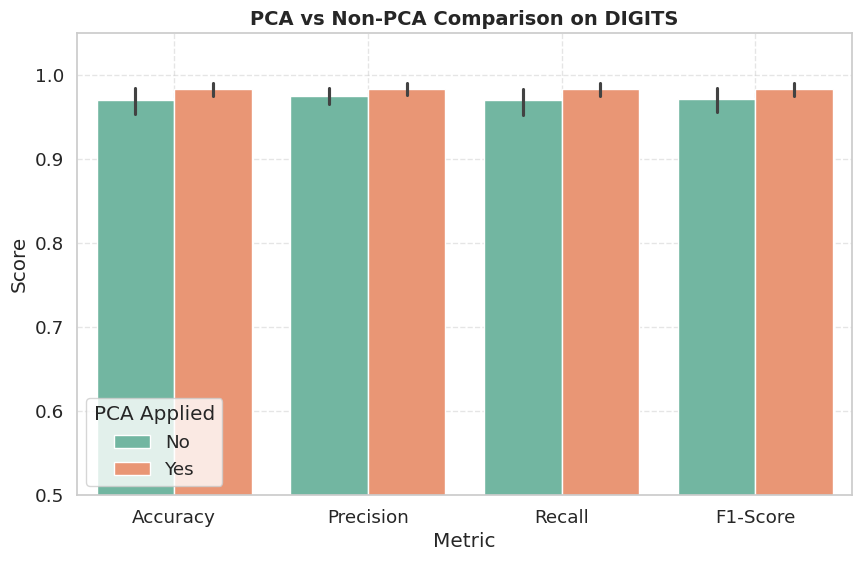

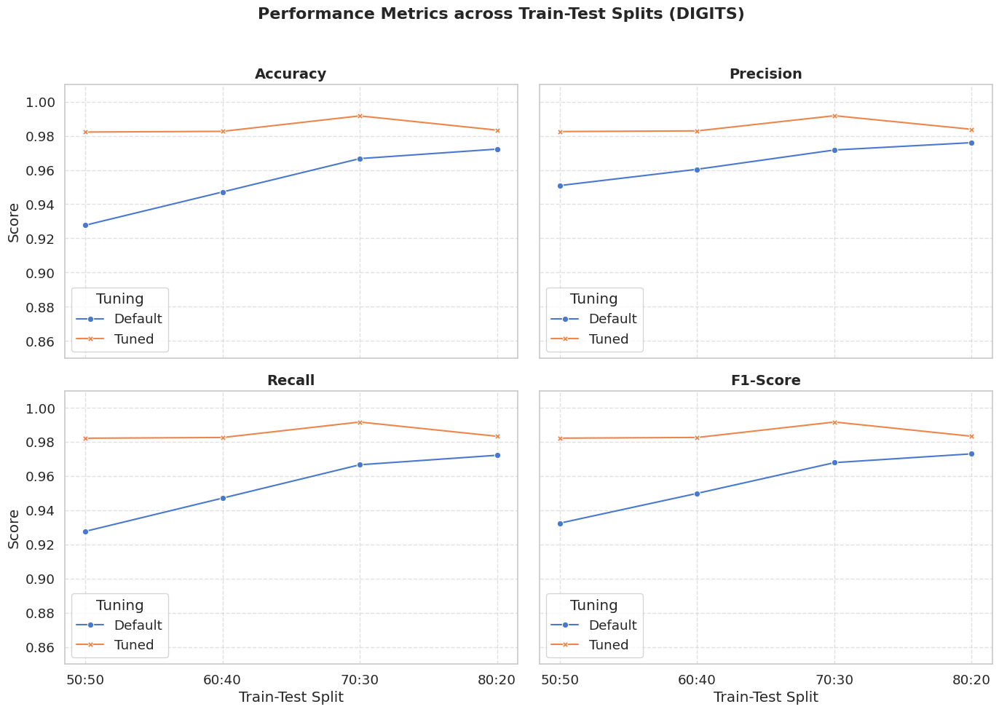

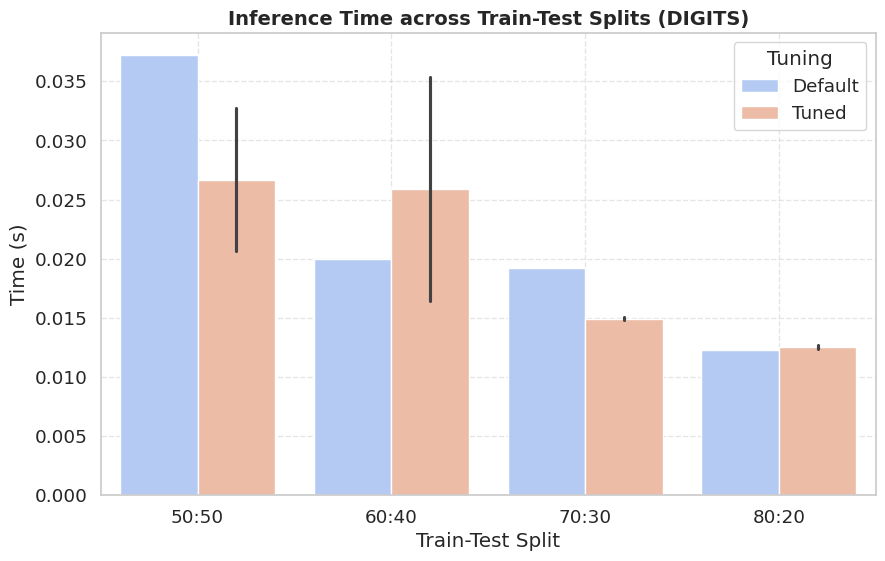

In [ ]:
analyze_results(svm_polynomial_df_2,"DIGITS")

Experiments for digits dataset on Original Features ---

 running not tuned models for 50:50 Split...
--- Results for SVM (RBF) on DIGITS (50:50 Split, Default) ---
Accuracy: 0.9711
Precision (Weighted): 0.9718
Recall (Weighted): 0.9711
F1-Score (Weighted): 0.9710



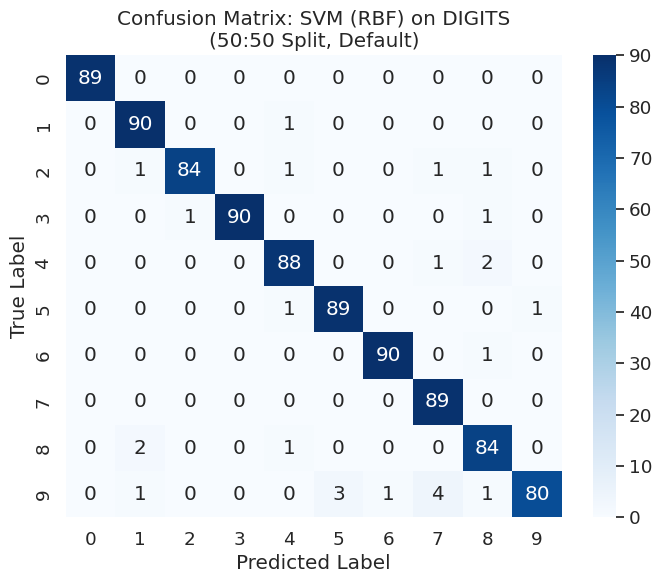

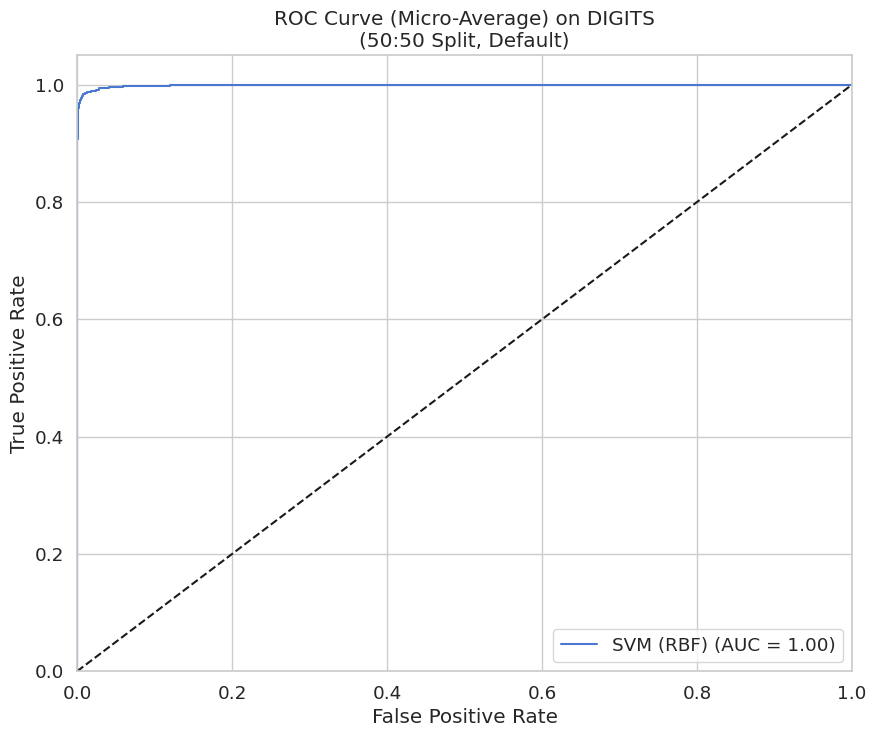


tuned model for 50:50 Split...
Tuning SVM (RBF)...
best parameters for SVM (RBF): {'C': 10, 'gamma': 'scale'}
--- Results for SVM (RBF) on DIGITS (50:50 Split, Tuned) ---
Accuracy: 0.9789
Precision (Weighted): 0.9791
Recall (Weighted): 0.9789
F1-Score (Weighted): 0.9788



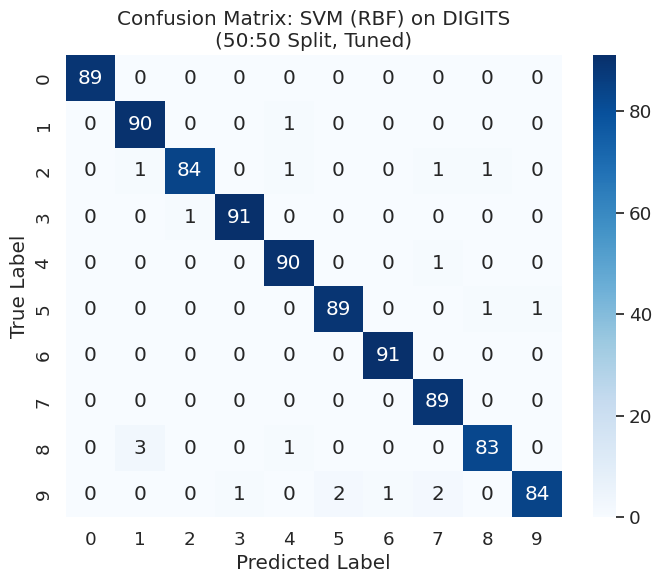

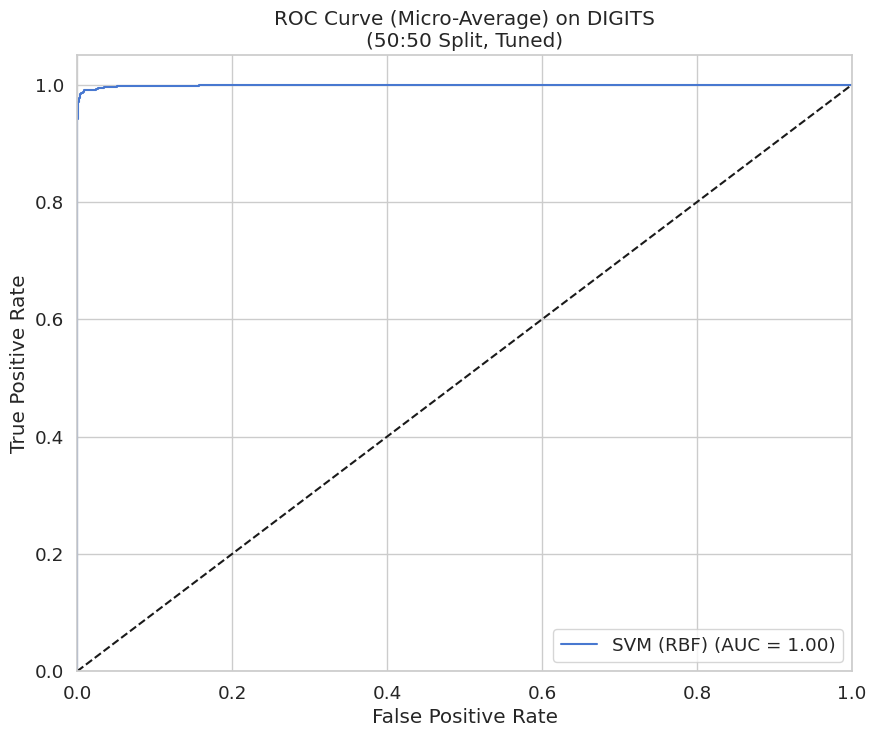


 running not tuned models for 60:40 Split...
--- Results for SVM (RBF) on DIGITS (60:40 Split, Default) ---
Accuracy: 0.9833
Precision (Weighted): 0.9838
Recall (Weighted): 0.9833
F1-Score (Weighted): 0.9833



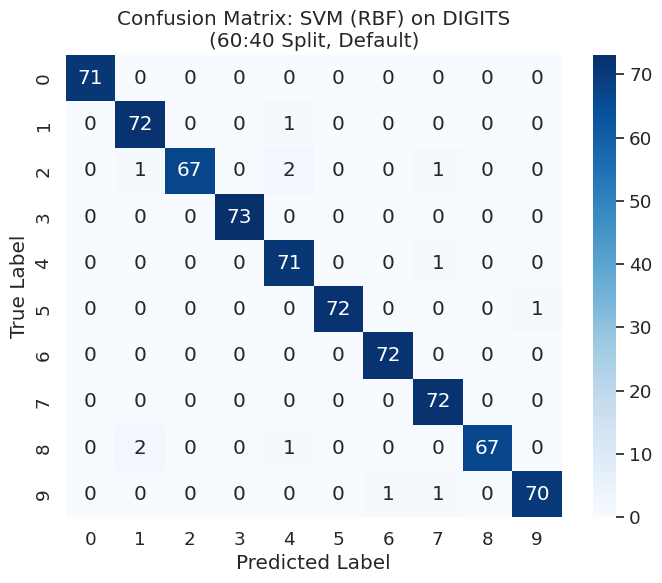

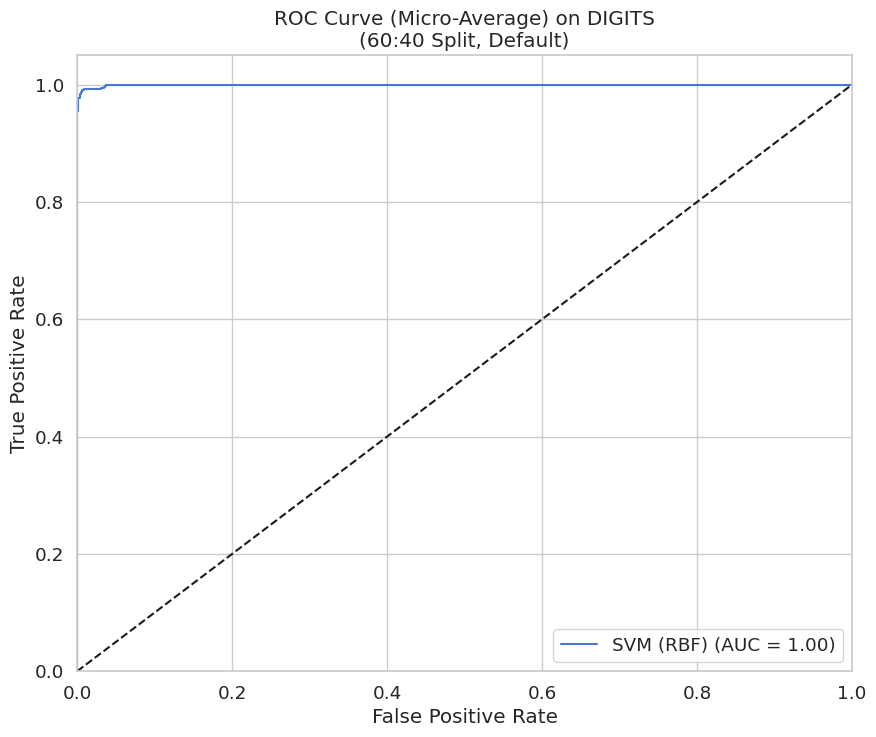


tuned model for 60:40 Split...
Tuning SVM (RBF)...
best parameters for SVM (RBF): {'C': 10, 'gamma': 'scale'}
--- Results for SVM (RBF) on DIGITS (60:40 Split, Tuned) ---
Accuracy: 0.9819
Precision (Weighted): 0.9823
Recall (Weighted): 0.9819
F1-Score (Weighted): 0.9819



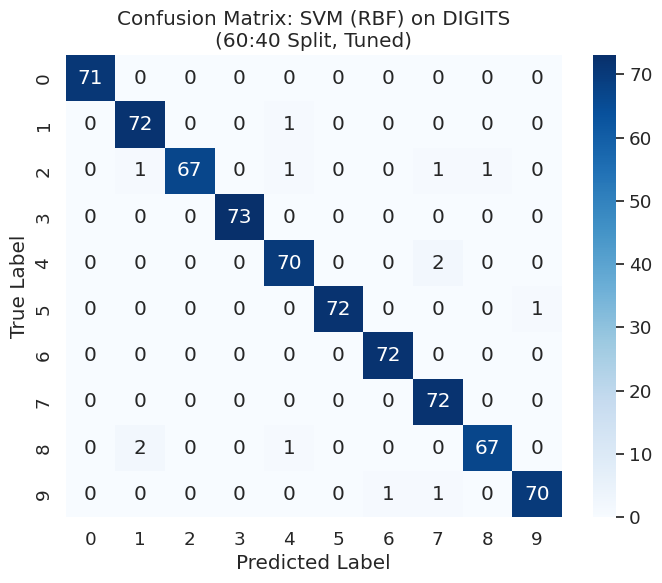

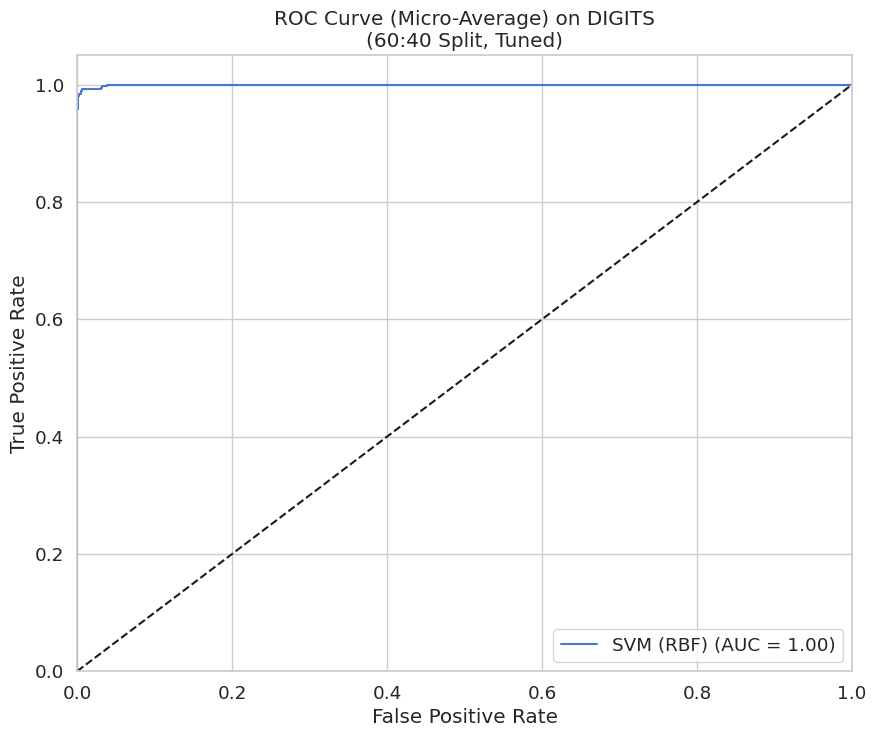


 running not tuned models for 70:30 Split...
--- Results for SVM (RBF) on DIGITS (70:30 Split, Default) ---
Accuracy: 0.9833
Precision (Weighted): 0.9837
Recall (Weighted): 0.9833
F1-Score (Weighted): 0.9833



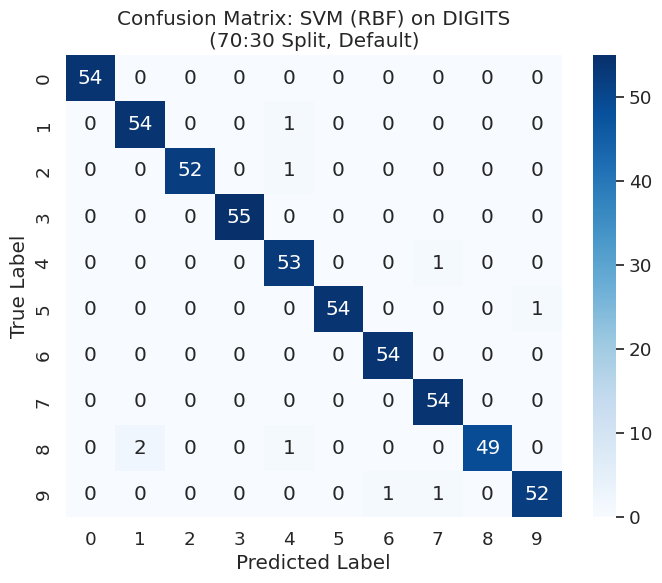

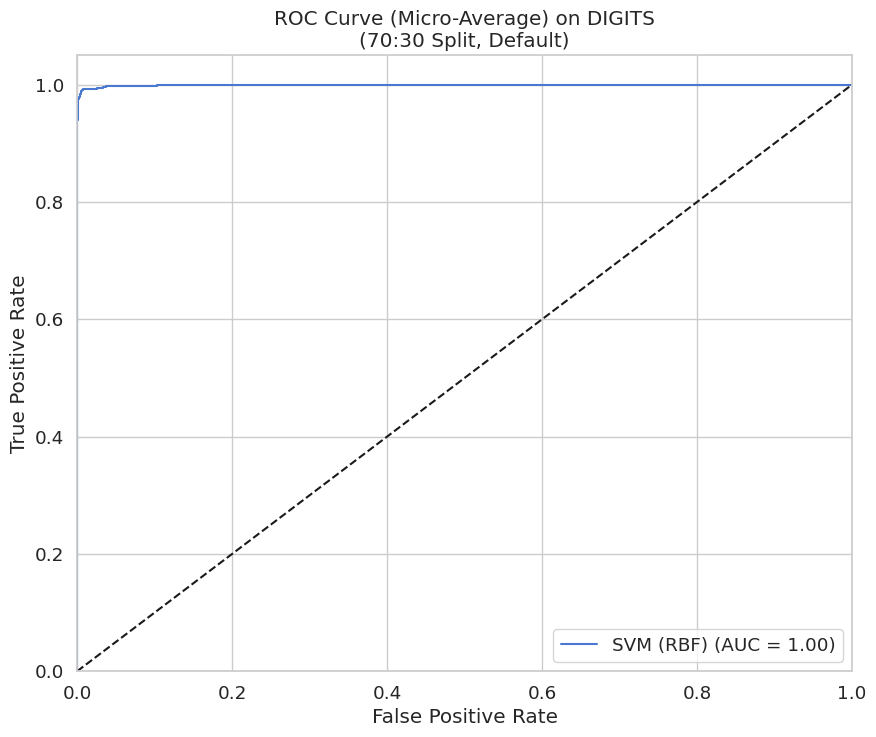


tuned model for 70:30 Split...
Tuning SVM (RBF)...
best parameters for SVM (RBF): {'C': 1, 'gamma': 'scale'}
--- Results for SVM (RBF) on DIGITS (70:30 Split, Tuned) ---
Accuracy: 0.9833
Precision (Weighted): 0.9837
Recall (Weighted): 0.9833
F1-Score (Weighted): 0.9833



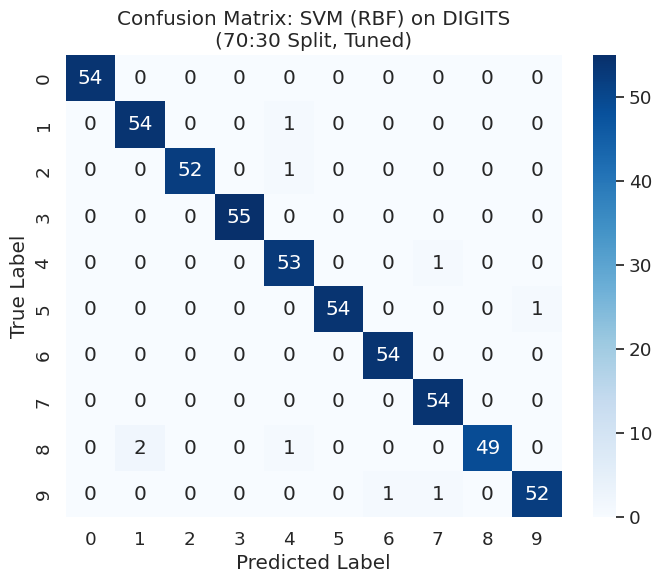

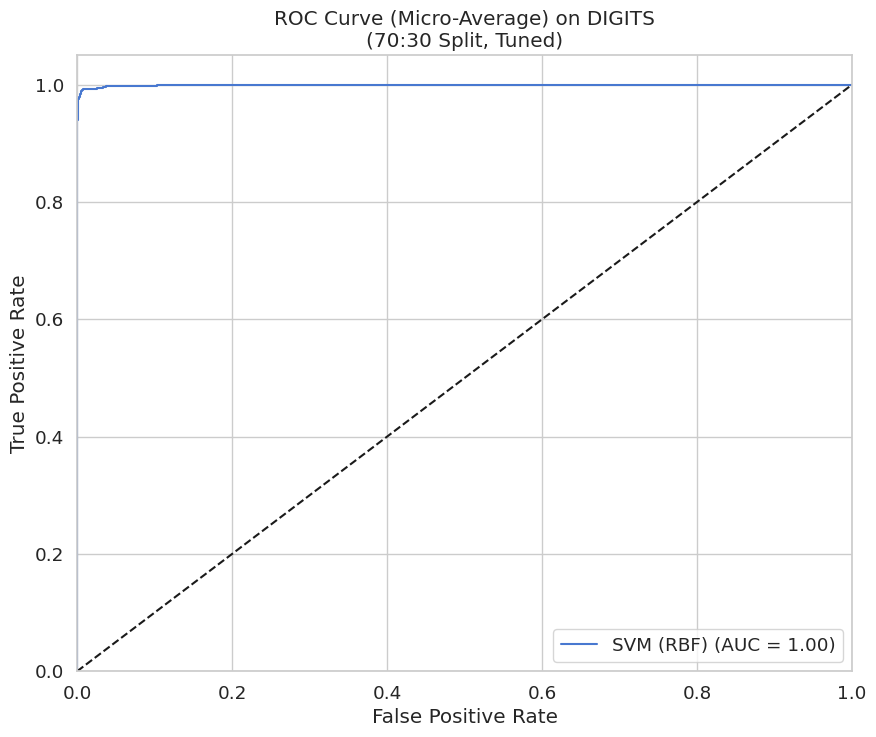


 running not tuned models for 80:20 Split...
--- Results for SVM (RBF) on DIGITS (80:20 Split, Default) ---
Accuracy: 0.9750
Precision (Weighted): 0.9759
Recall (Weighted): 0.9750
F1-Score (Weighted): 0.9749



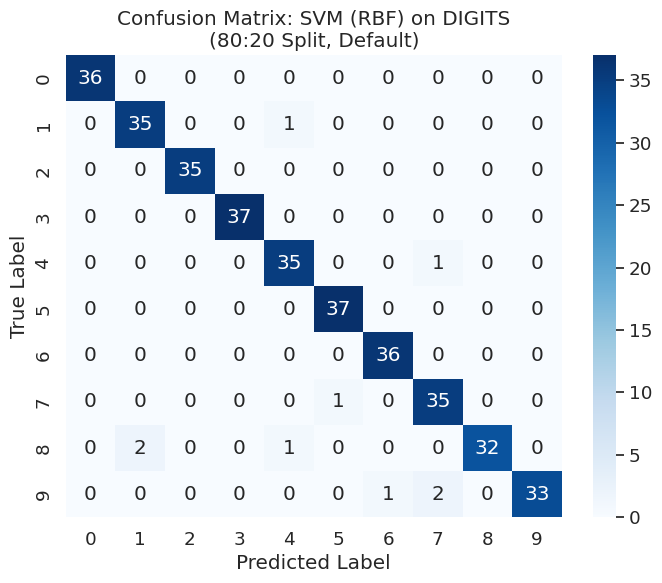

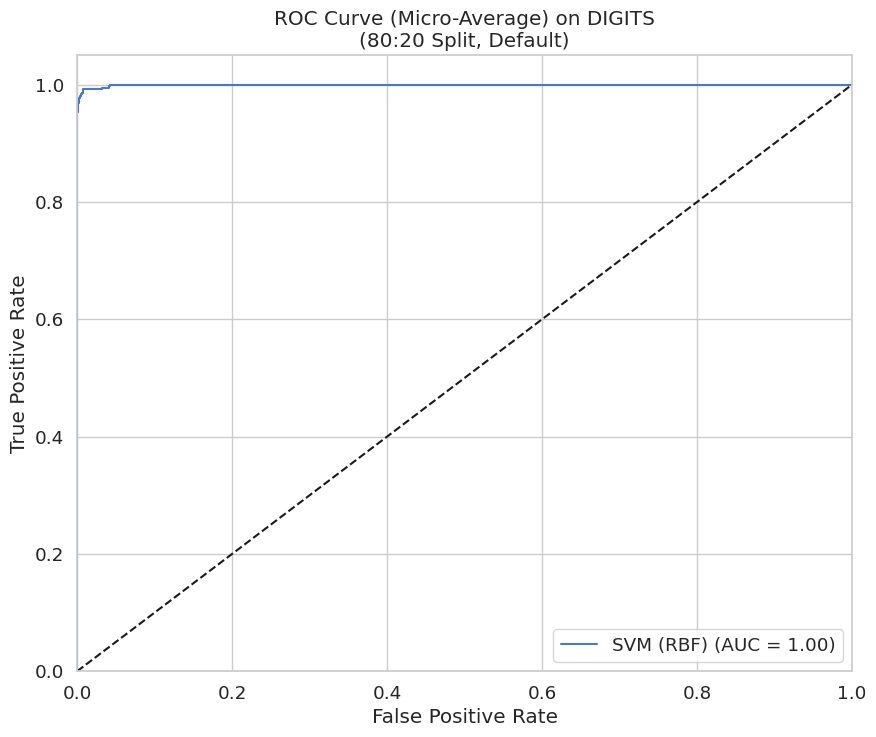


tuned model for 80:20 Split...
Tuning SVM (RBF)...
best parameters for SVM (RBF): {'C': 10, 'gamma': 0.01}
--- Results for SVM (RBF) on DIGITS (80:20 Split, Tuned) ---
Accuracy: 0.9833
Precision (Weighted): 0.9839
Recall (Weighted): 0.9833
F1-Score (Weighted): 0.9833



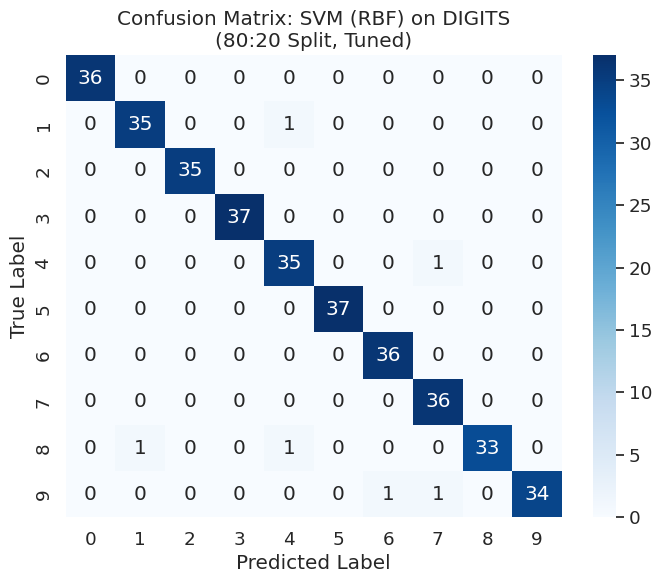

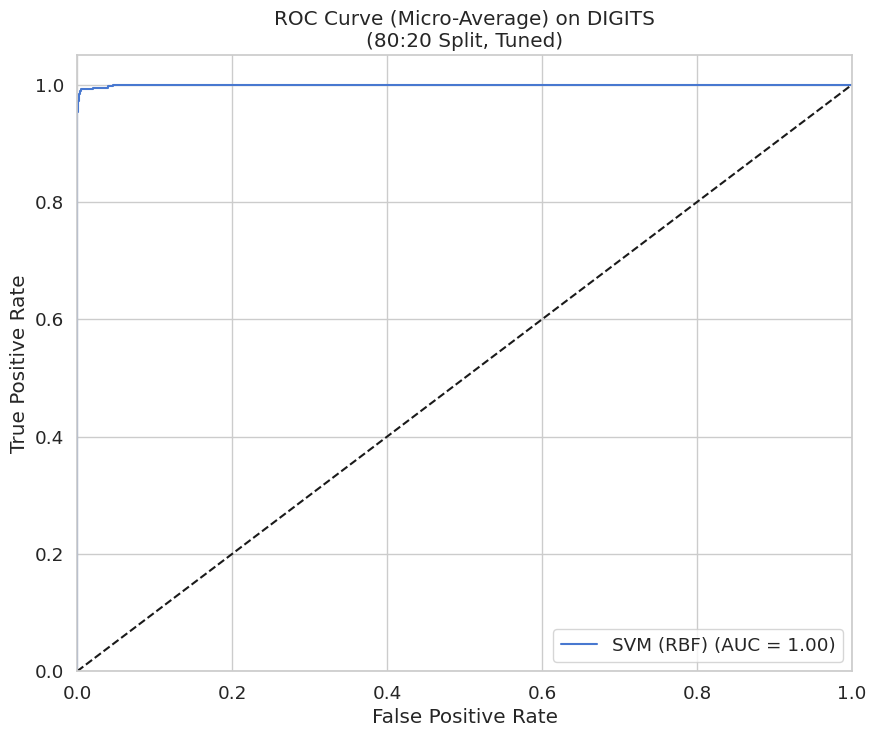


--- Starting for digits dataset with PCA ---
Original features: 64, PCA features: 39

running tuned model for 80:20 Split, PCA...
tuning SVM (RBF) with PCA features...
best parameters for SVM (RBF) on PCA data: {'C': 10, 'gamma': 'scale'}
--- Results for SVM (RBF) on DIGITS (80:20 Split, PCA, Tuned) ---
Accuracy: 0.9800
Precision (Weighted): 0.9801
Recall (Weighted): 0.9800
F1-Score (Weighted): 0.9799



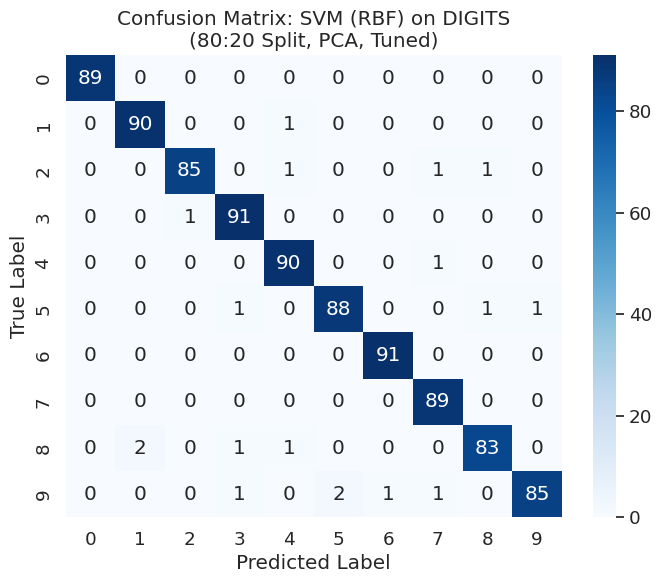

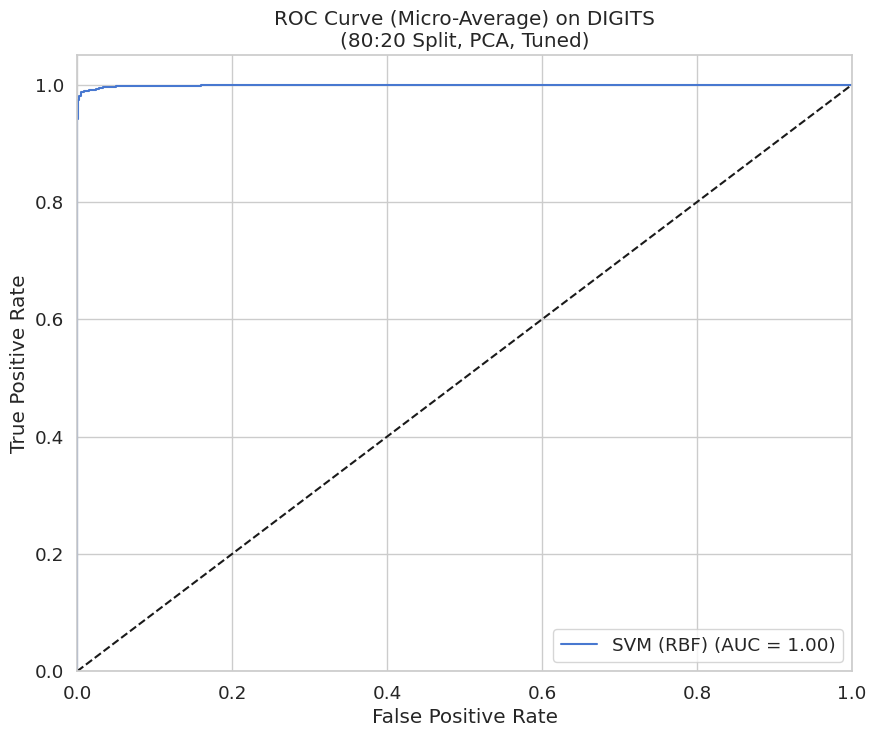

Original features: 64, PCA features: 39

running tuned model for 80:20 Split, PCA...
tuning SVM (RBF) with PCA features...
best parameters for SVM (RBF) on PCA data: {'C': 10, 'gamma': 'scale'}
--- Results for SVM (RBF) on DIGITS (80:20 Split, PCA, Tuned) ---
Accuracy: 0.9833
Precision (Weighted): 0.9836
Recall (Weighted): 0.9833
F1-Score (Weighted): 0.9833



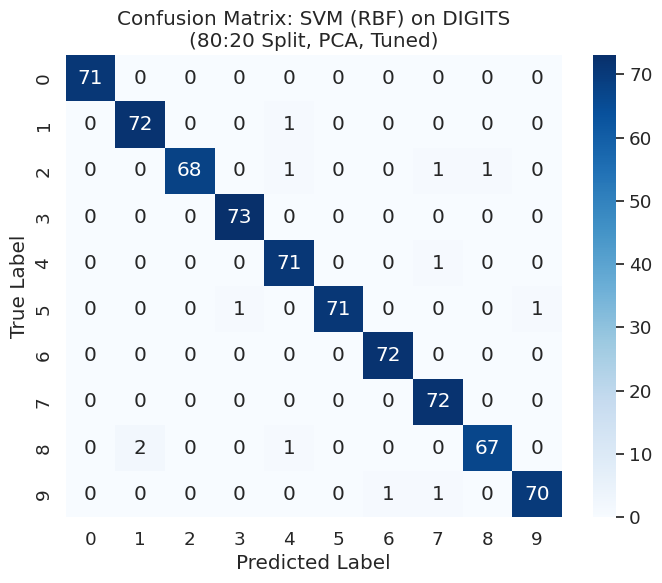

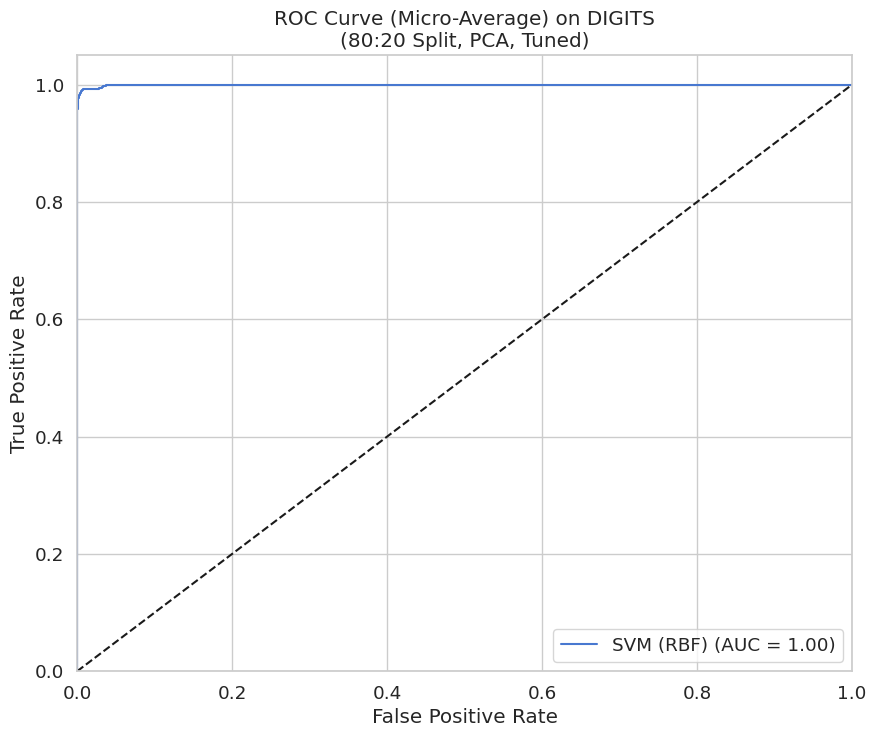

Original features: 64, PCA features: 39

running tuned model for 80:20 Split, PCA...
tuning SVM (RBF) with PCA features...
best parameters for SVM (RBF) on PCA data: {'C': 1, 'gamma': 'scale'}
--- Results for SVM (RBF) on DIGITS (80:20 Split, PCA, Tuned) ---
Accuracy: 0.9833
Precision (Weighted): 0.9837
Recall (Weighted): 0.9833
F1-Score (Weighted): 0.9833



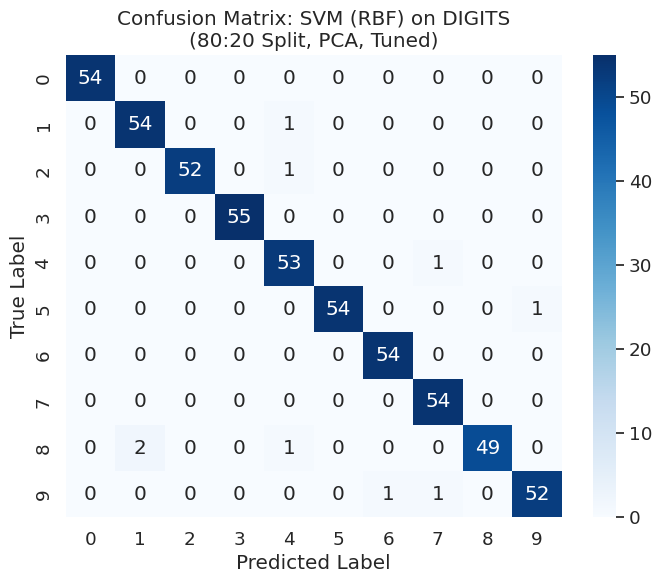

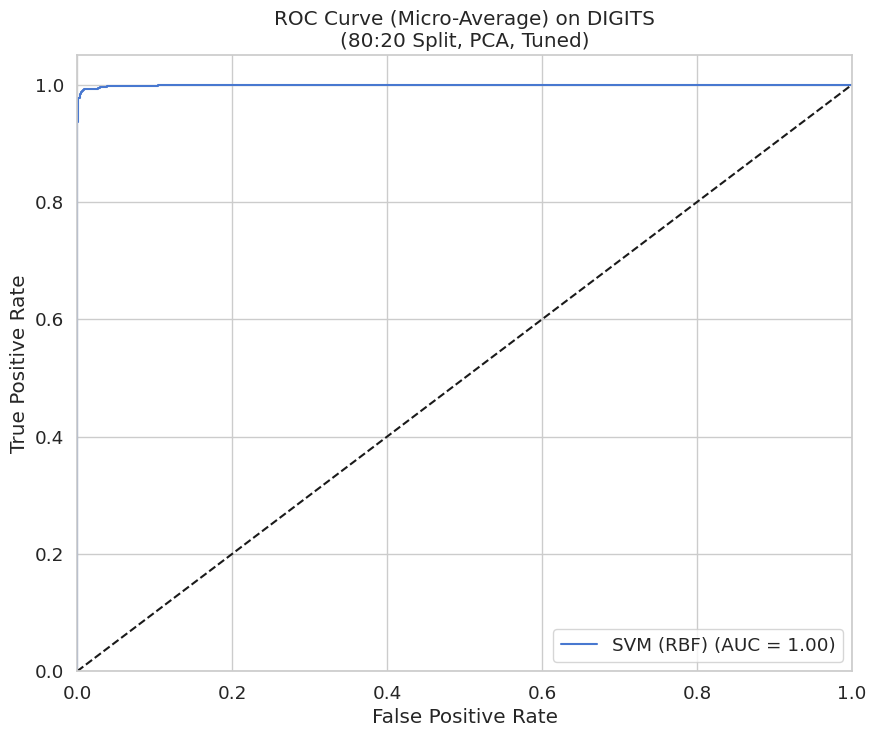

Original features: 64, PCA features: 40

running tuned model for 80:20 Split, PCA...
tuning SVM (RBF) with PCA features...
best parameters for SVM (RBF) on PCA data: {'C': 1, 'gamma': 'scale'}
--- Results for SVM (RBF) on DIGITS (80:20 Split, PCA, Tuned) ---
Accuracy: 0.9778
Precision (Weighted): 0.9784
Recall (Weighted): 0.9778
F1-Score (Weighted): 0.9777



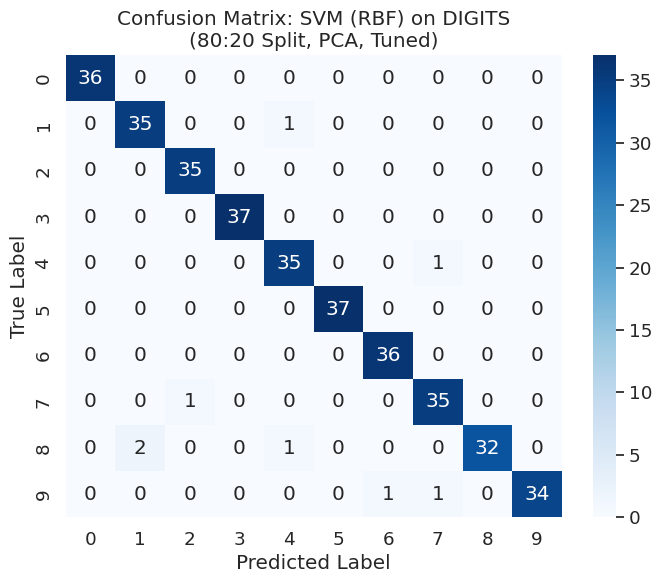

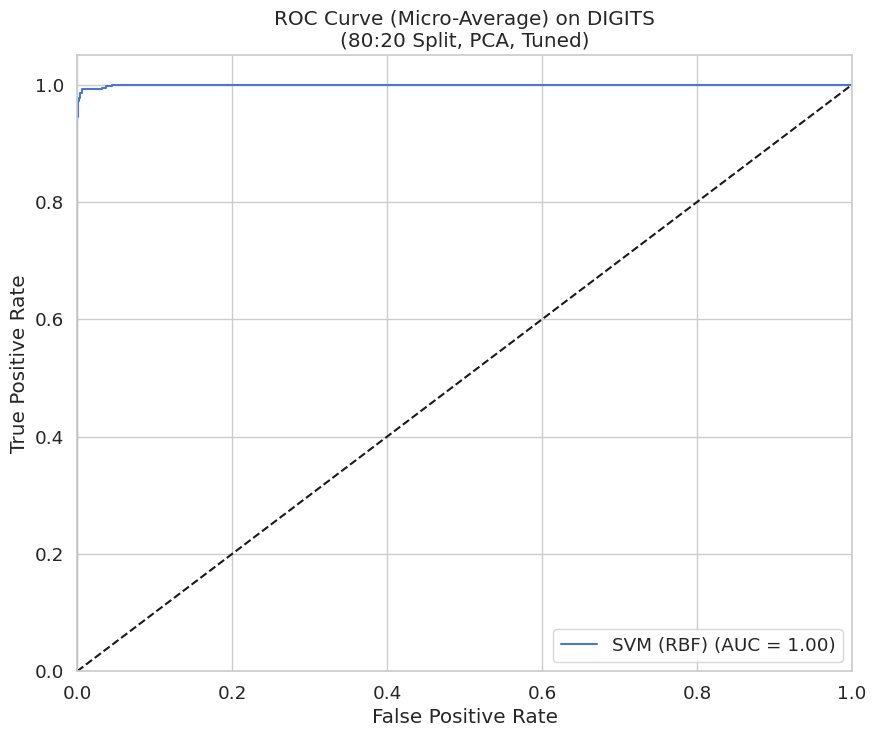

In [ ]:
def svm_rbf_complete(dataset, dataset_name):

    X, y = digits_dataset.data, digits_dataset.target
    results_list = []

    classifiers = {
        "SVM (RBF)": SVC(kernel='rbf', probability=True, random_state=42),

    }

    param_grids = {
        "SVM (RBF)": {'C': [0.1, 1, 10], 'gamma': [0.001, 0.01, 'scale']},
    }

    print(f"Experiments for digits dataset on Original Features ---")
    for split in splits:
        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=split, random_state=42, stratify=y
        )

        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)

        split_note = f"{int(100-split*100)}:{int(split*100)} Split"

        # without tuning
        print(f"\n running not tuned models for {split_note}...")
        trained_models_default = {}
        for name, model in classifiers.items():
            model.fit(X_train_scaled, y_train)
            trained_models_default[name] = model
            evaluate_model(model, X_test_scaled, y_test, name, dataset_name, split, f"{split_note}, Default", results_list)
        plot_roc_curves(trained_models_default, X_test_scaled, y_test, dataset_name, f"{split_note}, Default")

        # with tuning
        print(f"\ntuned model for {split_note}...")
        trained_models_tuned = {}
        for name, model in classifiers.items():
            print(f"Tuning {name}...")
            grid_search = GridSearchCV(model, param_grids[name], cv=5, n_jobs=-1, scoring='accuracy')
            grid_search.fit(X_train_scaled, y_train)
            best_model = grid_search.best_estimator_
            trained_models_tuned[name] = best_model
            print(f"best parameters for {name}: {grid_search.best_params_}")
            evaluate_model(best_model, X_test_scaled, y_test, name, dataset_name, split, f"{split_note}, Tuned", results_list)
        plot_roc_curves(trained_models_tuned, X_test_scaled, y_test, dataset_name, f"{split_note}, Tuned")

    # WITH PCA
    print(f"\n--- Starting for digits dataset with PCA ---")


    for split in splits:
      X_train, X_test, y_train, y_test = train_test_split(
          X, y, test_size=split, random_state=42, stratify=y
      )

      scaler = StandardScaler()
      X_train_scaled = scaler.fit_transform(X_train)
      X_test_scaled = scaler.transform(X_test)

      # pca with 95% variance
      pca = PCA(n_components=0.95)
      X_train_pca = pca.fit_transform(X_train_scaled)
      X_test_pca = pca.transform(X_test_scaled)
      print(f"Original features: {X_train.shape[1]}, PCA features: {X_train_pca.shape[1]}")

      pca_note = f"80:20 Split, PCA"

      # Model with tuning on PCA
      print(f"\nrunning tuned model for {pca_note}...")
      trained_models_pca = {}
      for name, model in classifiers.items():
          print(f"tuning {name} with PCA features...")
          grid_search = GridSearchCV(model, param_grids[name], cv=5, n_jobs=-1, scoring='accuracy')
          grid_search.fit(X_train_pca, y_train)
          best_model = grid_search.best_estimator_
          trained_models_pca[name] = best_model
          print(f"best parameters for {name} on PCA data: {grid_search.best_params_}")
          evaluate_model(best_model, X_test_pca, y_test, name, dataset_name, split, f"{pca_note}, Tuned", results_list)
      plot_roc_curves(trained_models_pca, X_test_pca, y_test, dataset_name, f"{pca_note}, Tuned")

    return pd.DataFrame(results_list)
svm_rbf_df_2 = svm_rbf_complete(digits_dataset,"DIGITS")


 Results Summary for DIGITS


,Dataset,Model,Train-Test Split,Tuning,PCA,Accuracy,Precision,Recall,F1-Score,Inference Time (s)
0,DIGITS,SVM (RBF),50:50,Default,No,0.9711,0.9718,0.9711,0.9710,0.0493
1,DIGITS,SVM (RBF),50:50,Tuned,No,0.9789,0.9791,0.9789,0.9788,0.0467
2,DIGITS,SVM (RBF),60:40,Default,No,0.9833,0.9838,0.9833,0.9833,0.0463
3,DIGITS,SVM (RBF),60:40,Tuned,No,0.9819,0.9823,0.9819,0.9819,0.0445
4,DIGITS,SVM (RBF),70:30,Default,No,0.9833,0.9837,0.9833,0.9833,0.0372
5,DIGITS,SVM (RBF),70:30,Tuned,No,0.9833,0.9837,0.9833,0.9833,0.0391
6,DIGITS,SVM (RBF),80:20,Default,No,0.9750,0.9759,0.9750,0.9749,0.0267
7,DIGITS,SVM (RBF),80:20,Tuned,No,0.9833,0.9839,0.9833,0.9833,0.0233
8,DIGITS,SVM (RBF),50:50,Tuned,Yes,0.9800,0.9801,0.9800,0.9799,0.0407
9,DIGITS,SVM (RBF),60:40,Tuned,Yes,0.9833,0.9836,0.9833,0.9833,0.0380


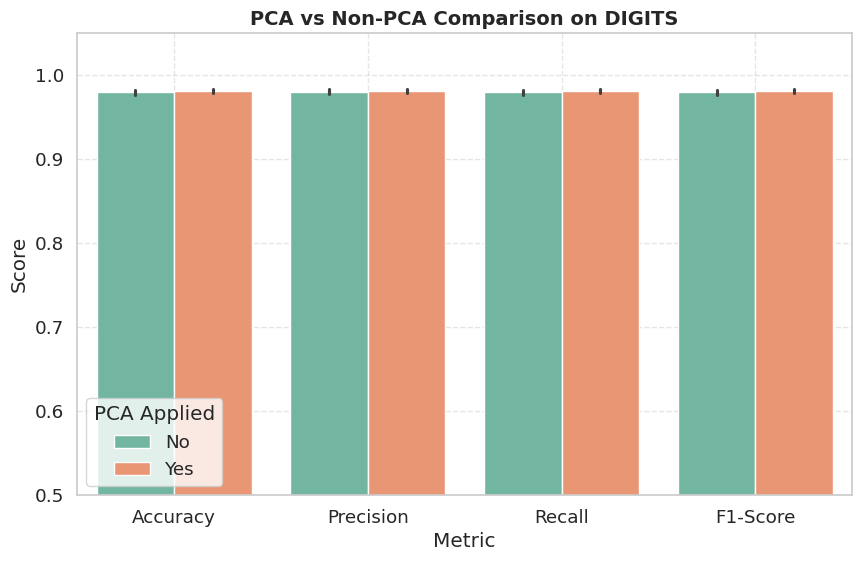

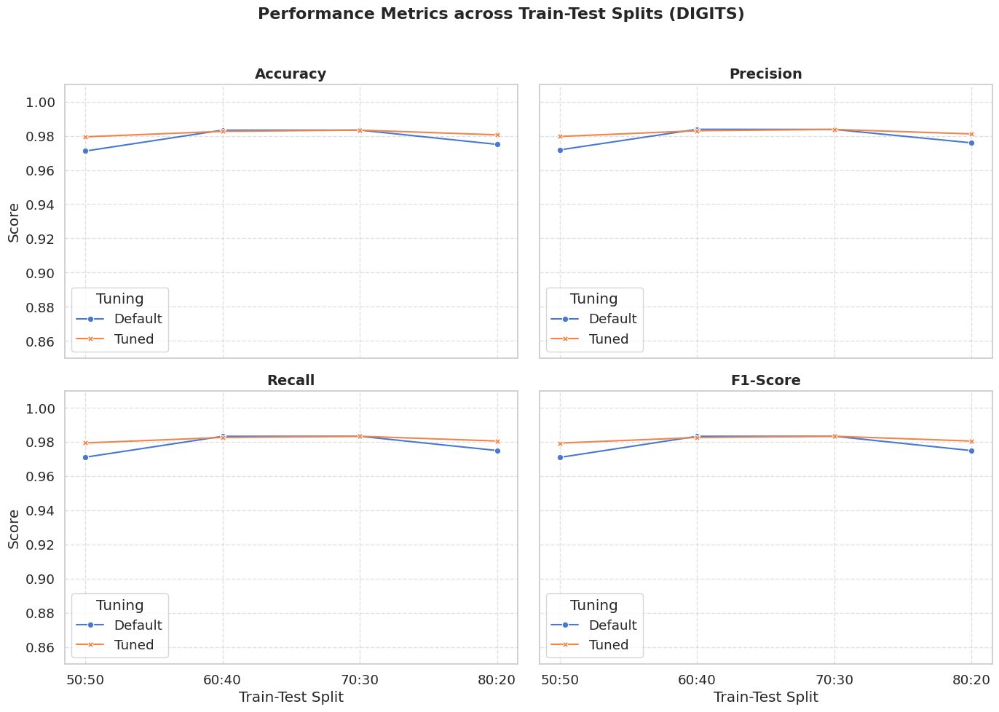

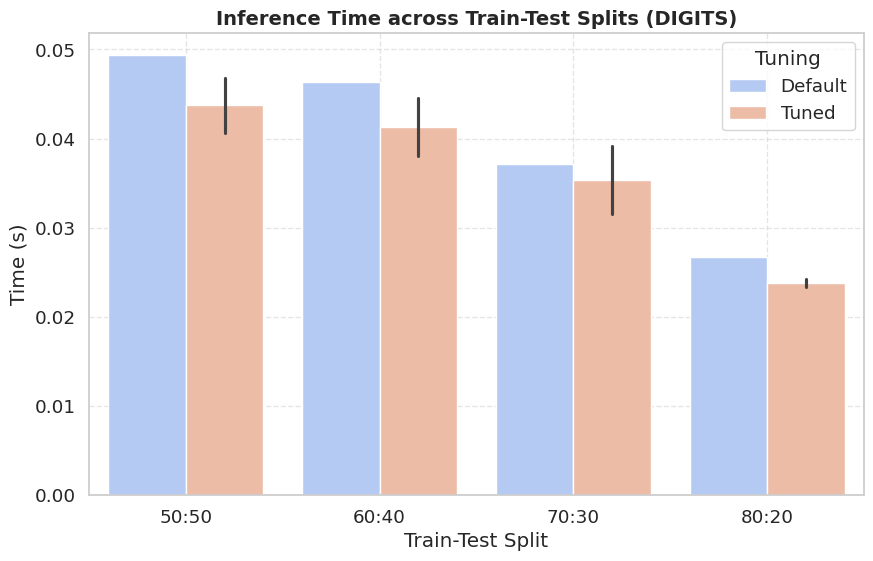

In [ ]:
analyze_results(svm_rbf_df_2,"DIGITS")

Experiments for digits dataset on Original Features ---

 running not tuned models for 50:50 Split...
--- Results for SVM (Sigmoid) on DIGITS (50:50 Split, Default) ---
Accuracy: 0.9444
Precision (Weighted): 0.9463
Recall (Weighted): 0.9444
F1-Score (Weighted): 0.9447



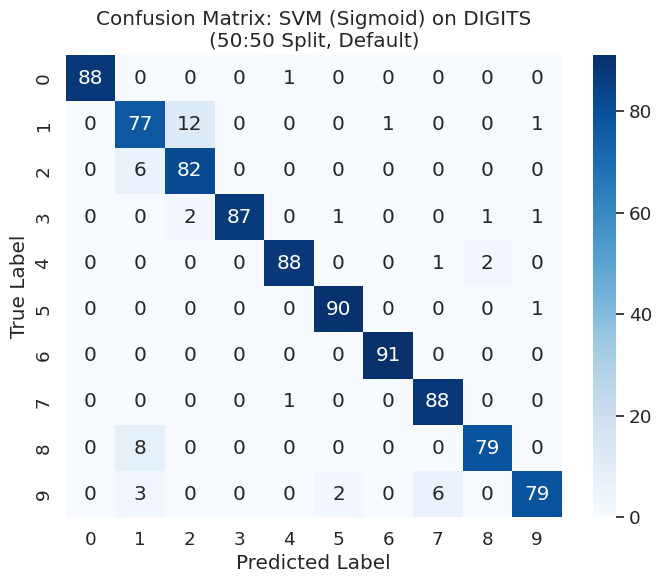

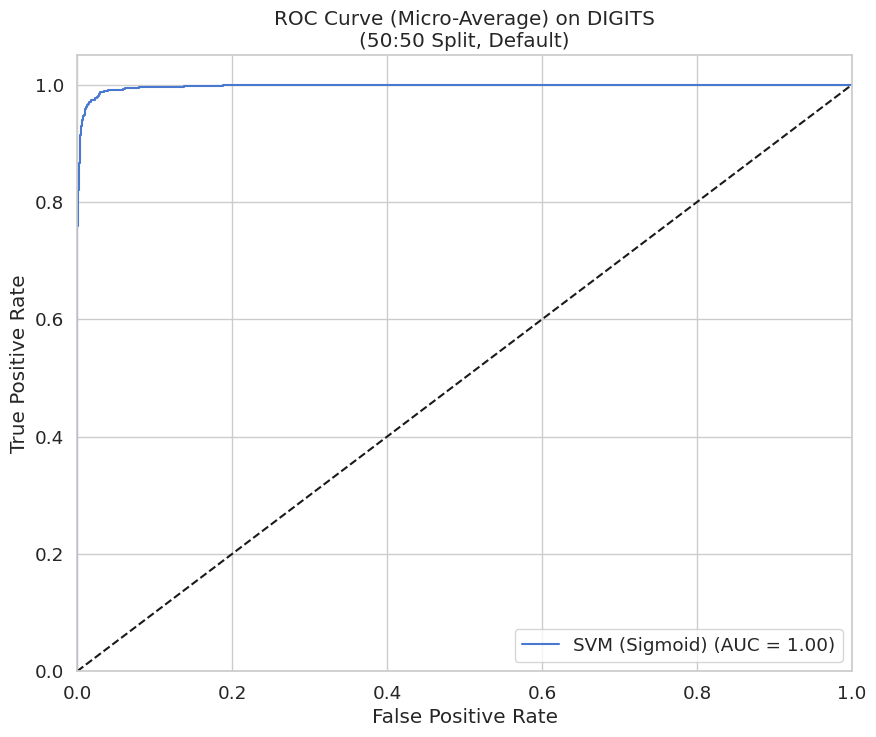


tuned model for 50:50 Split...
Tuning SVM (Sigmoid)...
best parameters for SVM (Sigmoid): {'C': 10, 'gamma': 0.001}
--- Results for SVM (Sigmoid) on DIGITS (50:50 Split, Tuned) ---
Accuracy: 0.9633
Precision (Weighted): 0.9652
Recall (Weighted): 0.9633
F1-Score (Weighted): 0.9634



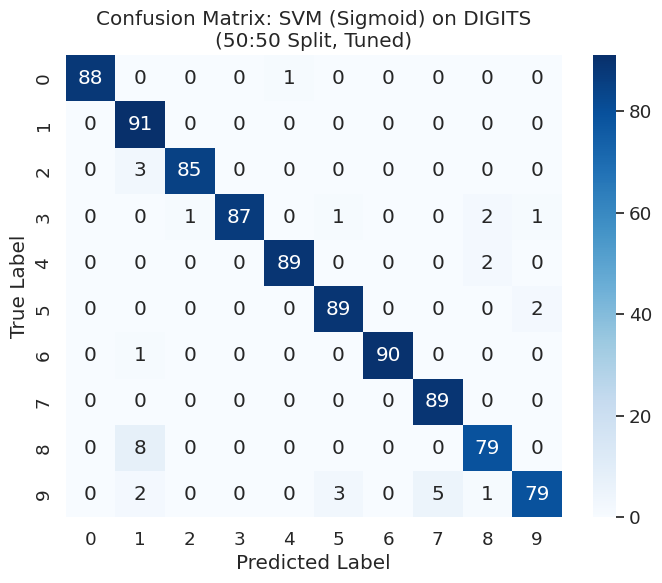

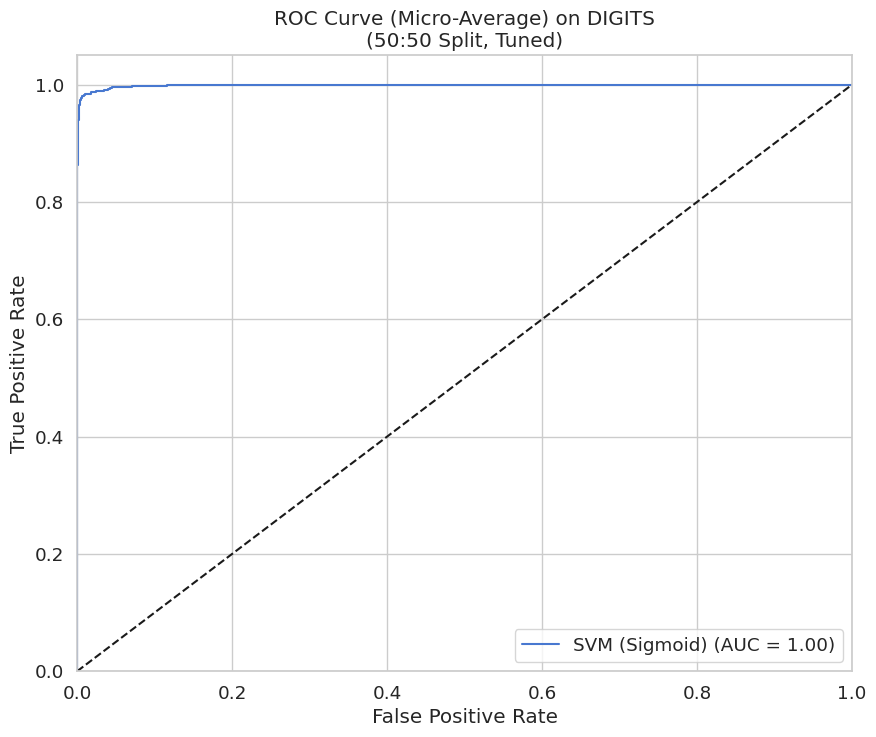


 running not tuned models for 60:40 Split...
--- Results for SVM (Sigmoid) on DIGITS (60:40 Split, Default) ---
Accuracy: 0.9332
Precision (Weighted): 0.9347
Recall (Weighted): 0.9332
F1-Score (Weighted): 0.9334



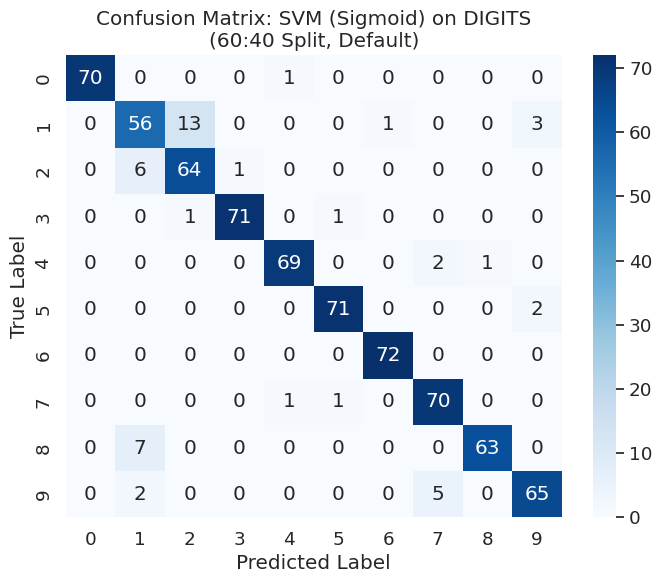

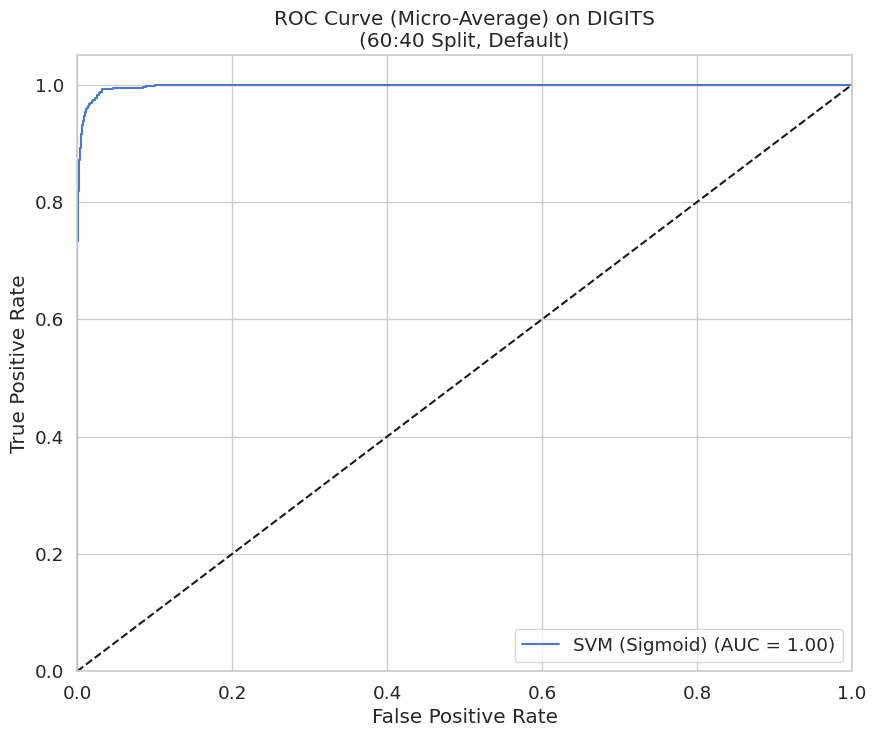


tuned model for 60:40 Split...
Tuning SVM (Sigmoid)...
best parameters for SVM (Sigmoid): {'C': 10, 'gamma': 0.01}
--- Results for SVM (Sigmoid) on DIGITS (60:40 Split, Tuned) ---
Accuracy: 0.9583
Precision (Weighted): 0.9601
Recall (Weighted): 0.9583
F1-Score (Weighted): 0.9584



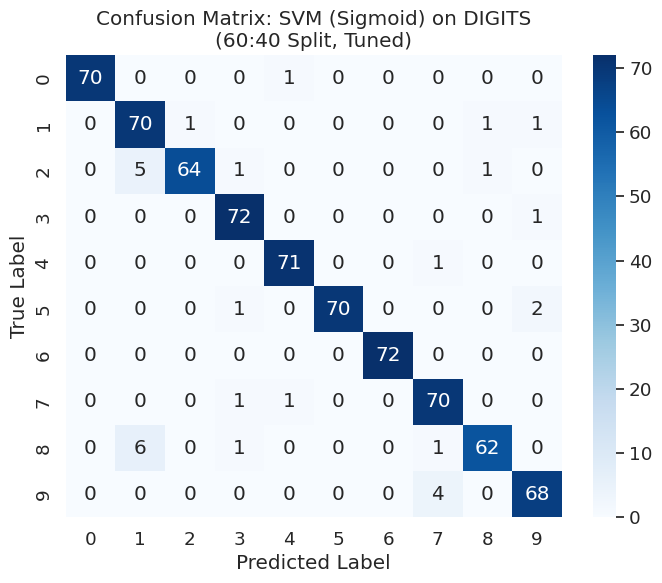

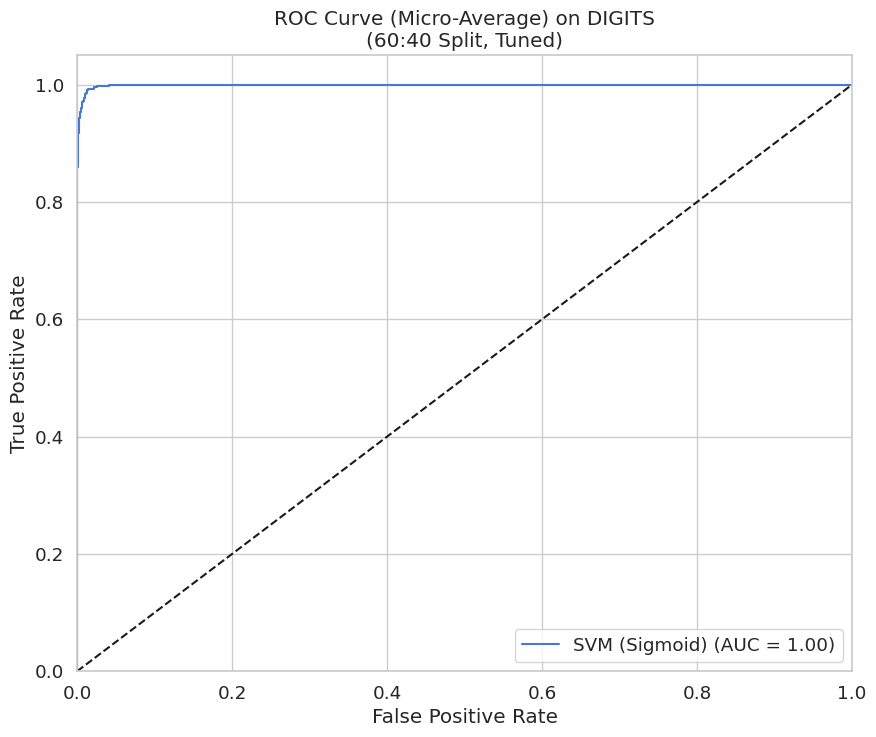


 running not tuned models for 70:30 Split...
--- Results for SVM (Sigmoid) on DIGITS (70:30 Split, Default) ---
Accuracy: 0.9389
Precision (Weighted): 0.9408
Recall (Weighted): 0.9389
F1-Score (Weighted): 0.9390



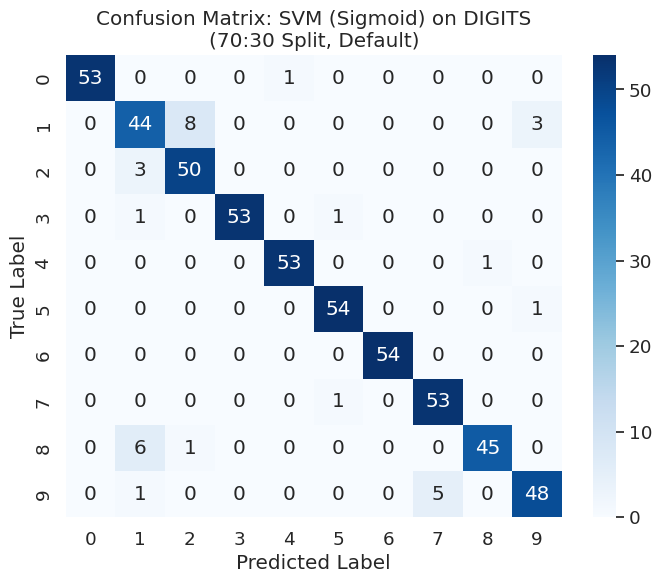

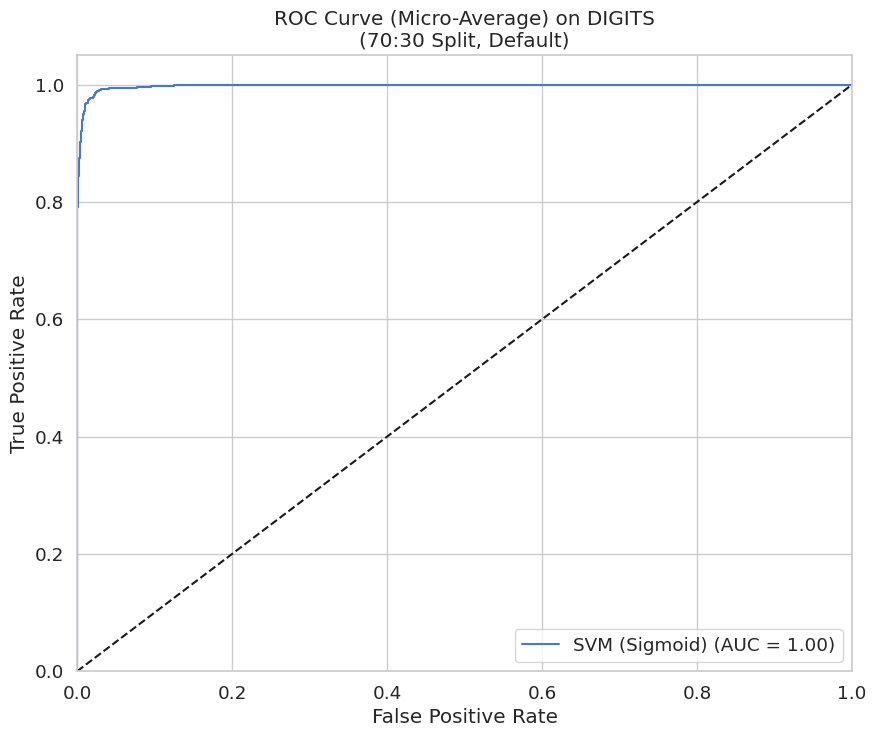


tuned model for 70:30 Split...
Tuning SVM (Sigmoid)...
best parameters for SVM (Sigmoid): {'C': 10, 'gamma': 0.001}
--- Results for SVM (Sigmoid) on DIGITS (70:30 Split, Tuned) ---
Accuracy: 0.9815
Precision (Weighted): 0.9819
Recall (Weighted): 0.9815
F1-Score (Weighted): 0.9815



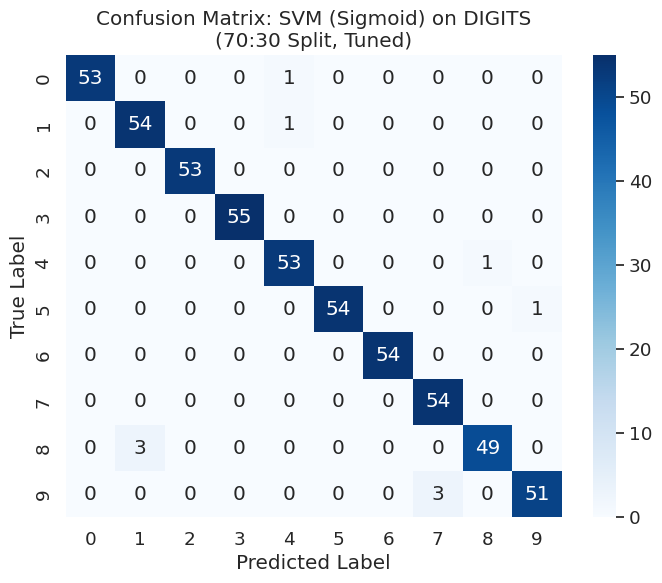

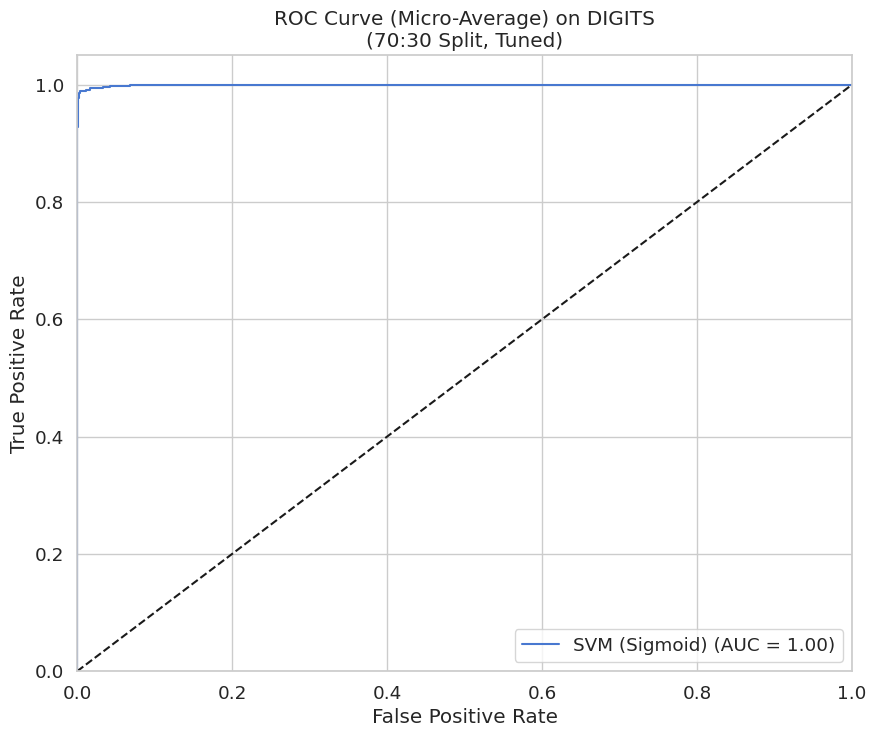


 running not tuned models for 80:20 Split...
--- Results for SVM (Sigmoid) on DIGITS (80:20 Split, Default) ---
Accuracy: 0.9389
Precision (Weighted): 0.9398
Recall (Weighted): 0.9389
F1-Score (Weighted): 0.9382



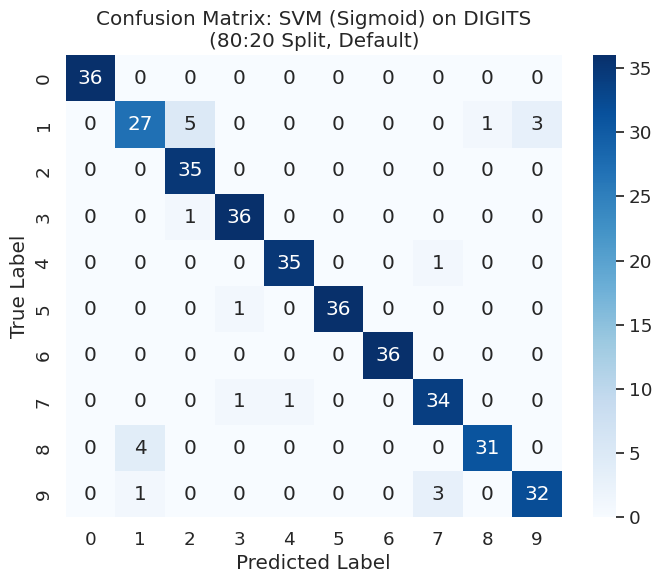

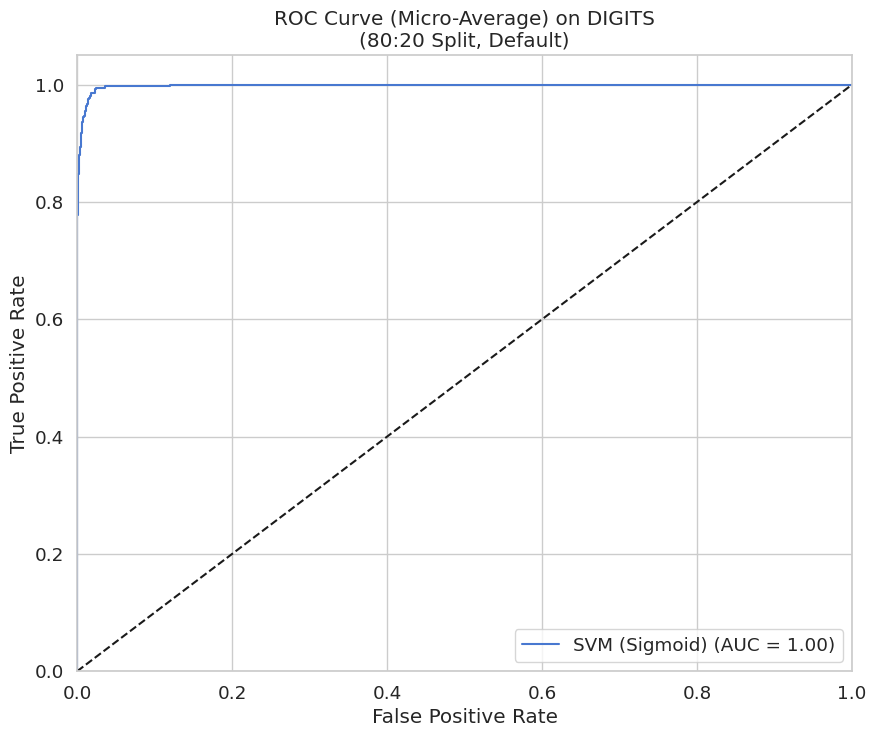


tuned model for 80:20 Split...
Tuning SVM (Sigmoid)...
best parameters for SVM (Sigmoid): {'C': 10, 'gamma': 0.001}
--- Results for SVM (Sigmoid) on DIGITS (80:20 Split, Tuned) ---
Accuracy: 0.9861
Precision (Weighted): 0.9865
Recall (Weighted): 0.9861
F1-Score (Weighted): 0.9861



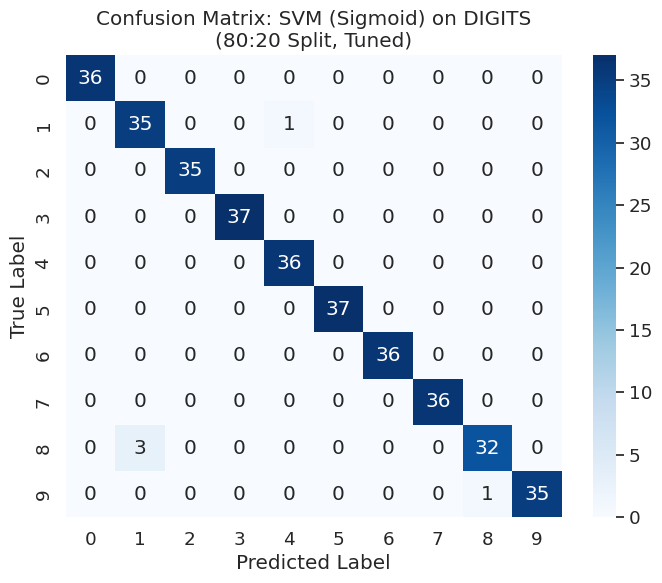

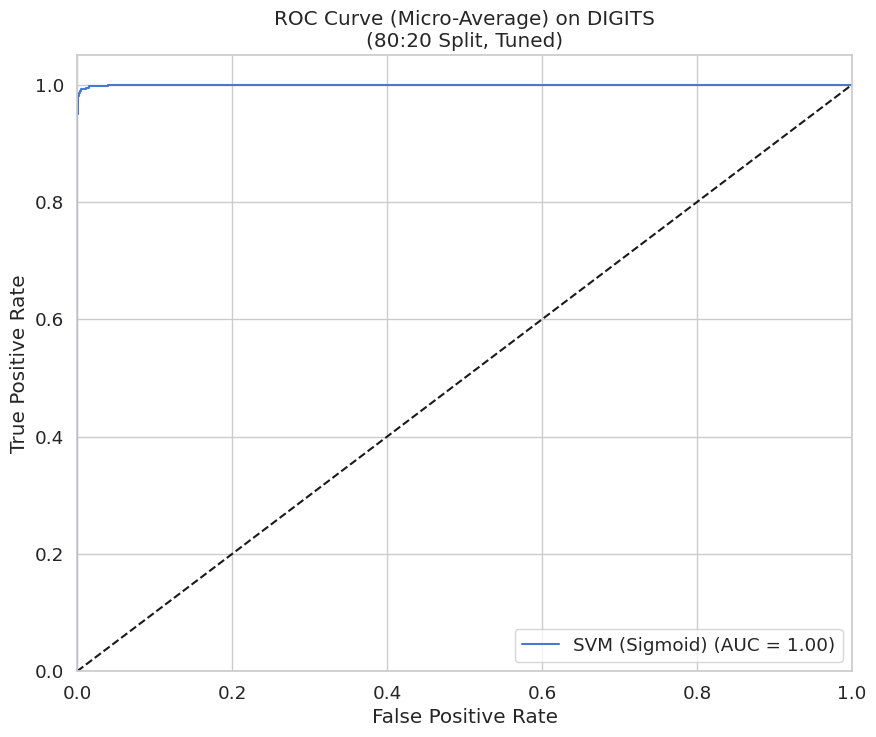


--- Starting for digits dataset with PCA ---
Original features: 64, PCA features: 39

running tuned model for 80:20 Split, PCA...
tuning SVM (Sigmoid) with PCA features...
best parameters for SVM (Sigmoid) on PCA data: {'C': 10, 'gamma': 0.001}
--- Results for SVM (Sigmoid) on DIGITS (80:20 Split, PCA, Tuned) ---
Accuracy: 0.9533
Precision (Weighted): 0.9557
Recall (Weighted): 0.9533
F1-Score (Weighted): 0.9533



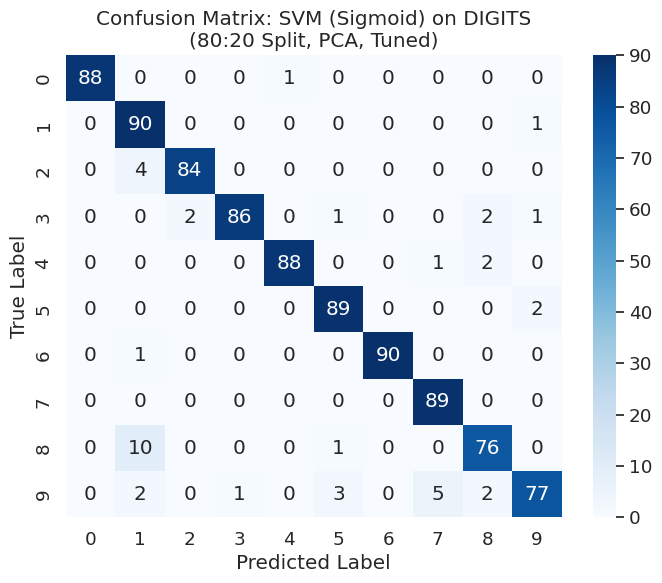

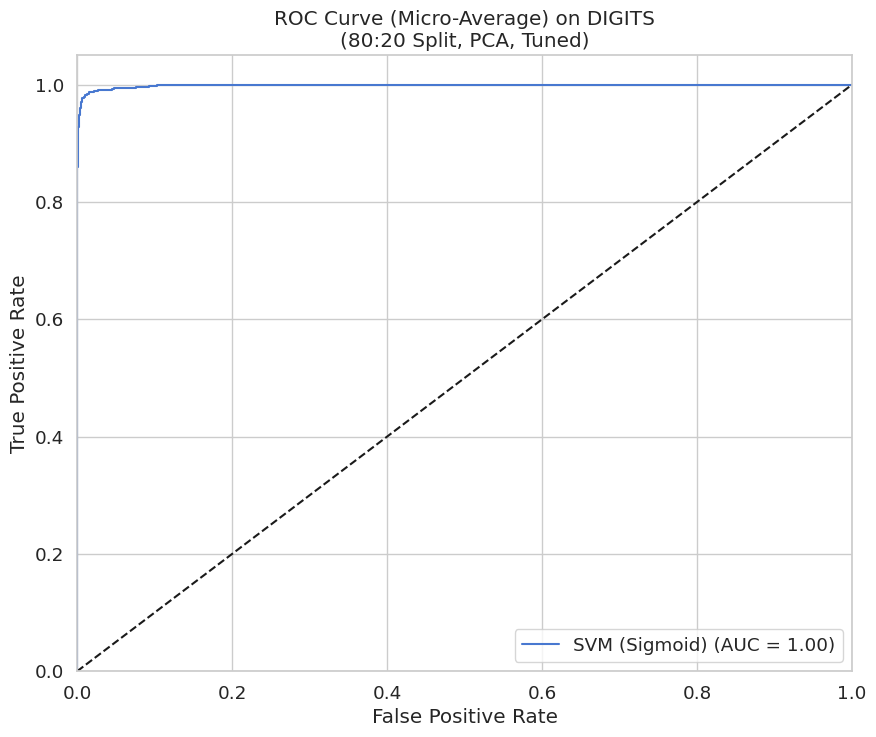

Original features: 64, PCA features: 39

running tuned model for 80:20 Split, PCA...
tuning SVM (Sigmoid) with PCA features...
best parameters for SVM (Sigmoid) on PCA data: {'C': 10, 'gamma': 0.001}
--- Results for SVM (Sigmoid) on DIGITS (80:20 Split, PCA, Tuned) ---
Accuracy: 0.9680
Precision (Weighted): 0.9697
Recall (Weighted): 0.9680
F1-Score (Weighted): 0.9682



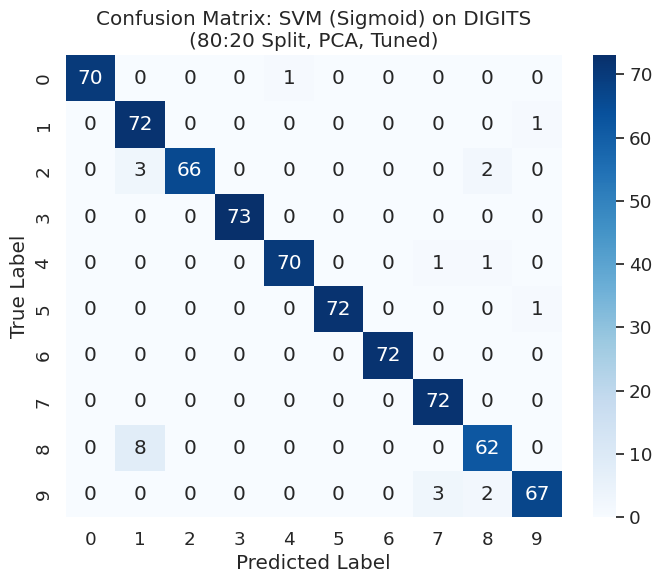

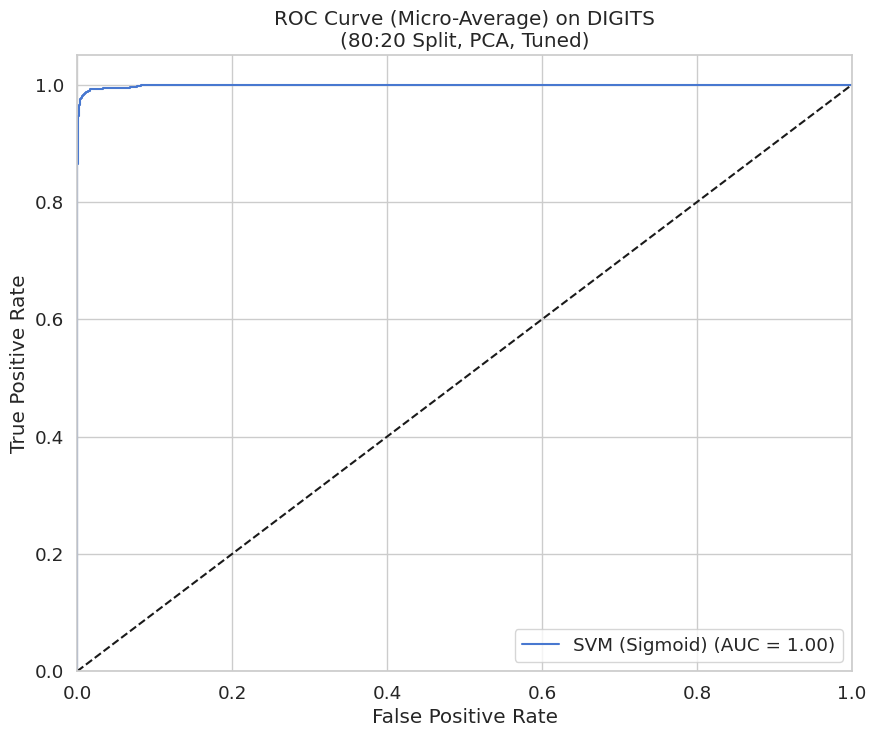

Original features: 64, PCA features: 39

running tuned model for 80:20 Split, PCA...
tuning SVM (Sigmoid) with PCA features...
best parameters for SVM (Sigmoid) on PCA data: {'C': 10, 'gamma': 0.001}
--- Results for SVM (Sigmoid) on DIGITS (80:20 Split, PCA, Tuned) ---
Accuracy: 0.9759
Precision (Weighted): 0.9765
Recall (Weighted): 0.9759
F1-Score (Weighted): 0.9759



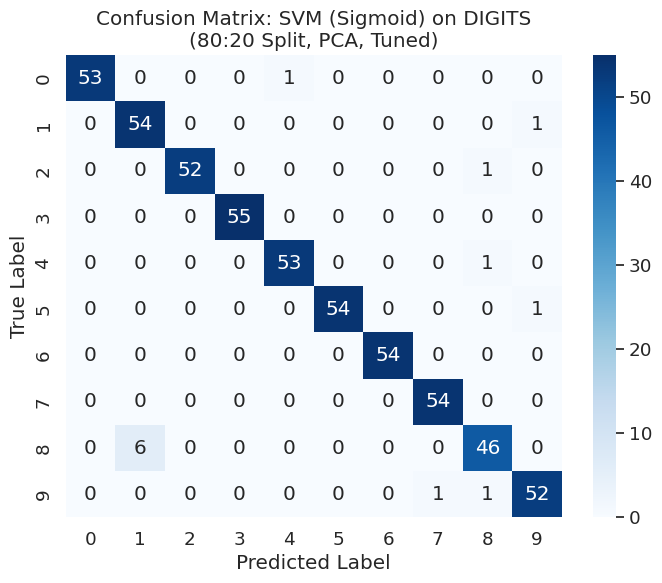

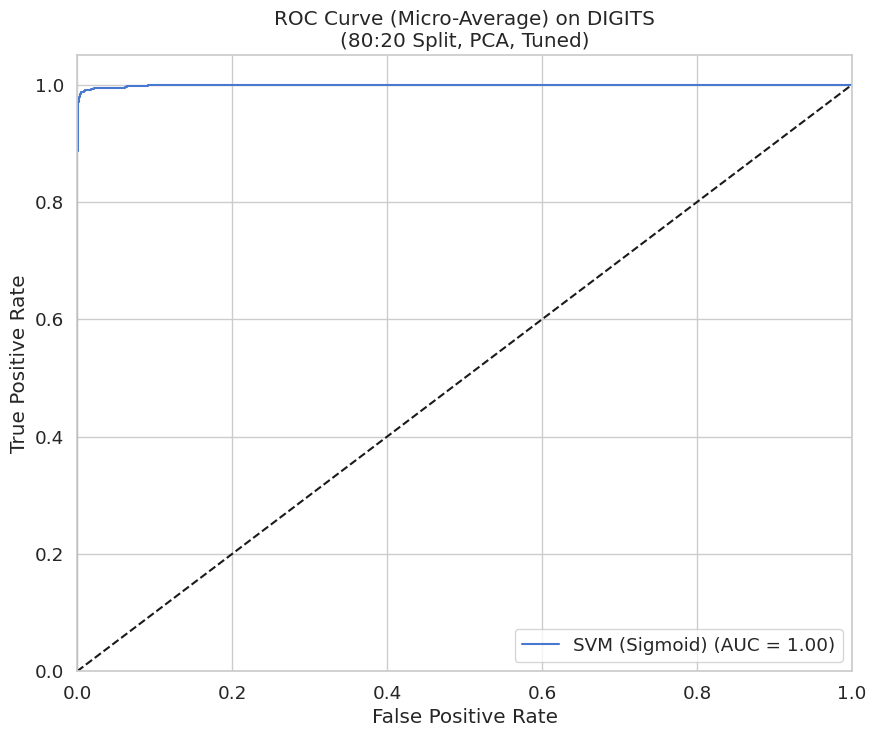

Original features: 64, PCA features: 40

running tuned model for 80:20 Split, PCA...
tuning SVM (Sigmoid) with PCA features...
best parameters for SVM (Sigmoid) on PCA data: {'C': 10, 'gamma': 0.001}
--- Results for SVM (Sigmoid) on DIGITS (80:20 Split, PCA, Tuned) ---
Accuracy: 0.9833
Precision (Weighted): 0.9851
Recall (Weighted): 0.9833
F1-Score (Weighted): 0.9832



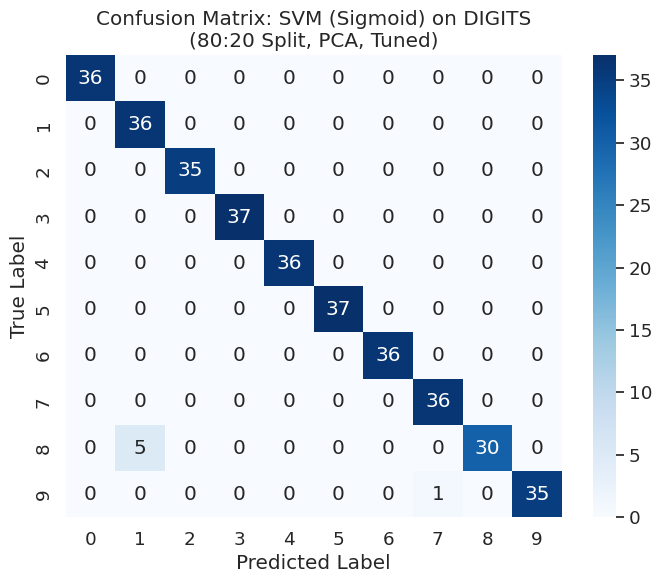

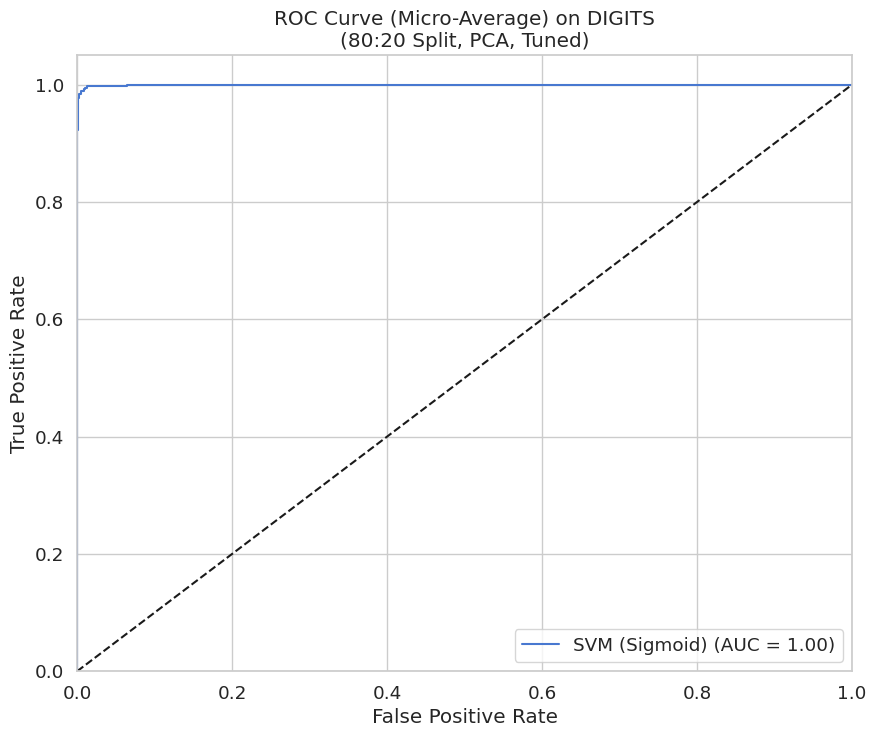

In [ ]:
def svm_sigmoid_complete(dataset, dataset_name):

    X, y = digits_dataset.data, digits_dataset.target
    results_list = []

    classifiers = {
          "SVM (Sigmoid)": SVC(kernel='sigmoid', probability=True, random_state=42),

    }

    param_grids = {
        "SVM (Sigmoid)": {'C': [0.1, 1, 10], 'gamma': [0.001, 0.01, 'scale']},
    }

    print(f"Experiments for digits dataset on Original Features ---")
    for split in splits:
        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=split, random_state=42, stratify=y
        )

        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)

        split_note = f"{int(100-split*100)}:{int(split*100)} Split"

        # without tuning
        print(f"\n running not tuned models for {split_note}...")
        trained_models_default = {}
        for name, model in classifiers.items():
            model.fit(X_train_scaled, y_train)
            trained_models_default[name] = model
            evaluate_model(model, X_test_scaled, y_test, name, dataset_name, split, f"{split_note}, Default", results_list)
        plot_roc_curves(trained_models_default, X_test_scaled, y_test, dataset_name, f"{split_note}, Default")

        # with tuning
        print(f"\ntuned model for {split_note}...")
        trained_models_tuned = {}
        for name, model in classifiers.items():
            print(f"Tuning {name}...")
            grid_search = GridSearchCV(model, param_grids[name], cv=5, n_jobs=-1, scoring='accuracy')
            grid_search.fit(X_train_scaled, y_train)
            best_model = grid_search.best_estimator_
            trained_models_tuned[name] = best_model
            print(f"best parameters for {name}: {grid_search.best_params_}")
            evaluate_model(best_model, X_test_scaled, y_test, name, dataset_name, split, f"{split_note}, Tuned", results_list)
        plot_roc_curves(trained_models_tuned, X_test_scaled, y_test, dataset_name, f"{split_note}, Tuned")

    # WITH PCA
    print(f"\n--- Starting for digits dataset with PCA ---")


    for split in splits:
      X_train, X_test, y_train, y_test = train_test_split(
          X, y, test_size=split, random_state=42, stratify=y
      )

      scaler = StandardScaler()
      X_train_scaled = scaler.fit_transform(X_train)
      X_test_scaled = scaler.transform(X_test)

      # pca with 95% variance
      pca = PCA(n_components=0.95)
      X_train_pca = pca.fit_transform(X_train_scaled)
      X_test_pca = pca.transform(X_test_scaled)
      print(f"Original features: {X_train.shape[1]}, PCA features: {X_train_pca.shape[1]}")

      pca_note = f"80:20 Split, PCA"

      # Model with tuning on PCA
      print(f"\nrunning tuned model for {pca_note}...")
      trained_models_pca = {}
      for name, model in classifiers.items():
          print(f"tuning {name} with PCA features...")
          grid_search = GridSearchCV(model, param_grids[name], cv=5, n_jobs=-1, scoring='accuracy')
          grid_search.fit(X_train_pca, y_train)
          best_model = grid_search.best_estimator_
          trained_models_pca[name] = best_model
          print(f"best parameters for {name} on PCA data: {grid_search.best_params_}")
          evaluate_model(best_model, X_test_pca, y_test, name, dataset_name, split, f"{pca_note}, Tuned", results_list)
      plot_roc_curves(trained_models_pca, X_test_pca, y_test, dataset_name, f"{pca_note}, Tuned")

    return pd.DataFrame(results_list)
svm_sigmoid_df_2 = svm_sigmoid_complete(digits_dataset,"DIGITS")


 Results Summary for DIGITS


,Dataset,Model,Train-Test Split,Tuning,PCA,Accuracy,Precision,Recall,F1-Score,Inference Time (s)
0,DIGITS,SVM (Sigmoid),50:50,Default,No,0.9444,0.9463,0.9444,0.9447,0.0353
1,DIGITS,SVM (Sigmoid),50:50,Tuned,No,0.9633,0.9652,0.9633,0.9634,0.0365
2,DIGITS,SVM (Sigmoid),60:40,Default,No,0.9332,0.9347,0.9332,0.9334,0.0353
3,DIGITS,SVM (Sigmoid),60:40,Tuned,No,0.9583,0.9601,0.9583,0.9584,0.0197
4,DIGITS,SVM (Sigmoid),70:30,Default,No,0.9389,0.9408,0.9389,0.9390,0.0262
5,DIGITS,SVM (Sigmoid),70:30,Tuned,No,0.9815,0.9819,0.9815,0.9815,0.0267
6,DIGITS,SVM (Sigmoid),80:20,Default,No,0.9389,0.9398,0.9389,0.9382,0.0293
7,DIGITS,SVM (Sigmoid),80:20,Tuned,No,0.9861,0.9865,0.9861,0.9861,0.0198
8,DIGITS,SVM (Sigmoid),50:50,Tuned,Yes,0.9533,0.9557,0.9533,0.9533,0.0567
9,DIGITS,SVM (Sigmoid),60:40,Tuned,Yes,0.9680,0.9697,0.9680,0.9682,0.0308


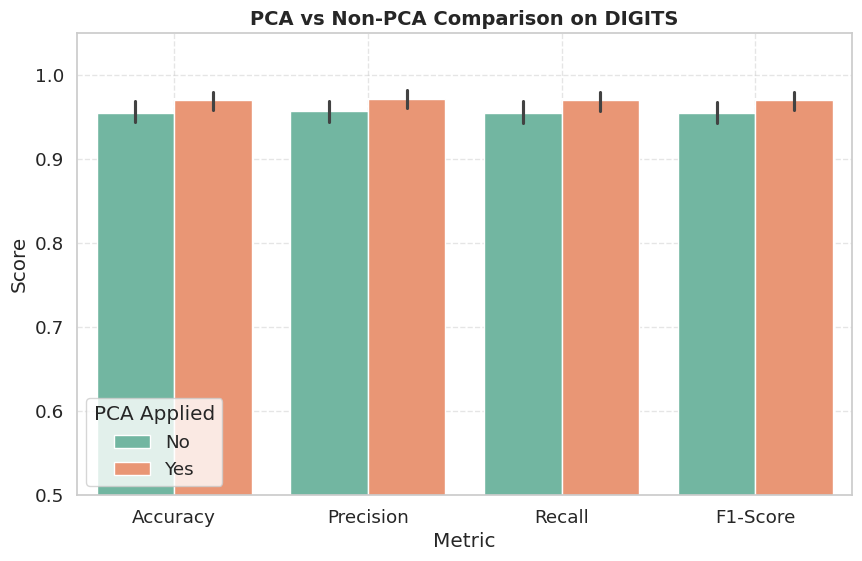

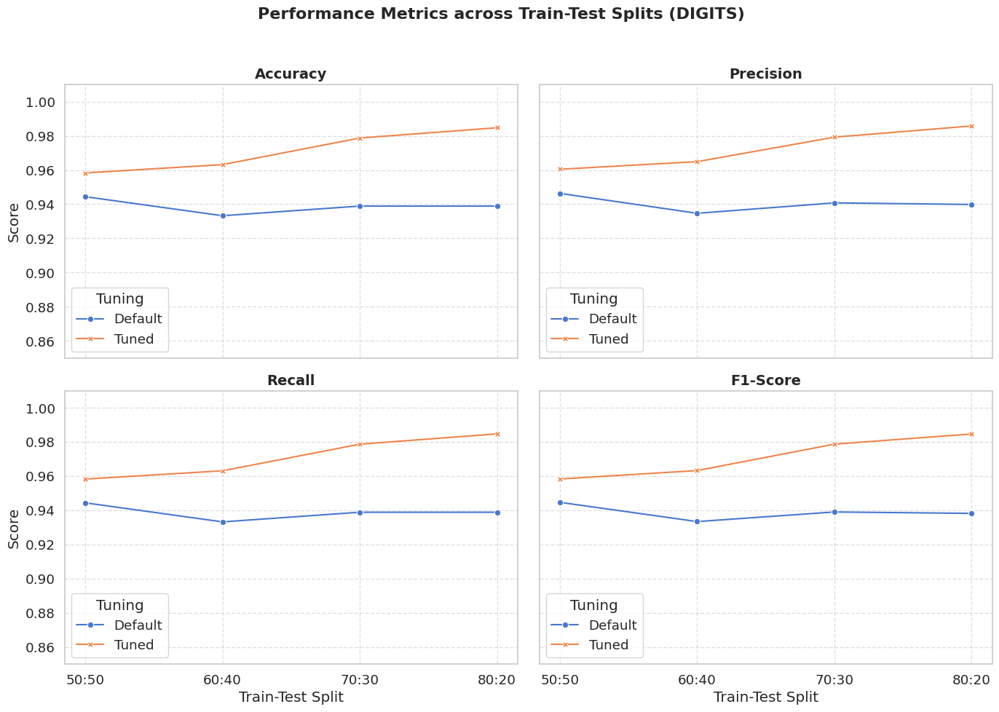

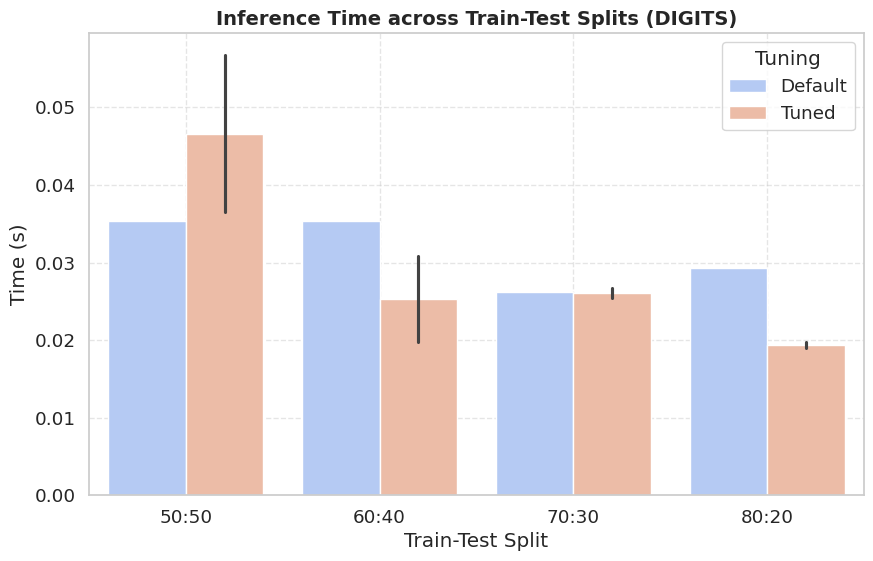

In [ ]:
analyze_results(svm_sigmoid_df_2,"DIGITS")

Experiments for digits dataset on Original Features ---

 running not tuned models for 50:50 Split...
--- Results for MLP on DIGITS (50:50 Split, Default) ---
Accuracy: 0.9711
Precision (Weighted): 0.9716
Recall (Weighted): 0.9711
F1-Score (Weighted): 0.9711



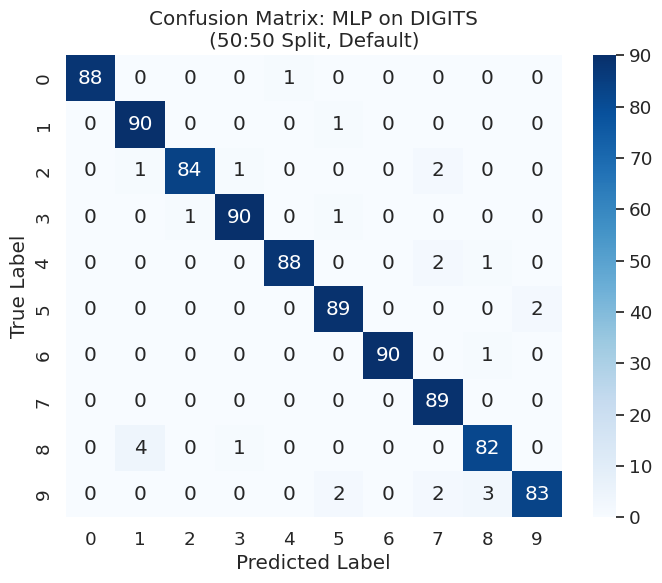

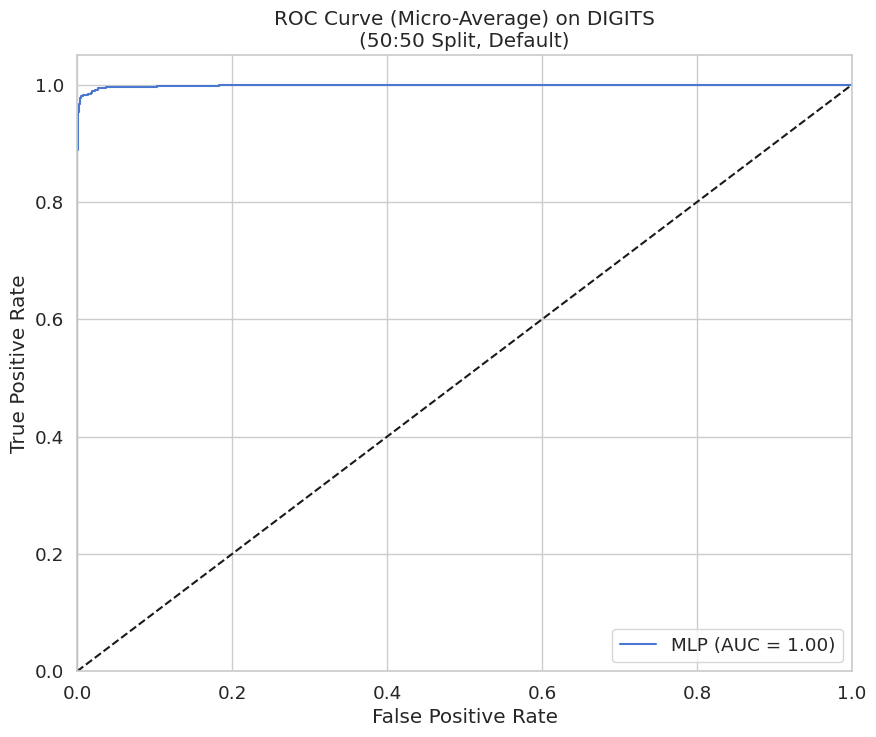


tuned model for 50:50 Split...
Tuning MLP...
best parameters for MLP: {'hidden_layer_sizes': (50,), 'learning_rate_init': 0.01}
--- Results for MLP on DIGITS (50:50 Split, Tuned) ---
Accuracy: 0.9622
Precision (Weighted): 0.9628
Recall (Weighted): 0.9622
F1-Score (Weighted): 0.9620



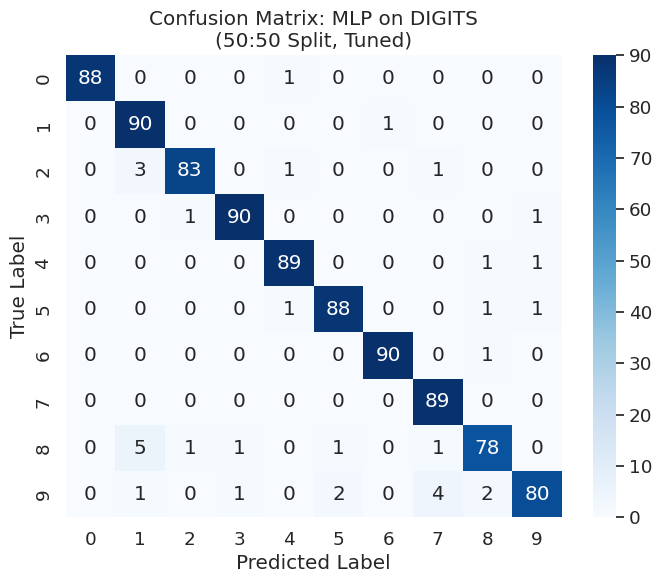

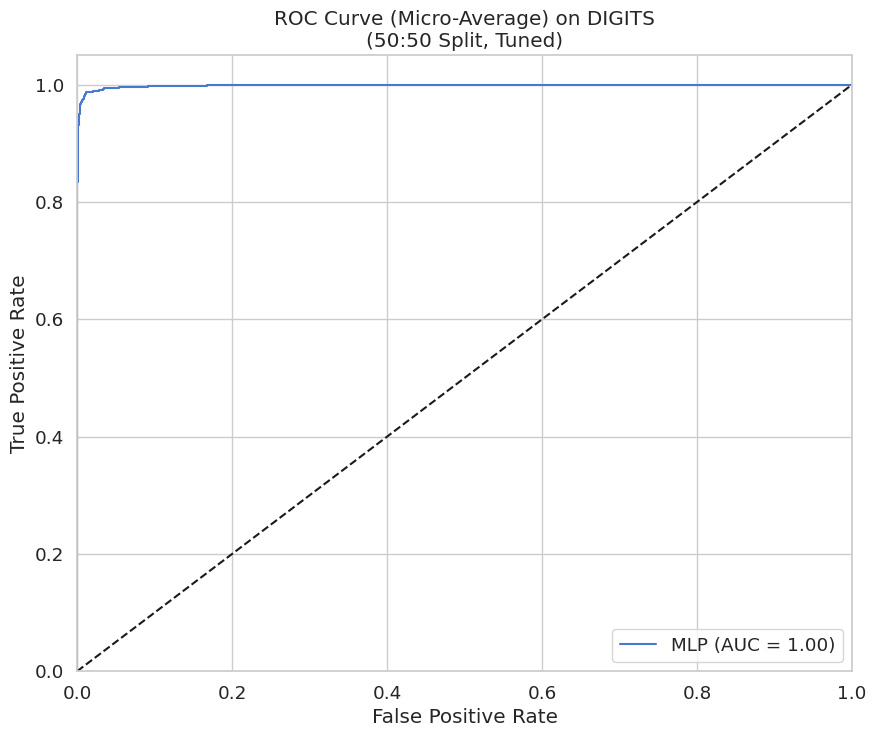


 running not tuned models for 60:40 Split...
--- Results for MLP on DIGITS (60:40 Split, Default) ---
Accuracy: 0.9722
Precision (Weighted): 0.9730
Recall (Weighted): 0.9722
F1-Score (Weighted): 0.9722



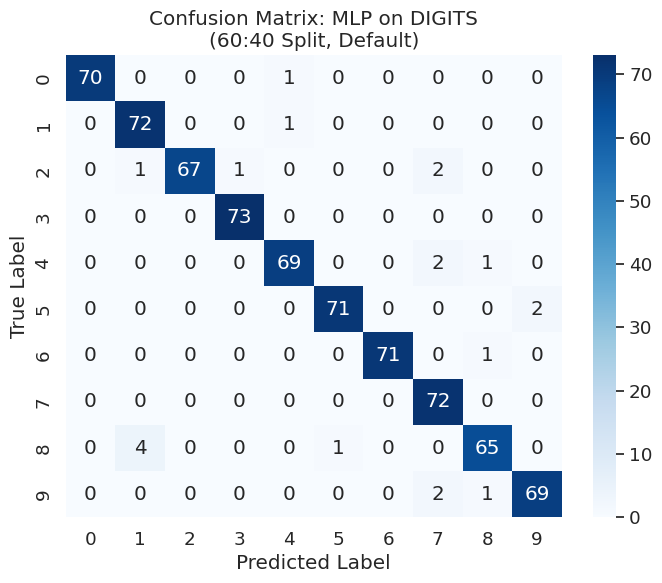

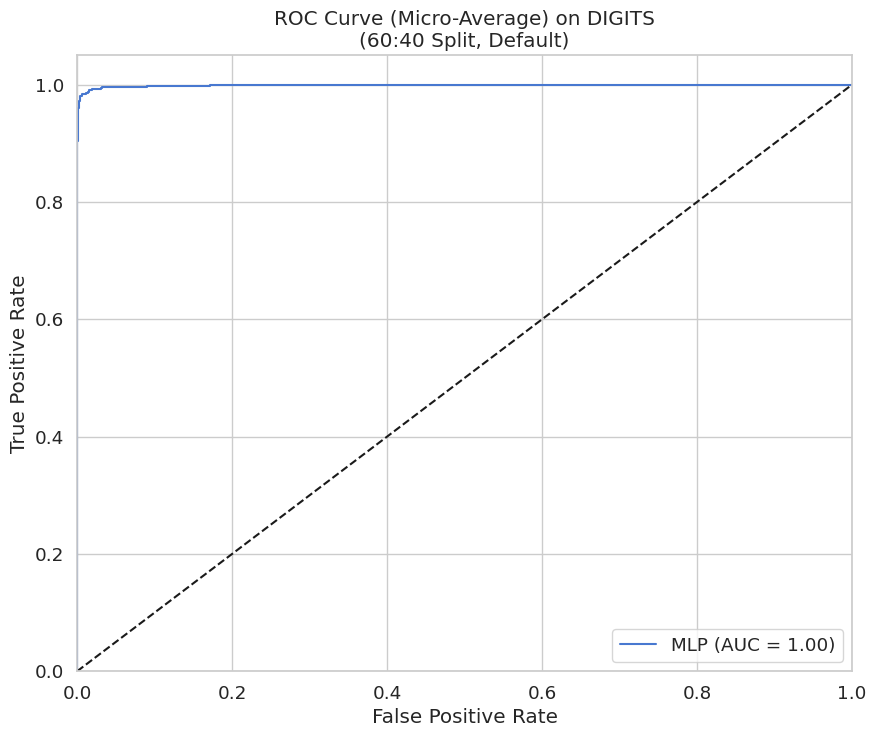


tuned model for 60:40 Split...
Tuning MLP...
best parameters for MLP: {'hidden_layer_sizes': (100,), 'learning_rate_init': 0.001}
--- Results for MLP on DIGITS (60:40 Split, Tuned) ---
Accuracy: 0.9722
Precision (Weighted): 0.9730
Recall (Weighted): 0.9722
F1-Score (Weighted): 0.9722



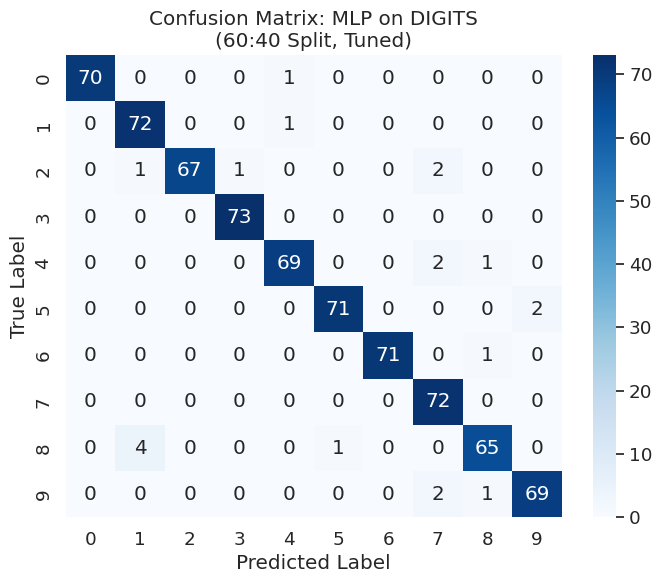

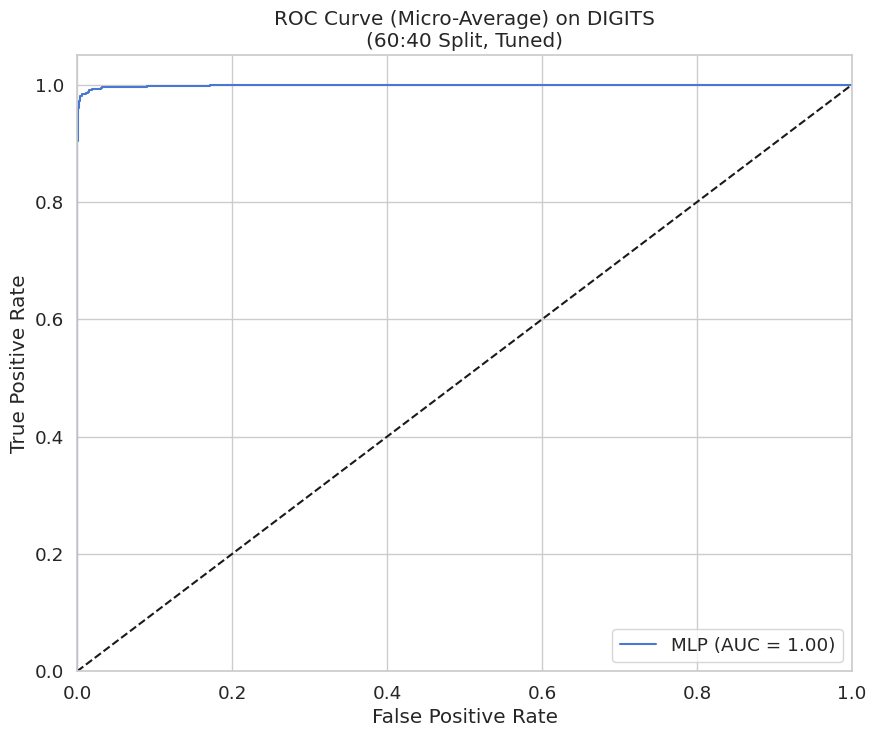


 running not tuned models for 70:30 Split...
--- Results for MLP on DIGITS (70:30 Split, Default) ---
Accuracy: 0.9796
Precision (Weighted): 0.9797
Recall (Weighted): 0.9796
F1-Score (Weighted): 0.9796



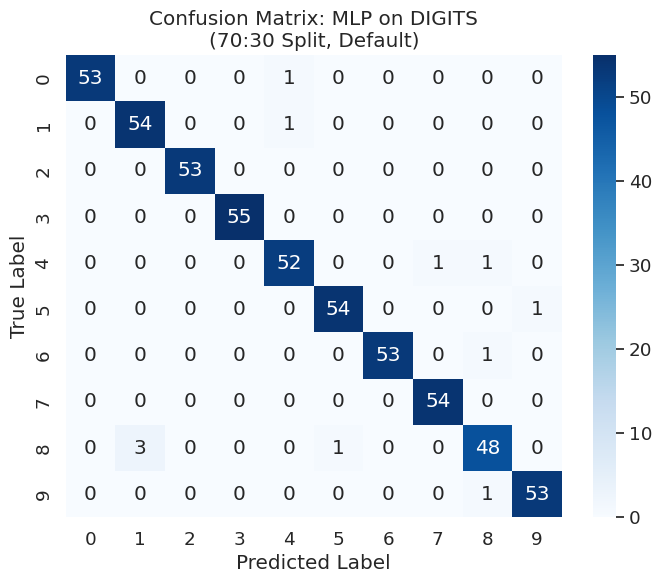

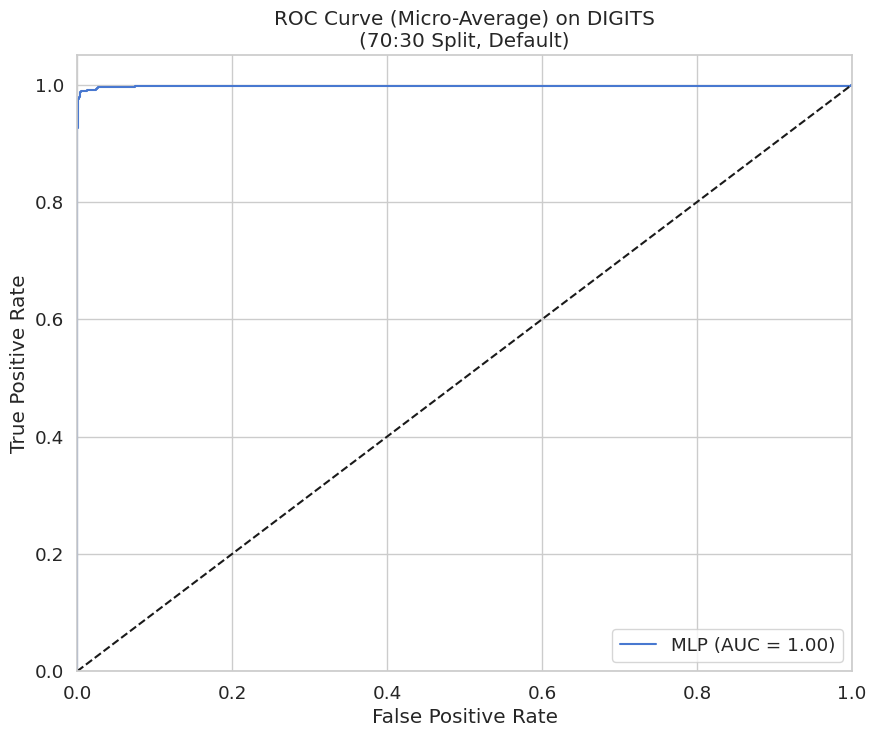


tuned model for 70:30 Split...
Tuning MLP...
best parameters for MLP: {'hidden_layer_sizes': (100,), 'learning_rate_init': 0.001}
--- Results for MLP on DIGITS (70:30 Split, Tuned) ---
Accuracy: 0.9796
Precision (Weighted): 0.9797
Recall (Weighted): 0.9796
F1-Score (Weighted): 0.9796



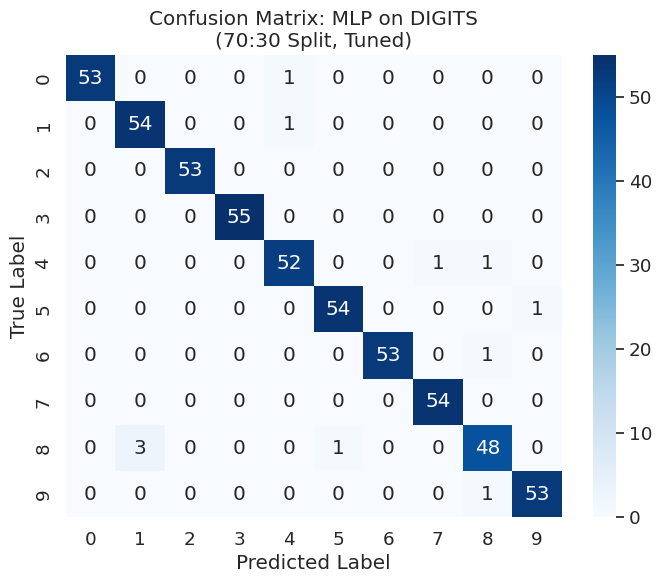

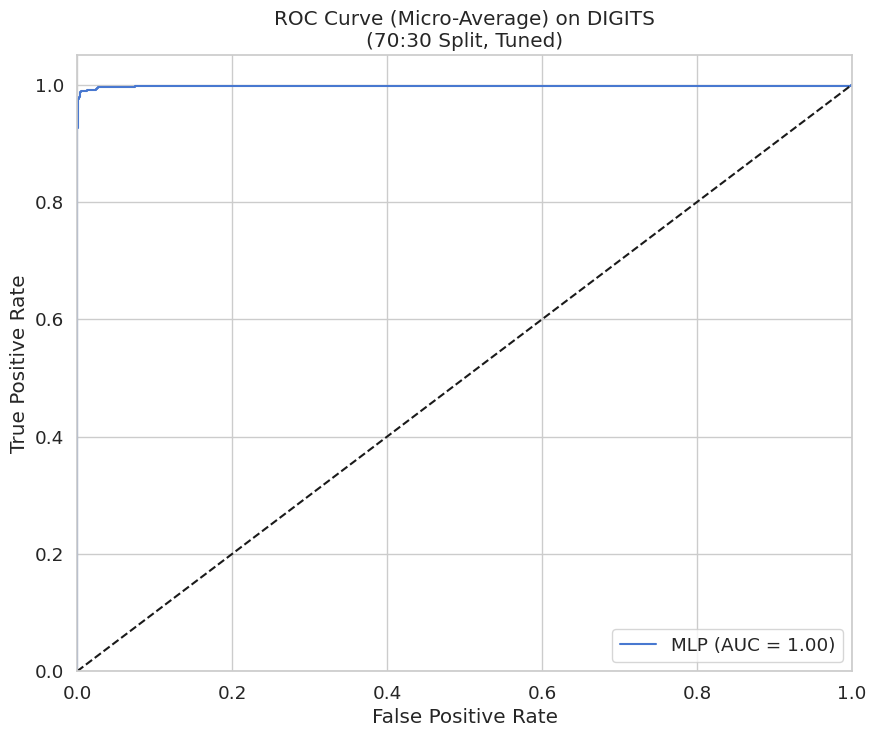


 running not tuned models for 80:20 Split...
--- Results for MLP on DIGITS (80:20 Split, Default) ---
Accuracy: 0.9750
Precision (Weighted): 0.9749
Recall (Weighted): 0.9750
F1-Score (Weighted): 0.9748



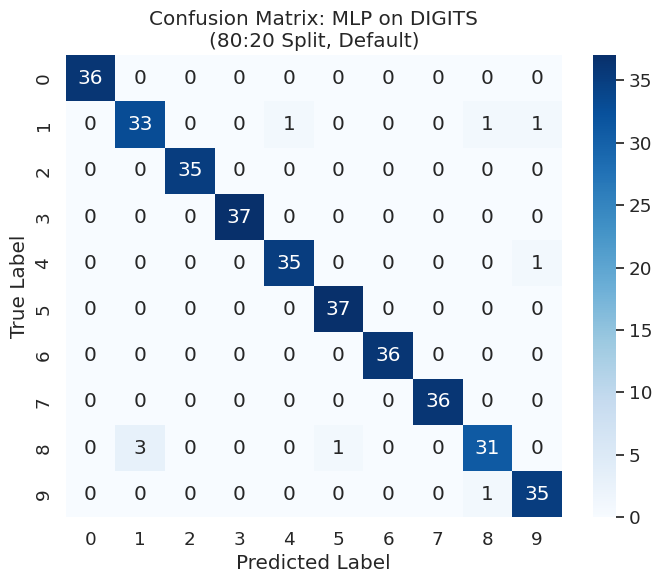

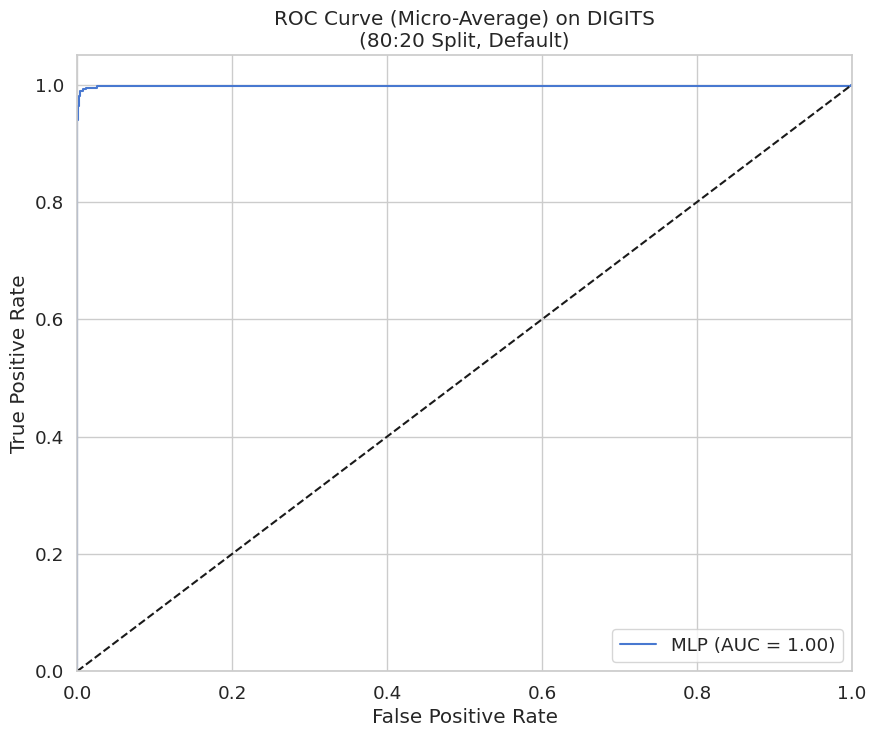


tuned model for 80:20 Split...
Tuning MLP...
best parameters for MLP: {'hidden_layer_sizes': (100,), 'learning_rate_init': 0.01}
--- Results for MLP on DIGITS (80:20 Split, Tuned) ---
Accuracy: 0.9750
Precision (Weighted): 0.9750
Recall (Weighted): 0.9750
F1-Score (Weighted): 0.9748



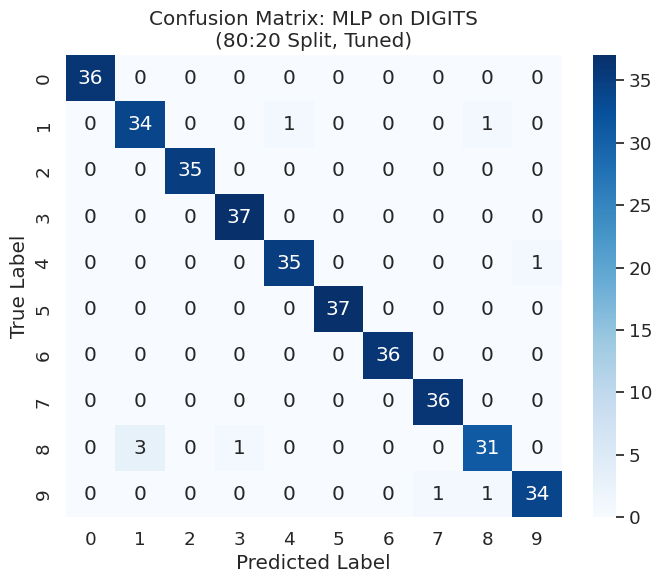

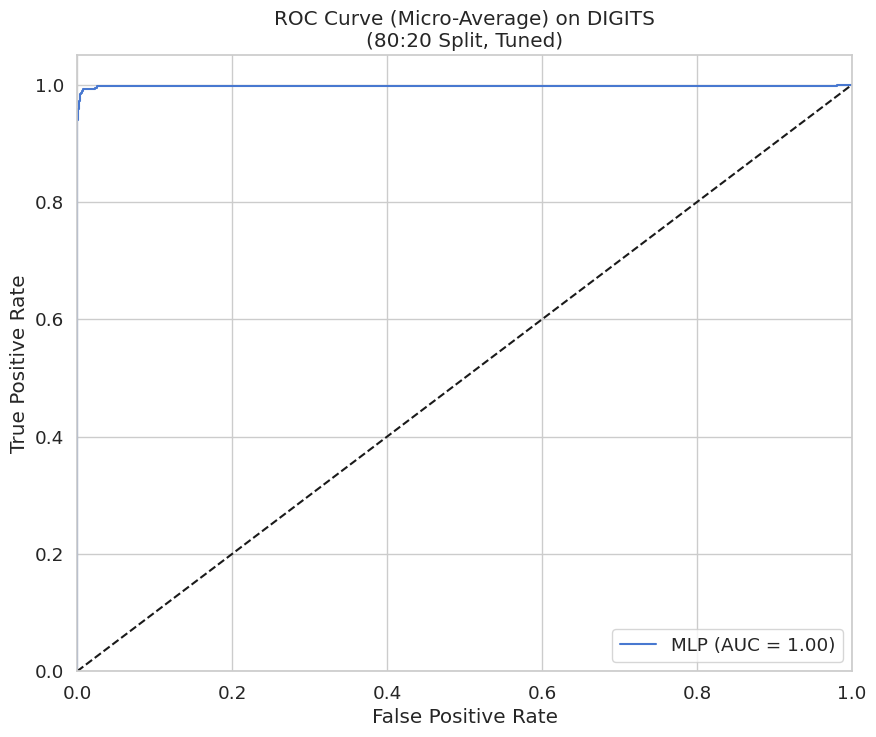


--- Starting for digits dataset with PCA ---
Original features: 64, PCA features: 39

running tuned model for 80:20 Split, PCA...
tuning MLP with PCA features...
best parameters for MLP on PCA data: {'hidden_layer_sizes': (100,), 'learning_rate_init': 0.001}
--- Results for MLP on DIGITS (80:20 Split, PCA, Tuned) ---
Accuracy: 0.9733
Precision (Weighted): 0.9737
Recall (Weighted): 0.9733
F1-Score (Weighted): 0.9732



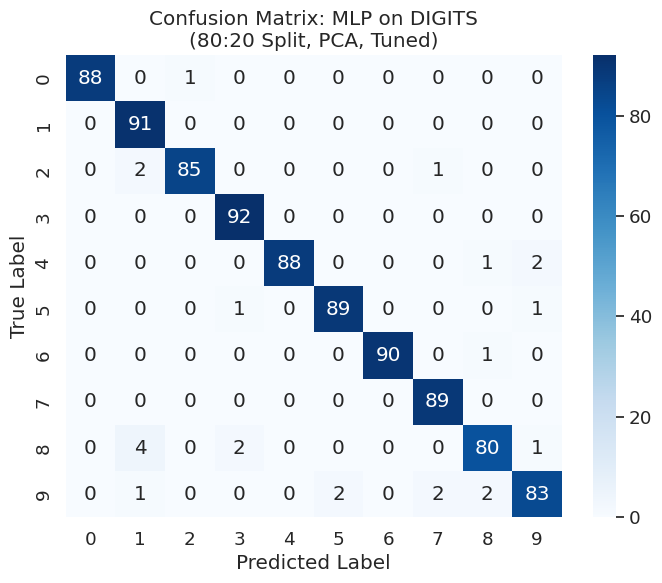

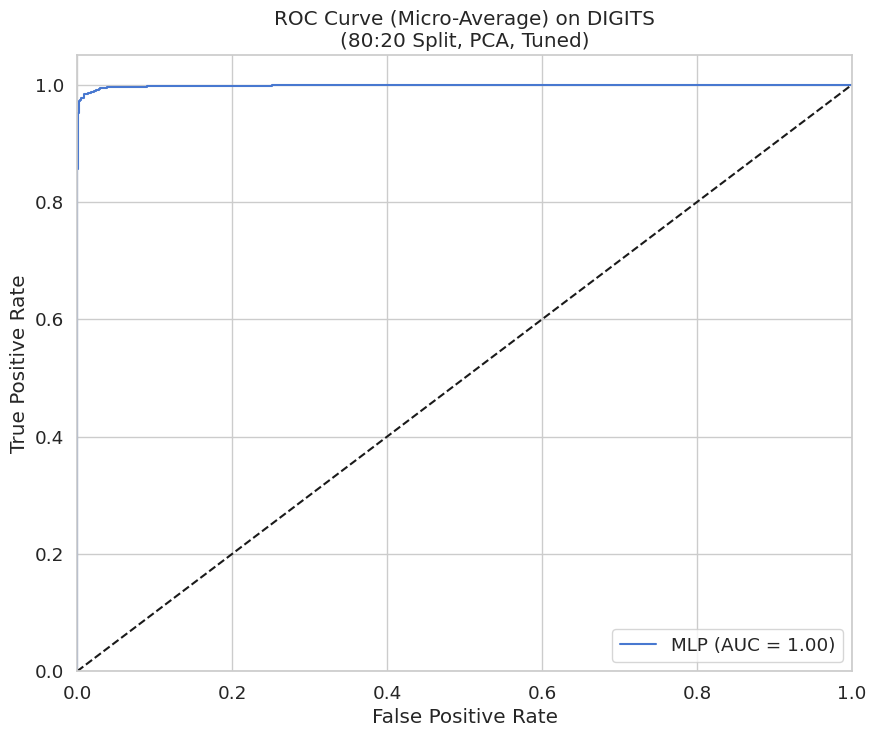

Original features: 64, PCA features: 39

running tuned model for 80:20 Split, PCA...
tuning MLP with PCA features...
best parameters for MLP on PCA data: {'hidden_layer_sizes': (100,), 'learning_rate_init': 0.001}
--- Results for MLP on DIGITS (80:20 Split, PCA, Tuned) ---
Accuracy: 0.9750
Precision (Weighted): 0.9760
Recall (Weighted): 0.9750
F1-Score (Weighted): 0.9750



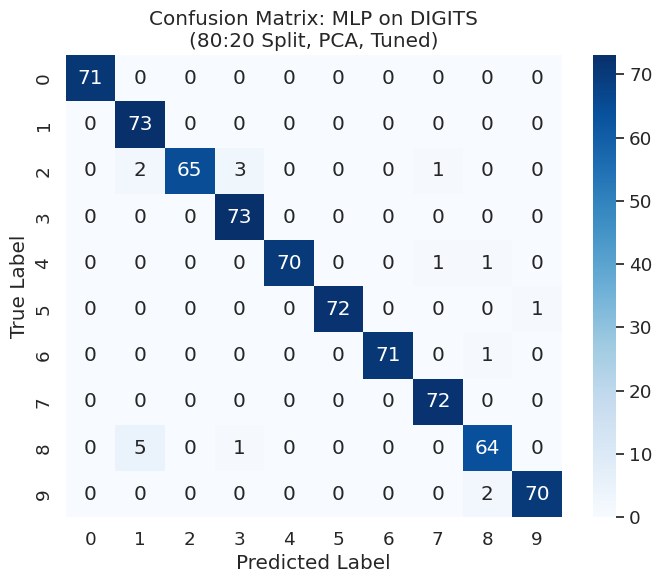

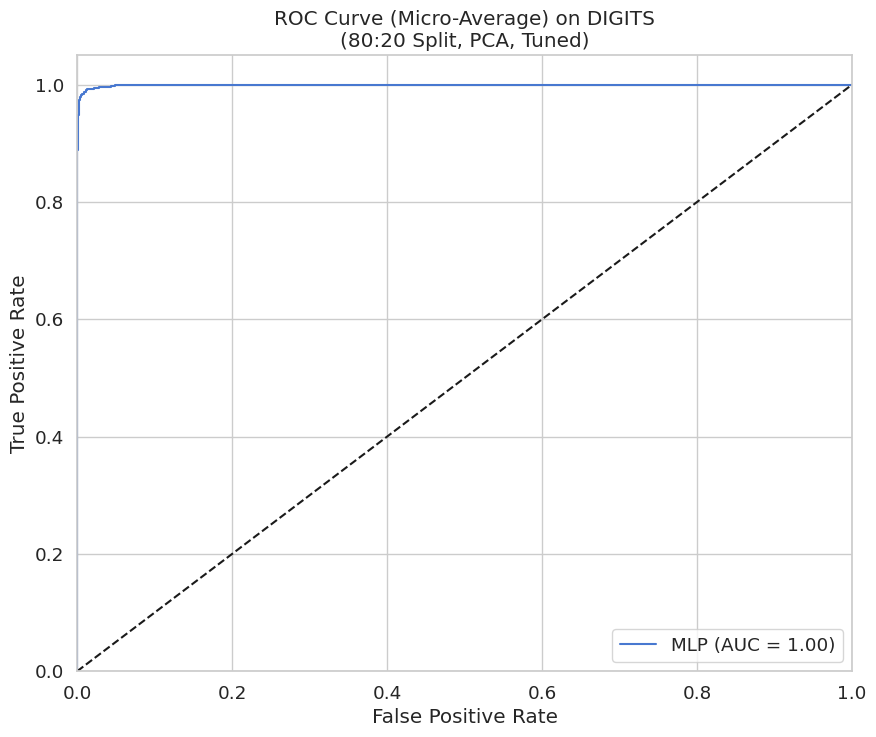

Original features: 64, PCA features: 39

running tuned model for 80:20 Split, PCA...
tuning MLP with PCA features...
best parameters for MLP on PCA data: {'hidden_layer_sizes': (100,), 'learning_rate_init': 0.001}
--- Results for MLP on DIGITS (80:20 Split, PCA, Tuned) ---
Accuracy: 0.9741
Precision (Weighted): 0.9743
Recall (Weighted): 0.9741
F1-Score (Weighted): 0.9740



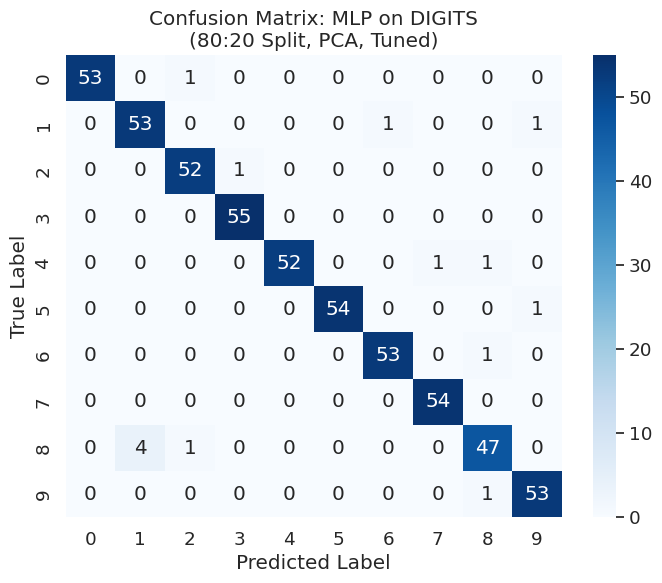

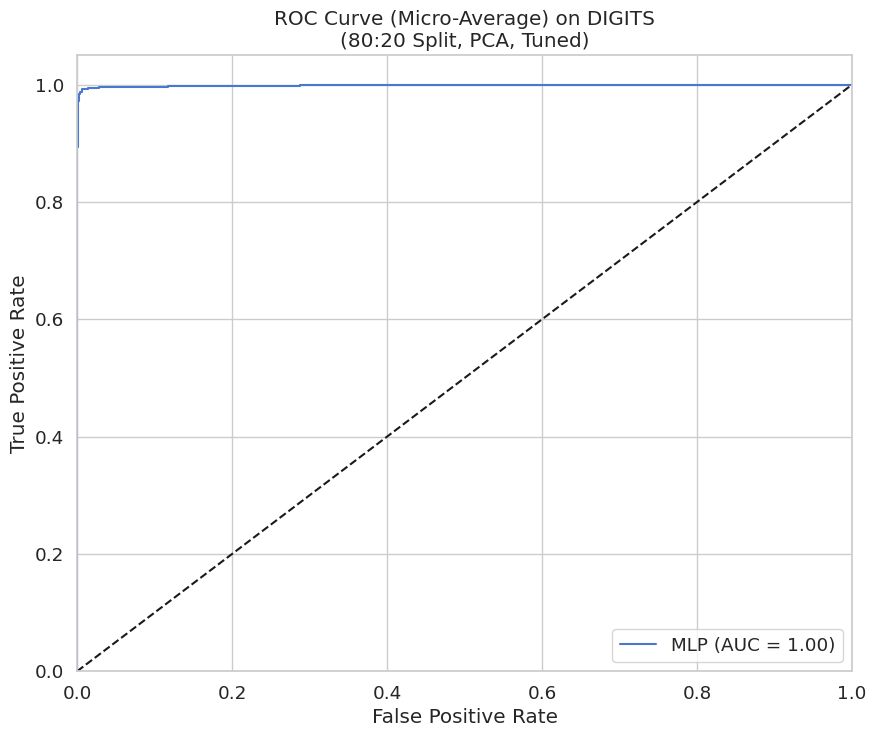

Original features: 64, PCA features: 40

running tuned model for 80:20 Split, PCA...
tuning MLP with PCA features...
best parameters for MLP on PCA data: {'hidden_layer_sizes': (100,), 'learning_rate_init': 0.001}
--- Results for MLP on DIGITS (80:20 Split, PCA, Tuned) ---
Accuracy: 0.9833
Precision (Weighted): 0.9834
Recall (Weighted): 0.9833
F1-Score (Weighted): 0.9832



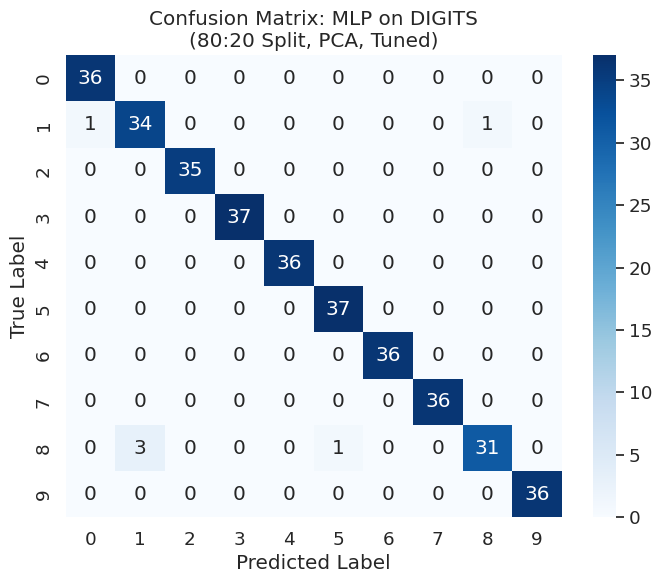

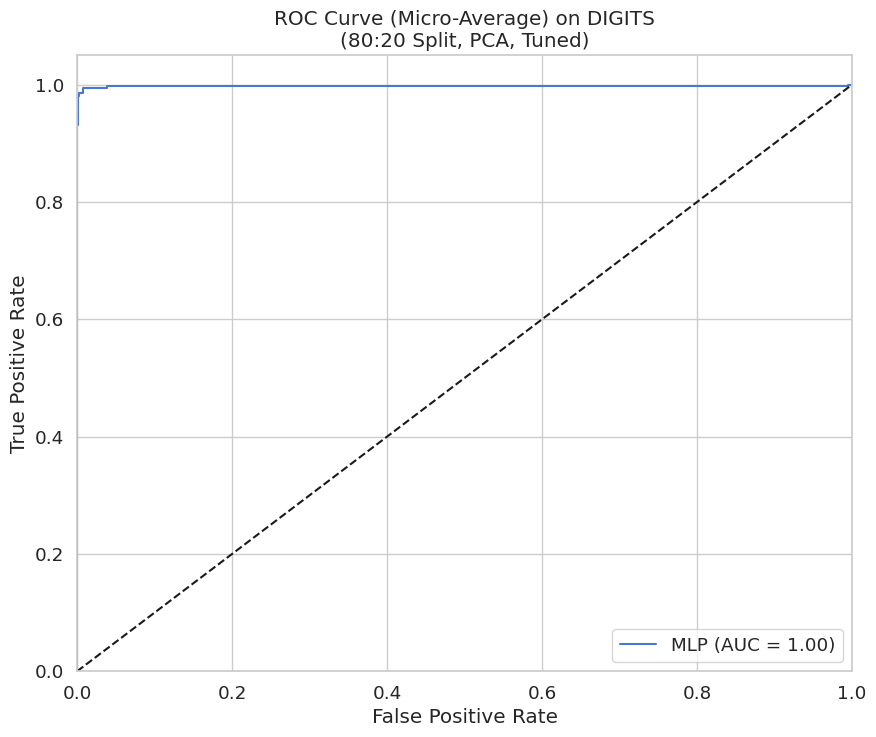

In [ ]:
def mlp_complete(dataset, dataset_name):

    X, y = digits_dataset.data, digits_dataset.target
    results_list = []

    classifiers = {
         "MLP": MLPClassifier(max_iter=1000, random_state=42),

    }

    param_grids = {
        "MLP": {'hidden_layer_sizes': [(50,), (100,), (50, 50)], 'learning_rate_init': [0.001, 0.01]},
    }

    print(f"Experiments for digits dataset on Original Features ---")
    for split in splits:
        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=split, random_state=42, stratify=y
        )

        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)

        split_note = f"{int(100-split*100)}:{int(split*100)} Split"

        # without tuning
        print(f"\n running not tuned models for {split_note}...")
        trained_models_default = {}
        for name, model in classifiers.items():
            model.fit(X_train_scaled, y_train)
            trained_models_default[name] = model
            evaluate_model(model, X_test_scaled, y_test, name, dataset_name, split, f"{split_note}, Default", results_list)
        plot_roc_curves(trained_models_default, X_test_scaled, y_test, dataset_name, f"{split_note}, Default")

        # with tuning
        print(f"\ntuned model for {split_note}...")
        trained_models_tuned = {}
        for name, model in classifiers.items():
            print(f"Tuning {name}...")
            grid_search = GridSearchCV(model, param_grids[name], cv=5, n_jobs=-1, scoring='accuracy')
            grid_search.fit(X_train_scaled, y_train)
            best_model = grid_search.best_estimator_
            trained_models_tuned[name] = best_model
            print(f"best parameters for {name}: {grid_search.best_params_}")
            evaluate_model(best_model, X_test_scaled, y_test, name, dataset_name, split, f"{split_note}, Tuned", results_list)
        plot_roc_curves(trained_models_tuned, X_test_scaled, y_test, dataset_name, f"{split_note}, Tuned")

    # WITH PCA
    print(f"\n--- Starting for digits dataset with PCA ---")


    for split in splits:
      X_train, X_test, y_train, y_test = train_test_split(
          X, y, test_size=split, random_state=42, stratify=y
      )

      scaler = StandardScaler()
      X_train_scaled = scaler.fit_transform(X_train)
      X_test_scaled = scaler.transform(X_test)

      # pca with 95% variance
      pca = PCA(n_components=0.95)
      X_train_pca = pca.fit_transform(X_train_scaled)
      X_test_pca = pca.transform(X_test_scaled)
      print(f"Original features: {X_train.shape[1]}, PCA features: {X_train_pca.shape[1]}")

      pca_note = f"80:20 Split, PCA"

      # Model with tuning on PCA
      print(f"\nrunning tuned model for {pca_note}...")
      trained_models_pca = {}
      for name, model in classifiers.items():
          print(f"tuning {name} with PCA features...")
          grid_search = GridSearchCV(model, param_grids[name], cv=5, n_jobs=-1, scoring='accuracy')
          grid_search.fit(X_train_pca, y_train)
          best_model = grid_search.best_estimator_
          trained_models_pca[name] = best_model
          print(f"best parameters for {name} on PCA data: {grid_search.best_params_}")
          evaluate_model(best_model, X_test_pca, y_test, name, dataset_name, split, f"{pca_note}, Tuned", results_list)
      plot_roc_curves(trained_models_pca, X_test_pca, y_test, dataset_name, f"{pca_note}, Tuned")

    return pd.DataFrame(results_list)
mlp_df_2 = mlp_complete(digits_dataset,"DIGITS")


 Results Summary for DIGITS


,Dataset,Model,Train-Test Split,Tuning,PCA,Accuracy,Precision,Recall,F1-Score,Inference Time (s)
0,DIGITS,MLP,50:50,Default,No,0.9711,0.9716,0.9711,0.9711,0.0021
1,DIGITS,MLP,50:50,Tuned,No,0.9622,0.9628,0.9622,0.9620,0.0021
2,DIGITS,MLP,60:40,Default,No,0.9722,0.9730,0.9722,0.9722,0.0020
3,DIGITS,MLP,60:40,Tuned,No,0.9722,0.9730,0.9722,0.9722,0.0022
4,DIGITS,MLP,70:30,Default,No,0.9796,0.9797,0.9796,0.9796,0.0016
5,DIGITS,MLP,70:30,Tuned,No,0.9796,0.9797,0.9796,0.9796,0.0120
6,DIGITS,MLP,80:20,Default,No,0.9750,0.9749,0.9750,0.9748,0.0013
7,DIGITS,MLP,80:20,Tuned,No,0.9750,0.9750,0.9750,0.9748,0.0012
8,DIGITS,MLP,50:50,Tuned,Yes,0.9733,0.9737,0.9733,0.9732,0.0021
9,DIGITS,MLP,60:40,Tuned,Yes,0.9750,0.9760,0.9750,0.9750,0.0021


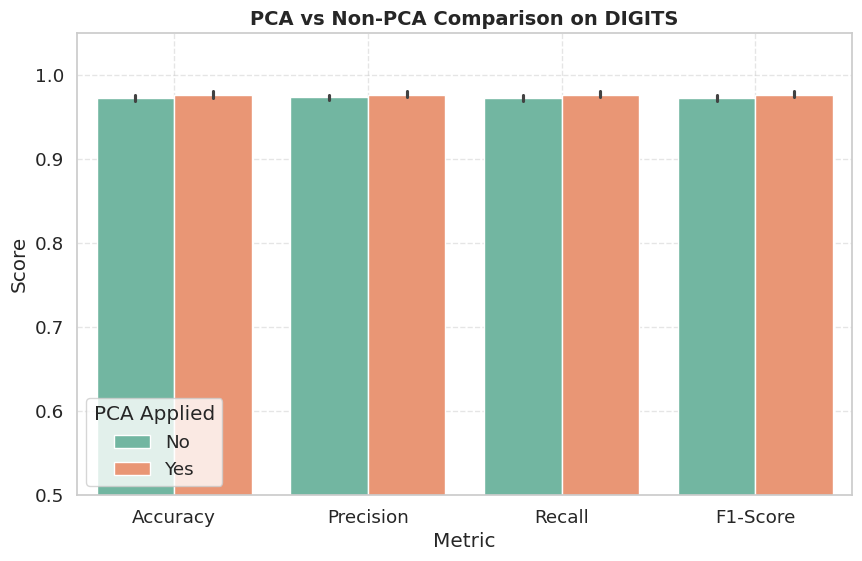

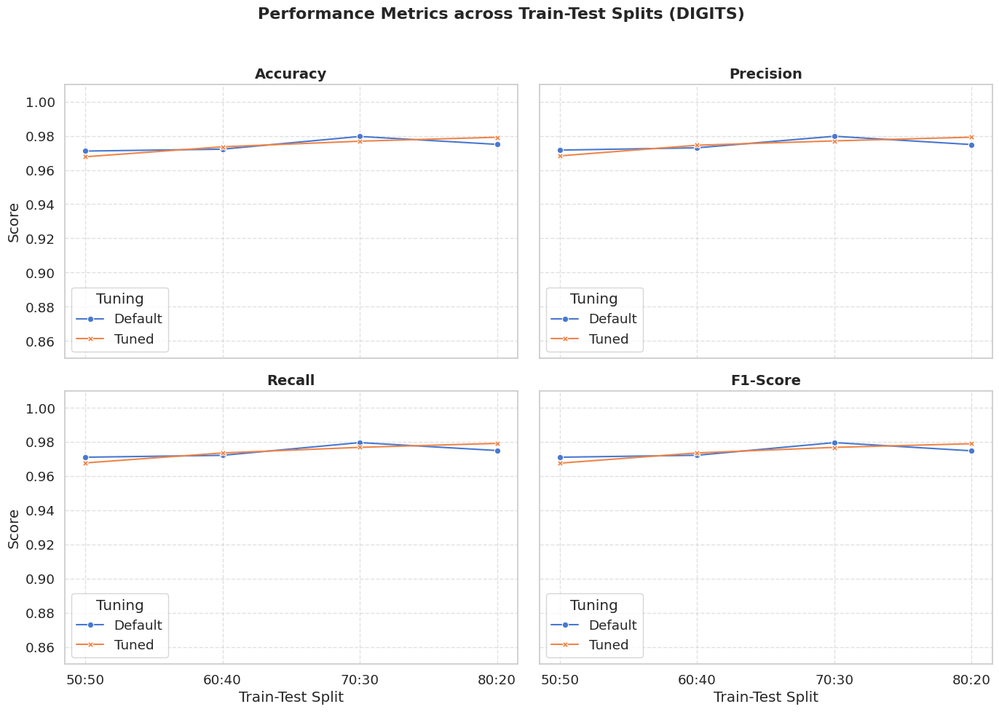

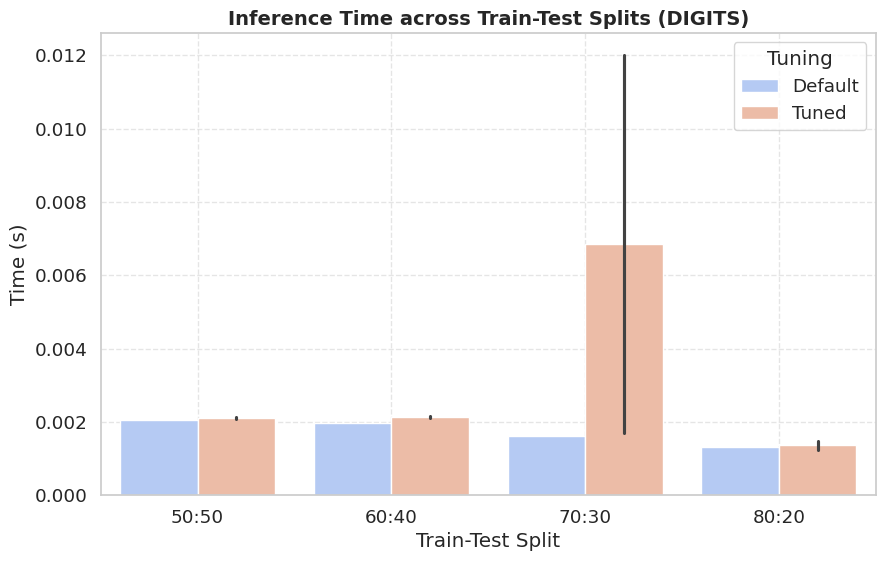

In [ ]:
analyze_results(mlp_df_2,"DIGITS")

Experiments for digits dataset on Original Features ---

 running not tuned models for 50:50 Split...
--- Results for Random Forest on DIGITS (50:50 Split, Default) ---
Accuracy: 0.9577
Precision (Weighted): 0.9592
Recall (Weighted): 0.9577
F1-Score (Weighted): 0.9577



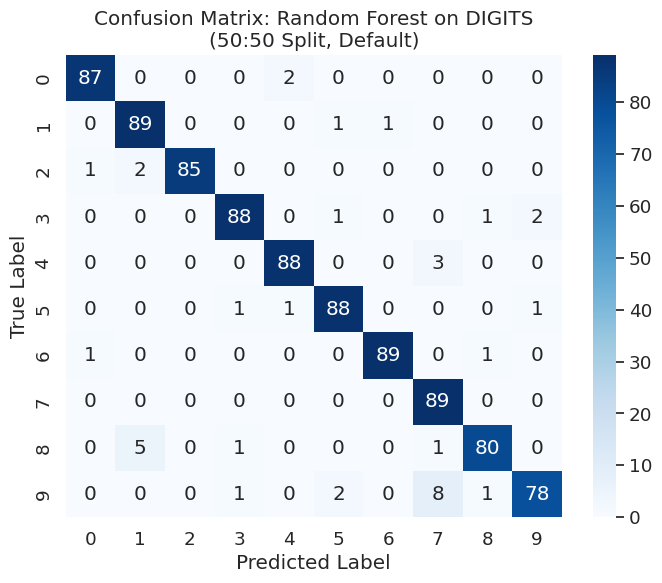

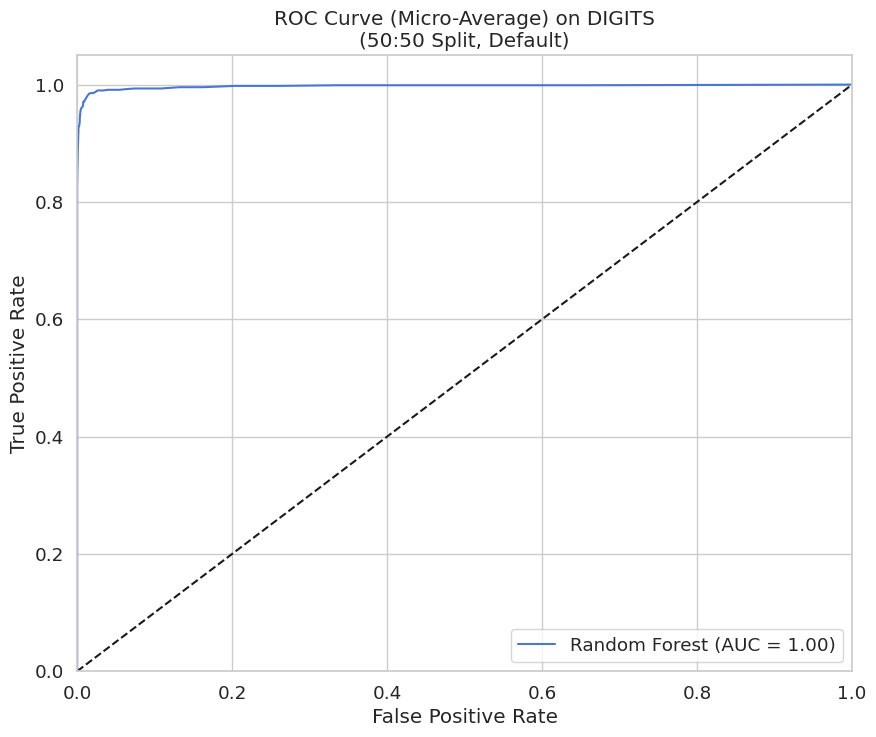


tuned model for 50:50 Split...
Tuning Random Forest...
best parameters for Random Forest: {'max_depth': 10, 'n_estimators': 200}
--- Results for Random Forest on DIGITS (50:50 Split, Tuned) ---
Accuracy: 0.9588
Precision (Weighted): 0.9601
Recall (Weighted): 0.9588
F1-Score (Weighted): 0.9587



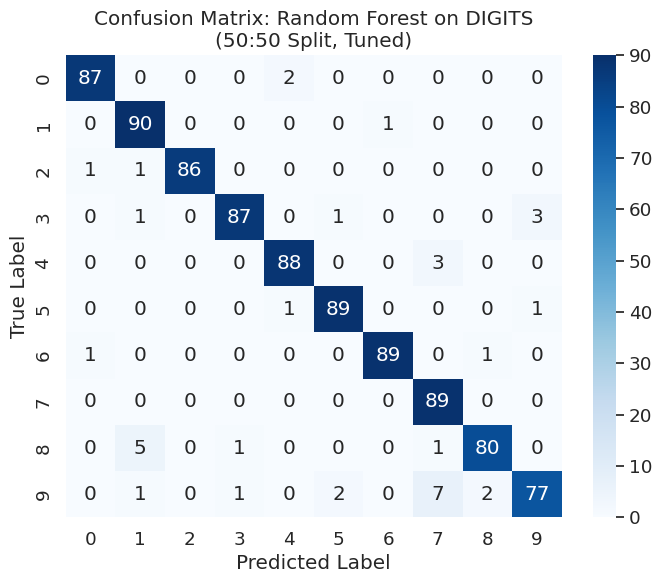

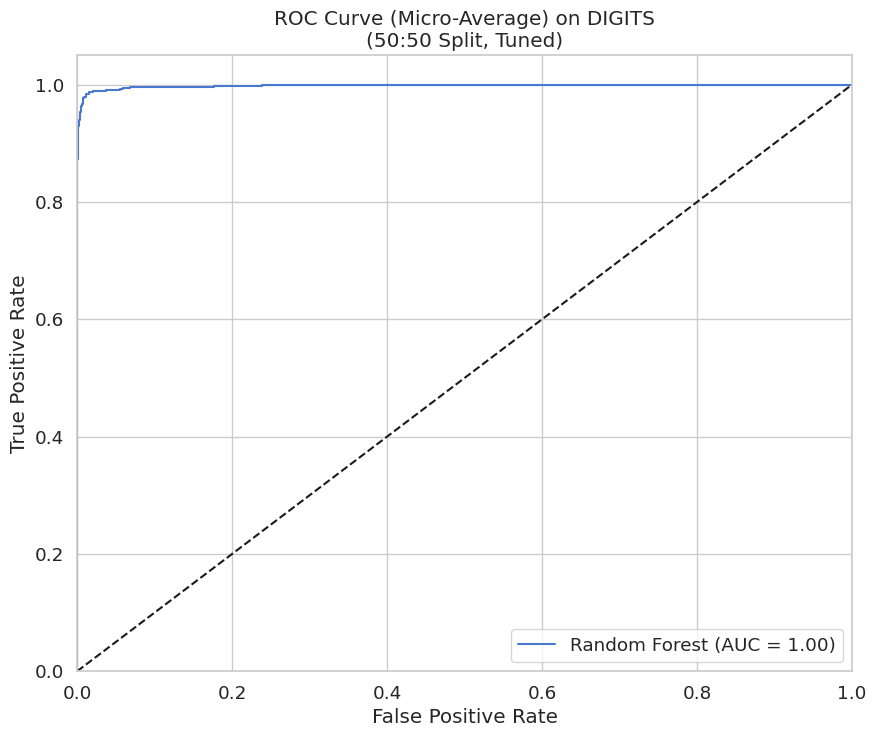


 running not tuned models for 60:40 Split...
--- Results for Random Forest on DIGITS (60:40 Split, Default) ---
Accuracy: 0.9666
Precision (Weighted): 0.9676
Recall (Weighted): 0.9666
F1-Score (Weighted): 0.9666



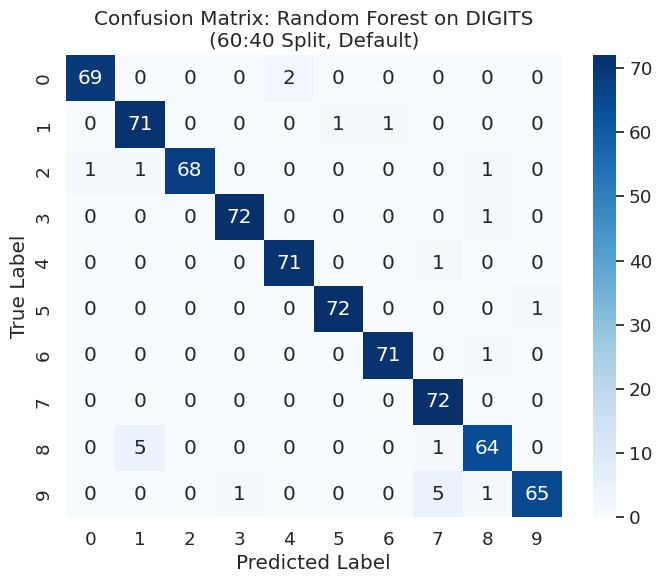

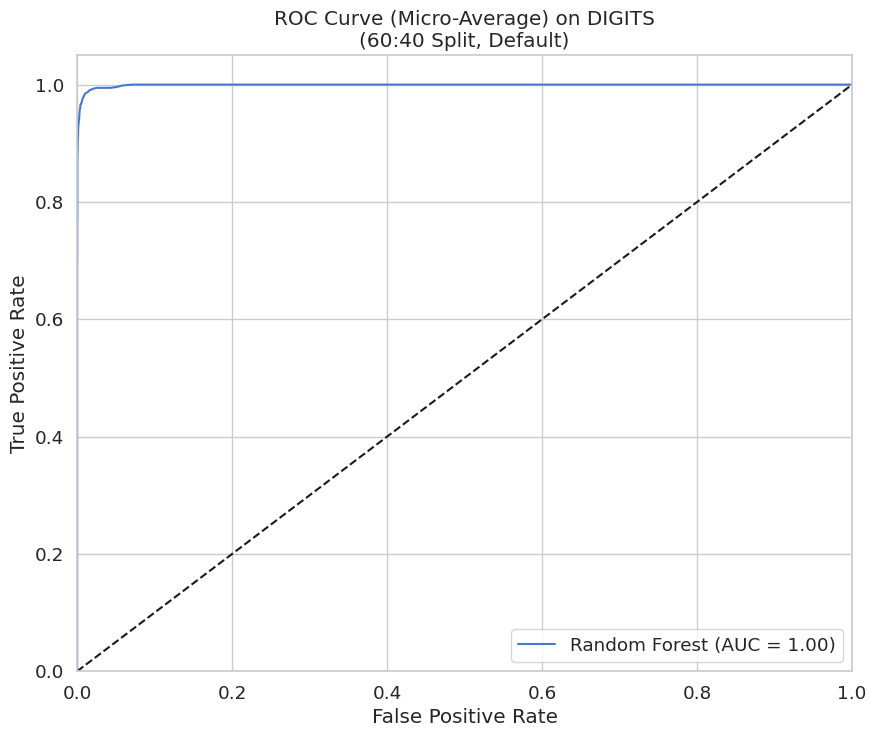


tuned model for 60:40 Split...
Tuning Random Forest...
best parameters for Random Forest: {'max_depth': 20, 'n_estimators': 200}
--- Results for Random Forest on DIGITS (60:40 Split, Tuned) ---
Accuracy: 0.9652
Precision (Weighted): 0.9665
Recall (Weighted): 0.9652
F1-Score (Weighted): 0.9651



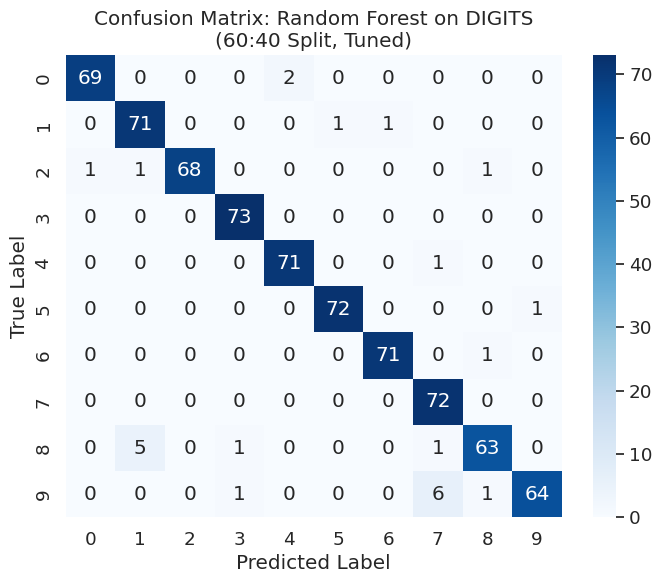

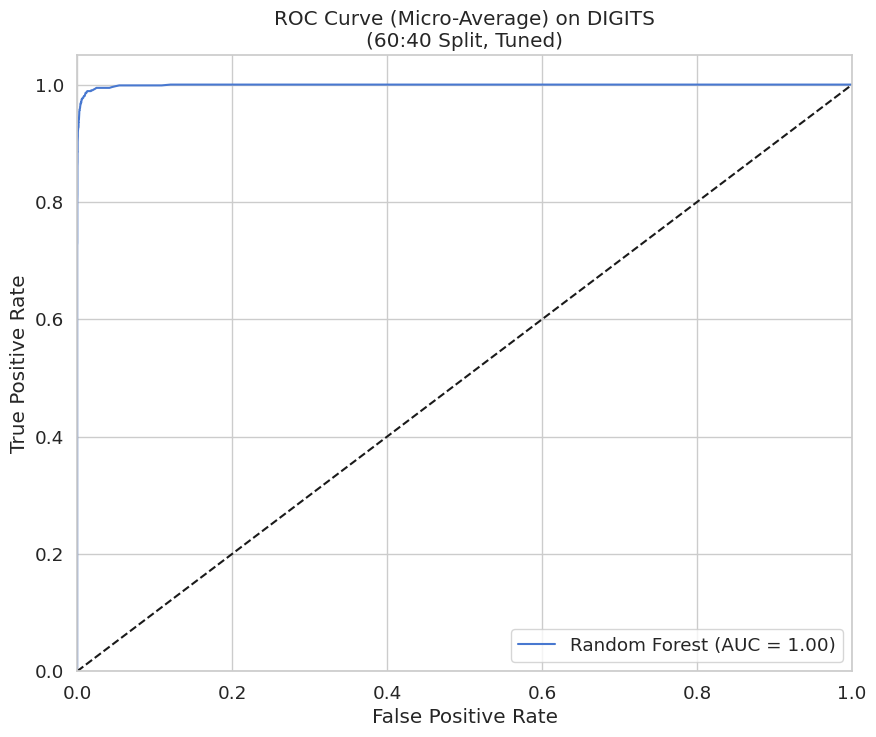


 running not tuned models for 70:30 Split...
--- Results for Random Forest on DIGITS (70:30 Split, Default) ---
Accuracy: 0.9685
Precision (Weighted): 0.9694
Recall (Weighted): 0.9685
F1-Score (Weighted): 0.9684



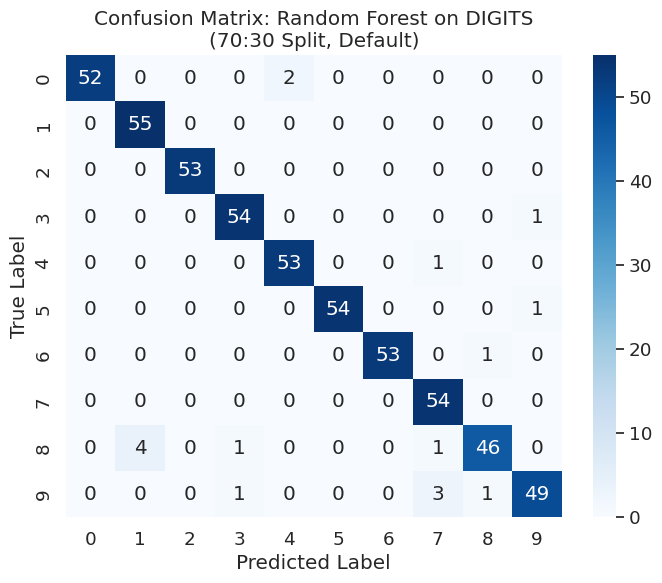

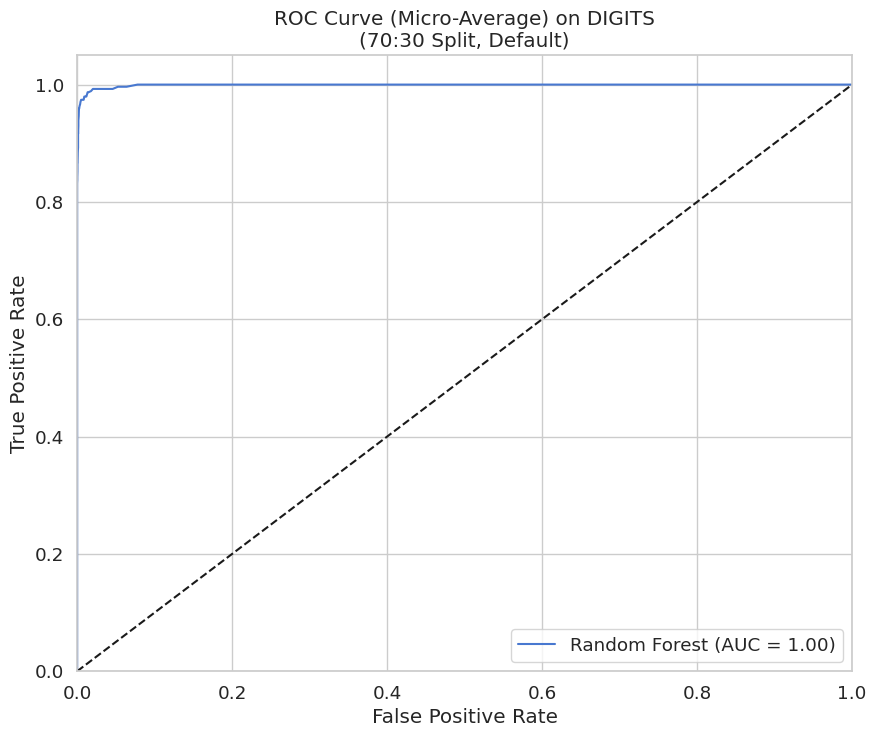


tuned model for 70:30 Split...
Tuning Random Forest...
best parameters for Random Forest: {'max_depth': 10, 'n_estimators': 200}
--- Results for Random Forest on DIGITS (70:30 Split, Tuned) ---
Accuracy: 0.9630
Precision (Weighted): 0.9635
Recall (Weighted): 0.9630
F1-Score (Weighted): 0.9628



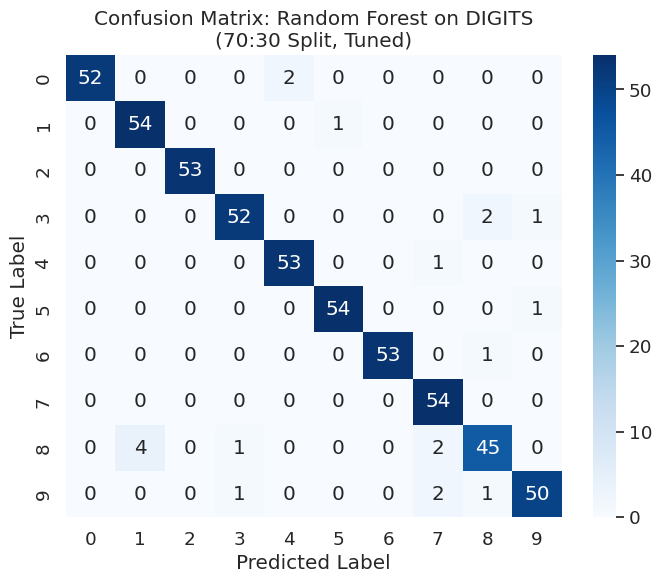

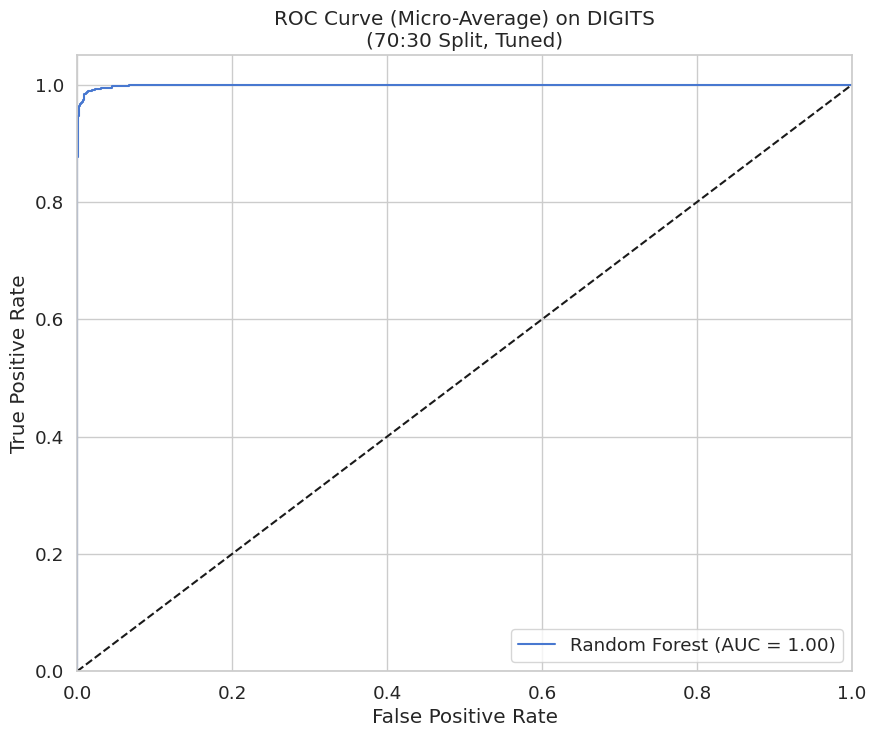


 running not tuned models for 80:20 Split...
--- Results for Random Forest on DIGITS (80:20 Split, Default) ---
Accuracy: 0.9639
Precision (Weighted): 0.9644
Recall (Weighted): 0.9639
F1-Score (Weighted): 0.9636



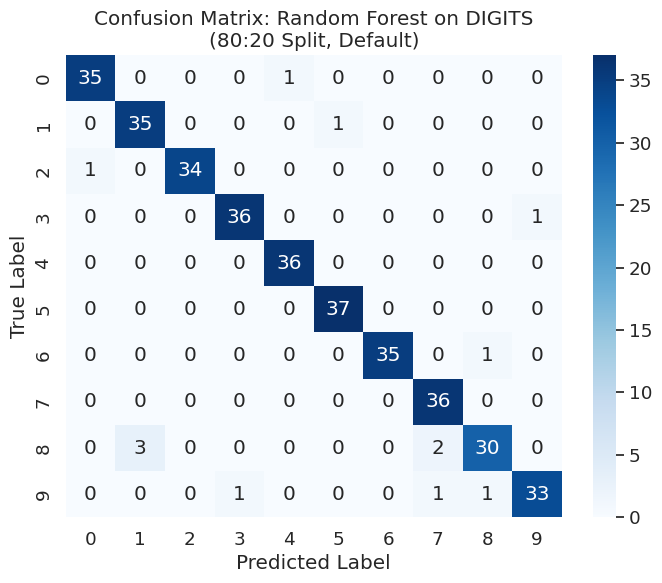

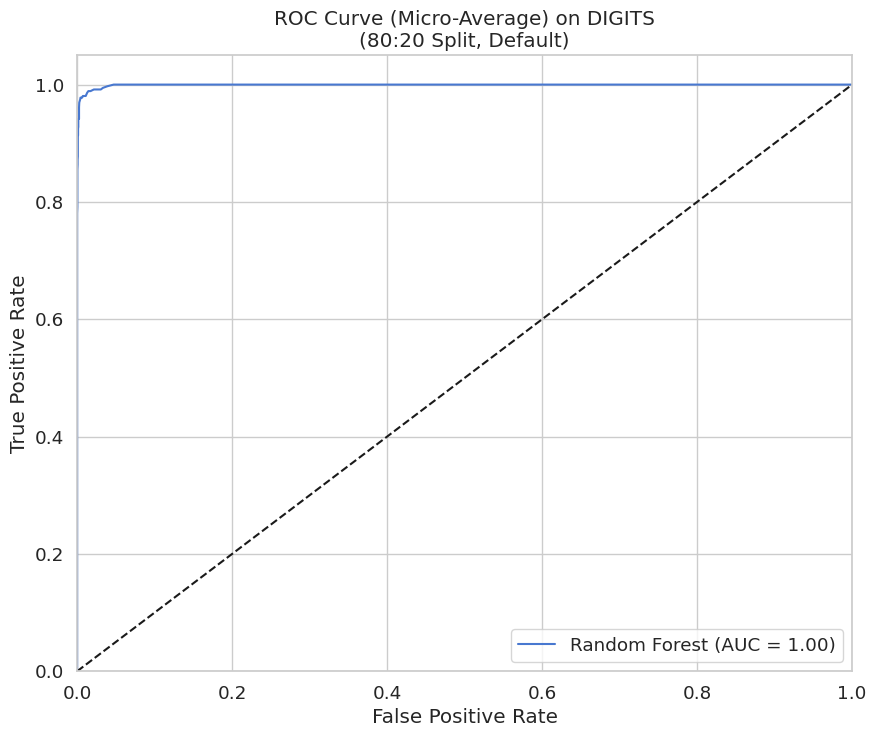


tuned model for 80:20 Split...
Tuning Random Forest...
best parameters for Random Forest: {'max_depth': 10, 'n_estimators': 200}
--- Results for Random Forest on DIGITS (80:20 Split, Tuned) ---
Accuracy: 0.9639
Precision (Weighted): 0.9648
Recall (Weighted): 0.9639
F1-Score (Weighted): 0.9637



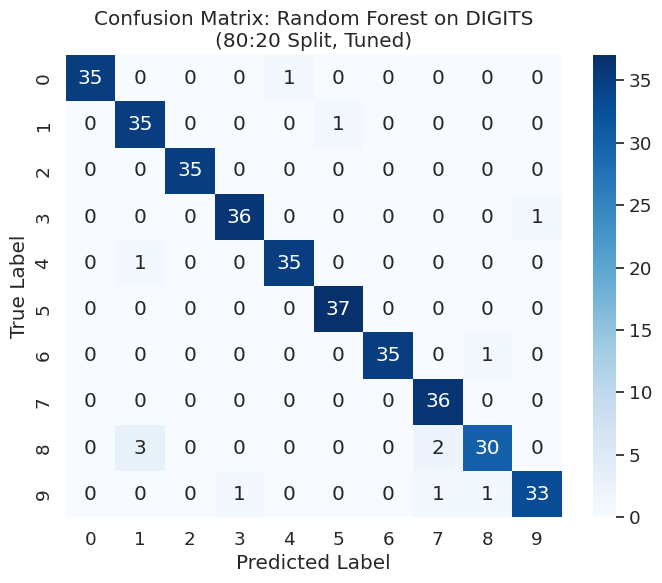

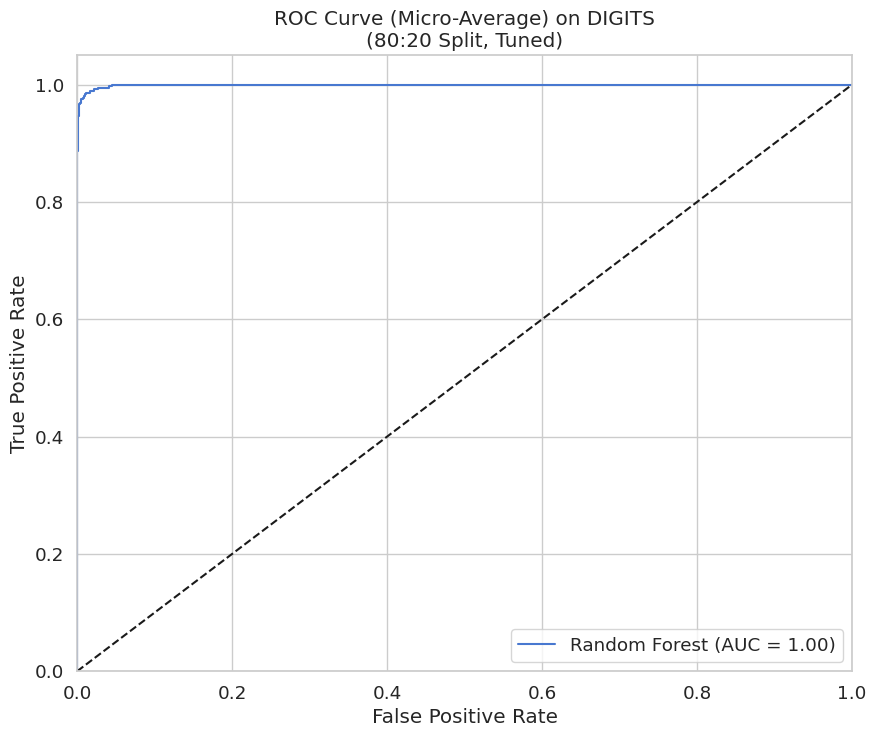


--- Starting for digits dataset with PCA ---
Original features: 64, PCA features: 39

running tuned model for 80:20 Split, PCA...
tuning Random Forest with PCA features...
best parameters for Random Forest on PCA data: {'max_depth': 20, 'n_estimators': 200}
--- Results for Random Forest on DIGITS (80:20 Split, PCA, Tuned) ---
Accuracy: 0.9477
Precision (Weighted): 0.9490
Recall (Weighted): 0.9477
F1-Score (Weighted): 0.9475



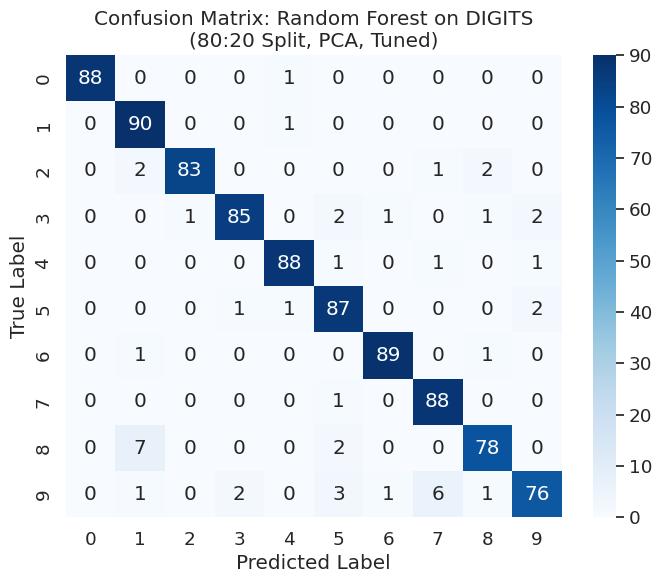

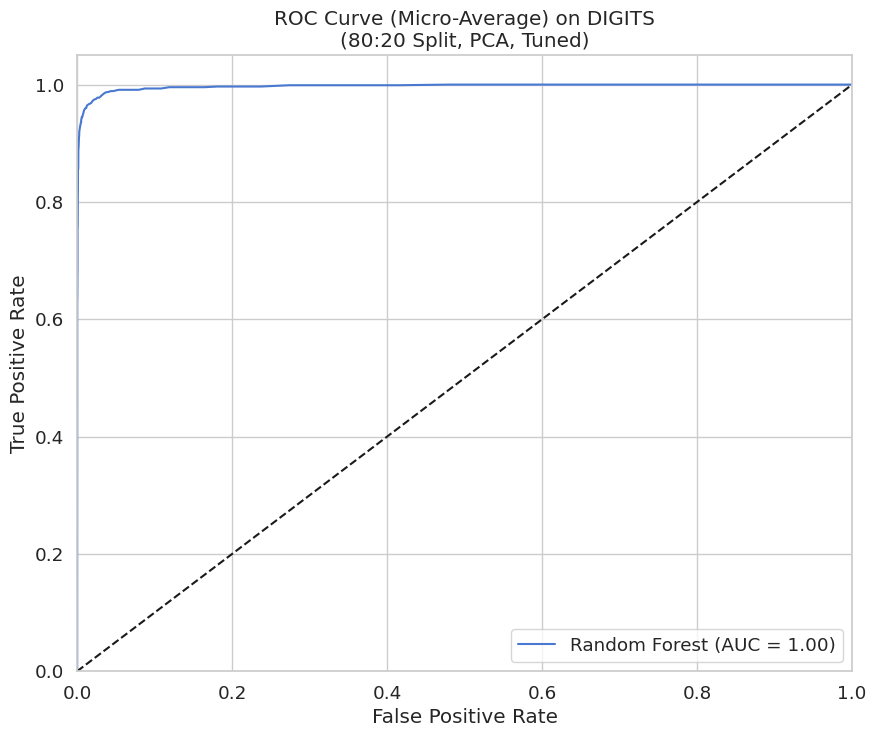

Original features: 64, PCA features: 39

running tuned model for 80:20 Split, PCA...
tuning Random Forest with PCA features...
best parameters for Random Forest on PCA data: {'max_depth': 10, 'n_estimators': 200}
--- Results for Random Forest on DIGITS (80:20 Split, PCA, Tuned) ---
Accuracy: 0.9527
Precision (Weighted): 0.9546
Recall (Weighted): 0.9527
F1-Score (Weighted): 0.9528



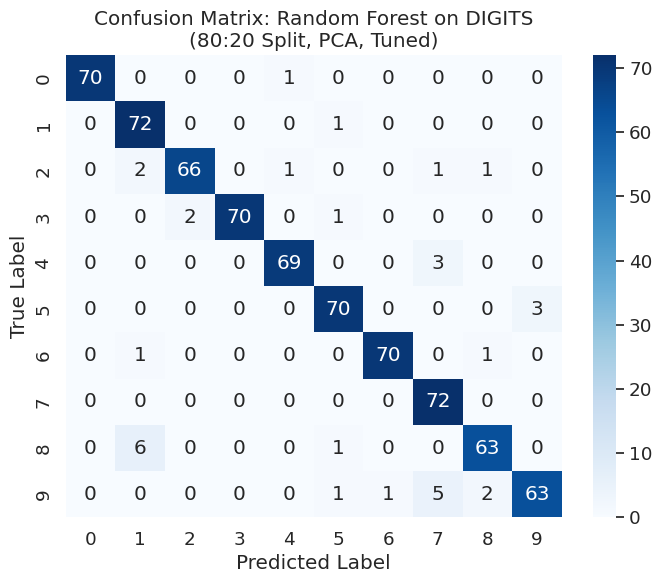

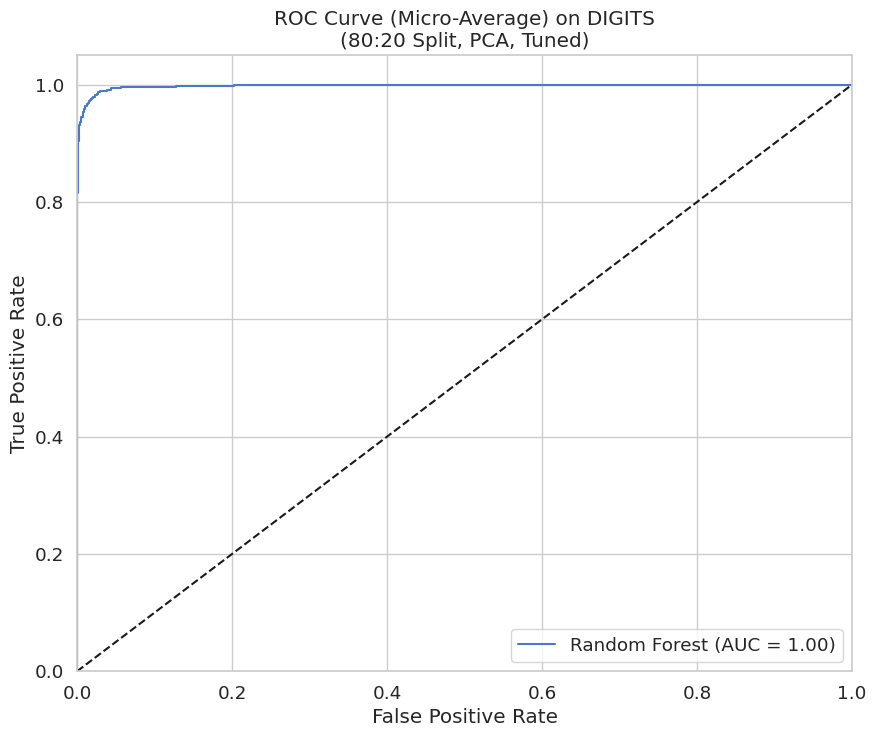

Original features: 64, PCA features: 39

running tuned model for 80:20 Split, PCA...
tuning Random Forest with PCA features...
best parameters for Random Forest on PCA data: {'max_depth': 20, 'n_estimators': 200}
--- Results for Random Forest on DIGITS (80:20 Split, PCA, Tuned) ---
Accuracy: 0.9574
Precision (Weighted): 0.9581
Recall (Weighted): 0.9574
F1-Score (Weighted): 0.9572



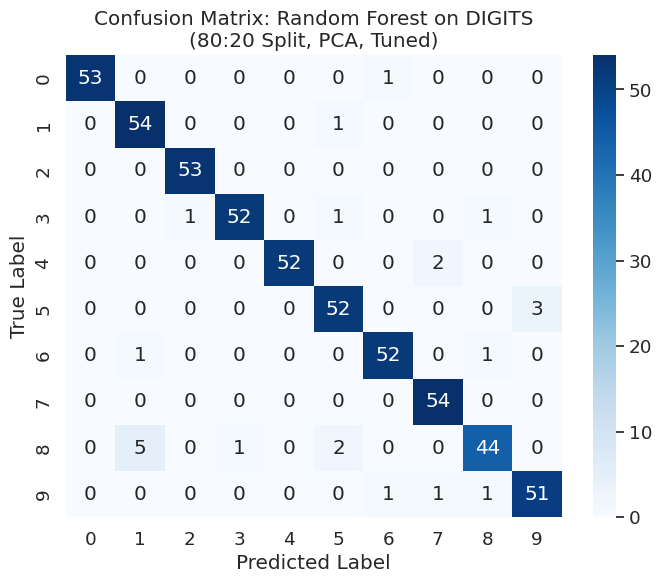

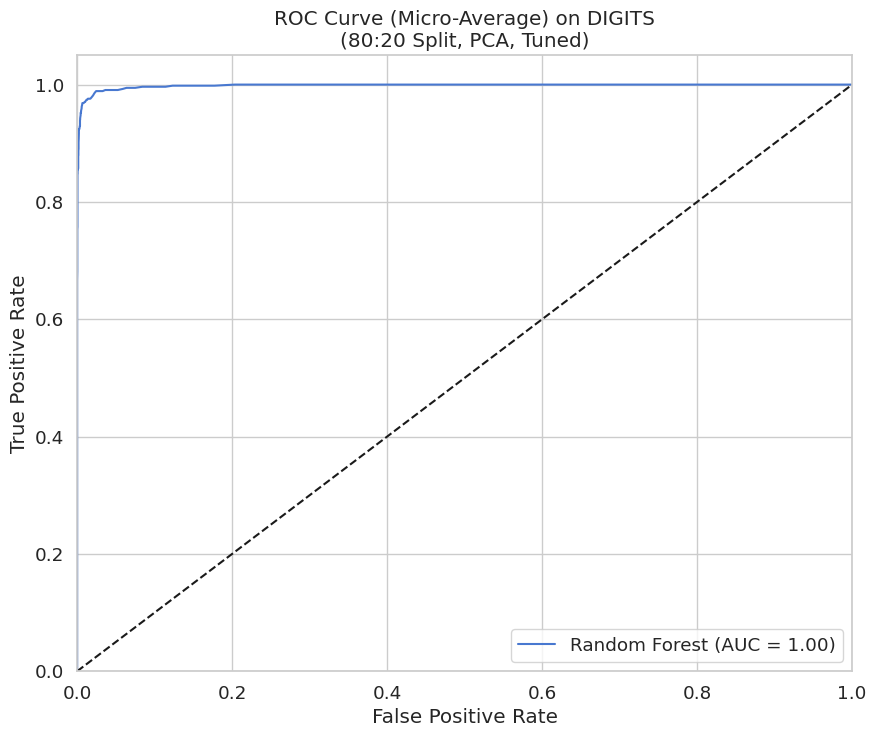

Original features: 64, PCA features: 40

running tuned model for 80:20 Split, PCA...
tuning Random Forest with PCA features...
best parameters for Random Forest on PCA data: {'max_depth': 20, 'n_estimators': 200}
--- Results for Random Forest on DIGITS (80:20 Split, PCA, Tuned) ---
Accuracy: 0.9583
Precision (Weighted): 0.9590
Recall (Weighted): 0.9583
F1-Score (Weighted): 0.9581



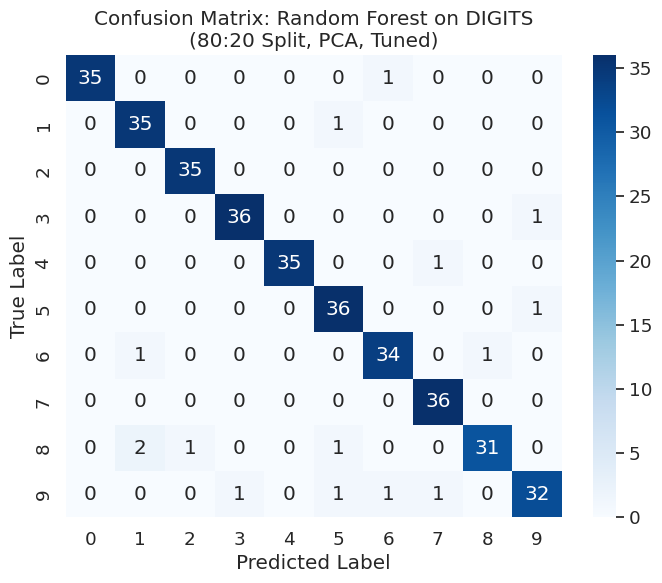

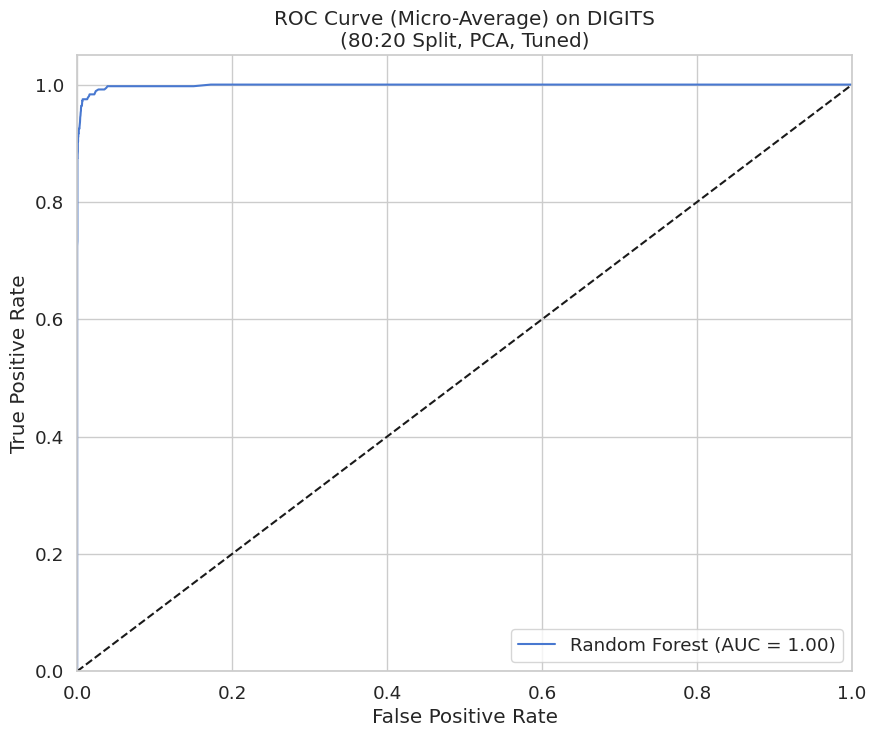

In [ ]:
def randomforest_complete(dataset, dataset_name):

    X, y = digits_dataset.data, digits_dataset.target
    results_list = []

    classifiers = {
         "Random Forest": RandomForestClassifier(random_state=42)

    }

    param_grids = {
         "Random Forest": {'n_estimators': [50, 100, 200], 'max_depth': [10, 20, None]}
    }

    print(f"Experiments for digits dataset on Original Features ---")
    for split in splits:
        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=split, random_state=42, stratify=y
        )

        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)

        split_note = f"{int(100-split*100)}:{int(split*100)} Split"

        # without tuning
        print(f"\n running not tuned models for {split_note}...")
        trained_models_default = {}
        for name, model in classifiers.items():
            model.fit(X_train_scaled, y_train)
            trained_models_default[name] = model
            evaluate_model(model, X_test_scaled, y_test, name, dataset_name, split, f"{split_note}, Default", results_list)
        plot_roc_curves(trained_models_default, X_test_scaled, y_test, dataset_name, f"{split_note}, Default")

        # with tuning
        print(f"\ntuned model for {split_note}...")
        trained_models_tuned = {}
        for name, model in classifiers.items():
            print(f"Tuning {name}...")
            grid_search = GridSearchCV(model, param_grids[name], cv=5, n_jobs=-1, scoring='accuracy')
            grid_search.fit(X_train_scaled, y_train)
            best_model = grid_search.best_estimator_
            trained_models_tuned[name] = best_model
            print(f"best parameters for {name}: {grid_search.best_params_}")
            evaluate_model(best_model, X_test_scaled, y_test, name, dataset_name, split, f"{split_note}, Tuned", results_list)
        plot_roc_curves(trained_models_tuned, X_test_scaled, y_test, dataset_name, f"{split_note}, Tuned")

    # WITH PCA
    print(f"\n--- Starting for digits dataset with PCA ---")


    for split in splits:
      X_train, X_test, y_train, y_test = train_test_split(
          X, y, test_size=split, random_state=42, stratify=y
      )

      scaler = StandardScaler()
      X_train_scaled = scaler.fit_transform(X_train)
      X_test_scaled = scaler.transform(X_test)

      # pca with 95% variance
      pca = PCA(n_components=0.95)
      X_train_pca = pca.fit_transform(X_train_scaled)
      X_test_pca = pca.transform(X_test_scaled)
      print(f"Original features: {X_train.shape[1]}, PCA features: {X_train_pca.shape[1]}")

      pca_note = f"80:20 Split, PCA"

      # Model with tuning on PCA
      print(f"\nrunning tuned model for {pca_note}...")
      trained_models_pca = {}
      for name, model in classifiers.items():
          print(f"tuning {name} with PCA features...")
          grid_search = GridSearchCV(model, param_grids[name], cv=5, n_jobs=-1, scoring='accuracy')
          grid_search.fit(X_train_pca, y_train)
          best_model = grid_search.best_estimator_
          trained_models_pca[name] = best_model
          print(f"best parameters for {name} on PCA data: {grid_search.best_params_}")
          evaluate_model(best_model, X_test_pca, y_test, name, dataset_name, split, f"{pca_note}, Tuned", results_list)
      plot_roc_curves(trained_models_pca, X_test_pca, y_test, dataset_name, f"{pca_note}, Tuned")

    return pd.DataFrame(results_list)
randomforest_df_2 = randomforest_complete(digits_dataset,"DIGITS")


 Results Summary for DIGITS


,Dataset,Model,Train-Test Split,Tuning,PCA,Accuracy,Precision,Recall,F1-Score,Inference Time (s)
0,DIGITS,Random Forest,50:50,Default,No,0.9577,0.9592,0.9577,0.9577,0.0305
1,DIGITS,Random Forest,50:50,Tuned,No,0.9588,0.9601,0.9588,0.9587,0.0468
2,DIGITS,Random Forest,60:40,Default,No,0.9666,0.9676,0.9666,0.9666,0.0272
3,DIGITS,Random Forest,60:40,Tuned,No,0.9652,0.9665,0.9652,0.9651,0.0506
4,DIGITS,Random Forest,70:30,Default,No,0.9685,0.9694,0.9685,0.9684,0.0219
5,DIGITS,Random Forest,70:30,Tuned,No,0.9630,0.9635,0.9630,0.9628,0.0294
6,DIGITS,Random Forest,80:20,Default,No,0.9639,0.9644,0.9639,0.9636,0.0152
7,DIGITS,Random Forest,80:20,Tuned,No,0.9639,0.9648,0.9639,0.9637,0.0259
8,DIGITS,Random Forest,50:50,Tuned,Yes,0.9477,0.9490,0.9477,0.9475,0.0378
9,DIGITS,Random Forest,60:40,Tuned,Yes,0.9527,0.9546,0.9527,0.9528,0.0358


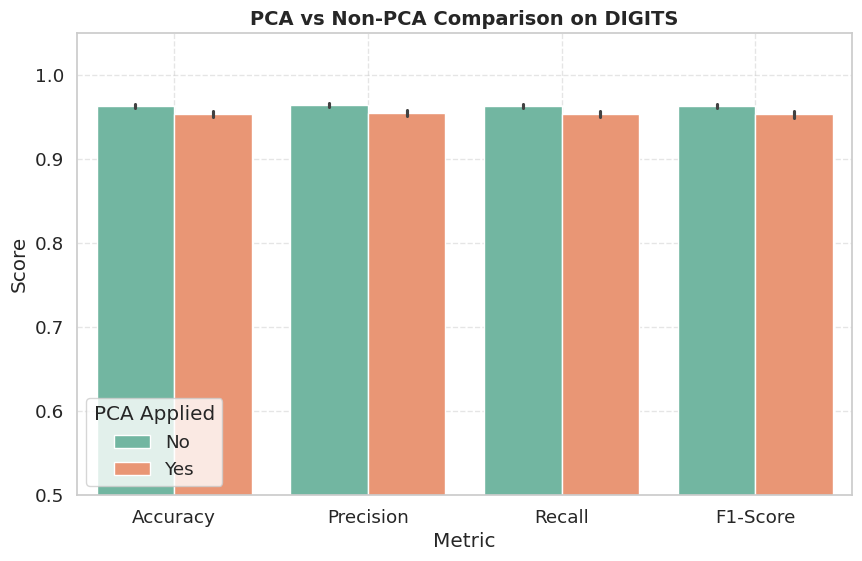

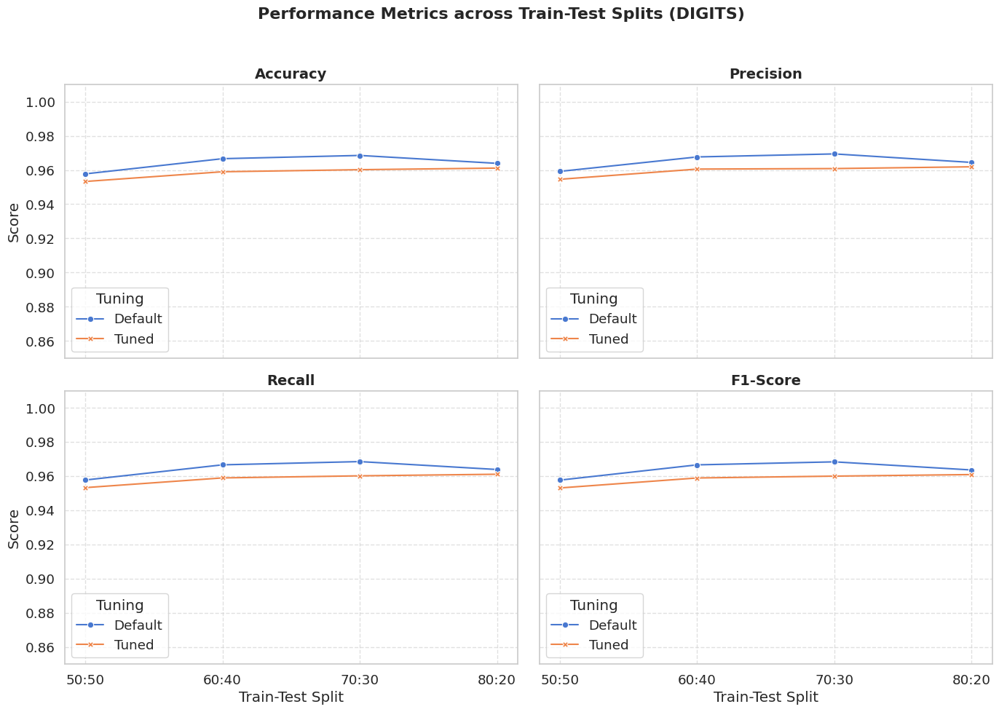

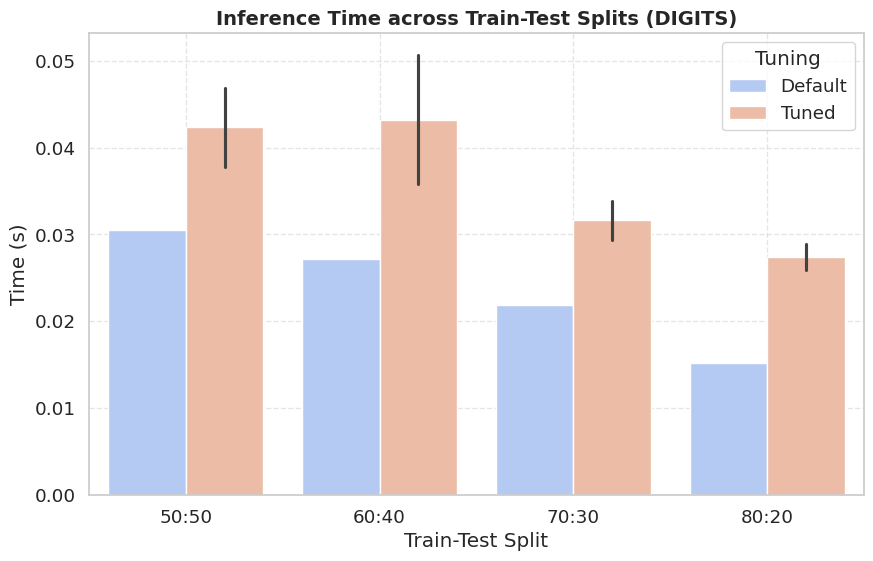

In [ ]:
analyze_results(randomforest_df_2,"DIGITS")

In [ ]:
df_list_2 = [svm_linear_df_2,svm_polynomial_df_2,svm_rbf_df_2,svm_sigmoid_df_2,randomforest_df_2,mlp_df_2]
result_df_2 = pd.concat(df_list_2)


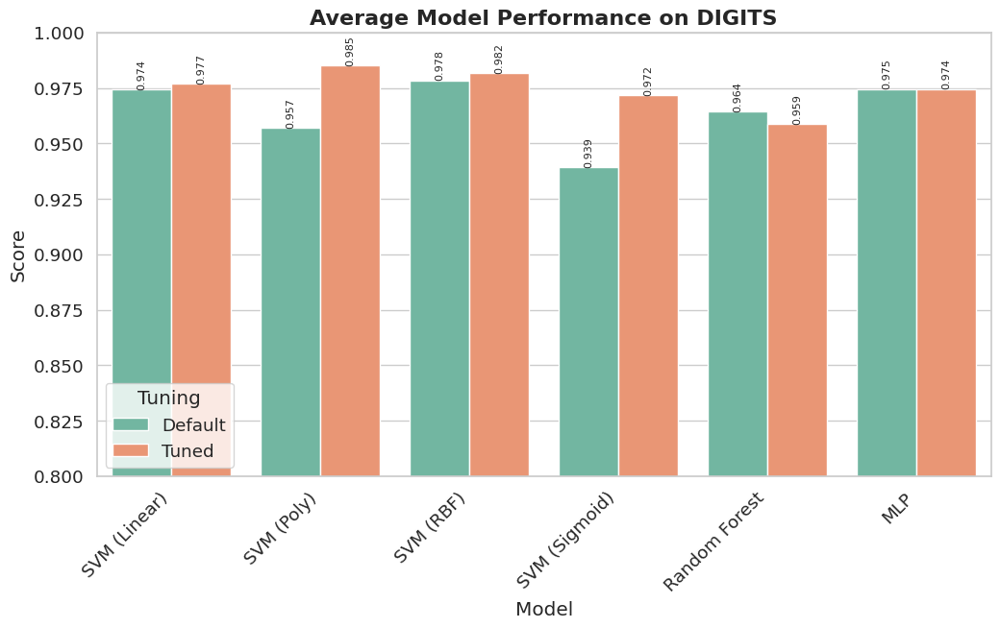

In [ ]:
def model_comparison_barplot(result_df, dataset_name="DIGITS"):
    metrics = ["Accuracy", "Precision", "Recall", "F1-Score"]

    df_melted = result_df_2.melt(
        id_vars=["Model", "Tuning"],
        value_vars=metrics,
        var_name="Metric",
        value_name="Score"
    )

    plt.figure(figsize=(12, 6))
    sns.barplot(
        data=df_melted,
        x="Model", y="Score", hue="Tuning",
        palette="Set2", ci=None
    )

    # Annotate values
    for p in plt.gca().patches:
        plt.gca().annotate(
            f"{p.get_height():.3f}",
            (p.get_x() + p.get_width() / 2., p.get_height()),
            ha='center', va='bottom', fontsize=8, rotation=90
        )

    plt.title(f"Average Model Performance on {dataset_name}", fontsize=16, fontweight="bold")
    plt.ylim(0.8, 1.0)
    plt.xticks(rotation=45, ha="right")
    plt.ylabel("Score")
    plt.show()
model_comparison_barplot(result_df_2,"DIGITS")

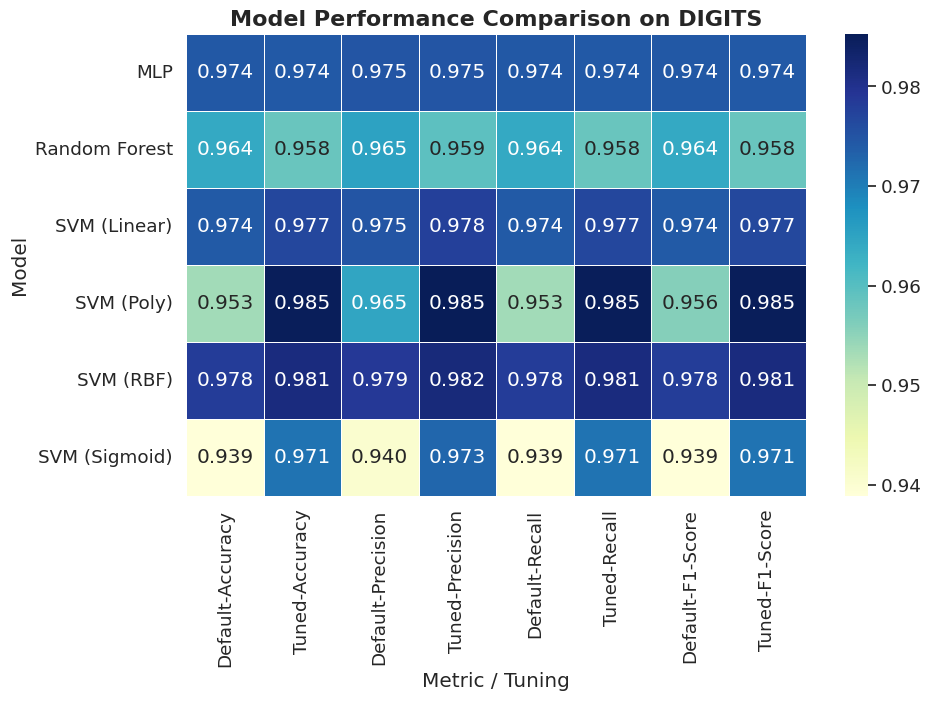

In [ ]:
model_comparison_heatmap(result_df_2,"DIGITS")